In [1]:
import matplotlib.pyplot as plt
import random
import numpy as np
import time
from copy import deepcopy
from sklearn.datasets import make_classification as ds
from sklearn.model_selection import train_test_split as split

In [6]:
class logRegGD:
    def __init__(self,error):
        self.weights_original = None
        self.xTrain = None
        self.yTrain = None
        self.xTest = None
        self.yTest = None
        self.weights = None
        
        self.initialTime = None
        self.error = error
        self.grad = None
        self.lamb = None
        self.gr_list = None
        self.norm = None
        self.theta = None
        
        self.vanPlt = None
        self.AdapPlt = None
        self.LSPlt = None
        self.BazPlt = None
        self.Max = 0
    #-------------------------------------------------------------------------------------
    
    def sigmoid(self, beta, X): return 1.0/(1 + np.exp(-np.dot(X, beta)))
    
    def normalise(self, X): 
        mins = np.min(X, axis = 0) 
        maxs = np.max(X, axis = 0) 
        rng = maxs - mins 
        norm_X = 1 - ((maxs - X)/rng) 
        return norm_X 
    
    def generate(self, samples, test_size):
        sample_data = ds(n_samples=samples)
        augmented_data = np.concatenate( (np.array([[1]*len(sample_data[0])]).T, self.normalise(sample_data[0])), axis =1)
        entire_set = list(sample_data)
        entire_set[0] = augmented_data
        self.xTrain, self.xTest, self.yTrain, self.yTest = split( entire_set[0], entire_set[1], test_size = test_size, random_state= 13)
        self.weights_original = np.random.rand(len(self.xTrain[0]),1)
    
    def cost_func(self, W):
        sig = self.sigmoid(W, self.xTrain)
        y = np.squeeze(self.yTrain)
        step1 = y * np.log(sig)
        step2 = (1 - y) * np.log(1 - sig) 
        final = -step1 - step2 
        return np.mean(final)
    
    def log_gradient(self, W):
        sig = self.sigmoid(W, self.xTrain)
        inner_expr = np.squeeze(sig) - np.squeeze(self.yTrain.reshape(self.xTrain.shape[0],-1))
        return np.dot(inner_expr.T, self.xTrain )
    
    def GD(self):
        self.weights = np.squeeze(self.weights) - self.lamb * self.log_gradient(self.weights)
    
    def calc_norm(self): 
        self.norm = np.linalg.norm(self.log_gradient(self.weights))
    
    #-------------------------------------------------------------------------------------------
    
    def Vanilla(self):
        self.initialTime = time.time()
        self.weights = deepcopy(self.weights_original)
        self.gr_list = []
        self.lamb = 1/np.max( np.linalg.svd( self.xTrain @ self.xTrain.T )[1] )
        count = 1
        self.calc_norm()
        while self.norm > self.error:
            self.GD()
            self.calc_norm()
            self.gr_list.append(self.norm)
            count += 1
            if time.time() - self.initialTime > 30:
                break
        print(' \n Vanilla Gradient Descent:')
        print('_____________________________________________')
        if len(self.gr_list) > self.Max:
            self.Max = deepcopy(len(self.gr_list))
        self.SetPlots(0, len(self.gr_list) , 'g', self.vanPlt, 'Vanilla')
        self.PrintResults()
    
    def Adaptive(self):
        self.initialTime = time.time()
        self.weights = deepcopy(self.weights_original)
        self.gr_list = []
        self.lamb = random.random()+1e-12
        self.theta = float(random.getrandbits(128))
        oldW = deepcopy(self.weights)
        self.GD()
        self.calc_norm()
        while self.norm > self.error:
            oldLam = deepcopy(self.lamb)
            min1 = np.sqrt(1 + self.theta)*self.lamb
            min2 = ( np.linalg.norm( self.weights - oldW ) ) \
            / ( 2 * np.linalg.norm( self.log_gradient(self.weights) - self.log_gradient(oldW)) )
            self.lamb = np.min([min1,min2])
            oldW = deepcopy(self.weights)
            self.GD()
            self.theta = self.lamb/oldLam
            self.calc_norm()
            self.gr_list.append(self.norm)
            if time.time() - self.initialTime > 30:
                break
        print('\n Adaptive Gradient Descent:')
        print('_____________________________________________')
        if len(self.gr_list) > self.Max:
            self.Max = deepcopy(len(self.gr_list))
        self.SetPlots(0, len(self.gr_list) , 'y', self.AdapPlt, 'Adaptive')
        self.PrintResults()
    
    def BackTrack(self):
        alpha = 1
        rho = random.random() + 1e-20
        c = random.random() + 1e-20
        self.grad = self.log_gradient(self.weights)
        This_search = time.time()
        while ( (self.cost_func(np.squeeze(self.weights) - alpha*self.grad) > \
                 self.cost_func(self.weights) - c*alpha*self.norm**2) \
               and ( np.linalg.norm(self.log_gradient( np.squeeze(G.weights) - alpha*self.grad ))**2 > \
                    self.norm**2 )):
            if time.time() - This_search > 20:
                break
            alpha = rho * alpha
        self.lamb = alpha
        
    def LineSearch(self):
        self.initialTime = time.time()
        self.weights = deepcopy(self.weights_original)
        self.gr_list = []
        self.calc_norm()
        self.BackTrack()
        while self.norm > self.error:
            self.GD()
            self.calc_norm()
            self.gr_list.append(self.norm)
            self.BackTrack()
            if time.time() - self.initialTime > 30:
                break
        print('\n Line Search Gradient Descent:')
        print('_____________________________________________')
        if len(self.gr_list) > self.Max:
            self.Max = deepcopy(len(self.gr_list))
        self.SetPlots(0, len(self.gr_list) , 'b', self.LSPlt, 'LineSearch')
        self.PrintResults()
        
    def Barzilai(self):
        self.initialTime = time.time()
        self.weights = deepcopy(self.weights_original)
        self.gr_list = []
        self.lamb = random.random()+1e-12
        oldW = deepcopy(self.weights)
        self.GD()
        self.calc_norm()
        while self.norm > self.error:
            oldLam = deepcopy(self.lamb)
            self.lamb = np.dot( np.squeeze(self.weights - oldW), \
                               self.log_gradient(self.weights) - self.log_gradient(oldW) ) \
                        / np.linalg.norm( self.log_gradient(self.weights) - self.log_gradient(oldW) )**2
            oldX = deepcopy(self.weights)
            self.GD()
            self.calc_norm()
            self.gr_list.append( self.norm)
            if time.time() - self.initialTime > 30:
                break
        print('\n Barzilai-Borwein Gradient Descent:')
        print('_____________________________________________')
        if len(self.gr_list) > self.Max:
            self.Max = deepcopy(len(self.gr_list))
        self.SetPlots(0, len(self.gr_list) , 'r', self.BazPlt, 'Barzilai')
        self.PrintResults()
    
    
    def SetPlots(self, Min, Max, colour, name, label):
        name = plt.plot( range( Min, Max ) , self.gr_list[Min:Max] , c = colour , label = label)
    def PrintPlots(self):
        self.vanPlt
        self.AdapPlt
        self.LSPlt
        self.BazPlt
        plt.yscale('log')
        plt.xlabel('Iteration')
        plt.legend(loc='best')
        plt.title(label = 'Norm of Gradient') # in domain [{}, {}]'.format(0, 600 ) )
        plt.show()
    def PrintResults(self):
        print('At final iteration k =', len(self.gr_list), ':')
        print('weights vector is:', self.weights)
        print('Gradient Norm is:', self.norm)
        print('Time taken:', time.time() - self.initialTime)
        print('Final Lambda value: ', self.lamb)

 
 Vanilla Gradient Descent:
_____________________________________________
At final iteration k = 82003 :
weights vector is: [-7.14911704 -0.32017339 -0.62280658  0.18559916  0.77614221 -0.88760936
 -0.0386108   0.52112692  0.25254048 19.76087135 -2.27671637 -1.36455853
 -0.14729411 -1.52487444  1.17499095  0.30585851 -0.0961273   0.16779133
 -0.4185783   0.10745856 -1.52187802]
Gradient Norm is: 0.00847344598160825
Time taken: 30.040151357650757
Final Lambda value:  0.00019180578017997647


<ipython-input-6-75ec8039b991>:25: RuntimeWarning: overflow encountered in exp
  def sigmoid(self, beta, X): return 1.0/(1 + np.exp(-np.dot(X, beta)))



 Adaptive Gradient Descent:
_____________________________________________
At final iteration k = 3991 :
weights vector is: [-7.16442391 -0.31817262 -0.62148389  0.18754425  0.78119937 -0.88562089
 -0.03705493  0.52263167  0.24619423 19.77685241 -2.28188353 -1.36422235
 -0.14620477 -1.52505582  1.1771712   0.30919809 -0.09492954  0.16995646
 -0.42205329  0.10966739 -1.51958496]
Gradient Norm is: 0.0009999217099048142
Time taken: 3.0290889739990234
Final Lambda value:  0.008106570256784231


<ipython-input-6-75ec8039b991>:45: RuntimeWarning: divide by zero encountered in log
  step1 = y * np.log(sig)
<ipython-input-6-75ec8039b991>:45: RuntimeWarning: invalid value encountered in multiply
  step1 = y * np.log(sig)
<ipython-input-6-75ec8039b991>:46: RuntimeWarning: divide by zero encountered in log
  step2 = (1 - y) * np.log(1 - sig)
<ipython-input-6-75ec8039b991>:46: RuntimeWarning: invalid value encountered in multiply
  step2 = (1 - y) * np.log(1 - sig)



 Line Search Gradient Descent:
_____________________________________________
At final iteration k = 25985 :
weights vector is: [-1774.31631406   -84.66172328  -171.74959658    44.21244072
   181.52243519  -233.28007056   -11.84899041   108.09798126
  -128.86399766  5143.76447343  -637.38657651  -373.49186846
   -56.54314033  -362.55541868   275.77085549   104.56072685
   -31.21524862    27.83724567  -185.08445016    56.23662088
  -428.70933084]
Gradient Norm is: 99.11941246826254
Time taken: 30.00789785385132
Final Lambda value:  1

 Barzilai-Borwein Gradient Descent:
_____________________________________________
At final iteration k = 10638 :
weights vector is: [-11.72051761  -0.31815131  -0.62135424   0.18756935   0.78132076
  -0.88556788  -0.03695168   0.52261526   5.03345052  18.69040748
  -0.34017305  -1.36416364  -0.14619372  -1.52497675   1.17714787
   0.3091791   -0.09491766   0.16994599   3.02337676   0.10964995
  -1.51954603]
Gradient Norm is: 0.0009998003517320967
Time take

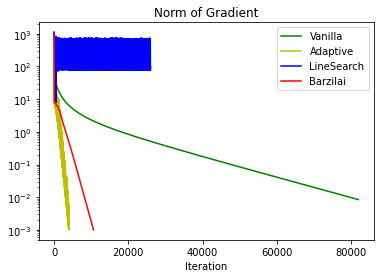

In [8]:
G = logRegGD(1e-3)
G.generate(1000,0.1)
G.Vanilla()
G.Adaptive()
G.LineSearch()
G.Barzilai()
G.PrintPlots()

In [2]:
# Adapted from https://www.geeksforgeeks.org/understanding-logistic-regression/ 
def sigmoid(beta, X): return 1.0/(1 + np.exp(-np.dot(X, beta))) 

def normalise(X): 
    mins = np.min(X, axis = 0) 
    maxs = np.max(X, axis = 0) 
    rng = maxs - mins 
    norm_X = 1 - ((maxs - X)/rng) 
    return norm_X 

sample_data = ds(n_samples=1000)
augmented_data = np.concatenate((np.array([[1]*len(sample_data[0])]).T,normalise(sample_data[0])), axis =1)
entire_set = list(sample_data)
entire_set[0] = augmented_data
xTrain, xTest, yTrain, yTest = split(entire_set[0], entire_set[1], test_size = 0.1, random_state= 13)
weights = np.random.rand(len(xTrain[0]),1)

def cost_func(w, X, y): 
    sig = sigmoid(w, X) 
    y = np.squeeze(y) 
    step1 = y * np.log(sig) 
    step2 = (1 - y) * np.log(1 - sig) 
    final = -step1 - step2 
    return np.mean(final)

def log_gradient(w, X, y):
    sig = sigmoid(w, X)
    inner_expr = np.squeeze(sig) - np.squeeze(y.reshape(X.shape[0],-1))
    return np.dot(inner_expr.T, X)

def GD(w, x, y, lamb, gradient_function):
    w1 = np.squeeze(w) - lamb*gradient_function(w, x, y)  # we need to add the new params
    return w1


In [3]:
noone = GD(weights, xTrain, yTrain, 0.1, log_gradient)
noone

array([-43.4118077 , -18.68487021, -21.50288942, -20.57125554,
       -22.47285896, -20.93897992, -21.97040202, -22.34119599,
       -23.44190124, -22.45498667, -17.15594333, -18.63880162,
       -24.43048225, -21.10652817, -18.68779558, -19.90431144,
       -24.21204736, -20.6021415 , -20.67899163, -22.59206121,
       -22.21389498])

In [4]:
second = GD(noone, xTrain, yTrain, 0.1, log_gradient)
second

array([ 2.2881923 ,  1.20772417,  1.30034499,  1.82506911,  1.77018625,
        2.07137946,  1.76841684,  1.09367157,  2.02373099,  1.43028734,
        1.73064508, 12.30975284,  0.83511819,  1.25224851, 12.86496868,
        0.27745653,  2.38132075,  2.08980453,  0.8041603 ,  1.7553959 ,
        1.50146924])

In [5]:
third = GD(second, xTrain, yTrain, 0.1, log_gradient)
third

array([-42.01180769, -18.54986002, -20.83626042, -19.65579565,
       -22.14206666, -20.264785  , -21.45424906, -21.84164581,
       -22.70834961, -21.70677402, -16.25935137,  -7.20699757,
       -24.98336146, -20.35361821,  -6.8031291 , -20.14264989,
       -22.89067465, -18.99165501, -20.29520824, -21.49392275,
       -21.29911875])

In [3]:
LAMB = 1/np.max( np.linalg.svd( xTrain @ xTrain.T )[1] )

In [4]:
LAMB

0.00017462171255571327

## Vanilla

Maybe this boy is too big for this precision...on vanilla maybe.  Could AGD prove the candidate here?

In [25]:
current = time.time()
LAMB = 1/np.max( np.linalg.svd( xTrain @ xTrain.T )[1] )
w_list = []
gr = []
count = 1
x = xTrain
y = yTrain
w = weights
while np.linalg.norm(log_gradient(w, x, y)) > 1e-6:
    w1 = GD(w, x , y , LAMB, log_gradient)
    w = w1
    w_list.append(cost_func(w,x,y))
    gr.append(np.linalg.norm(log_gradient(w, x, y)))
    count += 1
    print('norm: ', np.linalg.norm(log_gradient(w, x, y)))
    print('weights: ', log_gradient(w, x, y))
    
print('----------------------')
plt.plot(range(len(gr)), gr, c='g')
plt.title(label = 'Norm of Gradient')
plt.yscale('log')
plt.xlabel('Iteration')
plt.legend(loc='best')
plt.show()
print('Weights:', w)
print('Gradient:', log_gradient(w, x, y) )
print('Iterations:', count)
print('Time taken:', time.time() - current)
print('Lambda: ', lamb)

norm:  1054.3132998313197
weights:  [429.51083054 191.84539598 214.66843981 208.34218327 232.1942116
 216.861632   225.41275805 222.4427599  240.62577604 224.38622882
 174.55852797 187.98347307 251.2871045  209.46595031 189.34134112
 198.11954487 245.13630092 204.34701069 204.62719848 225.41780585
 221.02584314]
norm:  1035.8958986933242
weights:  [421.9793656  188.62437425 210.90897639 204.71344294 228.30384464
 213.21106772 221.58841591 218.55963644 236.81580087 220.46366628
 171.5554733  183.92643652 247.37162354 205.77218712 185.20056683
 194.70580706 240.87529735 200.70659322 201.05341978 221.44352927
 217.11424982]
norm:  1008.0776727627477
weights:  [410.63039317 183.75742407 205.23307053 199.23502988 222.42686913
 207.69571933 215.81256853 212.69567756 231.02806881 214.54092129
 167.01746598 177.78574193 241.42955395 200.19941457 178.93582851
 189.55244459 234.43876838 195.20506547 195.65821393 215.44234564
 211.21284077]
norm:  967.3165320048525
weights:  [394.04037326 176.622

weights:  [  7.1230884    6.67271635   2.13445228   2.72525529   8.49351374
   6.56712216   6.53705696   2.80128913  10.55493324   2.55591106
   2.32509566 -41.45606489  15.99544427   1.57468534 -43.72573569
   5.18152091   2.35442914  -1.90612313   2.54697791   0.76127279
   1.33903127]
norm:  65.67064306434627
weights:  [  7.11618803   6.65824114   2.12817179   2.7246818    8.482205
   6.55633713   6.52913089   2.79216012  10.52687424   2.55126355
   2.31770202 -41.37285957  15.9573562    1.56897982 -43.63731377
   5.16761442   2.34954441  -1.90092833   2.53483134   0.75678008
   1.33769255]
norm:  65.5373396077778
weights:  [  7.10930833   6.64379751   2.12191599   2.72410743   8.47091206
   6.54556835   6.52121609   2.78306066  10.4988707    2.54663378
   2.31032974 -41.2898598   15.91934912   1.56329694 -43.54910923
   5.1537551    2.34467275  -1.89574081   2.52273021   0.75230897
   1.33636302]
norm:  65.40436440484407
weights:  [  7.10244892   6.62938532   2.11568462   2.7235320

norm:  56.78494353765729
weights:  [  6.66107046   5.68499519   1.7294176    2.67908225   7.70038233
   5.81481058   5.98154062   2.1981035    8.63351168   2.25367883
   1.83348557 -35.84234102  13.39851159   1.20580336 -37.75798825
   4.27153738   2.02584403  -1.54555299   1.76218932   0.47985182
   1.26024472]
norm:  56.674754804756425
weights:  [  6.65544021   5.67278392   1.72469507   2.67840758   7.69029442
   5.80531065   5.97448259   2.19087445   8.60974721   2.2501083
   1.82758712 -35.77376232  13.36650445   1.20147288 -37.68506395
   4.26078403   2.02184319  -1.54104104   1.7530548    0.47667728
   1.25941841]
norm:  56.56486472031556
weights:  [  6.6498248    5.66060208   1.71999054   2.67773167   7.68022369
   5.79582898   5.96743684   2.1836679    8.58604171   2.24654985
   1.82170763 -35.7053689   13.33457867   1.19715775 -37.61233631
   4.25006873   2.01785355  -1.53653918   1.74395635   0.47351748
   1.25859738]
norm:  56.45527267370787
weights:  [  6.6442242    5.64844

weights:  [  6.27648951   4.84738617   1.4202856    2.62537014   6.99125534
   5.15275377   5.48603893   1.71338401   7.01125746   2.01578496
   1.44056655 -31.18444641  11.21643772   0.91893167 -32.80442019
   3.56219174   1.75512544  -1.23526712   1.16875929   0.27803915
   1.21048389]
norm:  49.21569045934887
weights:  [  6.27183148   4.83723664   1.41671635   2.62461615   6.9824407
   5.14460533   5.47988759   1.70764215   6.99174847   2.0129756
   1.43595842 -31.12857265  11.19021059   0.91556674 -32.74499732
   3.55394823   1.75189195  -1.2315111    1.16198691   0.27578515
   1.20995616]
norm:  49.12630260503448
weights:  [  6.26718465   4.82711239   1.41316001   2.6238613    6.9736425
   5.13647427   5.47374791   1.7019176    6.97229293   2.01017463
   1.43136561 -31.07285144  11.1640551    0.91221248 -32.68573675
   3.54573366   1.74866764  -1.22776487   1.15524154   0.27354117
   1.20943123]
norm:  49.03716164482317
weights:  [  6.26254898   4.81701338   1.40961654   2.6231055

norm:  43.149948183287115
weights:  [  5.95168606   4.14380056   1.18206103   2.56592243   6.36656491
   4.58099948   5.0504159    1.32235754   5.67295518   1.823659
   1.1305262  -27.34229261   9.41564871   0.69045071 -28.71854816
   3.01064634   1.53362968  -0.9766593    0.72368869   0.13197239
   1.176742  ]
norm:  43.077171954163695
weights:  [  5.94777219   4.13539923   1.17932461   2.56511557   6.35893121
   4.57408855   5.04509494   1.31777352   5.65718189   1.82138815
   1.12694303 -27.29678823   9.39438949   0.68777312 -28.67016432
   3.00430402   1.53101692  -0.97360251   0.7186776    0.13034977
   1.17636414]
norm:  43.00459216513493
weights:  [  5.94386682   4.12701859   1.17659736   2.56430817   6.35131201
   4.56719267   5.03978409   1.3132028    5.64145317   1.81912322
   1.12337156 -27.25140449   9.37318914   0.68510313 -28.62190901
   2.99798303   1.52841133  -0.97055422   0.71368608   0.12873393
   1.17598754]
norm:  42.932208191775025
weights:  [  5.93996992   4.1186

norm:  38.376562102808826
weights:  [  5.68995787   3.58844909   1.00622073   2.50668753   5.85231162
   4.11990202   4.69186984   1.02372402   4.64414222   1.67388605
   0.90000947 -24.35239051   8.02573472   0.51533367 -25.54009094
   2.60368141   1.36245685  -0.77712852   0.40826501   0.03061577
   1.15197893]
norm:  38.31642932169589
weights:  [  5.68658692   3.58139611   1.00405066   2.50585154   5.8456492
   4.11398979   4.6872218    1.01998978   4.6312777    1.67198321
   0.89716625 -24.31464784   8.00830211   0.51313043 -25.49997827
   2.59867253   1.36030221  -0.77463356   0.40446843   0.02940435
   1.15166007]
norm:  38.256452160328806
weights:  [  5.68322263   3.57435994   1.00188727   2.50501526   5.83899922
   4.10809023   4.68258233   1.01626595   4.61844944   1.67008475
   0.89433195 -24.27700067   7.99091704   0.51093287 -25.45996742
   2.59367956   1.35815316  -0.77214569   0.40068622   0.02819767
   1.15134167]
norm:  38.196630111991084
weights:  [  5.67986496   3.567

norm:  34.067870589139616
weights:  [  5.44256798   3.07938388   0.85328176   2.43998033   5.36216322
   3.6894058    4.34946552   0.7582031    3.73133783   1.53582805
   0.70039796 -21.64193759   6.7840657    0.35719847 -22.66034172
   2.25229851   1.20804152  -0.60038759   0.14809485  -0.05206376
   1.12765855]
norm:  34.01859617099539
weights:  [  5.43966255   3.07351837   0.85156085   2.43912996   5.3564006
   3.68439975   4.34543274   0.75519306   3.72102291   1.53422481
   0.69816509 -21.61086195   6.76996956   0.35538449 -22.62733729
   2.24836865   1.20627428  -0.59839574   0.14526327  -0.05296065
   1.12735621]
norm:  33.96944217028992
weights:  [  5.43676232   3.0676662    0.84984474   2.4382795    5.35064833
   3.67940402   4.341407     0.75219104   3.71073645   1.53262484
   0.69593884 -21.57986029   6.75591061   0.35357477 -22.59441175
   2.24445039   1.20451131  -0.59640955   0.14244196  -0.05385425
   1.12705388]
norm:  33.92040820054524
weights:  [  5.43386726   3.06182

norm:  30.931328282706144
weights:  [  5.25351247   2.70402819   0.74484049   2.38120046   4.98758887
   3.36680109   4.08682456   0.56804786   3.08198396   1.43230715
   0.5606483  -19.65963926   5.89291587   0.24130013 -20.55570143
   2.00615214   1.09539389  -0.47541847  -0.02526619  -0.10691856
   1.10668695]
norm:  30.88952446773715
weights:  [  5.25093191   2.69899824   0.74340921   2.38034846   4.98248573
   3.36244586   4.08323818   0.56553524   3.07343949   1.43090495
   0.55881921 -19.63315764   5.88113239   0.23974854 -20.52759589
   2.00292645   1.09388973  -0.47378117  -0.02747969  -0.10761857
   1.10637948]
norm:  30.847817412991525
weights:  [  5.2483556    2.69397923   0.74198157   2.3794965    4.97739137
   3.3580992    4.07965773   0.56302906   3.06491799   1.42950534
   0.55699524 -19.60673559   5.8693789    0.23820035 -20.49955387
   1.99970966   1.09238895  -0.47214849  -0.02968544  -0.10831614
   1.10607186]
norm:  30.806206817211702
weights:  [  5.24578354   2.68

   1.08411329]
norm:  28.116330912562546
weights:  [  5.07561579   2.36375244   0.64914397   2.3191847    4.63689481
   3.07008378   3.83971049   0.40039186   2.51443234   1.33627859
   0.43954113 -17.87230475   5.10614304   0.13631354 -18.65949377
   1.79214771   0.99385402  -0.36724281  -0.16828757  -0.15216709
   1.08379285]
norm:  28.080862734370747
weights:  [  5.07331711   2.35944512   0.6479461    2.31833885   4.63238101
   3.0662994    3.83652026   0.39830133   2.50739185   1.33504592
   0.43804252 -17.84972839   5.09632501   0.13498364 -18.63555245
   1.78949261   0.99257075  -0.3659096   -0.17000922  -0.15271223
   1.08347222]
norm:  28.045471962813178
weights:  [  5.07102192   2.35514671   0.64675101   2.31749312   4.62787461
   3.06252211   3.83333498   0.39621596   2.50036972   1.33381532
   0.43654787 -17.82719982   5.086531     0.13365647 -18.61166208
   1.78684433   0.99129018  -0.36458012  -0.17172505  -0.15325554
   1.08315138]
norm:  28.01015836667916
weights:  [  5.

norm:  25.50572620792602
weights:  [  4.9020686    2.0454622    0.56135658   2.25199993   4.29779703
   2.78831263   3.59921857   0.24827616   2.00490033   1.24376278
   0.33113759 -16.20638844   4.39100418   0.03790061 -16.89365073
   1.5994159    0.89904827  -0.27150814  -0.28933363  -0.19054512
   1.05749448]
norm:  25.475783417865003
weights:  [  4.90002335   2.04179738   0.56035326   2.25116724   4.29382357
   2.78504174   3.59638969   0.24655413   1.99916665   1.24267892
   0.32991712 -16.18722874   4.38289761   0.03676543 -16.87335183
   1.59723659   0.89795613  -0.27044091  -0.29065314  -0.19096415
   1.05715751]
norm:  25.445901917833837
weights:  [  4.89798097   2.03813976   0.55935205   2.25033475   4.28985625
   2.78177664   3.59356492   0.24483619   1.99344741   1.24159672
   0.32869968 -16.16810701   4.37480998   0.03563242 -16.85309339
   1.59506244   0.8968661   -0.26937662  -0.29196835  -0.19138184
   1.05682035]
norm:  25.416081533863256
weights:  [  4.89594144   2.03

   1.03099546]
norm:  23.34182682231814
weights:  [  4.75064634   1.77987793   0.48894736   2.18768896   4.00532717
   2.54951644   3.39021108   0.12541189   1.59799977   1.16390195
   0.24433702 -14.8183973    3.81165767  -0.04451953 -15.42380332
   1.44368419   0.81976868  -0.19649847  -0.38041607  -0.21951276
   1.03064438]
norm:  23.316185263034946
weights:  [  4.74880544   1.77672255   0.48808986   2.18687343   4.00179438
   2.54665658   3.38767601   0.1239769    1.59327501   1.16293572
   0.24332588 -14.80190729   3.80487714  -0.04550079 -15.40634949
   1.44185978   0.81882448  -0.19563732  -0.38144179  -0.21983949
   1.03029313]
norm:  23.29059308114185
weights:  [  4.74696693   1.77357307   0.487234     2.18605813   3.99826677
   2.54380149   3.38514438   0.12254521   1.58856178   1.16197086
   0.2423171  -14.78544799   3.79811178  -0.04648026 -15.38892839
   1.44003937   0.81788197  -0.19477853  -0.38246424  -0.22016519
   1.02994172]
norm:  23.265050143598792
weights:  [  4.7

   1.00460242]
norm:  21.569584207201782
weights:  [  4.6205495    1.56141732   0.42963469   2.12801357   3.75718321
   2.35009739   3.21146035   0.02757821   1.27747353   1.09588253
   0.17545636 -13.67611946   3.34829231  -0.11257761 -14.21529705
   1.31868538   0.75419273  -0.13872301  -0.44817558  -0.24111991
   1.00424052]
norm:  21.547264377901456
weights:  [  4.61887212   1.55866178   0.42888663   2.12721682   3.75400493
   2.34756257   3.20916132   0.02636482   1.27351923   1.09500896
   0.17460218 -13.66169921   3.34252889  -0.11343763 -14.20004803
   1.3171249    0.75336241  -0.13801934  -0.44898722  -0.24137898
   1.0038785 ]
norm:  21.52498518591038
weights:  [  4.61719677   1.55591118   0.4281399    2.12642034   3.75083107
   2.34503178   3.20686523   0.02515413   1.26957429   1.09413654
   0.17374989 -13.64730434   3.33677788  -0.11429616 -14.18482603
   1.3155676    0.75253348  -0.13731758  -0.44979632  -0.24163724
   1.00351636]
norm:  21.502746527071448
weights:  [  4.

weights:  [  4.51247421   1.3871625    0.38227033   2.07523063   3.553595
   2.1887359    3.06365509  -0.04804816   1.03206659   1.03976949
   0.12216364 -12.76316089   2.98803228  -0.16703752 -13.25025932
   1.22071191   0.70147532  -0.09556485  -0.4973071   -0.25680779
   0.97973479]
norm:  20.13944930091964
weights:  [  4.51092447   1.38471303   0.38160324   2.07445219   3.55069387
   2.18645143   3.0615406   -0.04909451   1.02868654   1.03896736
   0.12142505 -12.75030903   2.98303064  -0.16780407 -13.23668025
   1.21934433   0.70073085  -0.09497838  -0.49796531  -0.25701798
   0.9793656 ]
norm:  20.11967143697596
weights:  [  4.5093765    1.38226777   0.38093725   2.07367404   3.54779659
   2.18417042   3.05942869  -0.05013857   1.02531429   1.03816621
   0.12068803 -12.7374787    2.9780394   -0.16856932 -13.22312408
   1.21797936   0.69998756  -0.0943935   -0.49862147  -0.25722752
   0.97899632]
norm:  20.099927835269366
weights:  [  4.50783031   1.37982673   0.38027236   2.07289

norm:  18.676296466310117
weights:  [  4.39383598   1.20379157   0.33215531   2.01385042   3.33309807
   2.01632327   2.90222149  -0.12497394   0.78473559   0.97856045
   0.06768914 -11.79902368   2.61865154  -0.22448544 -12.23206119
   1.11895549   0.64540977  -0.05334369  -0.54398333  -0.2717032
   0.94996096]
norm:  18.658986091672695
weights:  [  4.39241804   1.20165149   0.3315678    2.01309474   3.33048294
   2.01429334   2.90029763  -0.12585405   0.78191978   0.97783126
   0.06706323 -11.78774282   2.61440268  -0.22515652 -12.22015399
   1.11777453   0.64475095  -0.05287197  -0.54449619  -0.27186665
   0.94958628]
norm:  18.64170408468226
weights:  [  4.39100162   1.19951494   0.33098119   2.01233936   3.32787111
   2.01226633   2.89837597  -0.12673229   0.77911031   0.97710292
   0.06643859 -11.77647982   2.61016231  -0.22582651 -12.20826577
   1.11659566   0.6440931   -0.05240155  -0.54500745  -0.27202958
   0.94921154]
norm:  18.62445037938587
weights:  [  4.38958672   1.1973

weights:  [  4.29284791   1.05449593   0.29096712   1.95871155   3.1481103
   1.87360778   2.76555161  -0.18529719   0.5924876    0.92676249
   0.02457954 -11.00996589   2.32586331  -0.2713171  -11.39956593
   1.03684155   0.59914323  -0.0217005   -0.57790492  -0.28249059
   0.92213066]
norm:  17.4525119460042
weights:  [  4.2915355    1.05259795   0.29044048   1.9579773    3.14572362
   1.87177819   2.76378032  -0.18604939   0.5901       0.92609113
   0.02403881 -10.99990398   2.32218953  -0.27191253 -11.38895519
   1.03580054   0.59855066  -0.02131538  -0.5783113   -0.28261943
   0.92175354]
norm:  17.437158564415242
weights:  [  4.29022443   1.05070299   0.28991459   1.95724334   3.14333982
   1.86995111   2.76201095  -0.1868       0.58771767   0.92542049
   0.02349911 -10.98985722   2.31852283  -0.272507   -11.37836055
   1.03476125   0.59795891  -0.02093132  -0.57871639  -0.28274784
   0.9213764 ]
norm:  17.42182910426963
weights:  [  4.28891469   1.04881104   0.28938945   1.95650

weights:  [ 4.18945598e+00  9.08366921e-01  2.50138733e-01  1.89946544e+00
  2.96152144e+00  1.73148520e+00  2.62640938e+00 -2.42025542e-01
  4.13086278e-01  8.74009137e-01 -1.65041097e-02 -1.02324535e+01
  2.04674411e+00 -3.17136839e-01 -1.05800483e+01  9.56797249e-01
  5.53133093e-01  6.58739015e-03 -6.07263382e-01 -2.91754793e-01
  8.91183355e-01]
norm:  16.26853409713766
weights:  [ 4.18824547e+00  9.06697256e-01  2.49668557e-01  1.89875492e+00
  2.95935453e+00  1.72984564e+00  2.62478527e+00 -2.42659152e-01
  4.11090011e-01  8.73393126e-01 -1.69670212e-02 -1.02235327e+01
  2.04359969e+00 -3.17659901e-01 -1.05706505e+01  9.55883174e-01
  5.52602419e-01  6.89398899e-03 -6.07575558e-01 -2.91852675e-01
  8.90806064e-01]
norm:  16.254978753673655
weights:  [ 4.18703613e+00  9.05030150e-01  2.49199009e-01  1.89804470e+00
  2.95719011e+00  1.72820821e+00  2.62316283e+00 -2.43291446e-01
  4.09098054e-01  8.72777740e-01 -1.74290743e-02 -1.02146247e+01
  2.04046113e+00 -3.18182145e-01 -1.05

norm:  15.207939201700073
weights:  [ 4.09163047  0.7765779   0.21271662  1.84078099  2.78778685  1.60084143
  2.49555015 -0.29092074  0.25949865  0.82434539 -0.0525765  -9.52516394
  1.80181838 -0.35835641 -9.8353116   0.88457351  0.51083539  0.0295368
 -0.63018236 -0.29888112  0.85956315]
norm:  15.195912969706718
weights:  [ 4.09051081  0.77510673  0.212295    1.84009447  2.78581493  1.59936809
  2.49405712 -0.29145315  0.2578312   0.82377834 -0.05297376 -9.51722859
  1.79912252 -0.35881556 -9.82696056  0.88376574  0.51035811  0.0297781
 -0.63041787 -0.29895353  0.85918795]
norm:  15.183903627761017
weights:  [ 4.08939216  0.77363774  0.2118739   1.83940823  2.78384518  1.59789657
  2.49256554 -0.29198446  0.25616729  0.82321184 -0.05337031 -9.50930401
  1.7964315  -0.359274   -9.81862095  0.88295911  0.50988141  0.03001871
 -0.63065257 -0.29902567  0.85881278]
norm:  15.171911142027104
weights:  [ 4.08827451  0.77217092  0.21145334  1.83872227  2.78187758  1.59642688
  2.49107541 -

norm:  14.296565573820287
weights:  [ 4.00511979  0.66543851  0.18058203  1.78674571  2.63657895  1.48849102
  2.38052296 -0.33022439  0.13665195  0.78062332 -0.08223865 -8.9227206
  1.60064809 -0.39295009 -9.20160774  0.82336415  0.47440714  0.0467682
 -0.64662417 -0.30387012  0.82968241]
norm:  14.285790415090696
weights:  [ 4.00407607  0.66412924  0.1801998   1.78608153  2.63476921  1.48715409
  2.37913941 -0.3306758   0.13524365  0.78009695 -0.08258379 -8.91558453
  1.59830891 -0.39335629 -9.19410511  0.82264026  0.47397315  0.04695869
 -0.64680101 -0.30392284  0.82931089]
norm:  14.275029695454998
weights:  [ 4.00303324  0.66282184  0.17981803  1.78541764  2.63296136  1.48581875
  2.37775715 -0.33112628  0.1338383   0.77957105 -0.08292833 -8.9084577
  1.59597382 -0.39376187 -9.1866123   0.82191732  0.47353967  0.04714861
 -0.6469772  -0.30397534  0.82893942]
norm:  14.264283387297061
weights:  [ 4.0019913   0.66151631  0.1794367   1.78475401  2.63115542  1.48448499
  2.37637616 -0

norm:  13.565896009763462
weights:  [ 3.93315689  0.57695784  0.15453251  1.74026865  2.51264052  1.39736113
  2.28537638 -0.36006748  0.0436397   0.74439374 -0.10532872 -8.43808758
  1.44424154 -0.42030738 -8.69229165  0.77423492  0.44478818  0.05894015
 -0.65763426 -0.30709118  0.80345189]
norm:  13.556081123418616
weights:  [ 3.93217328  0.57577384  0.15418075  1.7396238   2.5109585   1.39613039
  2.28407944 -0.36045731  0.04242562  0.74389943 -0.10563441 -8.43156738
  1.44217206 -0.42067201 -8.68544236  0.77357421  0.44438758  0.05909307
 -0.65776824 -0.3071294   0.80308474]
norm:  13.54627887447621
weights:  [ 3.93119047  0.57459149  0.15382939  1.73897921  2.50927818  1.39490105
  2.28278366 -0.36084635  0.04121406  0.74340555 -0.10593959 -8.42505531
  1.44010609 -0.42103608 -8.67860168  0.77291432  0.44398742  0.0592455
 -0.65790167 -0.30716744  0.80271765]
norm:  13.53648923970808
weights:  [ 3.93020847  0.57341079  0.15347844  1.7383349   2.50759955  1.39367312
  2.28148903 -0

norm:  12.765740721264699
weights:  [ 3.85138614  0.4808992   0.12568745  1.68578119  2.37395151  1.29643003
  2.17790119 -0.39080284 -0.05207381  0.70338251 -0.12983369 -7.90561315
  1.27843812 -0.44972898 -8.13321686  0.72026328  0.41187002  0.07042995
 -0.66727633 -0.30973868  0.77214032]
norm:  12.756933103870729
weights:  [ 3.85046754  0.47984758  0.12536801  1.68515902  2.37240688  1.29531223
  2.17669789 -0.39112883 -0.0530894   0.70292275 -0.13009855 -7.8997415
  1.27664692 -0.45004903 -8.12705509  0.71966773  0.41150462  0.07054508
 -0.66736759 -0.30976235  0.77177955]
norm:  12.748136313540774
weights:  [ 3.84954966  0.47879739  0.12504892  1.68453711  2.37086375  1.29419564
  2.17549562 -0.39145413 -0.05410289  0.70246338 -0.13036298 -7.89387684
  1.27485869 -0.4503686  -8.12090073  0.71907287  0.4111396   0.07065981
 -0.66745841 -0.30978587  0.77141885]
norm:  12.739350331278104
weights:  [ 3.84863248  0.47774862  0.12473018  1.68391546  2.36932212  1.29308028
  2.17429437 

norm:  12.07786312790511
weights:  [ 3.77833776  0.3992072   0.10060895  1.63561277  2.25208017  1.20866724
  2.08251022 -0.41538099 -0.12874903  0.66689042 -0.15017607 -7.44632904
  1.14090397 -0.47442506 -7.6514616   0.67362104  0.3831136   0.0786335
 -0.67336929 -0.31120389  0.74283218]
norm:  12.069883881862115
weights:  [ 3.77747434  0.39826521  0.10031648  1.63501145  2.25065149  1.20764364
  2.08138641 -0.41565518 -0.12960614  0.66645993 -0.15040781 -7.44099293
  1.13933745 -0.47470765 -7.64586713  0.67307826  0.38277733  0.07871904
 -0.67342731 -0.31121618  0.74247832]
norm:  12.061914039145694
weights:  [ 3.77661156  0.39732447  0.10002432  1.63441037  2.24922414  1.20662112
  2.08026352 -0.41592879 -0.13046148  0.66602978 -0.15063917 -7.43566291
  1.13777345 -0.4749898  -7.64027911  0.67253607  0.38244138  0.07880425
 -0.67348497 -0.31122834  0.74212456]
norm:  12.053953583946726
weights:  [ 3.77574942  0.39638497  0.09973247  1.63380955  2.24779812  1.20559967
  2.07914154 -

norm:  11.46071748920825
weights:  [ 3.71039306  0.32678573  0.07788202  1.58770368  2.140523    1.12911042
  1.99435212 -0.43578941 -0.19273199  0.63307656 -0.16779144 -7.03302411
  1.02180508 -0.49597292 -7.21833994  0.63149442  0.35690674  0.08456436
 -0.67695143 -0.31181505  0.71446398]
norm:  11.453451499325311
weights:  [ 3.70957858  0.32593868  0.07761316  1.58712219  2.13919656  1.12816902
  1.99329883 -0.43601968 -0.1934567   0.632672   -0.16799499 -7.02815086
  1.0204284  -0.4962226  -7.21323543  0.63099651  0.35659571  0.08462572
 -0.67698236 -0.31181803  0.71411756]
norm:  11.446193737003426
weights:  [ 3.70876467  0.32509273  0.07734458  1.58654093  2.13787131  1.12722857
  1.99224637 -0.43624945 -0.19417991  0.63226775 -0.16819821 -7.02328296
  1.0190539  -0.49647191 -7.20813659  0.63049912  0.35628497  0.0846868
 -0.677013   -0.3118209   0.71377124]
norm:  11.438944188961665
weights:  [ 3.70795133  0.32424787  0.07707627  1.58595991  2.13654726  1.12628907
  1.99119473 -

 -0.67855512 -0.31172249  0.68570073]
norm:  10.871223356250399
weights:  [ 3.64313772  0.25854409  0.05597391  1.53912165  2.0318845   1.05236598
  1.90767141 -0.45365508 -0.24925091  0.59973634 -0.18399254 -6.63709872
  0.91214898 -0.51587958 -6.80381792  0.59092619  0.33147     0.08887019
 -0.67856283 -0.31171747  0.68536247]
norm:  10.864611920061709
weights:  [ 3.64236946  0.25778459  0.05572712  1.53856014  2.03065409  1.05150099
  1.90668477 -0.45384573 -0.24985798  0.59935628 -0.18417051 -6.6326518
  0.9109431  -0.51609853 -6.79916439  0.59046906  0.3311823   0.08891058
 -0.67857029 -0.31171237  0.68502431]
norm:  10.85800767571741
weights:  [ 3.64160171  0.25702605  0.05548058  1.53799886  2.02942474  1.05063684
  1.90569888 -0.45403594 -0.25046377  0.5989765  -0.18434821 -6.62820957
  0.90973907 -0.51631713 -6.79451581  0.59001237  0.33089486  0.08895075
 -0.6785775  -0.31170718  0.68468625]
norm:  10.851410612076847
weights:  [ 3.64083447  0.25626848  0.05523428  1.5374378  

norm:  10.364153733815995
weights:  [ 3.58325508  0.20071579  0.03697943  1.49491877  1.93671602  0.98574321
  1.83101975 -0.46760441 -0.29399941  0.5701695  -0.19738512 -6.29561586
  0.82128057 -0.53235498 -6.44662109  0.5557075   0.30923761  0.09143734
 -0.67841365 -0.31105233  0.65862675]
norm:  10.3580842083317
weights:  [ 3.58252615  0.20002906  0.03675128  1.49437532  1.93556687  0.98494226
  1.83008991 -0.46776285 -0.29451231  0.56981033 -0.19754215 -6.29152315
  0.8202132  -0.53254805 -6.44234195  0.55528387  0.30896937  0.09146142
 -0.67840278 -0.31104092  0.65829666]
norm:  10.352021050330434
weights:  [ 3.58179768  0.19934318  0.03652334  1.49383208  1.93441869  0.98414207
  1.82916075 -0.46792092 -0.29502413  0.5694514  -0.19769895 -6.2874346
  0.81914743 -0.53274083 -6.43806722  0.55486064  0.30870136  0.09148532
 -0.6783917  -0.31102944  0.65796667]
norm:  10.345964250310852
weights:  [ 3.58106968  0.19865816  0.03629563  1.49328907  1.93327147  0.98334264
  1.82823226 -0

weights:  [ 3.52568348  0.14776262  0.01919269  1.45160612  1.84666339  0.92323552
  1.757831   -0.47927813 -0.33219302  0.54185919 -0.20934477 -5.97711559
  0.73980912 -0.54703573 -6.11375423  0.52261568  0.28822796  0.09282174
 -0.6768942  -0.30990894  0.63222215]
norm:  9.886788871839146
weights:  [ 3.52499078  0.14714141  0.0189816   1.45108023  1.84558871  0.92249275
  1.75695356 -0.47940824 -0.33262426  0.5415193  -0.20948321 -5.97334189
  0.73886352 -0.54720526 -6.10981206  0.52222198  0.28797734  0.0928321
 -0.67686783 -0.30989221  0.63190041]
norm:  9.881211493350287
weights:  [ 3.5242985   0.14652096  0.01877071  1.45055454  1.8445149   0.92175065
  1.75607673 -0.47953802 -0.33305456  0.54117963 -0.20962142 -5.96957191
  0.73791931 -0.54737452 -6.10587381  0.52182863  0.28772691  0.09284231
 -0.67684128 -0.30987543  0.63157877]
norm:  9.875639761073755
weights:  [ 3.52360665  0.14590127  0.01856002  1.45002907  1.84344197  0.92100924
  1.75520053 -0.47966747 -0.33348394  0.54

norm:  9.437226643917725
weights:  [ 3.46828078e+00  9.75786876e-02  1.94298902e-03  1.40765237e+00
  1.75833800e+00  8.62443570e-01  1.68538749e+00 -4.89227131e-01
 -3.65688474e-01  5.13756464e-01 -2.20375679e-01 -5.66911513e+00
  6.64202651e-01 -5.60496541e-01 -5.79214356e+00  4.90342823e-01
  2.67632298e-01  9.31868738e-02 -6.74065610e-01 -3.08287321e-01
  6.05245766e-01]
norm:  9.432096636738526
weights:  [ 3.46762270e+00  9.70186158e-02  1.74812996e-03  1.40714414e+00
  1.75733409e+00  8.61755600e-01  1.68456020e+00 -4.89331434e-01
 -3.66046445e-01  5.13435057e-01 -2.20496969e-01 -5.66563946e+00
  6.63367935e-01 -5.60643872e-01 -5.78851594e+00  4.89976921e-01
  2.67398209e-01  9.31853572e-02 -6.74025693e-01 -3.08265985e-01
  6.04932888e-01]
norm:  9.426971643885564
weights:  [ 3.46696500e+00  9.64592212e-02  1.55345260e-03  1.40663612e+00
  1.75633097e+00  8.61068240e-01  1.68373347e+00 -4.89435455e-01
 -3.66403621e-01  5.13113858e-01 -2.20618070e-01 -5.66216708e+00
  6.62534432e-

norm:  9.023147264246024
weights:  [ 3.41431575  0.0528082  -0.01381062  1.36566036  1.67668435  0.80671113
  1.61780245 -0.49704878 -0.39312303  0.48746282 -0.22993231 -5.38826591
  0.59812878 -0.57203947 -5.49914091  0.46063951  0.24858836  0.0926467
 -0.67023719 -0.30633456  0.57932901]
norm:  9.018415382774027
weights:  [ 3.41368886  0.05230193 -0.0139909   1.36516886  1.67574388  0.80607188
  1.61702046 -0.49713096 -0.39341912  0.48715815 -0.23003869 -5.38505295
  0.59738925 -0.57216708 -5.49579039  0.46029802  0.24836894  0.09263556
 -0.67018617 -0.30630948  0.57902493]
norm:  9.013687973256713
weights:  [ 3.41306232  0.05179626 -0.01417101  1.36467756  1.67480412  0.80543318
  1.61623897 -0.4972129  -0.39371454  0.48685367 -0.2301449  -5.38184294
  0.59665077 -0.57229446 -5.49244297  0.4599568   0.24814968  0.09262432
 -0.67013502 -0.30628436  0.57872095]
norm:  9.008965029712048
weights:  [ 3.41243614  0.0512912  -0.01435096  1.36418645  1.67386509  0.80479502
  1.61545801 -0.4

 -0.66609378 -0.30434796  0.55681278]
norm:  8.675861850949886
weights:  [ 3.3676577   0.01599953 -0.02705197  1.32885489  1.60720431  0.75965131
  1.55980453 -0.50262324 -0.41377119  0.46483894 -0.23755932 -5.1522408
  0.54481728 -0.58112216 -5.25310238  0.43544325  0.23237037  0.09152209
 -0.66603443 -0.30432011  0.55651653]
norm:  8.671453498225246
weights:  [ 3.36705675  0.015537   -0.02722015  1.32837793  1.60631632  0.75905207
  1.55906028 -0.50268789 -0.41401895  0.46454826 -0.23765371 -5.14924191
  0.54415333 -0.58123361 -5.24997748  0.43512162  0.23216298  0.09150376
 -0.66597498 -0.30429223  0.55622038]
norm:  8.667049191177686
weights:  [ 3.36645612  0.01507501 -0.02738818  1.32790115  1.605429    0.75845333
  1.55831651 -0.50275232 -0.41426611  0.46425776 -0.23774795 -5.1462457
  0.54349031 -0.58134485 -5.2468554   0.43480024  0.23195574  0.09148535
 -0.66591543 -0.30426431  0.55592434]
norm:  8.662648924561205
weights:  [ 3.36585583  0.01461357 -0.02755605  1.32742456  1.6

norm:  8.36849725018788
weights:  [ 3.32520798 -0.01594631 -0.03877965  1.29498717  1.54491983  0.71775718
  1.50741256 -0.50674559 -0.43015727  0.44435324 -0.24398631 -4.94297556
  0.49931506 -0.58864223 -5.03511978  0.41290347  0.21781395  0.08999459
 -0.66150732 -0.30223149  0.5354593 ]
norm:  8.36436729047486
weights:  [ 3.32462981 -0.01637122 -0.03893722  1.29452347  1.54407774  0.7171927
  1.50670155 -0.50679553 -0.43036499  0.44407491 -0.24407048 -4.94016132
  0.49871473 -0.58873968 -5.03218938  0.41259898  0.217617    0.08997058
 -0.6614411  -0.30220139  0.53517061]
norm:  8.360241020442682
weights:  [ 3.32405195 -0.01679563 -0.03909465  1.29405995  1.54323627  0.71662868
  1.50599098 -0.50684528 -0.43057219  0.44379675 -0.24415451 -4.93734954
  0.49811524 -0.58883695 -5.02926155  0.41229472  0.21742019  0.0899465
 -0.6613748  -0.30217127  0.53488203]
norm:  8.356118435442019
weights:  [ 3.32347439 -0.01721955 -0.03925194  1.29359661  1.5423954   0.71606512
  1.50528086 -0.5068

 -0.65580655 -0.29967616  0.51212876]
norm:  8.037853063446848
weights:  [ 3.27823118 -0.04957423 -0.05138773  1.25710749  1.47705536  0.67243318
  1.4498764  -0.51026373 -0.44571028  0.42180252 -0.2505301  -4.717464
  0.45221009 -0.5961178  -4.8003914   0.38838101  0.20192586  0.08777276
 -0.65573385 -0.29964398  0.51184849]
norm:  8.034014203415847
weights:  [ 3.27767734 -0.04995984 -0.05153398  1.2566585   1.47626205  0.6719054
  1.44920096 -0.51029872 -0.44587785  0.42153745 -0.25060369 -4.71484331
  0.45167474 -0.59620055 -4.79766471  0.38809452  0.20173993  0.08774336
 -0.65566108 -0.29961178  0.51156832]
norm:  8.030178671930248
weights:  [ 3.27712378 -0.050345   -0.05168011  1.25620969  1.4754693   0.67137803
  1.44852594 -0.51033353 -0.44604496  0.42127254 -0.25067715 -4.71222484
  0.45114013 -0.59628313 -4.79494036  0.38780824  0.20155412  0.0877139
 -0.65558823 -0.29957956  0.51128825]
norm:  8.026346464928046
weights:  [ 3.2765705  -0.05072972 -0.0518261   1.25576105  1.474

norm:  7.730193078318642
weights:  [ 3.23319552 -0.08010197 -0.06309341  1.22042441  1.41307387  0.63002097
  1.39518303 -0.51261913 -0.45816243  0.40031405 -0.2562429  -4.50725212
  0.41017154 -0.60243013 -4.58176149  0.36528416  0.18691244  0.08514808
 -0.64946396 -0.29689955  0.48893922]
norm:  7.726617238808456
weights:  [ 3.23266415 -0.08045214 -0.06322923  1.21998954  1.41232538  0.62952668
  1.39454053 -0.51264103 -0.45829536  0.40006132 -0.25630704 -4.50480672
  0.40969339 -0.60249955 -4.57921919  0.36501404  0.18673657  0.08511435
 -0.64938576 -0.29686566  0.48866744]
norm:  7.723044411681429
weights:  [ 3.23213303 -0.08080191 -0.06336493  1.21955484  1.4115774   0.62903278
  1.39389842 -0.51266279 -0.4584279   0.39980874 -0.25637106 -4.50236334
  0.40921589 -0.60256881 -4.576679    0.36474411  0.18656082  0.08508056
 -0.64930751 -0.29683176  0.48839575]
norm:  7.719474593373742
weights:  [ 3.23160217 -0.08115127 -0.06350051  1.2191203   1.41082994  0.62853925
  1.39325669 -0.

weights:  [ 3.18995428 -0.10783077 -0.07396573  1.18488992  1.35266456  0.59027013
  1.34312543 -0.5139569  -0.4679393   0.37981472 -0.26121219 -4.31091773
  0.37259817 -0.60768707 -4.3777232   0.34348658  0.17269912  0.08220112
 -0.64278471 -0.29403004  0.46672006]
norm:  7.439994498108065
weights:  [ 3.18944369 -0.1081489  -0.07409191  1.18446861  1.35195735  0.5898065
  1.34251352 -0.51396735 -0.46804233  0.3795735  -0.26126785 -4.30863158
  0.3721705  -0.60774438 -4.37534827  0.34323141  0.17253247  0.08216394
 -0.64270206 -0.29399482  0.46645651]
norm:  7.436659782156884
weights:  [ 3.18893334 -0.10846668 -0.07421796  1.18404746  1.35125062  0.58934321
  1.34190197 -0.51397767 -0.46814503  0.37933241 -0.26132341 -4.30634726
  0.37174339 -0.60780155 -4.37297527  0.34297642  0.17236594  0.08212672
 -0.64261935 -0.29395959  0.46619307]
norm:  7.433327797527082
weights:  [ 3.18842323 -0.10878408 -0.07434391  1.18362647  1.35054436  0.58888029
  1.34129077 -0.51398786 -0.4682474   0.37

norm:  7.1722281816341615
weights:  [ 3.14788442 -0.13331606 -0.08418383  1.15005015  1.29488041  0.55252299
  1.29293428 -0.51440397 -0.47548368  0.36000856 -0.26556253 -4.12506603
  0.33858601 -0.61203164 -4.18472631  0.32263691  0.15906202  0.07896
 -0.63568384 -0.29102636  0.44492253]
norm:  7.169109916436383
weights:  [ 3.14739334 -0.13360485 -0.08430095  1.14964201  1.29421176  0.55208781
  1.29235116 -0.51440427 -0.47556061  0.35977822 -0.2656105  -4.12292661
  0.33820348 -0.61207782 -4.1825055   0.32239563  0.15890396  0.0789201
 -0.63559751 -0.2909901   0.44466716]
norm:  7.165994137670846
weights:  [ 3.14690248 -0.1338933  -0.08441797  1.14923403  1.29354354  0.55165296
  1.29176838 -0.51440446 -0.47563726  0.359548   -0.26565837 -4.12078886
  0.33782146 -0.61212387 -4.18028644  0.3221545   0.15874599  0.07888017
 -0.63551114 -0.29095382  0.44441188]
norm:  7.162880842566163
weights:  [ 3.14641184 -0.13418143 -0.08453489  1.1488262   1.29287577  0.55121844
  1.29118592 -0.514

norm:  6.942136588487598
weights:  [ 3.11118589 -0.15434367 -0.09279625  1.11946444  1.2452909   0.52035218
  1.24954033 -0.51411782 -0.48054405  0.3428528  -0.26896817 -3.96709462
  0.31090176 -0.61519168 -4.0207991   0.30473934  0.14732148  0.07585295
 -0.62901805 -0.28824238  0.42578633]
norm:  6.939199668987024
weights:  [ 3.11071126 -0.15460827 -0.09290576  1.11906777  1.24465461  0.51994077
  1.24898157 -0.51411004 -0.48060047  0.34263171 -0.26900984 -3.96507683
  0.31055557 -0.61522867 -4.01870596  0.30450965  0.1471706   0.07581115
 -0.62892901 -0.2882054   0.42553819]
norm:  6.936265036328383
weights:  [ 3.11023684 -0.15487257 -0.09301516  1.11867125  1.24401874  0.51952966
  1.24842312 -0.51410217 -0.48065665  0.34241074 -0.26905144 -3.96306059
  0.31020983 -0.61526554 -4.01661443  0.30428011  0.1470198   0.07576932
 -0.62883995 -0.28816842  0.42529014]
norm:  6.933332688027942
weights:  [ 3.10976263 -0.15513657 -0.09312447  1.11827488  1.24338328  0.51911885
  1.24786497 -0.

 -0.62280428 -0.28567358  0.40888431]
norm:  6.741942152033136
weights:  [ 3.07845765 -0.17214985 -0.100232    1.09205177  1.20172348  0.49226438
  1.21116301 -0.51334084 -0.48390928  0.32765692 -0.27170016 -3.82947017
  0.28772593 -0.61750856 -3.87807741  0.28900856  0.13697458  0.07287811
 -0.62271324 -0.28563612  0.40864261]
norm:  6.739159501031114
weights:  [ 3.07799726 -0.17239397 -0.10033492  1.09166531  1.20111508  0.49187335
  1.21062538 -0.51332644 -0.48394911  0.32744389 -0.27173654 -3.82755604
  0.28740988 -0.61753776 -3.87609299  0.28878883  0.13682987  0.07283496
 -0.62262217 -0.28559865  0.408401  ]
norm:  6.736378971209296
weights:  [ 3.07753705 -0.17263781 -0.10043774  1.09127899  1.20050708  0.4914826
  1.21008805 -0.51331196 -0.48398872  0.32723097 -0.27177285 -3.82564333
  0.28709424 -0.61756685 -3.87411007  0.28856924  0.13668524  0.07279179
 -0.62253108 -0.28556117  0.40815948]
norm:  6.733600560316808
weights:  [ 3.07707705 -0.17288137 -0.10054048  1.09089281  1.

norm:  6.528474657535089
weights:  [ 3.04268144 -0.19059421 -0.10808756  1.06195772  1.15482285  0.46221855
  1.16957622 -0.51193957 -0.48640028  0.31116687 -0.27435842 -3.68253364
  0.26397431 -0.619495   -3.72579614  0.27206483  0.12579888  0.06942297
 -0.61544406 -0.28265965  0.38983757]
norm:  6.52585288402913
weights:  [ 3.04223613 -0.19081708 -0.10818351  1.06158238  1.15424392  0.46184894
  1.16906107 -0.51191855 -0.48642369  0.31096245 -0.27438935 -3.68072776
  0.26368888 -0.61951611 -3.72392522  0.27185561  0.12566067  0.0693787
 -0.61535115 -0.28262179  0.38960316]
norm:  6.523233063100467
weights:  [ 3.04179102 -0.19103969 -0.10827937  1.06120718  1.15366535  0.46147958
  1.16854619 -0.51189745 -0.4864469   0.31075815 -0.27442022 -3.67892321
  0.2634038  -0.61953712 -3.72205568  0.27164652  0.12552254  0.06933442
 -0.61525822 -0.28258393  0.38936885]
norm:  6.520615192729302
weights:  [ 3.04134609 -0.19126205 -0.10837514  1.06083212  1.15308713  0.46111049
  1.16803159 -0.51

norm:  6.334646145459022
weights:  [ 3.00935503 -0.2068188  -0.11514126  1.03382122  1.1118284   0.43485541
  1.13119606 -0.51012643 -0.48765175  0.29592841 -0.27652745 -3.54894409
  0.24328951 -0.62082791 -3.58743773  0.25652207  0.11551685  0.06602903
 -0.60832899 -0.27977267  0.37227766]
norm:  6.332167197664903
weights:  [ 3.00892336 -0.20702291 -0.11523093  1.03345621  1.11127596  0.43450497
  1.13070127 -0.51009978 -0.4876614   0.29573185 -0.27655361 -3.54723449
  0.24303049 -0.62084189 -3.58566768  0.2563223   0.11538449  0.06598403
 -0.60823471 -0.27973457  0.37205002]
norm:  6.32969005641534
weights:  [ 3.00849186 -0.20722679 -0.11532051  1.03309132  1.11072386  0.43415477
  1.13020675 -0.51007306 -0.48767089  0.29553538 -0.27657971 -3.54552611
  0.24277181 -0.62085577 -3.5838989   0.25612264  0.1152522   0.06593902
 -0.6081404  -0.27969648  0.37182248]
norm:  6.327214719885628
weights:  [ 3.00806054 -0.20743042 -0.11541001  1.03272657  1.11017209  0.43380482
  1.12971249 -0.5

norm:  6.14189279828175
weights:  [ 2.97536003 -0.22242092 -0.12206646  1.00503638  1.0686759   0.40757197
  1.0924197  -0.50778402 -0.48791459  0.28051521 -0.27843614 -3.41593036
  0.22357287 -0.62166983 -3.44976429  0.2409114   0.10515818  0.06240872
 -0.60074111 -0.2767199   0.35434236]
norm:  6.1395527996366575
weights:  [ 2.97494185 -0.2226069  -0.12214992  1.00468184  1.06814956  0.40724034
  1.09194513 -0.50775216 -0.48791165  0.28032647 -0.27845771 -3.41431457
  0.22333883 -0.62167692 -3.44809245  0.24072093  0.10503158  0.06236326
 -0.60064574 -0.27668169  0.35412167]
norm:  6.1372144688517265
weights:  [ 2.97452384 -0.22279266 -0.1222333   1.00432743  1.06762354  0.40690893
  1.0914708  -0.50772024 -0.48790857  0.28013783 -0.27847923 -3.4126999
  0.22310508 -0.62168393 -3.44642178  0.24053056  0.10490505  0.06231779
 -0.60055036 -0.27664349  0.35390107]
norm:  6.134877804282899
weights:  [ 2.97410598 -0.22297821 -0.12231661  1.00397316  1.06709783  0.40657775
  1.09099672 -0.

norm:  5.953201369897641
weights:  [ 2.94119561 -0.23714025 -0.12874382  0.97604241  1.02603938  0.38079952
  1.05384808 -0.50494115 -0.48719704  0.26516826 -0.28004685 -3.28555636
  0.20511569 -0.62198661 -3.31491185  0.2254765   0.0948821   0.05862566
 -0.5927916  -0.2735482   0.33631414]
norm:  5.950994397101549
weights:  [ 2.94079057 -0.237309   -0.12882126  0.97569836  1.02553835  0.38048603
  1.05339326 -0.50490456 -0.48718283  0.26498722 -0.2800641  -3.28403051
  0.20490483 -0.62198718 -3.31333411  0.22529505  0.09476109  0.05858
 -0.59269545 -0.27351     0.33610047]
norm:  5.948788962602396
weights:  [ 2.94038568 -0.23747755 -0.12889863  0.97535443  1.02503761  0.38017276
  1.05293866 -0.50486792 -0.4871685   0.26480626 -0.28008131 -3.2825057
  0.20469423 -0.62198767 -3.31175747  0.22511372  0.09464014  0.05853435
 -0.5925993  -0.2734718   0.33588688]
norm:  5.946585064920615
weights:  [ 2.93998095 -0.23764591 -0.12897592  0.97501063  1.02453717  0.37985969
  1.0524843  -0.5048

weights:  [ 2.91044768 -0.24956864 -0.13450521  0.94990889  0.98830502  0.35726493
  1.01949002 -0.50197501 -0.48575223  0.25148728 -0.28123459 -3.17104125
  0.18962561 -0.62181665 -3.19653806  0.21180754  0.08575088  0.05511072
 -0.58537007 -0.27061003  0.32010306]
norm:  5.785567021338694
weights:  [ 2.91005412 -0.24972271 -0.13457741  0.94957422  0.98782599  0.35696716
  1.0190525  -0.50193458 -0.485729    0.25131301 -0.28124819 -3.16959276
  0.18943405 -0.62181168 -3.19504122  0.21163397  0.08563473  0.05506511
 -0.58527348 -0.27057193  0.31989572]
norm:  5.78347572951958
weights:  [ 2.90966069 -0.2498766  -0.13464954  0.94923967  0.98734725  0.35666958
  1.01861519 -0.50189412 -0.48570567  0.25113882 -0.28126175 -3.16814524
  0.18924273 -0.62180663 -3.1935454   0.2114605   0.08551864  0.0550195
 -0.58517688 -0.27053383  0.31968846]
norm:  5.781385865943431
weights:  [ 2.90926741 -0.25003031 -0.1347216   0.94890524  0.98686878  0.35637221
  1.0181781  -0.5018536  -0.48568222  0.250

weights:  [ 2.88209104 -0.26034696 -0.13960533  0.92578932  0.95405071  0.33603613
  0.98811559 -0.49890691 -0.48378297  0.2389876  -0.28211157 -3.06779281
  0.17624763 -0.62127735 -3.08987268  0.19939288  0.07743014  0.05178771
 -0.57831027 -0.26783443  0.30517884]
norm:  5.636574343615618
weights:  [ 2.88170776 -0.26048817 -0.13967284  0.92546325  0.95359135  0.33575234
  0.98769362 -0.4988633  -0.48375232  0.23881946 -0.282122   -3.06641275
  0.17607263 -0.62126755 -3.08844735  0.19922636  0.07731835  0.05174231
 -0.57821347 -0.2677965   0.30497736]
norm:  5.634583882824434
weights:  [ 2.88132462 -0.26062921 -0.13974029  0.9251373   0.95313224  0.33546874
  0.98727186 -0.49881964 -0.48372156  0.23865139 -0.28213238 -3.0650336
  0.17589784 -0.62125768 -3.08702297  0.19905993  0.07720661  0.05169691
 -0.57811667 -0.26775857  0.30477595]
norm:  5.632594756380708
weights:  [ 2.88094162 -0.26077008 -0.13980768  0.92481147  0.95267339  0.33518532
  0.98685031 -0.49877595 -0.48369072  0.23

weights:  [ 2.85409282 -0.27034995 -0.14443621  0.90197032  0.92075098  0.31552743
  0.95744215 -0.49557339 -0.48126953  0.22676288 -0.28277338 -2.9680639
  0.16386247 -0.62038491 -2.98690088  0.18731944  0.06931091  0.04843987
 -0.57114492 -0.26503576  0.29048064]
norm:  5.492806261718288
weights:  [ 2.85371943 -0.27047908 -0.14449925  0.90165269  0.92031043  0.31525698
  0.95703519 -0.49552693 -0.48123233  0.22660067 -0.28278084 -2.96674874
  0.16370269 -0.62037059 -2.98554334  0.18715968  0.06920328  0.04839481
 -0.57104809 -0.26499806  0.29028493]
norm:  5.490911314127133
weights:  [ 2.85334618 -0.27060805 -0.14456222  0.90133519  0.91987013  0.3149867
  0.95662842 -0.49548044 -0.48119504  0.22643853 -0.28278827 -2.96543443
  0.16354311 -0.62035622 -2.98418669  0.18700002  0.06909571  0.04834977
 -0.57095126 -0.26496037  0.2900893 ]
norm:  5.489017613721462
weights:  [ 2.85297305 -0.27073687 -0.14462514  0.90101779  0.91943007  0.3147166
  0.95622184 -0.49543391 -0.48115767  0.2262

norm:  5.354071634082188
weights:  [ 2.82608009 -0.27972746 -0.14906227  0.87814773  0.88796041  0.29546125
  0.92706647 -0.49194469 -0.4782185   0.2146546  -0.28323422 -2.87047702
  0.15226021 -0.61913477 -2.88619717  0.17542741  0.06128517  0.04503334
 -0.56379018 -0.26218167  0.27582458]
norm:  5.352267186069188
weights:  [ 2.82571634 -0.27984511 -0.14912096  0.87783851  0.88753811  0.29520369
  0.92667414 -0.49189568 -0.47817549  0.21449821 -0.28323889 -2.86922423
  0.15211461 -0.61911619 -2.88490474  0.17527424  0.06118161  0.04498877
 -0.56369349 -0.26214427  0.27563466]
norm:  5.350463904285843
weights:  [ 2.82535271 -0.2799626  -0.14917959  0.8775294   0.88711605  0.29494628
  0.92628201 -0.49184664 -0.4781324   0.21434189 -0.28324352 -2.86797223
  0.15196919 -0.61909756 -2.88361313  0.17512116  0.0610781   0.04494421
 -0.56359681 -0.26210688  0.2754448 ]
norm:  5.348661787699415
weights:  [ 2.82498921 -0.28007996 -0.14923817  0.87722039  0.88669422  0.29468905
  0.92589006 -0.

norm:  5.21160374046725
weights:  [ 2.79700896 -0.28879815 -0.15364006  0.85344872  0.85449581  0.27512024
  0.89588662 -0.48787863 -0.4745168   0.2022258  -0.2835015  -2.77151352
  0.14102232 -0.61746094 -2.78413155  0.16328952  0.05306177  0.04144803
 -0.55597008 -0.2591669   0.26068113]
norm:  5.20989050912708
weights:  [ 2.79665494 -0.28890448 -0.15369439  0.85314815  0.85409186  0.27487559
  0.89550913 -0.48782727 -0.4744685   0.20207533 -0.28350343 -2.77032282
  0.14089036 -0.6174382  -2.78290389  0.16314301  0.0529623   0.04140409
 -0.55587371 -0.25912988  0.26049719]
norm:  5.208178364056634
weights:  [ 2.79630103 -0.28901069 -0.15374867  0.85284769  0.85368813  0.27463108
  0.89513181 -0.48777589 -0.47442013  0.20192494 -0.28350534 -2.76913285
  0.14075857 -0.61741541 -2.781677    0.16299657  0.05286288  0.04136017
 -0.55577735 -0.25909285  0.26031332]
norm:  5.206467304313737
weights:  [ 2.79594724 -0.28911676 -0.1538029   0.85254733  0.85328462  0.27438673
  0.89475467 -0.48

weights:  [ 2.76973972 -0.29670059 -0.15772438  0.83031611  0.82363569  0.2564911
  0.86696838 -0.48379632 -0.47057825  0.19070085 -0.28355885 -2.68081336
  0.13119441 -0.61554413 -2.69064173  0.15209714  0.04544799  0.0380479
 -0.54846957 -0.25629403  0.24655054]
norm:  5.079532306732799
weights:  [ 2.76939457 -0.29679688 -0.15777476  0.83002359  0.82324841  0.25625812
  0.86660445 -0.48374303 -0.47052563  0.19055583 -0.28355839 -2.67967853
  0.13107432 -0.61551773 -2.68947232  0.15195669  0.04535225  0.03800467
 -0.54837365 -0.25625741  0.2463722 ]
norm:  5.077902069071607
weights:  [ 2.76904953 -0.29689304 -0.15782509  0.82973118  0.82286134  0.25602528
  0.86624068 -0.48368971 -0.47047295  0.19041089 -0.28355789 -2.67854439
  0.13095437 -0.61549128 -2.68830364  0.15181632  0.04525656  0.03796146
 -0.54827774 -0.25622079  0.24619393]
norm:  5.076272846383908
weights:  [ 2.7687046  -0.29698908 -0.15787537  0.82943887  0.82247447  0.2557926
  0.86587708 -0.48363638 -0.47042023  0.1902

norm:  4.961581272611452
weights:  [ 2.74415609 -0.30358691 -0.16136909  0.8086566   0.79515598  0.23941347
  0.84013673 -0.47973888 -0.46649793  0.18001165 -0.28344433 -2.59758496
  0.12257637 -0.6134427  -2.60489976  0.14177088  0.03839477  0.03483329
 -0.54129485 -0.25356263  0.23336988]
norm:  4.960023871234223
weights:  [ 2.74381905 -0.30367425 -0.16141589  0.80837159  0.79478387  0.23919108
  0.83978522 -0.479684   -0.46644179  0.17987165 -0.28344175 -2.59650052
  0.12246662 -0.61341306 -2.60378287  0.14163599  0.03830244  0.03479081
 -0.54119948 -0.25352642  0.23319678]
norm:  4.958467423423344
weights:  [ 2.74348212 -0.30376147 -0.16146264  0.80808668  0.79441196  0.23896884
  0.83943387 -0.47962909 -0.46638561  0.17973172 -0.28343913 -2.59541673
  0.122357   -0.61338339 -2.60266666  0.14150117  0.03821015  0.03474835
 -0.54110411 -0.25349023  0.23302375]
norm:  4.956911928382176
weights:  [ 2.74314529 -0.30384858 -0.16150934  0.80780186  0.79404024  0.23874673
  0.83908269 -0.

norm:  4.834009396906198
weights:  [ 2.71620622 -0.31053318 -0.16514129  0.78505497  0.76457189  0.22120203
  0.81116473 -0.47506423 -0.46164144  0.16847679 -0.28313515 -2.5087123
  0.11379981 -0.61081424 -2.5133934   0.13068725  0.030791    0.03130268
 -0.53331242 -0.25054244  0.21906706]
norm:  4.8325293973111485
weights:  [ 2.71587781 -0.31061124 -0.1651843   0.78477809  0.76421584  0.22099082
  0.81082647 -0.47500784 -0.46158202  0.16834217 -0.28313039 -2.50768075
  0.11370053 -0.6107813  -2.51233159  0.13055827  0.03070229  0.03126111
 -0.53321776 -0.25050674  0.21889965]
norm:  4.831050287238883
weights:  [ 2.7155495  -0.3106892  -0.16522727  0.7845013   0.76385998  0.22077975
  0.81048837 -0.47495143 -0.46152256  0.16820761 -0.2831256  -2.50664981
  0.11360137 -0.61074833 -2.51127042  0.13042935  0.03061363  0.03121956
 -0.53312312 -0.25047105  0.21873232]
norm:  4.829572065960744
weights:  [ 2.71522129 -0.31076706 -0.16527019  0.78422461  0.76350431  0.2205688
  0.81015042 -0.4

norm:  4.718361640141224
weights:  [ 2.69024421 -0.31645256 -0.16844701  0.76320176  0.73666434  0.20470547
  0.78458221 -0.47050502 -0.45678256  0.15790217 -0.28267797 -2.42807122
  0.10621902 -0.60806457 -2.43040884  0.12058144  0.02382549  0.02801354
 -0.52577085 -0.2477068   0.20588358]
norm:  4.716950561069659
weights:  [ 2.6899236  -0.31652248 -0.16848663  0.76293236  0.73632274  0.20450429
  0.78425596 -0.47044745 -0.45672057  0.15777245 -0.28267131 -2.42708684
  0.10612874 -0.60802878 -2.42939612  0.1204578   0.02374007  0.02797289
 -0.52567699 -0.24767161  0.20572143]
norm:  4.715540315564091
weights:  [ 2.68960308 -0.31659231 -0.16852621  0.76266306  0.73598133  0.20430323
  0.78392986 -0.47038987 -0.45665855  0.15764279 -0.28266463 -2.42610302
  0.10603856 -0.60799295 -2.428384    0.12033423  0.02365469  0.02793226
 -0.52558314 -0.24763643  0.20555936]
norm:  4.714130902953986
weights:  [ 2.68928266 -0.31666203 -0.16856575  0.76239385  0.73564009  0.20410229
  0.7836039  -0.

norm:  4.613449022777291
weights:  [ 2.6661448  -0.32149427 -0.17134319  0.7429874   0.71119585  0.1897563
  0.7601985  -0.46609396 -0.45199375  0.14821198 -0.28210905 -2.3548534
  0.09965298 -0.60524956 -2.3551025   0.11136798  0.01744572  0.02495863
 -0.51866792 -0.24505155  0.19374366]
norm:  4.612099431009989
weights:  [ 2.66583125 -0.32155702 -0.17137977  0.7427249   0.71086728  0.18956412
  0.75988313 -0.46603547 -0.45192976  0.14808672 -0.28210074 -2.35391114
  0.09957045 -0.60521129 -2.35413361  0.11124918  0.01736327  0.0249189
 -0.51857488 -0.24501687  0.19358638]
norm:  4.610750623750836
weights:  [ 2.66551779 -0.32161968 -0.17141631  0.74246248  0.71053888  0.18937205
  0.75956791 -0.46597697 -0.45186575  0.14796152 -0.28209241 -2.35296942
  0.09948802 -0.60517298 -2.35316529  0.11113045  0.01728086  0.02487918
 -0.51848186 -0.24498219  0.19342915]
norm:  4.609402600379225
weights:  [ 2.66520443 -0.32168225 -0.17145282  0.74220015  0.71021064  0.1891801
  0.75925283 -0.4659

 -0.51153823 -0.24240114  0.18181503]
norm:  4.510490405522945
weights:  [ 2.64195632 -0.32612227 -0.17408195  0.72277728  0.68606041  0.17510599
  0.73601455 -0.46150103 -0.44693703  0.13861257 -0.28140008 -2.28294152
  0.09349854 -0.60217303 -2.28117672  0.10228617  0.01112754  0.02189671
 -0.5114461  -0.24236699  0.18166252]
norm:  4.5092001881942245
weights:  [ 2.64164969 -0.32617819 -0.17411559  0.72252163  0.68574454  0.17492256
  0.73570987 -0.46144177 -0.4468714   0.13849171 -0.28139021 -2.28204
  0.09342324 -0.60213243 -2.28025019  0.10217212  0.011048    0.02185795
 -0.51135398 -0.24233284  0.18151007]
norm:  4.507910708786293
weights:  [ 2.64134314 -0.32623402 -0.17414918  0.72226607  0.68542882  0.17473923
  0.73540532 -0.46138251 -0.44680575  0.13837091 -0.28138033 -2.28113899
  0.09334803 -0.6020918  -2.27932419  0.10205813  0.01096849  0.02181919
 -0.51126187 -0.2422987   0.18135769]
norm:  4.506621966725048
weights:  [ 2.64103668 -0.32628977 -0.17418274  0.72201059  0.6

norm:  4.416970873404836
weights:  [ 2.61949585 -0.33003748 -0.17647339  0.7040906   0.66310729  0.16182141
  0.71382473 -0.4570944  -0.44203361  0.12981667 -0.28061979 -2.21757305
  0.08815774 -0.59909401 -2.21401059  0.09400501  0.00533881  0.01906236
 -0.50466279 -0.23985913  0.17054513]
norm:  4.4157337475541745
weights:  [ 2.61919549 -0.33008737 -0.17650437  0.70384126  0.66280287  0.16164584
  0.71352975 -0.45703458 -0.44196675  0.12969983 -0.28060857 -2.21670801
  0.08808869 -0.5990514  -2.21312198  0.09389527  0.00526192  0.01902454
 -0.5045716  -0.2398255   0.17039715]
norm:  4.414497318628921
weights:  [ 2.6188952  -0.33013718 -0.17653533  0.703592    0.66249861  0.16147038
  0.7132349  -0.45697474 -0.44189988  0.12958304 -0.28059733 -2.21584345
  0.08801971 -0.59900876 -2.21223386  0.09378558  0.00518506  0.01898672
 -0.50448042 -0.23979188  0.17024922]
norm:  4.413261586095126
weights:  [ 2.618595   -0.33018692 -0.17656625  0.70334283  0.66219449  0.16129502
  0.71294017 -0

  1.59179282e-01]
norm:  4.321343699091896
weights:  [ 2.59601840e+00 -3.33742688e-01 -1.78816275e-01  6.84648891e-01
  6.39516257e-01  1.48265131e-01  6.90910907e-01 -4.52349273e-01
 -4.36710750e-01  1.20747960e-01 -2.79680578e-01 -2.15068333e+00
  8.29428254e-02 -5.95650135e-01 -2.14531478e+00  8.55084687e-02
 -6.29834606e-04  1.61137816e-02 -4.97498589e-01 -2.37224648e-01
  1.59035869e-01]
norm:  4.320160025312209
weights:  [ 2.59572443e+00 -3.33786600e-01 -1.78844592e-01  6.84406085e-01
  6.39223482e-01  1.48097532e-01  6.90625844e-01 -4.52288988e-01
 -4.36642893e-01  1.20635239e-01 -2.79668026e-01 -2.14985506e+00
  8.28798374e-02 -5.95605568e-01 -2.14446437e+00  8.54031292e-02
 -7.04029373e-04  1.60769741e-02 -4.97408432e-01 -2.37191587e-01
  1.58892515e-01]
norm:  4.318977007824277
weights:  [ 2.59543054e+00 -3.33830439e-01 -1.78872877e-01  6.84163361e-01
  6.38930851e-01  1.47930030e-01  6.90340903e-01 -4.52228698e-01
 -4.36575024e-01  1.20522570e-01 -2.79655458e-01 -2.14902725e

norm:  4.233220727783128
weights:  [ 2.57389924 -0.33687722 -0.1808765   0.66642552  0.61766837  0.13580268
  0.66959114 -0.44775518 -0.43152614  0.11232511 -0.27868198 -2.08900045
  0.07835797 -0.59219802 -2.08199715  0.07765572 -0.00617463  0.01335344
 -0.49068537 -0.2347326   0.14830389]
norm:  4.232085554195914
weights:  [ 2.57361116 -0.33691579 -0.18090239  0.66618881  0.61738625  0.13564236
  0.66931521 -0.44769458 -0.43145759  0.11221621 -0.27866826 -2.08820561
  0.07830029 -0.59215175 -2.08118144  0.07755443 -0.00624634  0.01331762
 -0.49059625 -0.23470009  0.14816486]
norm:  4.230951000594273
weights:  [ 2.57332316 -0.33695429 -0.18092825  0.66595219  0.61710427  0.13548212
  0.6690394  -0.44763399 -0.43138904  0.11210735 -0.27865452 -2.0874112
  0.07824268 -0.59210546 -2.08036618  0.0774532  -0.00631801  0.01328181
 -0.49050715 -0.23466758  0.14802589]
norm:  4.229817066517588
weights:  [ 2.57303523 -0.33699272 -0.18095407  0.66571564  0.61682243  0.13532198
  0.66876371 -0.4

weights:  [ 2.55108885 -0.33975389 -0.18285133  0.64773629  0.59552491  0.12326627
  0.6478837  -0.44289873 -0.42602207  0.10376614 -0.27753862 -2.02673949
  0.07394781 -0.58843087 -2.01811687  0.06971527 -0.01181115  0.01052919
 -0.48360036 -0.23215477  0.13735699]
norm:  4.143241825379707
weights:  [ 2.5508067  -0.33978724 -0.1828748   0.64750581  0.59525349  0.12311321
  0.64761699 -0.44283794 -0.42595305  0.10366109 -0.27752376 -2.02597791
  0.07389521 -0.58838297 -2.01733567  0.06961807 -0.01188035  0.01049442
 -0.48351237 -0.23212285  0.13722238]
norm:  4.142155414187249
weights:  [ 2.55052462 -0.33982052 -0.18289825  0.64727541  0.59498219  0.12296024
  0.64735039 -0.44277714 -0.42588402  0.1035561  -0.2775089  -2.02521672
  0.07384268 -0.58833506 -2.01655489  0.06952091 -0.01194951  0.01045966
 -0.4834244  -0.23209093  0.13708782]
norm:  4.141069587025054
weights:  [ 2.55024261 -0.33985375 -0.18292166  0.64704509  0.59471102  0.12280736
  0.6470839  -0.44271634 -0.42581499  0.1

norm:  4.058139969659878
weights:  [ 2.52846619 -0.34225655 -0.18465959  0.62931337  0.57395465  0.11115025
  0.62664005 -0.43796987 -0.42042001  0.09540894 -0.27629286 -1.96633511
  0.0698775  -0.58449088 -1.95617179  0.0620013  -0.0173177   0.00775489
 -0.47652029 -0.22959247  0.1266281 ]
norm:  4.057098962200144
weights:  [ 2.52818978 -0.342285   -0.18468076  0.62908901  0.57369352  0.11100417
  0.62638227 -0.43790898 -0.42035074  0.09530766 -0.27627696 -1.96560532
  0.06982958 -0.5844415  -1.95542357  0.06190806 -0.01738445  0.00772118
 -0.47643348 -0.22956114  0.12649783]
norm:  4.056058505791461
weights:  [ 2.52791344 -0.34231339 -0.1847019   0.62886472  0.57343251  0.11085818
  0.6261246  -0.4378481  -0.42028147  0.09520642 -0.27626104 -1.96487591
  0.06978171 -0.5843921  -1.95467575  0.06181486 -0.01745118  0.00768748
 -0.47634669 -0.22952981  0.12636761]
norm:  4.055018600036567
weights:  [ 2.52763718 -0.34234172 -0.18472301  0.6286405   0.57317163  0.11071227
  0.62586704 -0.

norm:  3.981567179477368
weights:  [ 2.50792563 -0.34423238 -0.18617185  0.61269031  0.55470892  0.10042354
  0.60760229 -0.43340342 -0.41522203  0.08793745 -0.27506713 -1.91264141
  0.06643093 -0.58074119 -1.90113432  0.05513875 -0.0222438   0.00526246
 -0.47005065 -0.22726293  0.11700294]
norm:  3.980566422119744
weights:  [ 2.50765432 -0.34425661 -0.186191    0.61247144  0.55445688  0.1002836
  0.60735245 -0.43334255 -0.41515271  0.08783952 -0.27505035 -1.91193949
  0.06638694 -0.58069058 -1.90041501  0.05504902 -0.02230839  0.00522973
 -0.46996495 -0.22723215  0.11687657]
norm:  3.9795661869851378
weights:  [ 2.50738308 -0.34428079 -0.18621012  0.61225264  0.55420496  0.10014375
  0.60710271 -0.43328168 -0.41508339  0.08774163 -0.27503355 -1.91123794
  0.066343   -0.58063995 -1.89969607  0.05495933 -0.02237295  0.005197
 -0.46987927 -0.22720137  0.11675025]
norm:  3.9785664737020725
weights:  [ 2.5071119  -0.34430492 -0.18622922  0.61203391  0.55395316  0.10000397
  0.60685308 -0.4

norm:  3.905048542410462
weights:  [ 2.4869609  -0.34596366 -0.18758837  0.59583323  0.53540057  0.08974482
  0.58842193 -0.42865868 -0.40981854  0.0804291  -0.27372505 -1.85896072
  0.0631457  -0.5767485  -1.84613513  0.04827562 -0.02719785  0.00274784
 -0.46341163 -0.22488402  0.10729874]
norm:  3.904087427426885
weights:  [ 2.48669468 -0.34598381 -0.18760554  0.59561991  0.53515757  0.08961097
  0.58818001 -0.4285979  -0.40974934  0.08033453 -0.27370743 -1.85828631
  0.06310545 -0.57669674 -1.84544432  0.0481894  -0.02726027  0.00271611
 -0.46332711 -0.22485381  0.10717632]
norm:  3.903126806652735
weights:  [ 2.48642853 -0.34600392 -0.18762267  0.59540666  0.53491468  0.0894772
  0.5879382  -0.42853713 -0.40968013  0.08024001 -0.27368979 -1.85761225
  0.06306524 -0.57664497 -1.84475387  0.04810321 -0.02732267  0.0026844
 -0.46324261 -0.2248236   0.10705394]
norm:  3.902166679741151
weights:  [ 2.48616244 -0.34602397 -0.18763979  0.59519348  0.5346719   0.0893435
  0.58769649 -0.428

norm:  3.8278481871365284
weights:  [ 2.46534033e+00 -3.47453261e-01 -1.88915260e-01  5.78571632e-01
  5.15844227e-01  7.90174941e-02  5.68911162e-01 -4.23682420e-01
 -4.04153654e-01  7.28132717e-02 -2.72246629e-01 -1.80477896e+00
  5.99915047e-02 -5.72459649e-01 -1.79064853e+00  4.13494733e-02
 -3.22272246e-02  1.88775415e-04 -4.56531939e-01 -2.22431127e-01
  9.74234144e-02]
norm:  3.8269264716890734
weights:  [ 2.46507924e+00 -3.47469440e-01 -1.88930454e-01  5.78363976e-01
  5.15610284e-01  7.88897246e-02  5.68677246e-01 -4.23621837e-01
 -4.04084720e-01  7.27221078e-02 -2.72228198e-01 -1.80413194e+00
  5.99548150e-02 -5.72406812e-01 -1.78998609e+00  4.12667852e-02
 -3.22874576e-02  1.58098277e-04 -4.56448677e-01 -2.22401516e-01
  9.73050074e-02]
norm:  3.8260052229863173
weights:  [ 2.46481822e+00 -3.47485572e-01 -1.88945625e-01  5.78156389e-01
  5.15376449e-01  7.87620274e-02  5.68443424e-01 -4.23561256e-01
 -4.04015790e-01  7.26309847e-02 -2.72209759e-01 -1.80348525e+00
  5.9918166

norm:  3.7608812917646994
weights:  [ 2.44618339e+00 -3.48527350e-01 -1.89977754e-01  5.63387141e-01
  4.98819680e-01  6.97548307e-02  5.51856048e-01 -4.19207539e-01
 -3.99065211e-01  6.61759132e-02 -2.70858307e-01 -1.75776318e+00
  5.73851089e-02 -5.68517600e-01 -1.74252222e+00  3.53431343e-02
 -3.66146003e-02 -2.04704869e-03 -4.50412266e-01 -2.20259571e-01
  8.87904322e-02]
norm:  3.759993260393229
weights:  [ 2.44592675e+00 -3.48540195e-01 -1.89991268e-01  5.63184449e-01
  4.98593550e-01  6.96322886e-02  5.51629066e-01 -4.19147193e-01
 -3.98996642e-01  6.60877121e-02 -2.70839216e-01 -1.75713963e+00
  5.73513521e-02 -5.68463900e-01 -1.74188408e+00  3.52635108e-02
 -3.66729307e-02 -2.07678849e-03 -4.50330148e-01 -2.20230497e-01
  8.86755465e-02]
norm:  3.7591056725876464
weights:  [ 2.44567017e+00 -3.48552995e-01 -1.90004760e-01  5.62981824e-01
  4.98367524e-01  6.95098156e-02  5.51402177e-01 -4.19086850e-01
 -3.98928078e-01  6.59995504e-02 -2.70820116e-01 -1.75651639e+00
  5.73176332

norm:  3.691215925301679
weights:  [ 2.42583648 -0.34942075 -0.19099036  0.54737886  0.48105099  0.06016611
  0.53398433 -0.41439207 -0.39359888  0.05924269 -0.2693049  -1.70883973
  0.05480069 -0.5641883  -1.69246523  0.02909993 -0.04120222 -0.00438665
 -0.44389201 -0.21795646  0.07974635]
norm:  3.6903624412273888
weights:  [ 2.42558447 -0.34943024 -0.19100216  0.54718139  0.48083295  0.06004896
  0.53376456 -0.41433204 -0.39353081  0.05915758 -0.26928516 -1.70824029
  0.05476983 -0.56413378 -1.69185204  0.02902349 -0.04125857 -0.0044154
 -0.44381114 -0.21792796  0.07963517]
norm:  3.6895093772385774
weights:  [ 2.42533252 -0.34943969 -0.19101393  0.54698398  0.480615    0.05993188
  0.53354488 -0.41427202 -0.39346275  0.05907251 -0.26926541 -1.70764114
  0.054739   -0.56407924 -1.69123916  0.02894709 -0.0413149  -0.00444412
 -0.44373028 -0.21789947  0.07952402]
norm:  3.6886567330515705
weights:  [ 2.42508062 -0.3494491  -0.19102569  0.54678663  0.48039715  0.05981485
  0.53332529 -

weights:  [ 2.40758707 -0.3500099  -0.19179762  0.53313047  0.46538952  0.05178424
  0.51817065 -0.41002221 -0.38864932  0.05312829 -0.26784407 -1.66584033
  0.05263576 -0.56018366 -1.64848862  0.02362117 -0.04525244 -0.0064523
 -0.43802944 -0.21589486  0.07174809]
norm:  3.6291746330140144
weights:  [ 2.40733913 -0.35001654 -0.19180793  0.53293762  0.46517854  0.05167178
  0.51795722 -0.40996253 -0.38858181  0.0530459  -0.26782379 -1.66526183
  0.05260731 -0.56012847 -1.64789709  0.02354752 -0.04530704 -0.00648014
 -0.43794971 -0.21586688  0.07164018]
norm:  3.6283514840631113
weights:  [ 2.40709124 -0.35002315 -0.19181822  0.53274484  0.46496765  0.05155939
  0.51774387 -0.40990285 -0.3885143   0.05296356 -0.26780351 -1.66468361
  0.05257889 -0.56007328 -1.64730586  0.02347392 -0.04536162 -0.00650797
 -0.43786999 -0.21583891  0.07153231]
norm:  3.627528734827099
weights:  [ 2.4068434  -0.35002971 -0.1918285   0.53255212  0.46475685  0.05144706
  0.5175306  -0.40984318 -0.38844679  0.

weights:  [ 2.38938529 -0.35040209 -0.19250831  0.51902715  0.45002915  0.04362975
  0.50260406 -0.40561972 -0.38367539  0.04712979 -0.26632487 -1.6237762
  0.05061335 -0.55607789 -1.60548628  0.01827187 -0.04923026 -0.00847988
 -0.43217173 -0.21384355  0.06388107]
norm:  3.56932418963616
weights:  [ 2.38914132 -0.35040604 -0.19251719  0.51883887  0.44982504  0.04352185
  0.50239682 -0.40556042 -0.38360849  0.04705007 -0.26630409 -1.62321795
  0.05058714 -0.55602212 -1.6049157   0.01820096 -0.04928315 -0.00850683
 -0.43209316 -0.21381609  0.06377639]
norm:  3.5685299127200096
weights:  [ 2.38889741 -0.35040995 -0.19252606  0.51865065  0.44962102  0.043414
  0.50218966 -0.40550114 -0.38354161  0.04697039 -0.26628331 -1.62265996
  0.05056096 -0.55596633 -1.6043454   0.01813008 -0.04933602 -0.00853377
 -0.4320146  -0.21378864  0.06367175]
norm:  3.5677360163476557
weights:  [ 2.38865355 -0.35041383 -0.19253491  0.51846249  0.44941708  0.04330622
  0.50198259 -0.40544186 -0.38347474  0.046

norm:  3.506964227785371
weights:  [ 2.36979288 -0.35061111 -0.19316868  0.50397172  0.43378634  0.0350813
  0.48608066 -0.40083585 -0.37828696  0.04078655 -0.26462183 -1.57940947
  0.04858131 -0.55153733 -1.56014956  0.01264378 -0.05344182 -0.01062403
 -0.42585834 -0.21164214  0.05553989]
norm:  3.506199616768565
weights:  [ 2.36955311 -0.35061233 -0.19317609  0.5037883   0.43358943  0.03497816
  0.48587995 -0.40077704 -0.37822083  0.04070965 -0.26460056 -1.57887233
  0.04855734 -0.551481   -1.5596008   0.01257574 -0.05349291 -0.01065002
 -0.42578104 -0.21161524  0.05543864]
norm:  3.5054353668203992
weights:  [ 2.36931339 -0.3506135  -0.19318349  0.50360494  0.43339261  0.03487507
  0.48567932 -0.40071823 -0.3781547   0.0406328  -0.26457929 -1.57833545
  0.0485334  -0.55142466 -1.5590523   0.01250774 -0.05354397 -0.01067599
 -0.42570375 -0.21158836  0.05533743]
norm:  3.504671477705248
weights:  [ 2.36907371 -0.35061465 -0.19319087  0.50342164  0.43319587  0.03477204
  0.48547877 -0.

norm:  3.4580053676545424
weights:  [ 2.35431233 -0.35062353 -0.19361438  0.49217141  0.42116624  0.02849458
  0.47319739 -0.39702587 -0.37400897  0.03585918 -0.2632277  -1.5450168
  0.04707662 -0.54786335 -1.52501914  0.00829302 -0.05671723 -0.01228882
 -0.42086641 -0.20990835  0.04904484]
norm:  3.457263744061114
weights:  [ 2.35407581 -0.35062269 -0.19362068  0.49199178  0.42097489  0.02839509
  0.47300174 -0.39696747 -0.37394349  0.03578449 -0.26320608 -1.54449585
  0.0470543  -0.54780663 -1.52448711  0.00822721 -0.05676691 -0.01231405
 -0.42079012 -0.2098819   0.04894627]
norm:  3.456522466602755
weights:  [ 2.35383934 -0.35062182 -0.19362695  0.49181222  0.42078362  0.02829565
  0.47280617 -0.39690907 -0.37387802  0.03570982 -0.26318445 -1.54397514
  0.047032   -0.54774991 -1.52395533  0.00816144 -0.05681657 -0.01233927
 -0.42071386 -0.20985546  0.04884774]
norm:  3.455781535055677
weights:  [ 2.35360292 -0.35062092 -0.19363321  0.49163271  0.42059244  0.02819627
  0.47261067 -0.

norm:  3.4090713035575826
weights:  [ 2.33857342 -0.35050103 -0.19399928  0.48026346  0.40852931  0.02194934
  0.46025664 -0.39312753 -0.36964513  0.03092731 -0.26176744 -1.51064526
  0.04563361 -0.54405207 -1.48992302  0.00395743 -0.05999928 -0.0139538
 -0.41579005 -0.20815135  0.04253   ]
norm:  3.4083523844916557
weights:  [ 2.33834015 -0.3504982  -0.19400447  0.48008766  0.40834348  0.02185348
  0.46006605 -0.39306957 -0.36958036  0.03085481 -0.26174548 -1.51014032
  0.04561286 -0.54399502 -1.48940754  0.00389384 -0.06004756 -0.01397826
 -0.41571482 -0.20812535  0.04243413]
norm:  3.4076337969473838
weights:  [ 2.33810693 -0.35049535 -0.19400964  0.47991192  0.40815774  0.02175767
  0.45987553 -0.39301163 -0.36951561  0.03078234 -0.26172351 -1.50963562
  0.04559214 -0.54393796 -1.4888923   0.00383028 -0.06009581 -0.01400271
 -0.4156396  -0.20809937  0.04233829]
norm:  3.4069155407123892
weights:  [ 2.33787376 -0.35049247 -0.1940148   0.47973624  0.40797208  0.02166191
  0.45968508 

norm:  3.351895141087503
weights:  [ 2.31983177e+00 -3.50181511e-01 -1.94368688e-01  4.66204900e-01
  3.93736570e-01  1.43540282e-02  4.45056143e-01 -3.88456049e-01
 -3.64434810e-01  2.51581607e-02 -2.59973570e-01 -1.47049263e+00
  4.40237627e-02 -5.39416629e-01 -1.44894049e+00 -1.08900524e-03
 -6.38434192e-02 -1.58988574e-02 -4.09746448e-01 -2.06067468e-01
  3.48914444e-02]
norm:  3.3512024010447745
weights:  [ 2.31960230e+00 -3.50176449e-01 -1.94372617e-01  4.66033607e-01
  3.93557173e-01  1.42623698e-02  4.44871451e-01 -3.88398670e-01
 -3.64370946e-01  2.50882301e-02 -2.59951242e-01 -1.47000621e+00
  4.40047569e-02 -5.39359234e-01 -1.44844413e+00 -1.15000420e-03
 -6.38900495e-02 -1.59224134e-02 -4.09672474e-01 -2.06042013e-01
  3.47987360e-02]
norm:  3.3505099758441625
weights:  [ 2.31937288e+00 -3.50171360e-01 -1.94376530e-01  4.65862368e-01
  3.93377853e-01  1.41707621e-02  4.44686831e-01 -3.88341298e-01
 -3.64307094e-01  2.50183307e-02 -2.59928910e-01 -1.46952002e+00
  4.39857716

norm:  3.2981231586138002
weights:  [ 2.3018443  -0.34970176 -0.19463332  0.45284003  0.37980012  0.00726686
  0.43068313 -0.3839459  -0.35942516  0.01972861 -0.25819714 -1.43274278
  0.04258364 -0.53487167 -1.41042712 -0.00581253 -0.06746638 -0.01772597
 -0.40395017 -0.20407678  0.02768492]
norm:  3.2974546884021456
weights:  [ 2.30161841 -0.34969468 -0.19463608  0.452673    0.37962673  0.00717912
  0.43050399 -0.38388911 -0.35936222  0.0196611  -0.2581745  -1.43227359
  0.04256619 -0.53481401 -1.40994854 -0.0058711  -0.06751146 -0.01774866
 -0.40387742 -0.20405185  0.02759521]
norm:  3.2967865177344393
weights:  [ 2.30139257 -0.34968757 -0.19463884  0.45250603  0.37945342  0.00709143
  0.43032491 -0.38383233 -0.35929928  0.01959362 -0.25815185 -1.4318046
  0.04254875 -0.53475635 -1.40947018 -0.00592964 -0.06755652 -0.01777134
 -0.40380468 -0.20402692  0.02750553]
norm:  3.296118646422889
weights:  [ 2.30116677 -0.34968044 -0.19464158  0.45233912  0.37928018  0.00700378
  0.4301459  -

norm:  3.2494534180514356
weights:  [ 2.28524744e+00 -3.49112692e-01 -1.94800297e-01  4.40623037e-01
  3.67167945e-01  9.02937393e-04  4.17610468e-01 -3.79764238e-01
 -3.54799464e-01  1.48134214e-02 -2.56511821e-01 -1.39858896e+00
  4.13409462e-02 -5.30597480e-01 -1.37559690e+00 -1.00660343e-02
 -7.07506219e-02 -1.93762934e-02 -3.98608098e-01 -2.02248815e-01
  2.11462047e-02]
norm:  3.2488066158855773
weights:  [ 2.28502480e+00 -3.49103851e-01 -1.94802038e-01  4.40459907e-01
  3.66999963e-01  8.18705645e-04  4.17436338e-01 -3.79708021e-01
 -3.54737407e-01  1.47481059e-02 -2.56488917e-01 -1.39813517e+00
  4.13248157e-02 -5.30539628e-01 -1.37513423e+00 -1.01224086e-02
 -7.07942943e-02 -1.93981965e-02 -3.98536484e-01 -2.02224353e-01
  2.10592190e-02]
norm:  3.2481600997415
weights:  [ 2.28480219e+00 -3.49094988e-01 -1.94803765e-01  4.40296830e-01
  3.66832053e-01  7.34520353e-04  4.17262274e-01 -3.79651812e-01
 -3.54675361e-01  1.46828196e-02 -2.56466009e-01 -1.39768159e+00
  4.13087024e-

weights:  [ 2.26866708 -0.34838758 -0.19489405  0.42853121  0.35476571 -0.00528727
  0.40473355 -0.37557008 -0.3501791   0.00999488 -0.25478514 -1.36511264
  0.04017744 -0.52625296 -1.34147128 -0.01421422 -0.07397463 -0.02099001
 -0.39327945 -0.20043173  0.01472215]
norm:  3.201099296613964
weights:  [ 2.26844761 -0.34837708 -0.19489481  0.42837193  0.35460301 -0.00536809
  0.40456433 -0.37551446 -0.35011796  0.00993172 -0.254762   -1.36467382
  0.04016254 -0.52619496 -1.34102403 -0.01426845 -0.07401692 -0.02101113
 -0.39320898 -0.20040774  0.01463785]
norm:  3.200473735056597
weights:  [ 2.26822818 -0.34836656 -0.19489555  0.42821269  0.35444037 -0.00544886
  0.40439518 -0.37545885 -0.35005684  0.00986858 -0.25473886 -1.36423518
  0.04014766 -0.52613697 -1.34057699 -0.01432265 -0.07405919 -0.02103225
 -0.39313853 -0.20038375  0.01455359]
norm:  3.1998484463918735
weights:  [ 2.2680088  -0.34835602 -0.19489628  0.42805351  0.3542778  -0.00552959
  0.40422609 -0.37540325 -0.34999573  0.

weights:  [ 2.25188874 -0.34751849 -0.19491556  0.41641307  0.34243649 -0.01138176
  0.39189018 -0.37131153 -0.34550808  0.00521321 -0.2529953  -1.33188554
  0.03907499 -0.52178337 -1.30761348 -0.01830854 -0.0771784  -0.02258658
 -0.38789768 -0.19860275  0.00833345]
norm:  3.1537174276160416
weights:  [ 2.25167243 -0.34750642 -0.19491536  0.41625763  0.342279   -0.01145922
  0.39172584 -0.37125655 -0.3454479   0.00515219 -0.25297196 -1.33146141
  0.03906125 -0.52172528 -1.30718139 -0.01836065 -0.07721932 -0.02260692
 -0.38782838 -0.19857923  0.00825183]
norm:  3.1531123965748504
weights:  [ 2.25145616 -0.34749432 -0.19491514  0.41610224  0.34212156 -0.01153664
  0.39156156 -0.37120157 -0.34538774  0.00509119 -0.2529486  -1.33103746
  0.03904753 -0.52166719 -1.30674949 -0.01841272 -0.07726021 -0.02262725
 -0.38775909 -0.19855573  0.00817025]
norm:  3.1525076258566127
weights:  [ 2.25123993 -0.34748221 -0.19491492  0.41594689  0.3419642  -0.01161401
  0.39139734 -0.37114661 -0.34532759  

norm:  3.1072948529552487
weights:  [ 2.23492348e+00 -3.46505181e-01 -1.94863305e-01  4.04283783e-01
  3.30195895e-01 -1.73714390e-02  3.79096660e-01 -3.66993611e-01
 -3.40793351e-01  4.75852910e-04 -2.51143355e-01 -1.29894585e+00
  3.80325519e-02 -5.17191951e-01 -1.27406252e+00 -2.23422201e-02
 -8.03569991e-02 -2.41628716e-02 -3.82468969e-01 -1.96763989e-01
  1.99018163e-03]
norm:  3.106709659471595
weights:  [ 2.23471031e+00 -3.46491605e-01 -1.94862180e-01  4.04132183e-01
  3.30043536e-01 -1.74455986e-02  3.78937148e-01 -3.66939292e-01
 -3.40734179e-01  4.16956210e-04 -2.51119821e-01 -1.29853614e+00
  3.80198976e-02 -5.17133811e-01 -1.27364530e+00 -2.23922218e-02
 -8.03965457e-02 -2.41824311e-02 -3.82400850e-01 -1.96740955e-01
  1.91123229e-03]
norm:  3.106124714279798
weights:  [ 2.23449718e+00 -3.46478010e-01 -1.94861044e-01  4.03980632e-01
  3.29891240e-01 -1.75197172e-02  3.78777697e-01 -3.66884980e-01
 -3.40675019e-01  3.58085952e-04 -2.51096285e-01 -1.29812661e+00
  3.80072564e

 -0.37713336 -0.19496264 -0.00414524]
norm:  3.061251832797401
weights:  [ 2.21799212 -0.34536292 -0.19473809  0.39230597  0.31820604 -0.02317688
  0.36652336 -0.36267502 -0.33609998 -0.00415324 -0.24925417 -1.26672484
  0.03706041 -0.51254037 -1.24125749 -0.02626088 -0.08346745 -0.02569711
 -0.37706641 -0.19494008 -0.0042216 ]
norm:  3.0606860378456844
weights:  [ 2.21778203 -0.34534794 -0.19473608  0.39215816  0.31805868 -0.02324784
  0.36636857 -0.36262138 -0.33604183 -0.00421005 -0.24923048 -1.2663291
  0.03704876 -0.51248222 -1.24085465 -0.02630883 -0.08350565 -0.0257159
 -0.37699948 -0.19491752 -0.00429792]
norm:  3.060120479531448
weights:  [ 2.21757198 -0.34533294 -0.19473407  0.39201039  0.31791139 -0.02331876
  0.36621383 -0.36256776 -0.3359837  -0.00426684 -0.24920679 -1.26593352
  0.03703712 -0.51242408 -1.240452   -0.02635676 -0.08354384 -0.02573468
 -0.37693256 -0.19489496 -0.00437422]
norm:  3.0595551577132105
weights:  [ 2.21736196 -0.34531793 -0.19473204  0.39186267  0

norm:  3.0227598060756207
weights:  [ 2.20358367 -0.34429076 -0.19457492  0.38221531  0.30818056 -0.02798242
  0.3559776  -0.35899458 -0.33211792 -0.00801413 -0.24761531 -1.23981385
  0.0362837  -0.50852954 -1.21386957 -0.0295112  -0.08606522 -0.02697162
 -0.37248259 -0.19339711 -0.00941292]
norm:  3.0222100124072595
weights:  [ 2.20337616 -0.34427466 -0.19457219  0.38207068  0.30803736 -0.02805073
  0.35582675 -0.35894155 -0.33206066 -0.00806921 -0.2475915  -1.23942966
  0.03627284 -0.50847143 -1.21347865 -0.02955744 -0.0861023  -0.02698976
 -0.37241667 -0.19337495 -0.00948705]
norm:  3.0216604458465914
weights:  [ 2.20316867 -0.34425854 -0.19456945  0.38192609  0.30789422 -0.028119
  0.35567596 -0.35888852 -0.33200341 -0.00812426 -0.24756769 -1.23904564
  0.036262   -0.50841332 -1.21308789 -0.02960366 -0.08613937 -0.0270079
 -0.37235077 -0.1933528  -0.00956114]
norm:  3.0211111062589104
weights:  [ 2.20296123 -0.34424241 -0.19456671  0.38178155  0.30775113 -0.02818723
  0.35552523 -0

norm:  2.9864193845897296
weights:  [ 2.18976063 -0.34317806 -0.19437018  0.37262486  0.2987158  -0.03247679
  0.34599409 -0.35546063 -0.32830996 -0.01164986 -0.24601693 -1.214432
  0.03557986 -0.50463819 -1.18804724 -0.03255631 -0.08851447 -0.02816706
 -0.36809819 -0.19192506 -0.0143103 ]
norm:  2.985884513807027
weights:  [ 2.18955555 -0.34316094 -0.19436679  0.37248325  0.2985765  -0.03254262
  0.34584696 -0.35540818 -0.32825356 -0.0117033  -0.24599302 -1.21405862
  0.03556971 -0.50458014 -1.18766745 -0.03260095 -0.08855049 -0.02818459
 -0.36803324 -0.19190328 -0.01438234]
norm:  2.9853498613137055
weights:  [ 2.1893505  -0.34314381 -0.19436339  0.37234168  0.29843727 -0.03260842
  0.34569988 -0.35535574 -0.32819718 -0.01175671 -0.24596912 -1.2136854
  0.03555957 -0.5045221  -1.18728782 -0.03264556 -0.08858649 -0.02820211
 -0.36796831 -0.19188151 -0.01445435]
norm:  2.984815426981276
weights:  [ 2.18914549 -0.34312666 -0.19435998  0.37220015  0.29829809 -0.03267417
  0.34555286 -0.3

weights:  [ 2.1752879  -0.34192718 -0.19410599  0.36268006  0.28896686 -0.03706141
  0.33568231 -0.35175888 -0.32433782 -0.01538433 -0.24431685 -1.18831045
  0.03488397 -0.50052011 -1.1614821  -0.03566764 -0.09103329 -0.02938972
 -0.36352283 -0.19039271 -0.01934973]
norm:  2.9484590643462307
weights:  [ 2.17508533 -0.34190906 -0.19410194  0.36254157  0.28883157 -0.03712471
  0.335539   -0.35170707 -0.32428234 -0.01543608 -0.24429286 -1.1879481
  0.03487452 -0.50046216 -1.16111367 -0.03571063 -0.09106821 -0.02940662
 -0.3634589  -0.19037133 -0.01941963]
norm:  2.947939587274273
weights:  [ 2.17488279 -0.34189093 -0.19409787  0.36240312  0.28869634 -0.03718797
  0.33539575 -0.35165526 -0.32422687 -0.0154878  -0.24426888 -1.1875859
  0.03486507 -0.50040421 -1.16074539 -0.0357536  -0.09110312 -0.02942351
 -0.36339499 -0.19034995 -0.01948949]
norm:  2.947420319466313
weights:  [ 2.17468028 -0.34187278 -0.1940938   0.36226472  0.28856116 -0.03725119
  0.33525255 -0.35160346 -0.32417142 -0.01

norm:  2.9125944302903473
weights:  [ 2.16099099 -0.34060765 -0.19379576  0.35295458  0.27949741 -0.04146948
  0.32563796 -0.34810192 -0.3204306  -0.01900051 -0.24261158 -1.16295743
  0.0342355  -0.49640982 -1.13570827 -0.03866384 -0.09347533 -0.03056812
 -0.35901951 -0.18888816 -0.02423849]
norm:  2.9120893111984016
weights:  [ 2.16079086 -0.3405886  -0.19379107  0.35281915  0.27936599 -0.04153034
  0.32549836 -0.34805074 -0.32037603 -0.01905062 -0.24258753 -1.1626057
  0.03422669 -0.496352   -1.13535076 -0.03870523 -0.09350918 -0.0305844
 -0.35895659 -0.18886717 -0.02430629]
norm:  2.911584393018584
weights:  [ 2.16059076 -0.34056953 -0.19378638  0.35268375  0.27923462 -0.04159116
  0.32535881 -0.34799956 -0.32032147 -0.0191007  -0.24256348 -1.16225411
  0.03421788 -0.49629417 -1.13499341 -0.03874661 -0.09354303 -0.03060068
 -0.35889369 -0.18884618 -0.02437406]
norm:  2.911079675634487
weights:  [ 2.1603907  -0.34055045 -0.19378167  0.3525484   0.27910331 -0.04165195
  0.32521932 -0.

weights:  [ 2.14686519 -0.33922441 -0.19344194  0.34344328  0.27029812 -0.04570755
  0.31585306 -0.34448998 -0.31658808 -0.02250183 -0.24090233 -1.1383442
  0.0336307  -0.49230929 -1.11069595 -0.04154861 -0.09584264 -0.03170343
 -0.35458737 -0.18741083 -0.02898053]
norm:  2.8767325260562417
weights:  [ 2.14666744 -0.3392045  -0.19343665  0.34331082  0.27017044 -0.04576605
  0.31571706 -0.34443943 -0.31653442 -0.02255034 -0.24087824 -1.13800268
  0.03362248 -0.49225161 -1.11034896 -0.04158846 -0.09587546 -0.03171912
 -0.35452545 -0.18739021 -0.02904629]
norm:  2.876241579813359
weights:  [ 2.14646972 -0.33918457 -0.19343136  0.3431784   0.27004281 -0.04582453
  0.31558111 -0.34438889 -0.31648077 -0.02259882 -0.24085414 -1.13766131
  0.03361426 -0.49219394 -1.11000212 -0.04162829 -0.09590827 -0.0317348
 -0.35446355 -0.1873696  -0.02911202]
norm:  2.8757508263023164
weights:  [ 2.14627203 -0.33916463 -0.19342606  0.34304603  0.26991523 -0.04588297
  0.31544521 -0.34433836 -0.31642714 -0.0

weights:  [ 2.13212442 -0.33769923 -0.19302345  0.33362317  0.26086409 -0.05000664
  0.30579023 -0.34072362 -0.31259898 -0.0260793  -0.23909372 -1.11311749
  0.03303544 -0.48799034 -1.08507017 -0.04447886 -0.09826436 -0.0328572
 -0.34998188 -0.18587916 -0.03383465]
norm:  2.8404389979981857
weights:  [ 2.13192911 -0.33767847 -0.19301757  0.33349379  0.26074023 -0.05006276
  0.30565792 -0.34067375 -0.31254628 -0.02612618 -0.23906959 -1.11278637
  0.03302779 -0.48793285 -1.08473388 -0.04451714 -0.09829611 -0.03287228
 -0.349921   -0.18585893 -0.03389831]
norm:  2.8399622042151336
weights:  [ 2.13173383 -0.3376577  -0.19301168  0.33336445  0.26061641 -0.05011885
  0.30552565 -0.34062388 -0.31249359 -0.02617303 -0.23904546 -1.11245538
  0.03302015 -0.48787536 -1.08439772 -0.0445554  -0.09832785 -0.03288734
 -0.34986013 -0.18583871 -0.03396195]
norm:  2.8394855950599953
weights:  [ 2.13153858 -0.33763692 -0.19300579  0.33323514  0.26049265 -0.05017491
  0.30539344 -0.34057402 -0.31244091 -0

weights:  [ 2.11679289 -0.33602716 -0.19253579  0.3235254   0.25123105 -0.05434517
  0.295485   -0.33681103 -0.30847425 -0.02971711 -0.23718657 -1.08737122
  0.03245286 -0.48345719 -1.05892734 -0.04743977 -0.10072994 -0.03402341
 -0.34521443 -0.18429714 -0.03878014]
norm:  2.8033329073743576
weights:  [ 2.11660008 -0.33600559 -0.19252932  0.32339917  0.25111107 -0.05439887
  0.29535645 -0.33676186 -0.30842255 -0.02976232 -0.23716242 -1.0870506
  0.03244576 -0.48339992 -1.05860186 -0.04747644 -0.1007606  -0.03403786
 -0.34515462 -0.18427732 -0.03884166]
norm:  2.802870380351626
weights:  [ 2.1164073  -0.335984   -0.19252284  0.32327298  0.25099113 -0.05445254
  0.29522794 -0.33671271 -0.30837085 -0.0298075  -0.23713828 -1.08673011
  0.03243867 -0.48334266 -1.0582765  -0.04751309 -0.10079125 -0.03405229
 -0.34509484 -0.1842575  -0.03890315]
norm:  2.8024080298541167
weights:  [ 2.11621455 -0.33596241 -0.19251636  0.32314683  0.25087124 -0.05450619
  0.29509949 -0.33666356 -0.30831917 -0.

norm:  2.7664317527551288
weights:  [ 2.1010852  -0.33422643 -0.19198186  0.31330433  0.24155038 -0.0586507
  0.28509752 -0.33280917 -0.3042758  -0.03335595 -0.23520619 -1.06150748
  0.03189215 -0.47877168 -1.03267654 -0.05038161 -0.10319926 -0.03518225
 -0.34035541 -0.18268823 -0.04373693]
norm:  2.76598320644998
weights:  [ 2.10089492 -0.33420409 -0.19197481  0.31318129  0.24143427 -0.058702
  0.28497274 -0.33276073 -0.30422511 -0.03339949 -0.23518204 -1.06119733
  0.03188557 -0.47871468 -1.03236182 -0.05041668 -0.10322882 -0.03519606
 -0.34029671 -0.18266881 -0.04379629]
norm:  2.7655348287962793
weights:  [ 2.10070466 -0.33418173 -0.19196776  0.31305828  0.24131821 -0.05875327
  0.28484801 -0.33271231 -0.30417444 -0.033443   -0.23515789 -1.0608873
  0.031879   -0.47865767 -1.03204722 -0.05045173 -0.10325836 -0.03520987
 -0.34023802 -0.1826494  -0.04385562]
norm:  2.765086619699452
weights:  [ 2.10051443 -0.33415937 -0.19196071  0.31293532  0.2412022  -0.05880451
  0.28472333 -0.332

weights:  [ 2.08727327 -0.33257225 -0.19145028  0.30442241  0.23319529 -0.0623209
  0.27610665 -0.32929729 -0.30060844 -0.03648158 -0.23344361 -1.03919072
  0.03142742 -0.47461917 -1.01003522 -0.05289182 -0.10532269 -0.03617099
 -0.33610524 -0.18128361 -0.04800276]
norm:  2.733688794583416
weights:  [ 2.08708516 -0.33254928 -0.19144276  0.30430213  0.23308252 -0.06237014
  0.27598513 -0.32924951 -0.30055866 -0.03652366 -0.23341947 -1.03888952
  0.03142126 -0.47456242 -1.0097297  -0.05292551 -0.1053513  -0.03618426
 -0.33604751 -0.18126455 -0.04806025]
norm:  2.733252477058615
weights:  [ 2.08689709 -0.33252629 -0.19143523  0.3041819   0.23296979 -0.06241935
  0.27586365 -0.32920175 -0.30050889 -0.03656573 -0.23339533 -1.03858844
  0.03141512 -0.47450567 -1.00942431 -0.05295919 -0.1053799  -0.03619752
 -0.33598979 -0.18124549 -0.04811772]
norm:  2.732816321353397
weights:  [ 2.08670905 -0.3325033  -0.1914277   0.3040617   0.2328571  -0.06246854
  0.27574222 -0.32915399 -0.30045913 -0.03

norm:  2.7018326024238024
weights:  [ 2.07324689 -0.33082691 -0.19086872  0.29550506  0.22486048 -0.06593815
  0.26711334 -0.32573886 -0.29690875 -0.03958458 -0.23163417 -1.01693071
  0.03098086 -0.47037285 -0.98746048 -0.05536779 -0.10743291 -0.037146
 -0.33181162 -0.17986703 -0.05224541]
norm:  2.7014080201113684
weights:  [ 2.07306097 -0.33080335 -0.19086074  0.29538756  0.22475102 -0.06598536
  0.26699506 -0.32569175 -0.29685988 -0.03962522 -0.23161006 -1.01663838
  0.03097511 -0.47031638 -0.98716407 -0.05540011 -0.10746056 -0.03715873
 -0.33175486 -0.17984832 -0.05230103]
norm:  2.700983593112031
weights:  [ 2.07287509 -0.33077977 -0.19085274  0.2952701   0.2246416  -0.06603254
  0.26687683 -0.32564466 -0.29681103 -0.03966585 -0.23158595 -1.01634615
  0.03096936 -0.47025991 -0.98686778 -0.05543241 -0.1074882  -0.03717144
 -0.33169812 -0.17982961 -0.05235664]
norm:  2.700559321340001
weights:  [ 2.07268923 -0.33075619 -0.19084475  0.29515268  0.22453222 -0.06607969
  0.26675864 -0.

weights:  [ 2.05809657 -0.32887018 -0.19019431  0.28599061  0.21602692 -0.06972183
  0.25755485 -0.32190568 -0.29294175 -0.04285546 -0.22965863 -0.99333871
  0.03052542 -0.46575504 -0.96354505 -0.05795946 -0.10965953 -0.03816613
 -0.32720061 -0.17834819 -0.05672619]
norm:  2.667113021192161
weights:  [ 2.05791298 -0.32884603 -0.19018585  0.28587607  0.21592095 -0.0697669
  0.25744001 -0.3218593  -0.29289387 -0.04289458 -0.22963456 -0.99305568
  0.03052007 -0.46569889 -0.96325821 -0.05799034 -0.10968618 -0.03817828
 -0.32714491 -0.17832986 -0.05677983]
norm:  2.6667010430318374
weights:  [ 2.05772942 -0.32882186 -0.19017738  0.28576157  0.21581502 -0.06981194
  0.25732522 -0.32181293 -0.292846   -0.04293368 -0.22961049 -0.99277277
  0.03051472 -0.46564274 -0.96297149 -0.0580212  -0.10971281 -0.03819043
 -0.32708922 -0.17831153 -0.05683346]
norm:  2.666289213251874
weights:  [ 2.05754589 -0.32879769 -0.19016891  0.2856471   0.21570914 -0.06985696
  0.25721046 -0.32176657 -0.29279814 -0.0

norm:  2.637423561410806
weights:  [ 2.04458607 -0.3270648  -0.18955325  0.27761009  0.20829698 -0.07298878
  0.24916726 -0.31849763 -0.2894307  -0.04570142 -0.22787922 -0.97269171
  0.0301413  -0.4616114  -0.94262388 -0.06019838 -0.1115987  -0.03904688
 -0.32311302 -0.17700372 -0.06063229]
norm:  2.637022204684391
weights:  [ 2.04440453 -0.32704017 -0.18954439  0.27749815  0.20819405 -0.07303199
  0.24905543 -0.31845191 -0.2893837  -0.0457392  -0.2278552  -0.97241677
  0.03013628 -0.46155557 -0.94234534 -0.06022801 -0.11162445 -0.03905852
 -0.32305825 -0.17698572 -0.0606842 ]
norm:  2.6366209905419864
weights:  [ 2.04422301 -0.32701552 -0.18953552  0.27738625  0.20809117 -0.07307518
  0.24894364 -0.31840619 -0.28933671 -0.04577697 -0.22783119 -0.97214194
  0.03013125 -0.46149974 -0.94206692 -0.06025761 -0.1116502  -0.03907017
 -0.3230035  -0.17696772 -0.06073608]
norm:  2.6362199189060567
weights:  [ 2.04404153 -0.32699087 -0.18952665  0.27727438  0.20798833 -0.07311835
  0.24883189 -

weights:  [ 2.02961016 -0.32499953 -0.1888      0.26843659  0.19989036 -0.07649303
  0.24002019 -0.31473248 -0.28556923 -0.04877782 -0.22588825 -0.95023177
  0.02973813 -0.45699203 -0.91987543 -0.06260084 -0.11369665 -0.0399912
 -0.31860994 -0.17552449 -0.06486276]
norm:  2.6041993528801886
weights:  [ 2.02943085 -0.3249744  -0.18879071  0.2683275   0.19979073 -0.07653425
  0.23991163 -0.31468749 -0.28552319 -0.04881415 -0.2258643  -0.94996555
  0.02973344 -0.45693656 -0.91960586 -0.0626291  -0.11372144 -0.04000231
 -0.3185562  -0.17550685 -0.06491278]
norm:  2.603809707656515
weights:  [ 2.02925157 -0.32494927 -0.18878142  0.26821845  0.19969114 -0.07657544
  0.23980311 -0.3146425  -0.28547717 -0.04885047 -0.22584035 -0.94969944
  0.02972875 -0.4568811  -0.91933639 -0.06265735 -0.11374621 -0.0400134
 -0.31850248 -0.17548921 -0.06496277]
norm:  2.6034201986755745
weights:  [ 2.02907232 -0.32492413 -0.18877213  0.26810942  0.1995916  -0.07661661
  0.23969463 -0.31459752 -0.28543116 -0.0

norm:  2.5745900064496907
weights:  [ 2.01570334 -0.32302362 -0.18806127  0.26002836  0.19223542 -0.07963794
  0.23166765 -0.31124903 -0.28201296 -0.05156085 -0.22402277 -0.92977236
  0.02938357 -0.45267941 -0.89916238 -0.06475741 -0.11559601 -0.04083804
 -0.3144555  -0.17416134 -0.06869734]
norm:  2.5742106403714957
weights:  [ 2.01552608 -0.32299809 -0.18805162  0.25992187  0.19213878 -0.07967735
  0.23156206 -0.31120472 -0.28196782 -0.05159586 -0.22399889 -0.92951403
  0.02937917 -0.45262431 -0.89890091 -0.06478444 -0.11561991 -0.04084865
 -0.31440272 -0.17414403 -0.06874563]
norm:  2.573831405014724
weights:  [ 2.01534884 -0.32297255 -0.18804196  0.25981542  0.19204219 -0.07971674
  0.23145652 -0.31116041 -0.28192269 -0.05163086 -0.22397502 -0.9292558
  0.02937477 -0.45256921 -0.89863953 -0.06481145 -0.11564381 -0.04085925
 -0.31434995 -0.17412672 -0.0687939 ]
norm:  2.5734523003094547
weights:  [ 2.01517164 -0.322947   -0.18803229  0.25970901  0.19194563 -0.0797561
  0.23135101 -0

norm:  2.5450173739402433
weights:  [ 2.00177887 -0.32099139 -0.18728467  0.25171702  0.18471622 -0.0826825
  0.22344104 -0.30777467 -0.27848153 -0.0542762  -0.22213968 -0.90966586
  0.02904637 -0.44834084 -0.87881545 -0.06684526 -0.11745039 -0.04165696
 -0.31032289 -0.17280662 -0.07244587]
norm:  2.544648122821283
weights:  [ 2.00160363 -0.32096548 -0.18727466  0.25161311  0.18462252 -0.08272015
  0.22333838 -0.30773104 -0.27843727 -0.05430992 -0.22211588 -0.90941522
  0.02904224 -0.44828612 -0.87856186 -0.06687108 -0.11747342 -0.04166708
 -0.31027106 -0.17278963 -0.07249246]
norm:  2.544278997032394
weights:  [ 2.00142841 -0.32093957 -0.18726465  0.25150924  0.18452885 -0.08275778
  0.22323575 -0.30768741 -0.27839303 -0.05434362 -0.22209209 -0.90916467
  0.0290381  -0.4482314  -0.87830837 -0.06689688 -0.11749644 -0.0416772
 -0.31021924 -0.17277265 -0.07253903]
norm:  2.543909996507047
weights:  [ 2.00125322 -0.32091365 -0.18725464  0.25140539  0.18443522 -0.0827954
  0.22313316 -0.30

norm:  2.5169469424944784
weights:  [ 1.98835866 -0.31898378 -0.18650204  0.24380948  0.17760636 -0.08551895
  0.2156416  -0.30443984 -0.27510647 -0.05682577 -0.22031108 -0.8906423
  0.02873707 -0.44414154 -0.85957275 -0.06879015 -0.1191925  -0.04241881
 -0.30636638 -0.17151061 -0.07597229]
norm:  2.516587150127408
weights:  [ 1.98818534 -0.31895755 -0.18649172  0.24370802  0.17751542 -0.08555496
  0.2155417  -0.30439687 -0.27506307 -0.05685827 -0.22028738 -0.89039888
  0.02873317 -0.4440872  -0.85932657 -0.06881484 -0.1192147  -0.04242847
 -0.30631546 -0.17149393 -0.07601728]
norm:  2.5162274780874245
weights:  [ 1.98801205 -0.31893131 -0.18648139  0.24360659  0.17742451 -0.08559094
  0.21544184 -0.3043539  -0.27501968 -0.05689075 -0.22026368 -0.89015554
  0.02872927 -0.44403286 -0.85908049 -0.06883951 -0.1192369  -0.04243813
 -0.30626455 -0.17147726 -0.07606225]
norm:  2.515867926311131
weights:  [ 1.98783878 -0.31890507 -0.18647106  0.24350519  0.17733363 -0.08562691
  0.21534201 -0

norm:  2.4878380286013186
weights:  [ 1.97422767 -0.31681999 -0.18564265  0.23559312  0.17026451 -0.08840286
  0.20756608 -0.30094387 -0.27158357 -0.05943885 -0.21837189 -0.87098331
  0.02842684 -0.43970254 -0.83969615 -0.07076699 -0.12097877 -0.04319201
 -0.30222917 -0.1701562  -0.07959365]
norm:  2.4874878959684876
weights:  [ 1.97405635 -0.31679345 -0.18563201  0.2354942   0.1701764  -0.08843718
  0.20746904 -0.30090159 -0.27154105 -0.05947008 -0.2183483  -0.87074729
  0.02842317 -0.43964862 -0.83945757 -0.07079051 -0.12100012 -0.0432012
 -0.30217919 -0.17013984 -0.07963698]
norm:  2.487137878593193
weights:  [ 1.97388505 -0.31676691 -0.18562137  0.23539532  0.17008833 -0.08847148
  0.20737203 -0.30085931 -0.27149855 -0.0595013  -0.2183247  -0.87051136
  0.0284195  -0.4395947  -0.83921909 -0.07081402 -0.12102146 -0.04321038
 -0.30212923 -0.17012349 -0.07968029]
norm:  2.4867879764151666
weights:  [ 1.97371377 -0.31674036 -0.18561073  0.23529646  0.17000029 -0.08850576
  0.20727505 -

norm:  2.4598456414717975
weights:  [ 1.96042772 -0.31465959 -0.18476933  0.22767904  0.16323696 -0.0911185
  0.19981526 -0.29754602 -0.26817441 -0.06191995 -0.2164653  -0.85214905
  0.02813806 -0.43535202 -0.82066218 -0.07262756 -0.12267534 -0.04391846
 -0.29821818 -0.16884366 -0.08303909]
norm:  2.4595046526634556
weights:  [ 1.96025832 -0.31463279 -0.18475841  0.22758257  0.16315156 -0.09115123
  0.19972094 -0.29750441 -0.26813276 -0.06194997 -0.21644182 -0.85192007
  0.0281346  -0.43529853 -0.82043082 -0.07264997 -0.12269587 -0.0439272
 -0.29816912 -0.16882761 -0.08308082]
norm:  2.459163774352016
weights:  [ 1.96008895 -0.31460599 -0.18474748  0.22748613  0.1630662  -0.09118393
  0.19962666 -0.29746281 -0.26809111 -0.06197998 -0.21641834 -0.85169118
  0.02813114 -0.43524504 -0.82019956 -0.07267237 -0.12271639 -0.04393594
 -0.29812008 -0.16881157 -0.08312254]
norm:  2.4588230064801984
weights:  [ 1.95991959 -0.31457918 -0.18473654  0.22738972  0.16298087 -0.09121661
  0.19953241 -0

weights:  [ 1.94728438 -0.31256039 -0.1839071   0.22024315  0.15667374 -0.0936134
  0.19255754 -0.29432552 -0.26495665 -0.06421805 -0.21463833 -0.83454163
  0.02787509 -0.43119571 -0.8028761  -0.07433572 -0.12424703 -0.04458416
 -0.29442561 -0.16760287 -0.08623678]
norm:  2.4332434881631806
weights:  [ 1.94711678 -0.31253337 -0.18389592  0.22014897  0.15659087 -0.09364464
  0.19246578 -0.29428456 -0.26491581 -0.06424694 -0.21461496 -0.83431918
  0.0278718  -0.43114264 -0.80265144 -0.0743571  -0.12426679 -0.04459248
 -0.29437742 -0.16758711 -0.08627703]
norm:  2.432911054836789
weights:  [ 1.94694921 -0.31250635 -0.18388473  0.22005483  0.15650803 -0.09367586
  0.19237405 -0.2942436  -0.26487497 -0.06427582 -0.2145916  -0.83409681
  0.02786853 -0.43108958 -0.80242687 -0.07437847 -0.12428654 -0.0446008
 -0.29432925 -0.16757135 -0.08631725]
norm:  2.432578727587806
weights:  [ 1.94678167 -0.31247932 -0.18387354  0.21996071  0.15642522 -0.09370706
  0.19228235 -0.29420265 -0.26483415 -0.06

norm:  2.4069795945720984
weights:  [ 1.93378303 -0.3103636  -0.18299127  0.21270867  0.15006297 -0.09608426
  0.18522822 -0.29103398 -0.26168135 -0.06651288 -0.21275102 -0.81678664
  0.02761629 -0.42691466 -0.78494914 -0.07602595 -0.1258165  -0.0452415
 -0.29055838 -0.1663377  -0.08943637]
norm:  2.4066554776721816
weights:  [ 1.93361728 -0.31033638 -0.18297984  0.21261683  0.14998264 -0.09611402
  0.18513903 -0.29099368 -0.26164133 -0.06654064 -0.21272779 -0.81657074
  0.02761318 -0.42686203 -0.78473119 -0.0760463  -0.12583548 -0.04524941
 -0.29051108 -0.16632223 -0.08947511]
norm:  2.406331462586967
weights:  [ 1.93345154 -0.31030916 -0.1829684   0.21252501  0.14990233 -0.09614376
  0.18504987 -0.29095338 -0.26160132 -0.06656838 -0.21270455 -0.81635491
  0.02761007 -0.42680941 -0.78451333 -0.07606664 -0.12585446 -0.04525731
 -0.2904638  -0.16630676 -0.08951384]
norm:  2.4060075492644613
weights:  [ 1.93328583 -0.31028194 -0.18295697  0.21243322  0.14982205 -0.09617349
  0.18496075 -

weights:  [ 1.92141277 -0.30831645 -0.18212608  0.20589846  0.14412204 -0.09826716
  0.17862489 -0.28803364 -0.25870756 -0.06855697 -0.21101302 -0.8008111
  0.02738851 -0.4229832  -0.76882614 -0.07751763 -0.12721428 -0.04582033
 -0.28704112 -0.16518685 -0.09229207]
norm:  2.382633268181979
weights:  [ 1.92124867 -0.30828908 -0.18211444  0.20580872  0.14404398 -0.0982956
  0.17853801 -0.28799394 -0.25866829 -0.06858371 -0.21098991 -0.80060104
  0.02738555 -0.42293099 -0.76861419 -0.07753705 -0.12723256 -0.04582786
 -0.28699463 -0.16517164 -0.09232947]
norm:  2.3823167432574
weights:  [ 1.92108459 -0.30826171 -0.18210279  0.20571901  0.14396594 -0.09832403
  0.17845116 -0.28795425 -0.25862902 -0.06861044 -0.2109668  -0.80039105
  0.02738258 -0.42287879 -0.76840231 -0.07755646 -0.12725084 -0.04583538
 -0.28694816 -0.16515643 -0.09236685]
norm:  2.3820003162858243
weights:  [ 1.92092054 -0.30823433 -0.18209115  0.20562932  0.14388793 -0.09835243
  0.17836434 -0.28791457 -0.25858977 -0.0686

norm:  2.35792571193283
weights:  [ 1.9083535  -0.30612119 -0.18118639  0.19880607  0.13796984 -0.10048855
  0.17176968 -0.28488283 -0.2555966  -0.07065437 -0.20916968 -0.78424526
  0.027157   -0.41882465 -0.75211496 -0.0790337  -0.12864806 -0.04640722
 -0.28335544 -0.1639805  -0.09522816]
norm:  2.357616774714847
weights:  [ 1.90819114 -0.30609368 -0.18117454  0.19871852  0.13789412 -0.10051564
  0.1716852  -0.28484377 -0.25555811 -0.07068006 -0.20914671 -0.78404122
  0.02715417 -0.4187729  -0.75190917 -0.07905217 -0.12866561 -0.04641436
 -0.2833098  -0.16396556 -0.09526415]
norm:  2.3573079316196477
weights:  [ 1.90802879 -0.30606618 -0.18116268  0.198631    0.13781843 -0.10054271
  0.17160075 -0.28480471 -0.25551963 -0.07070573 -0.20912374 -0.78383725
  0.02715135 -0.41872115 -0.75170346 -0.07907064 -0.12868316 -0.04642149
 -0.28326416 -0.16395062 -0.09530013]
norm:  2.3569991825998917
weights:  [ 1.90786647 -0.30603866 -0.18115083  0.1985435   0.13774277 -0.10056976
  0.17151632 -0

weights:  [ 1.89607413 -0.30402652 -0.18027883  0.1922287   0.13229641 -0.10250029
  0.16543223 -0.2819363  -0.25269835 -0.07256994 -0.20742897 -0.76894615
  0.02694707 -0.41490796 -0.7366887  -0.08040467 -0.12995689 -0.04693653
 -0.27991604 -0.16285419 -0.09791522]
norm:  2.33440952573942
weights:  [ 1.89591337 -0.30399891 -0.1802668   0.19214318  0.13222285 -0.10252613
  0.16534995 -0.28189783 -0.25266058 -0.07259466 -0.20740614 -0.76874762
  0.02694436 -0.41485665 -0.73648857 -0.08042227 -0.12997377 -0.04694331
 -0.27987118 -0.1628395  -0.09794993]
norm:  2.3341076995597687
weights:  [ 1.89575263 -0.30397129 -0.18025476  0.19205769  0.13214932 -0.10255196
  0.16526771 -0.28185937 -0.25262282 -0.07261936 -0.20738331 -0.76854917
  0.02694166 -0.41480534 -0.73628851 -0.08043986 -0.12999065 -0.04695009
 -0.27982634 -0.16282481 -0.09798461]
norm:  2.3338059639407973
weights:  [ 1.89559192 -0.30394368 -0.18024272  0.19197222  0.13207581 -0.10257778
  0.16518549 -0.28182091 -0.25258507 -0.

norm:  2.310251210796801
weights:  [ 1.88296098 -0.30175852 -0.17928472  0.18530311  0.12635614 -0.10456716
  0.15878011 -0.27880749 -0.24963235 -0.07455522 -0.2055627  -0.75290161
  0.02673052 -0.41071961 -0.72051841 -0.08181079 -0.1313124  -0.04747784
 -0.27627157 -0.1616599  -0.10070596]
norm:  2.3099565758969964
weights:  [ 1.88280192 -0.30173081 -0.1792725   0.18521973  0.12628483 -0.10459172
  0.15870015 -0.27876965 -0.24959534 -0.07457892 -0.20554002 -0.75270883
  0.02672794 -0.41066878 -0.72032418 -0.08182748 -0.13132858 -0.04748426
 -0.27622755 -0.16164546 -0.10073932]
norm:  2.309662027983622
weights:  [ 1.88264288 -0.30170311 -0.17926029  0.18513637  0.12621355 -0.10461626
  0.15862022 -0.27873182 -0.24955835 -0.0746026  -0.20551734 -0.75251613
  0.02672536 -0.41061795 -0.72013001 -0.08184416 -0.13134474 -0.04749067
 -0.27618353 -0.16163103 -0.10077265]
norm:  2.309367567013626
weights:  [ 1.88248386 -0.30167541 -0.17924807  0.18505304  0.1261423  -0.10464079
  0.15854032 -0

weights:  [ 1.87108793 -0.29967859 -0.17836304  0.17912049  0.12108239 -0.10636682
  0.15285983 -0.27599086 -0.24688234 -0.07629915 -0.20386686 -0.73863275
  0.02654073 -0.40692329 -0.7061445  -0.08303274 -0.13250206 -0.04794679
 -0.27299749 -0.16058604 -0.1031627 ]
norm:  2.2881038753376832
weights:  [ 1.87093039 -0.29965083 -0.17835068  0.17903902  0.12101308 -0.10639024
  0.15278193 -0.27595359 -0.24684602 -0.07632195 -0.20384432 -0.73844506
  0.02653825 -0.4068729  -0.70595547 -0.08304863 -0.1325176  -0.04795288
 -0.27295421 -0.16057184 -0.10319485]
norm:  2.2878157304708515
weights:  [ 1.87077287 -0.29962307 -0.17833831  0.17895757  0.1209438  -0.10641365
  0.15270405 -0.27591633 -0.24680971 -0.07634473 -0.20382178 -0.73825743
  0.02653577 -0.40682251 -0.70576651 -0.08306451 -0.13253314 -0.04795896
 -0.27291094 -0.16055764 -0.10322698]
norm:  2.28752766938986
weights:  [ 1.87061537 -0.29959531 -0.17832594  0.17887615  0.12087454 -0.10643705
  0.15262621 -0.27587908 -0.2467734  -0.

norm:  2.2667227659751976
weights:  [ 1.85917172 -0.2975671  -0.177418    0.17299985  0.11588891 -0.10810525
  0.14701591 -0.27317997 -0.24414737 -0.07799839 -0.20215954 -0.72455605
  0.02635576 -0.40311027 -0.69197066 -0.08421063 -0.13365996 -0.04839736
 -0.26973641 -0.15951536 -0.1055615 ]
norm:  2.2664407924503553
weights:  [ 1.85901569 -0.2975393  -0.1774055   0.17292026  0.11582156 -0.10812757
  0.14694004 -0.27314327 -0.24411172 -0.0780203  -0.20213715 -0.72437334
  0.02635338 -0.40306033 -0.69178673 -0.08422573 -0.13367488 -0.04840313
 -0.26969388 -0.15950138 -0.10559247]
norm:  2.266158899690788
weights:  [ 1.85885968 -0.2975115  -0.17739299  0.17284071  0.11575424 -0.10814987
  0.14686419 -0.27310658 -0.24407609 -0.0780422  -0.20211476 -0.72419069
  0.02635099 -0.4030104  -0.69160287 -0.08424082 -0.1336898  -0.04840889
 -0.26965136 -0.15948741 -0.10562342]
norm:  2.265877087657125
weights:  [ 1.85870369 -0.2974837  -0.17738048  0.17276118  0.11568695 -0.10817215
  0.14678838 -

 -0.2666568  -0.15850307 -0.10778201]
norm:  2.2460723458704144
weights:  [ 1.84767828 -0.29550885 -0.17648803  0.16717678  0.11097341 -0.10971841
  0.14147194 -0.27048431 -0.24153327 -0.0795891  -0.20050817 -0.71120776
  0.02618218 -0.39943065 -0.67853641 -0.08530107 -0.1347425  -0.04881304
 -0.26661496 -0.15848931 -0.10781187]
norm:  2.245796244097984
weights:  [ 1.84752369 -0.29548102 -0.1764754   0.167099    0.11090792 -0.10973968
  0.14139799 -0.27044815 -0.24149827 -0.07961018 -0.20048593 -0.71102974
  0.02617987 -0.39938115 -0.67835729 -0.08531544 -0.13475683 -0.0488185
 -0.26657314 -0.15847556 -0.10784171]
norm:  2.2455202202383835
weights:  [ 1.84736912 -0.2954532  -0.17646277  0.16702124  0.11084246 -0.10976095
  0.14132406 -0.27041201 -0.24146328 -0.07963124 -0.20046369 -0.71085179
  0.02617757 -0.39933165 -0.67817823 -0.08532979 -0.13477116 -0.04882397
 -0.26653133 -0.1584618  -0.10787154]
norm:  2.2452442742538947
weights:  [ 1.84721457 -0.29542537 -0.17645014  0.16694351 

norm:  2.2261193500469307
weights:  [ 1.83644366 -0.29347737 -0.175562    0.16156141  0.10625696 -0.11123557
  0.13614041 -0.26786436 -0.23900074 -0.08109839 -0.19889    -0.69837494
  0.02601671 -0.39583289 -0.66562682 -0.08632402 -0.13576809 -0.04920155
 -0.26358676 -0.15749261 -0.10995159]
norm:  2.2258488381770896
weights:  [ 1.83629046 -0.29344954 -0.17554926  0.16148536  0.10619325 -0.11125586
  0.13606831 -0.26782874 -0.23896636 -0.08111866 -0.19886791 -0.69820141
  0.02601448 -0.39578383 -0.6654523  -0.08633767 -0.13578185 -0.04920673
 -0.26354562 -0.15747906 -0.10998036]
norm:  2.225578401524668
weights:  [ 1.83613729 -0.29342171 -0.17553651  0.16140934  0.10612956 -0.11127613
  0.13599623 -0.26779313 -0.23893199 -0.08113892 -0.19884582 -0.69802794
  0.02601225 -0.39573477 -0.66527783 -0.08635132 -0.1357956  -0.0492119
 -0.2635045  -0.15746551 -0.11000911]
norm:  2.2253080400535166
weights:  [ 1.83598413 -0.29339388 -0.17552377  0.16133334  0.10606589 -0.11129638
  0.13592418 -

norm:  2.2049778311860697
weights:  [ 1.82439922 -0.29127906 -0.17455109  0.15562558  0.10129688 -0.11279734
  0.13052043 -0.26507238 -0.23631064 -0.08266662 -0.19715124 -0.68485039
  0.02584356 -0.39197558 -0.65202781 -0.08737396 -0.13683178 -0.04959869
 -0.26036573 -0.15643082 -0.11217987]
norm:  2.2047131518118888
weights:  [ 1.82424751 -0.29125124 -0.17453824  0.15555136  0.10123503 -0.11281659
  0.13045027 -0.26503732 -0.23627692 -0.08268605 -0.19712931 -0.68468156
  0.0258414  -0.391927   -0.65185809 -0.08738688 -0.13684495 -0.04960357
 -0.26032533 -0.15641749 -0.11220751]
norm:  2.2044485448644444
weights:  [ 1.82409581 -0.29122342 -0.17452538  0.15547718  0.10117321 -0.11283583
  0.13038014 -0.26500227 -0.23624321 -0.08270546 -0.19710739 -0.68451278
  0.02583925 -0.39187842 -0.65168843 -0.08739979 -0.1368581  -0.04960844
 -0.26028493 -0.15640416 -0.11223513]
norm:  2.2041840103091985
weights:  [ 1.82394414 -0.2911956  -0.17451253  0.15540301  0.10111141 -0.11285505
  0.13031003

norm:  2.1832527766622727
weights:  [ 1.81186961 -0.28897102 -0.17348018  0.14954345  0.09624202 -0.11435178
  0.12477893 -0.26218672 -0.23353964 -0.08424355 -0.19533857 -0.67103416
  0.02566769 -0.38796361 -0.6381426  -0.08841537 -0.13789897 -0.04999074
 -0.25704317 -0.15533356 -0.11442601]
norm:  2.1829939930761837
weights:  [ 1.81171942 -0.28894323 -0.17346722  0.14947112  0.09618207 -0.11436998
  0.12471075 -0.26215224 -0.2335066  -0.08426211 -0.19531682 -0.6708701
  0.0256656  -0.38791553 -0.63797777 -0.08842754 -0.13791152 -0.04999531
 -0.25700352 -0.15532046 -0.11445249]
norm:  2.1827352791192025
weights:  [ 1.81156925 -0.28891544 -0.17345427  0.14939881  0.09612215 -0.11438817
  0.1246426  -0.26211778 -0.23347356 -0.08428067 -0.19529508 -0.67070609
  0.02566352 -0.38786746 -0.63781299 -0.0884397  -0.13792406 -0.04999988
 -0.25696388 -0.15530735 -0.11447896]
norm:  2.182476634758443
weights:  [ 1.81141909 -0.28888765 -0.17344131  0.14932652  0.09606225 -0.11440635
  0.12457447 -

norm:  2.162260880474874
weights:  [ 1.79961387 -0.28669375 -0.17241428  0.14368603  0.09140044 -0.11580383
  0.11926594 -0.25938298 -0.23085633 -0.08573255 -0.19356221 -0.65776655
  0.02549946 -0.38404102 -0.62481578 -0.08938439 -0.13890397 -0.05035363
 -0.25382133 -0.15426739 -0.11655238]
norm:  2.1620076988871406
weights:  [ 1.79946516 -0.28666601 -0.17240124  0.14361551  0.09134231 -0.11582104
  0.11919967 -0.25934908 -0.23082393 -0.08575029 -0.19354064 -0.65760704
  0.02549744 -0.38399344 -0.6246556  -0.08939585 -0.13891593 -0.05035791
 -0.2537824  -0.1542545  -0.11657775]
norm:  2.161754584292956
weights:  [ 1.79931646 -0.28663826 -0.1723882   0.14354501  0.09128421 -0.11583823
  0.11913342 -0.25931518 -0.23079154 -0.08576802 -0.19351906 -0.65744759
  0.02549542 -0.38394586 -0.62449548 -0.0894073  -0.13892788 -0.05036218
 -0.25374349 -0.15424161 -0.11660311]
norm:  2.1615015366609382
weights:  [ 1.79916778 -0.28661051 -0.17237515  0.14347454  0.09122612 -0.11585542
  0.11906719 -

weights:  [ 1.78733057 -0.28439303 -0.17132837  0.13790668  0.08664918 -0.11719216
  0.11384232 -0.25659195 -0.22819386 -0.08717215 -0.19177902 -0.64471075
  0.02533427 -0.38011223 -0.61170868 -0.09030689 -0.13987267 -0.0506971
 -0.25062034 -0.15320574 -0.11861366]
norm:  2.1412242108279775
weights:  [ 1.78718331 -0.28436534 -0.17131525  0.13783795  0.08659283 -0.11720841
  0.11377792 -0.2565586  -0.2281621  -0.08718909 -0.19175763 -0.64455569
  0.02533231 -0.38006515 -0.61155305 -0.09031766 -0.13988405 -0.0507011
 -0.25058214 -0.15319305 -0.11863794]
norm:  2.1409765489947183
weights:  [ 1.78703608 -0.28433765 -0.17130212  0.13776924  0.0865365  -0.11722463
  0.11371354 -0.25652527 -0.22813036 -0.08720602 -0.19173624 -0.64440069
  0.02533035 -0.38001807 -0.61139748 -0.09032841 -0.13989542 -0.05070509
 -0.25054395 -0.15318037 -0.11866222]
norm:  2.140728951580588
weights:  [ 1.78688886 -0.28430997 -0.171289    0.13770055  0.0864802  -0.11724085
  0.11364918 -0.25649194 -0.22809862 -0.0

norm:  2.121369796481732
weights:  [ 1.77531329 -0.28212549 -0.17024949  0.13234102  0.08209806 -0.1184864
  0.10863431 -0.25388003 -0.22561507 -0.08852978 -0.19003217 -0.63216888
  0.02517564 -0.37627194 -0.59912431 -0.09116274 -0.14078303 -0.05101376
 -0.24751611 -0.15217366 -0.12056289]
norm:  2.1211272571263198
weights:  [ 1.77516746 -0.28209788 -0.1702363   0.13227402  0.08204342 -0.11850172
  0.1085717  -0.25384724 -0.22558393 -0.08854595 -0.19001096 -0.63201807
  0.02517374 -0.37622536 -0.59897302 -0.09117284 -0.14079385 -0.05101749
 -0.24747861 -0.15216117 -0.12058614]
norm:  2.120884779821667
weights:  [ 1.77502163 -0.28207026 -0.17022311  0.13220704  0.08198879 -0.11851703
  0.10850911 -0.25381445 -0.2255528  -0.08856211 -0.18998975 -0.63186731
  0.02517183 -0.37617879 -0.59882179 -0.09118294 -0.14080467 -0.05102121
 -0.24744111 -0.15214869 -0.12060937]
norm:  2.1206423645391776
weights:  [ 1.77487583 -0.28204265 -0.17020992  0.13214007  0.08193419 -0.11853233
  0.10844655 -0

 -0.24446852 -0.15115774 -0.12242806]
norm:  2.1014475937008235
weights:  [ 1.76326661 -0.27983696 -0.1691522   0.12684975  0.07763155 -0.1197211
  0.10351051 -0.25118026 -0.22305574 -0.08984064 -0.18827919 -0.61982288
  0.02501928 -0.37242652 -0.58674321 -0.09197487 -0.14165853 -0.05131217
 -0.24443169 -0.15114545 -0.1224503 ]
norm:  2.1012101088254918
weights:  [ 1.76312218 -0.27980944 -0.16913895  0.12678445  0.07757858 -0.11973553
  0.10344967 -0.251148   -0.22302521 -0.08985605 -0.18825817 -0.61967622
  0.02501742 -0.37238045 -0.58659618 -0.09198433 -0.14166881 -0.05131563
 -0.24439488 -0.15113316 -0.12247252]
norm:  2.1009726836843305
weights:  [ 1.76297776 -0.27978191 -0.1691257   0.12671917  0.07752562 -0.11974995
  0.10338884 -0.25111576 -0.22299469 -0.08987146 -0.18823714 -0.61952961
  0.02501556 -0.37233438 -0.5864492  -0.09199379 -0.14167907 -0.05131909
 -0.24435808 -0.15112087 -0.12249473]
norm:  2.100735318250093
weights:  [ 1.76283336 -0.27975438 -0.16911245  0.1266539  

weights:  [ 1.75147857 -0.27758363 -0.16806372  0.12156174  0.07335296 -0.12086935
  0.09859023 -0.24855685 -0.22057626 -0.0910751  -0.18656248 -0.60795876
  0.02486858 -0.36866861 -0.57485192 -0.0927257  -0.14247932 -0.05158594
 -0.24144022 -0.15014539 -0.12423293]
norm:  2.0819371483682687
weights:  [ 1.7513355  -0.2775562  -0.16805042  0.12149808  0.07330159 -0.12088293
  0.09853108 -0.24852512 -0.22054632 -0.09108979 -0.18654164 -0.60781607
  0.02486676 -0.36862303 -0.57470895 -0.09273454 -0.14248906 -0.05158915
 -0.24140407 -0.15013329 -0.12425418]
norm:  2.081704530081986
weights:  [ 1.75119245 -0.27752877 -0.16803712  0.12143444  0.07325023 -0.12089649
  0.09847195 -0.2484934  -0.22051639 -0.09110448 -0.1865208  -0.60767343
  0.02486495 -0.36857746 -0.57456602 -0.09274339 -0.1424988  -0.05159236
 -0.24136793 -0.15012119 -0.12427541]
norm:  2.0814719693193213
weights:  [ 1.75104941 -0.27750134 -0.16802382  0.12137082  0.0731989  -0.12091005
  0.09841284 -0.24846169 -0.22048646 -0

norm:  2.0635073460338895
weights:  [ 1.73994298 -0.27536614 -0.16698494  0.11646877  0.06925338 -0.12193639
  0.09386441 -0.24600743 -0.21817365 -0.09223725 -0.1848816  -0.59655369
  0.02472307 -0.36499664 -0.56342704 -0.09341892 -0.14324816 -0.0518366
 -0.23853851 -0.14917244 -0.12591619]
norm:  2.063279248632671
weights:  [ 1.73980123 -0.27533881 -0.16697161  0.11640669  0.06920354 -0.12194916
  0.09380688 -0.24597621 -0.21814427 -0.09225125 -0.18486094 -0.5964148
  0.02472129 -0.36495156 -0.56328794 -0.09342718 -0.14325739 -0.05183957
 -0.23850301 -0.14916052 -0.12593649]
norm:  2.063051206719724
weights:  [ 1.7396595  -0.27531149 -0.16695827  0.11634463  0.06915372 -0.12196191
  0.09374938 -0.245945   -0.2181149  -0.09226524 -0.18484028 -0.59627595
  0.02471952 -0.36490648 -0.56314889 -0.09343544 -0.14326662 -0.05184255
 -0.23846752 -0.1491486  -0.12595679]
norm:  2.0628232202701784
weights:  [ 1.73951778 -0.27528418 -0.16694493  0.11628259  0.06910392 -0.12197466
  0.09369189 -0.

 -0.2358282  -0.14826087 -0.12744687]
norm:  2.0458805076821323
weights:  [ 1.72893486 -0.27323942 -0.16594341  0.11168415  0.0654212  -0.12290312
  0.08943643 -0.24359114 -0.21590273 -0.09330422 -0.18327705 -0.58585687
  0.02458583 -0.3614983  -0.55271745 -0.0940426  -0.14395016 -0.05206007
 -0.2357933  -0.14824911 -0.12746631]
norm:  2.045656664727669
weights:  [ 1.72879436 -0.27321221 -0.16593004  0.11162356  0.06537279 -0.12291514
  0.08938042 -0.24356041 -0.21587388 -0.09331757 -0.18325657 -0.58572151
  0.02458409 -0.36145368 -0.55258197 -0.09405032 -0.14395892 -0.05206282
 -0.23575842 -0.14823736 -0.12748574]
norm:  2.0454328753627347
weights:  [ 1.72865388 -0.27318501 -0.16591667  0.11156298  0.0653244  -0.12292715
  0.08932444 -0.24352968 -0.21584504 -0.09333092 -0.18323609 -0.5855862
  0.02458234 -0.36140908 -0.55244654 -0.09405804 -0.14396768 -0.05206557
 -0.23572354 -0.14822561 -0.12750516]
norm:  2.0452091395634984
weights:  [ 1.72851341 -0.2731578  -0.1659033   0.11150243 

norm:  2.0279208486495413
weights:  [ 1.71760559 -0.27104064 -0.16485962  0.1068369   0.06155805 -0.12384623
  0.08496219 -0.24112139 -0.21358771 -0.09435976 -0.18162547 -0.57503603
  0.02444604 -0.35790436 -0.54188967 -0.09464634 -0.14464039 -0.05227421
 -0.23299239 -0.14730396 -0.12900471]
norm:  2.027701270413457
weights:  [ 1.71746637 -0.27101356 -0.16484622  0.10677782  0.06151108 -0.1238575
  0.08490773 -0.24109115 -0.2135594  -0.09437247 -0.18160518 -0.57490423
  0.02444433 -0.35786024 -0.54175782 -0.09465352 -0.14464867 -0.05227674
 -0.23295812 -0.14729237 -0.12902326]
norm:  2.027481743880376
weights:  [ 1.71732716 -0.27098648 -0.16483283  0.10671876  0.06146413 -0.12386876
  0.08485329 -0.24106091 -0.2135311  -0.09438516 -0.18158489 -0.57477248
  0.02444262 -0.35781612 -0.54162602 -0.09466069 -0.14465695 -0.05227927
 -0.23292386 -0.14728079 -0.12904179]
norm:  2.0272622690275277
weights:  [ 1.71718797 -0.27095941 -0.16481944  0.10665971  0.0614172  -0.12388001
  0.08479886 -0

 -0.23034226 -0.14640659 -0.13041941]
norm:  2.0107316834650963
weights:  [ 1.70665466 -0.2689064  -0.163801    0.10222571  0.05790119 -0.12470857
  0.0807169  -0.23875064 -0.21137126 -0.09533932 -0.18002916 -0.56475563
  0.02431216 -0.35443728 -0.53160842 -0.0951936  -0.14527652 -0.05246611
 -0.23030858 -0.14639517 -0.13043714]
norm:  2.0105161206116158
weights:  [ 1.70651665 -0.26887945 -0.16378759  0.10216807  0.05785559 -0.12471913
  0.0806639  -0.23872087 -0.21134346 -0.09535141 -0.18000905 -0.56462719
  0.02431048 -0.35439363 -0.53148001 -0.09520027 -0.14528434 -0.05246844
 -0.2302749  -0.14638375 -0.13045485]
norm:  2.010300607700896
weights:  [ 1.70637867 -0.2688525  -0.16377418  0.10211044  0.05781    -0.12472968
  0.08061091 -0.2386911  -0.21131567 -0.09536349 -0.17998894 -0.5644988
  0.0243088  -0.35434999 -0.53135164 -0.09520693 -0.14529215 -0.05247076
 -0.23024124 -0.14637233 -0.13047255]
norm:  2.010085144711149
weights:  [ 1.7062407  -0.26882556 -0.16376077  0.10205283  

weights:  [ 1.6952523  -0.26667566 -0.16268767  0.0975019   0.05417363 -0.12555569
  0.07637921 -0.23629953 -0.20908552 -0.09631702 -0.17836748 -0.55423616
  0.02417388 -0.35083505 -0.52109413 -0.09572596 -0.14590647 -0.05265035
 -0.22753882 -0.14545382 -0.13187191]
norm:  1.9927964506122644
weights:  [ 1.69511555 -0.26664886 -0.16267425  0.09744573  0.05412942 -0.12556553
  0.0763277  -0.23627024 -0.20905824 -0.09632848 -0.17834756 -0.55411114
  0.02417223 -0.3507919  -0.52096921 -0.09573211 -0.14591383 -0.05265246
 -0.22750575 -0.14544256 -0.13188877]
norm:  1.9925850081084604
weights:  [ 1.69497883 -0.26662206 -0.16266084  0.09738958  0.05408522 -0.12557537
  0.07627621 -0.23624096 -0.20903097 -0.09633994 -0.17832763 -0.55398616
  0.02417058 -0.35074876 -0.52084433 -0.09573826 -0.14592117 -0.05265458
 -0.2274727  -0.1454313  -0.13190562]
norm:  1.9923736137579326
weights:  [ 1.69484212 -0.26659526 -0.16264742  0.09733344  0.05404105 -0.1255852
  0.07622474 -0.23621168 -0.20900371 -0

norm:  1.9758238676090405
weights:  [ 1.68408921 -0.26448408 -0.16158721  0.09295372  0.0506027  -0.12633557
  0.07221374 -0.2339171  -0.20686942 -0.09723279 -0.1767414  -0.54411769
  0.02403948 -0.34731668 -0.51098662 -0.09621059 -0.14649125 -0.05281553
 -0.22485163 -0.14453692 -0.13322091]
norm:  1.9756162590547333
weights:  [ 1.6839537  -0.26445743 -0.16157379  0.09289897  0.05055982 -0.12634474
  0.07216366 -0.23388828 -0.20684265 -0.09724366 -0.17672167 -0.54399594
  0.02403785 -0.34727402 -0.51086504 -0.09621626 -0.14649816 -0.05281745
 -0.22481915 -0.14452582 -0.13323695]
norm:  1.9754086970044036
weights:  [ 1.68381819 -0.26443078 -0.16156037  0.09284424  0.05051696 -0.1263539
  0.0721136  -0.23385947 -0.20681588 -0.09725452 -0.17670194 -0.54387423
  0.02403622 -0.34723137 -0.51074349 -0.09622191 -0.14650506 -0.05281936
 -0.22478669 -0.14451472 -0.13325298]
norm:  1.9752011814381236
weights:  [ 1.6836827  -0.26440414 -0.16154695  0.09278952  0.05047412 -0.12636305
  0.07206356 

 -0.2222442  -0.14364363 -0.13448862]
norm:  1.9589526615206123
weights:  [ 1.67302567 -0.26230529 -0.16048673  0.0885207   0.04713949 -0.1270609
  0.06816418 -0.23157283 -0.20469411 -0.0981003  -0.17513085 -0.53426315
  0.02390707 -0.34383834 -0.5011486  -0.0966557  -0.1470397  -0.0529646
 -0.2222123  -0.14363267 -0.13450387]
norm:  1.9587488011244847
weights:  [ 1.67289135 -0.2622788  -0.16047331  0.08846734  0.0470979  -0.12706942
  0.0681155  -0.23154448 -0.20466783 -0.09811059 -0.1751113  -0.53414456
  0.02390547 -0.34379617 -0.50103026 -0.09666089 -0.14704617 -0.05296633
 -0.2221804  -0.14362172 -0.13451912]
norm:  1.9585449856352737
weights:  [ 1.67275705 -0.26225231 -0.1604599   0.08841399  0.04705633 -0.12707793
  0.06806683 -0.23151613 -0.20464156 -0.09812087 -0.17509176 -0.53402602
  0.02390387 -0.343754   -0.50091195 -0.09666607 -0.14705263 -0.05296804
 -0.22214851 -0.14361077 -0.13453436]
norm:  1.9583412150339468
weights:  [ 1.67262277 -0.26222582 -0.16044648  0.08836067 

norm:  1.9421833362752985
weights:  [ 1.66192685 -0.2601135  -0.15937333  0.08414809  0.04374044 -0.12774164
  0.06418003 -0.22923807 -0.20253275 -0.09893081 -0.17351646 -0.5245487
  0.02377492 -0.34035812 -0.49145633 -0.09706748 -0.14755883 -0.05309971
 -0.21958848 -0.14272987 -0.13573729]
norm:  1.9419831392981246
weights:  [ 1.66179373 -0.26008717 -0.15935992  0.0840961   0.04370012 -0.12774952
  0.06413272 -0.22921017 -0.20250695 -0.09894053 -0.17349711 -0.52443322
  0.02377334 -0.34031644 -0.49134115 -0.09707221 -0.14756487 -0.05310124
 -0.21955716 -0.14271907 -0.13575176]
norm:  1.9417829856821345
weights:  [ 1.66166063 -0.26006085 -0.15934651  0.08404412  0.04365983 -0.12775739
  0.06408543 -0.22918228 -0.20248116 -0.09895024 -0.17347776 -0.52431778
  0.02377176 -0.34027476 -0.49122601 -0.09707693 -0.1475709  -0.05310277
 -0.21952584 -0.14270827 -0.13576622]
norm:  1.9415828754091289
weights:  [ 1.66152754 -0.26003454 -0.1593331   0.08399216  0.04361954 -0.12776526
  0.06403815 

 -0.21716555 -0.14189256 -0.1368384 ]
norm:  1.9264999460457009
weights:  [ 1.65145449 -0.25804048 -0.15831448  0.08009064  0.0406017  -0.12834149
  0.06049227 -0.22705073 -0.20051241 -0.09967822 -0.17199466 -0.51553809
  0.02365075 -0.33708329 -0.48247171 -0.09742453 -0.1480202  -0.0532141
 -0.21713476 -0.14188189 -0.13685216]
norm:  1.9263031192868523
weights:  [ 1.65132249 -0.25801432 -0.15830108  0.08003993  0.04056256 -0.12834879
  0.06044623 -0.22702326 -0.20048706 -0.09968742 -0.17197549 -0.51542547
  0.02364919 -0.33704207 -0.48235945 -0.09742884 -0.14802584 -0.05321546
 -0.21710396 -0.14187123 -0.13686591]
norm:  1.926106334480956
weights:  [ 1.65119051 -0.25798817 -0.15828769  0.07998922  0.04052344 -0.12835608
  0.0604002  -0.22699579 -0.20046172 -0.09969661 -0.17195632 -0.51531289
  0.02364763 -0.33700086 -0.48224723 -0.09743314 -0.14803148 -0.05321682
 -0.21707318 -0.14186056 -0.13687965]
norm:  1.925909591610579
weights:  [ 1.65105855 -0.25796202 -0.15827429  0.07993854  

norm:  1.910884958145889
weights:  [ 1.64093912 -0.2559547  -0.15724353  0.07608321  0.03751636 -0.12890292
  0.05685877 -0.22486972 -0.19850222 -0.10039361 -0.17046826 -0.50664048
  0.02352648 -0.3338042  -0.47360508 -0.09775271 -0.14845575 -0.05331634
 -0.21469243 -0.14103408 -0.13792415]
norm:  1.91069143326082
weights:  [ 1.64080824 -0.25592872 -0.15723016  0.07603375  0.03747837 -0.12890965
  0.05681398 -0.22484267 -0.19847731 -0.1004023  -0.17044928 -0.50653067
  0.02352493 -0.33376345 -0.47349569 -0.09775661 -0.14846099 -0.05331754
 -0.21466217 -0.14102355 -0.13793719]
norm:  1.9104979489623397
weights:  [ 1.64067738 -0.25590274 -0.15721678  0.07598431  0.0374404  -0.12891637
  0.05676921 -0.22481563 -0.19845242 -0.10041098 -0.17043029 -0.50642091
  0.02352339 -0.3337227  -0.47338634 -0.0977605  -0.14846624 -0.05331873
 -0.21463191 -0.14101302 -0.13795023]
norm:  1.9103045052337189
weights:  [ 1.64054653 -0.25587676 -0.1572034   0.07593489  0.03740244 -0.12892309
  0.05672445 -0

norm:  1.8951492411021287
weights:  [ 1.63025291 -0.25383125 -0.15614758  0.072079    0.03444832 -0.1294321
  0.05323706 -0.22266902 -0.19647816 -0.10108493 -0.16891902 -0.49775037
  0.02340052 -0.33048173 -0.46475139 -0.09805551 -0.14886998 -0.05340748
 -0.21223247 -0.14017613 -0.13896519]
norm:  1.894958989599526
weights:  [ 1.63012316 -0.25380545 -0.15613423  0.0720308   0.03441148 -0.12943827
  0.05319353 -0.22264239 -0.1964537  -0.10109311 -0.16890022 -0.49764336
  0.023399   -0.33044145 -0.46464485 -0.09805899 -0.14887484 -0.0534085
 -0.21220274 -0.14016573 -0.13897753]
norm:  1.8947687773423727
weights:  [ 1.62999342 -0.25377965 -0.15612088  0.07198262  0.03437466 -0.12944444
  0.05315    -0.22261578 -0.19642924 -0.10110128 -0.16888143 -0.49753639
  0.02339747 -0.33040118 -0.46453835 -0.09806248 -0.14887969 -0.05340953
 -0.21217301 -0.14015534 -0.13898986]
norm:  1.8945786043146702
weights:  [ 1.6298637  -0.25375385 -0.15610752  0.07193446  0.03433785 -0.1294506
  0.0531065  -0.

norm:  1.8800518356420337
weights:  [ 1.61991572 -0.25177406 -0.15508045  0.06827098  0.03154459 -0.1299049
  0.04980115 -0.2205553  -0.19453807 -0.10171973 -0.16742246 -0.48929464
  0.02327893 -0.32727769 -0.45633555 -0.09831935 -0.14924355 -0.05348354
 -0.20987399 -0.13934956 -0.13992617]
norm:  1.8798646739202975
weights:  [ 1.61978706 -0.25174843 -0.15506713  0.06822398  0.03150884 -0.12991054
  0.0497588  -0.22052909 -0.19451403 -0.10172742 -0.16740385 -0.48919028
  0.02327741 -0.32723787 -0.45623171 -0.09832246 -0.14924803 -0.05348442
 -0.20984476 -0.13933929 -0.13993785]
norm:  1.8796775501908458
weights:  [ 1.6196584  -0.25172281 -0.15505381  0.068177    0.0314731  -0.12991618
  0.04971646 -0.22050287 -0.19449    -0.10173511 -0.16738524 -0.48908594
  0.0232759  -0.32719806 -0.45612791 -0.09832556 -0.14925251 -0.05348529
 -0.20981554 -0.13932902 -0.13994952]
norm:  1.8794904644383532
weights:  [ 1.61952976 -0.25169719 -0.15504048  0.06813004  0.03143738 -0.12992181
  0.04967414 

weights:  [ 1.61068578 -0.24993506 -0.15412209  0.06492509  0.02900468 -0.13029502
  0.04678901 -0.21868056 -0.19282051 -0.10225858 -0.16608812 -0.48186284
  0.0231705  -0.3244254  -0.4489432  -0.09853112 -0.14955461 -0.05354155
 -0.20778566 -0.13861423 -0.14074623]
norm:  1.866487928982517
weights:  [ 1.61055807 -0.2499096  -0.1541088   0.06487915  0.02896989 -0.13030021
  0.0467477  -0.2186547  -0.19279684 -0.10226585 -0.16606967 -0.48176078
  0.023169   -0.32438599 -0.44884172 -0.09853389 -0.14955877 -0.05354229
 -0.20775688 -0.13860407 -0.14075733]
norm:  1.8663035009102513
weights:  [ 1.61043037 -0.24988414 -0.1540955   0.06483323  0.02893511 -0.13030539
  0.04670641 -0.21862885 -0.19277318 -0.10227312 -0.16605123 -0.48165876
  0.0231675  -0.32434659 -0.44874027 -0.09853666 -0.14956292 -0.05354303
 -0.20772811 -0.13859391 -0.14076842]
norm:  1.8661191097322298
weights:  [ 1.61030269 -0.24985869 -0.15408221  0.06478732  0.02890034 -0.13031057
  0.04666512 -0.218603   -0.19274952 -0

norm:  1.8525755171026852
weights:  [ 1.60089082 -0.24798166 -0.15309961  0.06143022  0.02636331 -0.13067643
  0.04364965 -0.21670401 -0.19101287 -0.10280181 -0.16467424 -0.4740966
  0.02305553 -0.32140766 -0.44122274 -0.0987316  -0.14986159 -0.05359303
 -0.20558757 -0.13783657 -0.14157759]
norm:  1.8523938514984446
weights:  [ 1.60076412 -0.24795639 -0.15308635  0.06138539  0.02632951 -0.13068115
  0.04360943 -0.21667853 -0.19098959 -0.10280865 -0.16465597 -0.47399695
  0.02305404 -0.32136869 -0.44112371 -0.09873403 -0.14986541 -0.05359362
 -0.20555926 -0.13782653 -0.14158808]
norm:  1.8522122216893515
weights:  [ 1.60063744 -0.24793111 -0.15307309  0.06134057  0.02629572 -0.13068586
  0.04356922 -0.21665305 -0.19096631 -0.10281548 -0.1646377  -0.47389734
  0.02305256 -0.32132973 -0.44102471 -0.09873646 -0.14986922 -0.05359422
 -0.20553096 -0.13781649 -0.14159857]
norm:  1.8520306276612417
weights:  [ 1.60051077 -0.24790584 -0.15305983  0.06129577  0.02626194 -0.13069056
  0.04352903 

weights:  [ 1.59129898 -0.24606735 -0.15209313  0.05806342  0.02383014 -0.13101786
  0.04063209 -0.21478137 -0.18925761 -0.1033055  -0.16329198 -0.46661025
  0.02294299 -0.31846195 -0.43378505 -0.09890405 -0.1501392  -0.05363349
 -0.20345306 -0.13707764 -0.14235316]
norm:  1.838690975591502
weights:  [ 1.59117326 -0.24604225 -0.1520799   0.05801966  0.02379729 -0.13102212
  0.04059291 -0.21475626 -0.18923471 -0.10331192 -0.16327388 -0.46651291
  0.02294152 -0.3184234  -0.43368838 -0.09890616 -0.15014269 -0.05363396
 -0.2034252  -0.13706771 -0.14236308]
norm:  1.8385120252891498
weights:  [ 1.59104757 -0.24601716 -0.15206668  0.05797591  0.02376446 -0.13102638
  0.04055375 -0.21473115 -0.18921181 -0.10331833 -0.16325578 -0.46641559
  0.02294004 -0.31838487 -0.43359173 -0.09890826 -0.15014617 -0.05363442
 -0.20339735 -0.13705778 -0.14237298]
norm:  1.8383331097122773
weights:  [ 1.59092188 -0.24599207 -0.15205346  0.05793218  0.02373163 -0.13103064
  0.0405146  -0.21470604 -0.18918891 -0

 -0.20118828 -0.13626812 -0.14314131]
norm:  1.824131181127769
weights:  [ 1.58090857 -0.24399251 -0.15099732  0.05447823  0.02114521 -0.13135241
  0.0374262  -0.21271308 -0.18737271 -0.10381983 -0.1617974  -0.45863167
  0.02282109 -0.31528187 -0.42586343 -0.09906459 -0.15041432 -0.05366639
 -0.2011609  -0.1362583  -0.14315061]
norm:  1.8239550337384263
weights:  [ 1.58078392 -0.24396762 -0.15098414  0.05443561  0.02111337 -0.1313562
  0.03738813 -0.21268836 -0.1873502  -0.1038258  -0.16177949 -0.45853677
  0.02281963 -0.31524379 -0.42576924 -0.09906635 -0.15041746 -0.05366672
 -0.20113353 -0.13624849 -0.14315991]
norm:  1.8237789199817944
weights:  [ 1.58065929 -0.24394272 -0.15097096  0.054393    0.02108154 -0.13135999
  0.03735008 -0.21266364 -0.18732769 -0.10383177 -0.16176158 -0.4584419
  0.02281817 -0.31520572 -0.42567508 -0.09906811 -0.1504206  -0.05366704
 -0.20110616 -0.13623868 -0.1431692 ]
norm:  1.823602839844857
weights:  [ 1.58053466 -0.24391783 -0.15095778  0.05435041  0

norm:  1.8094508145684847
weights:  [ 1.5704819  -0.24190968 -0.1498922   0.05094507  0.01851213 -0.13165179
  0.03427442 -0.21065261 -0.18549828 -0.10430356 -0.16030068 -0.45076047
  0.02269872 -0.31210243 -0.41805375 -0.09919863 -0.15066375 -0.05368813
 -0.19888166 -0.1354389  -0.14390659]
norm:  1.8092774475096158
weights:  [ 1.57035831 -0.24188499 -0.14987907  0.05090357  0.01848129 -0.13165512
  0.03423745 -0.21062828 -0.18547616 -0.1043091  -0.16028296 -0.45066798
  0.02269727 -0.31206481 -0.41796201 -0.09920005 -0.15066655 -0.05368832
 -0.19885477 -0.1354292  -0.14391528]
norm:  1.8091041130114016
weights:  [ 1.57023473 -0.2418603  -0.14986594  0.05086209  0.01845045 -0.13165845
  0.03420049 -0.21060395 -0.18545405 -0.10431464 -0.16026524 -0.45057551
  0.02269582 -0.3120272  -0.4178703  -0.09920148 -0.15066934 -0.05368851
 -0.19882788 -0.13541951 -0.14392397]
norm:  1.808930811061347
weights:  [ 1.57011116 -0.24183562 -0.14985281  0.05082063  0.01841963 -0.13166177
  0.03416355 

norm:  1.7956833260078218
weights:  [ 1.56063368 -0.23994213 -0.14884361  0.0476671   0.01608093 -0.13190164
  0.03135715 -0.20872026 -0.18374337 -0.10473096 -0.15889    -0.44344875
  0.02258306 -0.30911049 -0.4108041  -0.09930071 -0.15087493 -0.05369844
 -0.19674804 -0.13466741 -0.14458025]
norm:  1.7955125248784842
weights:  [ 1.56051108 -0.23991764 -0.14883052  0.04762666  0.016051   -0.13190455
  0.03132119 -0.20869629 -0.18372162 -0.1047361  -0.15887245 -0.44335847
  0.02258162 -0.30907331 -0.41071462 -0.09930183 -0.15087741 -0.05369851
 -0.1967216  -0.13465782 -0.14458839]
norm:  1.7953417553312363
weights:  [ 1.56038849 -0.23989315 -0.14881744  0.04758622  0.01602109 -0.13190745
  0.03128525 -0.20867232 -0.18369987 -0.10474123 -0.15885491 -0.44326822
  0.02258018 -0.30903614 -0.41062516 -0.09930295 -0.15087988 -0.05369858
 -0.19669516 -0.13464823 -0.14459653]
norm:  1.7951710173541078
weights:  [ 1.56026591 -0.23986866 -0.14880436  0.0475458   0.01599118 -0.13191035
  0.03124932

weights:  [ 1.55013468 -0.23784471 -0.14772089  0.04423565  0.01354818 -0.13213332
  0.02831047 -0.20667495 -0.18188895 -0.10515536 -0.15738949 -0.43578352
  0.02245962 -0.30593307 -0.40320922 -0.0993837  -0.15107404 -0.05369867
 -0.1944939  -0.13384746 -0.14525562]
norm:  1.780940520379304
weights:  [ 1.55001312 -0.23782043 -0.14770786  0.0441963   0.01351922 -0.13213579
  0.02827558 -0.20665136 -0.18186758 -0.10516008 -0.15737214 -0.43569555
  0.02245819 -0.30589635 -0.40312209 -0.09938451 -0.15107619 -0.05369861
 -0.19446792 -0.13383798 -0.14526318]
norm:  1.7807724227291024
weights:  [ 1.54989159 -0.23779615 -0.14769484  0.04415696  0.01349026 -0.13213826
  0.0282407  -0.20662778 -0.18184621 -0.1051648  -0.15735479 -0.43560761
  0.02245676 -0.30585965 -0.40303499 -0.09938531 -0.15107833 -0.05369855
 -0.19444195 -0.1338285  -0.14527074]
norm:  1.7806043556416324
weights:  [ 1.54977006 -0.23777187 -0.14768181  0.04411764  0.01346131 -0.13214073
  0.02820583 -0.2066042  -0.18182485 -0

weights:  [ 1.54056931 -0.23593429 -0.14669392  0.04116585  0.01129327 -0.13231372
  0.02559125 -0.20482473 -0.18021404 -0.10551424 -0.15602563 -0.4289149
  0.02234701 -0.30304947 -0.3964084  -0.09943648 -0.15123217 -0.05368935
 -0.19245852 -0.13310256 -0.14583281]
norm:  1.767754072755769
weights:  [ 1.54044871 -0.23591021 -0.14668094  0.04112749  0.01126516 -0.13231581
  0.02555731 -0.20480148 -0.18019302 -0.1055186  -0.15600846 -0.42882899
  0.02234559 -0.30301318 -0.39632337 -0.099437   -0.15123402 -0.05368917
 -0.19243297 -0.13309319 -0.14583986]
norm:  1.7675883547305762
weights:  [ 1.54032812 -0.23588613 -0.14666797  0.04108914  0.01123705 -0.1323179
  0.02552338 -0.20477824 -0.18017199 -0.10552295 -0.15599128 -0.42874311
  0.02234417 -0.3029769  -0.39623837 -0.09943753 -0.15123587 -0.053689
 -0.19240742 -0.13308381 -0.1458469 ]
norm:  1.767422666381054
weights:  [ 1.54020754 -0.23586205 -0.146655    0.04105081  0.01120896 -0.13231998
  0.02548946 -0.204755   -0.18015097 -0.1055

 -0.19050651 -0.13238398 -0.14635678]
norm:  1.7550798187189236
weights:  [ 1.53119826 -0.23406347 -0.14568423  0.03821049  0.00913234 -0.13246253
  0.02297917 -0.20302425 -0.17858654 -0.10584042 -0.15469259 -0.42229076
  0.02223653 -0.30023512 -0.38985407 -0.09946738 -0.15136567 -0.05367153
 -0.19048136 -0.1323747  -0.14636334]
norm:  1.7549163539403683
weights:  [ 1.53107858 -0.23403958 -0.14567131  0.03817308  0.00910505 -0.13246426
  0.02294614 -0.20300134 -0.17856584 -0.10584442 -0.15467558 -0.42220684
  0.02223511 -0.30019925 -0.38977106 -0.09946764 -0.15136723 -0.05367125
 -0.19045622 -0.13236542 -0.14636989]
norm:  1.754752918006633
weights:  [ 1.53095892 -0.2340157  -0.1456584   0.03813569  0.00907777 -0.13246598
  0.02291313 -0.20297843 -0.17854515 -0.10584842 -0.15465858 -0.42212293
  0.0222337  -0.30016338 -0.38968807 -0.0994679  -0.1513688  -0.05367096
 -0.19043108 -0.13235613 -0.14637644]
norm:  1.7545895109071634
weights:  [ 1.53083927 -0.23399182 -0.14564548  0.0380983 

weights:  [ 1.5228495  -0.23239763 -0.14478188  0.03562081  0.00724695 -0.13257216
  0.02069502 -0.2014303  -0.17714761 -0.10611002 -0.15350766 -0.41647571
  0.02213794 -0.29773688 -0.38410399 -0.09947782 -0.15146682 -0.05364852
 -0.18873391 -0.13172774 -0.14680711]
norm:  1.743544899478536
weights:  [ 1.52273065 -0.23237393 -0.14476902  0.03558423  0.00722038 -0.13257356
  0.0206628  -0.20140767 -0.17712721 -0.10611372 -0.15349081 -0.41639351
  0.02213653 -0.29770137 -0.38402273 -0.09947785 -0.15146814 -0.05364814
 -0.18870913 -0.13171854 -0.14681323]
norm:  1.743383456702112
weights:  [ 1.52261181 -0.23235022 -0.14475615  0.03554767  0.00719382 -0.13257497
  0.02063058 -0.20138505 -0.1771068  -0.10611741 -0.15347396 -0.41631134
  0.02213513 -0.29766588 -0.3839415  -0.09947788 -0.15146945 -0.05364776
 -0.18868435 -0.13170934 -0.14681935]
norm:  1.743222042032688
weights:  [ 1.52249298 -0.23232652 -0.14474329  0.03551112  0.00716727 -0.13257636
  0.02059838 -0.20136244 -0.1770864  -0.1

weights:  [ 1.51290638 -0.23041508 -0.14370396  0.03258957  0.00505    -0.13267491
  0.01802714 -0.19954431 -0.17544732 -0.10640557 -0.15209989 -0.40965513
  0.02202031 -0.29477294 -0.37736416 -0.09946956 -0.15156552 -0.05361246
 -0.1866699  -0.13095899 -0.14730043]
norm:  1.7300807248643884
weights:  [ 1.5127885  -0.23039159 -0.14369116  0.03255398  0.00502427 -0.13267595
  0.01799586 -0.19952203 -0.17542725 -0.10640891 -0.15208322 -0.40957495
  0.02201891 -0.29473787 -0.37728496 -0.09946933 -0.15156655 -0.05361197
 -0.18664554 -0.13094989 -0.14730605]
norm:  1.7299216079913755
weights:  [ 1.51267064 -0.2303681  -0.14367836  0.0325184   0.00499854 -0.13267699
  0.01796458 -0.19949976 -0.17540718 -0.10641225 -0.15206655 -0.40949479
  0.02201752 -0.29470281 -0.37720578 -0.09946909 -0.15156757 -0.05361149
 -0.18662119 -0.13094079 -0.14731166]
norm:  1.7297625183859453
weights:  [ 1.51255278 -0.23034461 -0.14366556  0.03248283  0.00497283 -0.13267802
  0.01793331 -0.19947749 -0.17538712 -

norm:  1.7172797787572511
weights:  [ 1.50327829 -0.2284971  -0.14265702  0.02970908  0.00297242 -0.13274604
  0.01549778 -0.19773085 -0.17381466 -0.10666558 -0.15074041 -0.40315805
  0.02190617 -0.29191494 -0.37094874 -0.09944044 -0.15163864 -0.05356871
 -0.18468899 -0.13021632 -0.14774197]
norm:  1.7171228392845321
weights:  [ 1.50316134 -0.22847381 -0.14264429  0.02967442  0.00294749 -0.13274673
  0.01546738 -0.1977089  -0.17379491 -0.10666858 -0.15072392 -0.40307978
  0.02190478 -0.2918803  -0.37087148 -0.09943996 -0.1516394  -0.05356812
 -0.18466504 -0.13020731 -0.14774712]
norm:  1.7169659263028674
weights:  [ 1.50304441 -0.22845053 -0.14263155  0.02963978  0.00292256 -0.13274742
  0.01543699 -0.19768695 -0.17377517 -0.10667157 -0.15070743 -0.40300154
  0.02190339 -0.29184566 -0.37079425 -0.09943948 -0.15164015 -0.05356754
 -0.18464109 -0.1301983  -0.14775226]
norm:  1.716809039802868
weights:  [ 1.50292749 -0.22842725 -0.14261882  0.02960514  0.00289764 -0.13274811
  0.01540662 

norm:  1.7058922367312785
weights:  [ 1.49477116e+00 -2.26804099e-01 -1.41729553e-01  2.72085717e-02
  1.17709326e-03 -1.32786008e-01  1.33067770e-02 -1.96138923e-01
 -1.72383218e-01 -1.06874094e-01 -1.49542346e-01 -3.97504240e-01
  2.18051088e-02 -2.89399727e-01 -3.65369864e-01 -9.93977027e-02
 -1.51684970e-01 -5.35229253e-02 -1.82953138e-01 -1.29561448e-01
 -1.48102790e-01]
norm:  1.7057372067152399
weights:  [ 1.49465504e+00 -2.26781002e-01 -1.41716878e-01  2.71747295e-02
  1.15284795e-03 -1.32786406e-01  1.32771540e-02 -1.96117261e-01
 -1.72363751e-01 -1.06876804e-01 -1.49526013e-01 -3.97427626e-01
  2.18037280e-02 -2.89365461e-01 -3.65294291e-01 -9.93970100e-02
 -1.51685484e-01 -5.35222545e-02 -1.82929537e-01 -1.29552518e-01
 -1.48107526e-01]
norm:  1.705582202516897
weights:  [ 1.49453893e+00 -2.26757908e-01 -1.41704205e-01  2.71408983e-02
  1.12861198e-03 -1.32786801e-01  1.32475415e-02 -1.96095603e-01
 -1.72344288e-01 -1.06879509e-01 -1.49509683e-01 -3.97351035e-01
  2.18023472

norm:  1.6940298117363126
weights:  [ 1.48586263e+00 -2.25033141e-01 -1.40756051e-01  2.46347755e-02
 -6.62731152e-04 -1.32805195e-01  1.10562149e-02 -1.94482294e-01
 -1.70895318e-01 -1.07071338e-01 -1.48290997e-01 -3.91669909e-01
  2.16990560e-02 -2.86776104e-01 -3.59616777e-01 -9.93360933e-02
 -1.51715178e-01 -5.34679193e-02 -1.81149819e-01 -1.28876937e-01
 -1.48451416e-01]
norm:  1.693876743513906
weights:  [ 1.48574736e+00 -2.25010241e-01 -1.40743441e-01  2.46017737e-02
 -6.86267442e-04 -1.32805292e-01  1.10273888e-02 -1.94460930e-01
 -1.70876140e-01 -1.07073749e-01 -1.48274829e-01 -3.91594996e-01
  2.16976823e-02 -2.86742228e-01 -3.59542934e-01 -9.93351843e-02
 -1.51715446e-01 -5.34671607e-02 -1.81126583e-01 -1.28868089e-01
 -1.48455732e-01]
norm:  1.6937237004249652
weights:  [ 1.48563211e+00 -2.24987344e-01 -1.40730831e-01  2.45687827e-02
 -7.09794649e-04 -1.32805386e-01  1.09985729e-02 -1.94439569e-01
 -1.70856967e-01 -1.07076157e-01 -1.48258663e-01 -3.91520105e-01
  2.16963087

weights:  [ 1.47679094 -0.223232   -0.13976249  0.02206064 -0.00249436 -0.13280125
  0.00881018 -0.19280622 -0.16939169 -0.10725023 -0.14702024 -0.38581831
  0.02159082 -0.2841154  -0.35385078 -0.09925591 -0.15172679 -0.05340459
 -0.17932858 -0.12818114 -0.14877599]
norm:  1.681863066430487
weights:  [ 1.47667654 -0.2232093  -0.13974995  0.02202849 -0.00251719 -0.13280105
  0.00878215 -0.19278515 -0.1693728  -0.10725234 -0.14700424 -0.38574509
  0.02158945 -0.28408192 -0.35377867 -0.09925479 -0.15172681 -0.05340374
 -0.17930571 -0.12817237 -0.14877988]
norm:  1.6817119816964925
weights:  [ 1.47656216 -0.22318661 -0.13973741  0.02199634 -0.00254001 -0.13280085
  0.00875413 -0.19276409 -0.16935392 -0.10725446 -0.14698824 -0.3856719
  0.02158808 -0.28404844 -0.35370657 -0.09925366 -0.15172683 -0.05340289
 -0.17928285 -0.12816361 -0.14878378]
norm:  1.6815609214122067
weights:  [ 1.47644779 -0.22316392 -0.13972487  0.0219642  -0.00256282 -0.13280064
  0.00872613 -0.19274303 -0.16933504 -0.

 -0.17753604 -0.12749173 -0.14906802]
norm:  1.6700020456797047
weights:  [ 1.46767397 -0.22142438 -0.13876187  0.01952105 -0.00429294 -0.13277378
  0.00659911 -0.19113278 -0.16789214 -0.10740792 -0.14574682 -0.38002744
  0.02148177 -0.28145273 -0.34814884 -0.09915786 -0.15171909 -0.0533336
 -0.17751353 -0.12748305 -0.14907152]
norm:  1.669852866985417
weights:  [ 1.46756044 -0.22140189 -0.1387494   0.01948972 -0.00431507 -0.13277329
  0.00657187 -0.19111202 -0.16787354 -0.10740975 -0.14573098 -0.3799559
  0.02148041 -0.28141965 -0.34807842 -0.09915653 -0.15171888 -0.05333267
 -0.17749103 -0.12747436 -0.149075  ]
norm:  1.6697037120915894
weights:  [ 1.46744693 -0.2213794  -0.13873693  0.01945841 -0.00433719 -0.1327728
  0.00654464 -0.19109125 -0.16785494 -0.10741157 -0.14571515 -0.37988437
  0.02147906 -0.28138657 -0.34800803 -0.0991552  -0.15171865 -0.05333174
 -0.17746853 -0.12746568 -0.14907849]
norm:  1.6695545809901526
weights:  [ 1.46733343 -0.22135692 -0.13872446  0.01942711 -0

norm:  1.6579950039150937
weights:  [ 1.45851345 -0.21961091 -0.13775453  0.01701695 -0.00605792 -0.13272281
  0.00442375 -0.18946241 -0.16639698 -0.10754431 -0.14447111 -0.37429857
  0.02137194 -0.27878895 -0.3425122  -0.09904201 -0.15169191 -0.05325499
 -0.17570516 -0.12678274 -0.1493378 ]
norm:  1.6578477272830177
weights:  [ 1.45840079 -0.21958863 -0.13774213  0.01698645 -0.00607937 -0.13272204
  0.00439728 -0.18944194 -0.16637867 -0.10754585 -0.14445545 -0.37422867
  0.02137059 -0.27875627 -0.34244345 -0.09904048 -0.15169145 -0.05325398
 -0.17568301 -0.12677413 -0.14934089]
norm:  1.6577004738113248
weights:  [ 1.45828815 -0.21956635 -0.13772973  0.01695596 -0.0061008  -0.13272126
  0.00437083 -0.18942147 -0.16636035 -0.10754739 -0.14443979 -0.3741588
  0.02136924 -0.27872359 -0.34237473 -0.09903894 -0.15169099 -0.05325297
 -0.17566088 -0.12676553 -0.14934397]
norm:  1.6575532434922409
weights:  [ 1.45817552 -0.21954407 -0.13771733  0.01692549 -0.00612223 -0.13272049
  0.00434438 

 -0.17386036 -0.12606322 -0.14958004]
norm:  1.6455584153385356
weights:  [ 1.44897578 -0.21772597 -0.1367038   0.01446026 -0.00785108 -0.13264524
  0.00220774 -0.18773497 -0.16485243 -0.10766309 -0.14314704 -0.3684281
  0.02125729 -0.27602804 -0.33674078 -0.09890322 -0.151643   -0.05316549
 -0.17383858 -0.12605469 -0.14958273]
norm:  1.645413080057818
weights:  [ 1.44886403 -0.21770391 -0.13669148  0.01443061 -0.00787182 -0.13264418
  0.00218207 -0.1877148  -0.16483441 -0.10766434 -0.14313156 -0.36835988
  0.02125594 -0.27599577 -0.33667374 -0.09890149 -0.1516423  -0.0531644
 -0.17381681 -0.12604617 -0.1495854 ]
norm:  1.6452677672924407
weights:  [ 1.44875229 -0.21768184 -0.13667916  0.01440097 -0.00789256 -0.13264313
  0.0021564  -0.18769463 -0.16481639 -0.10766559 -0.14311607 -0.36829168
  0.0212546  -0.2759635  -0.33660672 -0.09889975 -0.1516416  -0.0531633
 -0.17379504 -0.12603764 -0.14958807]
norm:  1.6451224770349717
weights:  [ 1.44864056 -0.21765978 -0.13666684  0.01437134 -0

weights:  [ 1.44040146e+00 -2.16034402e-01 -1.35757699e-01  1.22055874e-02
 -9.42475906e-03 -1.32554508e-01  2.57819397e-04 -1.86192134e-01
 -1.63474357e-01 -1.07749869e-01 -1.41960421e-01 -3.63231603e-01
  2.11539516e-02 -2.73557051e-01 -3.31635927e-01 -9.87628950e-02
 -1.51581188e-01 -5.30784738e-02 -1.72174605e-01 -1.25401056e-01
 -1.49775039e-01]
norm:  1.634289316770938
weights:  [ 1.44029052e+00 -2.16012534e-01 -1.35745448e-01  1.21766838e-02
 -9.44488522e-03 -1.32553205e-01  2.32849360e-04 -1.86172233e-01
 -1.63456589e-01 -1.07750869e-01 -1.41945090e-01 -3.63164861e-01
  2.11526128e-02 -2.73525147e-01 -3.31570387e-01 -9.87609838e-02
 -1.51580278e-01 -5.30773075e-02 -1.72153161e-01 -1.25392603e-01
 -1.49777355e-01]
norm:  1.6341457156422325
weights:  [ 1.44017958e+00 -2.15990668e-01 -1.35733198e-01  1.21477897e-02
 -9.46500348e-03 -1.32551899e-01  2.07888314e-04 -1.86152335e-01
 -1.63438826e-01 -1.07751865e-01 -1.41929761e-01 -3.63098138e-01
  2.11512741e-02 -2.73493247e-01 -3.31

norm:  1.624574078039431
weights:  [ 1.43277041 -0.21453145 -0.13491459  0.01023365 -0.01079505 -0.13245729
 -0.00144417 -0.18482704 -0.16225612 -0.10781136 -0.14090735 -0.35867051
  0.02106177 -0.27136681 -0.32715844 -0.09862582 -0.15151205 -0.05299588
 -0.17070482 -0.12481997 -0.14992421]
norm:  1.6244319531348692
weights:  [ 1.43266017 -0.21450975 -0.1349024   0.0102054  -0.01081464 -0.13245577
 -0.00146853 -0.18480737 -0.16223858 -0.10781214 -0.14089216 -0.35860506
  0.02106044 -0.27133524 -0.32709421 -0.09862375 -0.15151095 -0.05299465
 -0.17068366 -0.12481158 -0.14992622]
norm:  1.6242898496978613
weights:  [ 1.43254995 -0.21448806 -0.13489021  0.01017717 -0.01083422 -0.13245425
 -0.00149288 -0.18478771 -0.16222104 -0.10781291 -0.14087697 -0.35853963
  0.0210591  -0.27130366 -0.32703    -0.09862169 -0.15150985 -0.05299342
 -0.17066251 -0.12480319 -0.14992822]
norm:  1.6241477677214742
weights:  [ 1.43243974 -0.21446638 -0.13487803  0.01014894 -0.01085379 -0.13245273
 -0.00151721 

norm:  1.6138332851731945
weights:  [ 1.42442191 -0.21289005 -0.13399114  0.00811359 -0.01226182 -0.13233342
 -0.00327038 -0.18334219 -0.16093214 -0.10786182 -0.1397586  -0.35374855
  0.02096069 -0.26898038 -0.32233013 -0.0984629  -0.15142124 -0.05290005
 -0.1691088  -0.12418488 -0.15006392]
norm:  1.6136927722960317
weights:  [ 1.42431245 -0.21286856 -0.13397902  0.00808605 -0.01228083 -0.13233167
 -0.00329408 -0.18332278 -0.16091484 -0.10786236 -0.13974356 -0.35368449
  0.02095936 -0.26894916 -0.32226731 -0.09846068 -0.15141995 -0.05289876
 -0.16908795 -0.12417656 -0.15006559]
norm:  1.613552280369432
weights:  [ 1.42420301 -0.21284706 -0.13396691  0.00805852 -0.01229983 -0.13232992
 -0.00331777 -0.18330337 -0.16089755 -0.10786291 -0.13972852 -0.35362044
  0.02095803 -0.26891795 -0.32220451 -0.09845845 -0.15141865 -0.05289746
 -0.16906712 -0.12416823 -0.15006726]
norm:  1.6134118093867211
weights:  [ 1.42409357 -0.21282556 -0.1339548   0.008031   -0.01231882 -0.13232817
 -0.00334145 

 -0.16743366 -0.12351358 -0.15018527]
norm:  1.602380220197783
weights:  [ 1.41548025 -0.21113553 -0.13300097  0.0058859  -0.01379566 -0.13218075
 -0.00518517 -0.18176173 -0.15952416 -0.1078966  -0.13853214 -0.34855469
  0.02085215 -0.26643578 -0.31723907 -0.09827364 -0.15130651 -0.05279116
 -0.16741314 -0.12350533 -0.15018659]
norm:  1.6022414033688437
weights:  [ 1.41537162 -0.21111424 -0.13298894  0.00585911 -0.01381406 -0.13217877
 -0.00520817 -0.18174259 -0.15950712 -0.1078969  -0.13851726 -0.34849209
  0.02085083 -0.26640494 -0.31717773 -0.09827125 -0.15130501 -0.05278979
 -0.16739263 -0.12349708 -0.15018791]
norm:  1.6021026069533049
weights:  [ 1.41526301 -0.21109295 -0.1329769   0.00583232 -0.01383245 -0.13217679
 -0.00523116 -0.18172346 -0.15949008 -0.1078972  -0.13850239 -0.3484295
  0.02084951 -0.26637411 -0.3171164  -0.09826885 -0.1513035  -0.05278843
 -0.16737212 -0.12348883 -0.15018923]
norm:  1.6019638309447661
weights:  [ 1.4151544  -0.21107167 -0.13296487  0.00580555 

norm:  1.5909273057387399
weights:  [ 1.40649843 -0.20937694 -0.13200535  0.00369274 -0.01529808 -0.13200691
 -0.007066   -0.18018439 -0.15812021 -0.1079117  -0.13730432 -0.34341749
  0.02074283 -0.26389173 -0.31220769 -0.09806841 -0.15117318 -0.05267536
 -0.1657241  -0.12282334 -0.15028202]
norm:  1.5907901616462052
weights:  [ 1.40639063 -0.20935586 -0.13199339  0.00366669 -0.01531588 -0.1320047
 -0.00708831 -0.18016552 -0.15810343 -0.10791176 -0.13728961 -0.34335632
  0.02074152 -0.26386127 -0.3121478  -0.09806586 -0.15117147 -0.05267393
 -0.16570392 -0.12281516 -0.150283  ]
norm:  1.590653037444283
weights:  [ 1.40628285 -0.20933478 -0.13198144  0.00364065 -0.01533367 -0.13200249
 -0.00711062 -0.18014666 -0.15808664 -0.10791182 -0.13727491 -0.34329517
  0.02074021 -0.26383082 -0.31208793 -0.0980633  -0.15116975 -0.0526725
 -0.16568374 -0.12280698 -0.15028397]
norm:  1.5905159331267977
weights:  [ 1.40617507 -0.2093137  -0.13196948  0.00361462 -0.01535146 -0.13200027
 -0.00713292 -0

norm:  1.5801537214776478
weights:  [ 1.39801308 -0.20771922 -0.13106394  0.00166162 -0.01668254 -0.13182411
 -0.00880399 -0.17870358 -0.15680329 -0.10790794 -0.13614827 -0.33863694
  0.0206393  -0.26149945 -0.30752944 -0.09786084 -0.15103066 -0.05256015
 -0.16414145 -0.12217955 -0.15034685]
norm:  1.5800181299480567
weights:  [ 1.39790607 -0.20769834 -0.13105206  0.00163626 -0.01669978 -0.13182169
 -0.00882567 -0.17868497 -0.15678674 -0.10790778 -0.13613372 -0.3385771
  0.02063799 -0.26146935 -0.3074709  -0.09785814 -0.15102876 -0.05255866
 -0.16412157 -0.12217143 -0.15034752]
norm:  1.579882557830149
weights:  [ 1.39779906 -0.20767746 -0.13104019  0.0016109  -0.01671702 -0.13181927
 -0.00884734 -0.17866635 -0.15677019 -0.10790762 -0.13611916 -0.33851727
  0.02063668 -0.26143926 -0.30741238 -0.09785544 -0.15102686 -0.05255717
 -0.1641017  -0.12216332 -0.15034817]
norm:  1.579747005117981
weights:  [ 1.39769206 -0.20765658 -0.13102831  0.00158556 -0.01673425 -0.13181684
 -0.008869   -0

weights:  [ 1.39022673e+00 -2.06201321e-01 -1.30199494e-01 -1.67474204e-04
 -1.79233875e-02 -1.31640746e-01 -1.03658387e-02 -1.77352688e-01
 -1.55602804e-01 -1.07889239e-01 -1.35090833e-01 -3.34311563e-01
  2.05440613e-02 -2.59313854e-01 -3.03299902e-01 -9.76588739e-02
 -1.50885818e-01 -5.24495373e-02 -1.62700229e-01 -1.21589155e-01
 -1.50384923e-01]
norm:  1.5701719967978927
weights:  [ 1.39012042e+00 -2.06180620e-01 -1.30187689e-01 -1.92216434e-04
 -1.79401334e-02 -1.31638140e-01 -1.03869442e-02 -1.77334297e-01
 -1.55586467e-01 -1.07888883e-01 -1.35076419e-01 -3.34252914e-01
  2.05427597e-02 -2.59284080e-01 -3.03242575e-01 -9.76560412e-02
 -1.50883748e-01 -5.24479950e-02 -1.62680626e-01 -1.21581097e-01
 -1.50385302e-01]
norm:  1.570037825843957
weights:  [ 1.39001413e+00 -2.06159922e-01 -1.30175885e-01 -2.16950241e-04
 -1.79568725e-02 -1.31635532e-01 -1.04080419e-02 -1.77315910e-01
 -1.55570132e-01 -1.07888525e-01 -1.35062007e-01 -3.34194282e-01
  2.05414580e-02 -2.59254310e-01 -3.03

norm:  1.5601614569156432
weights:  [ 1.38217544 -0.20463517 -0.12930513 -0.00202405 -0.01917699 -0.13143565
 -0.01194788 -0.17596375 -0.15436938 -0.10785474 -0.13400087 -0.32990003
  0.02044536 -0.25706365 -0.29898943 -0.09743865 -0.15072198 -0.0523303
 -0.16122102 -0.12097899 -0.15040294]
norm:  1.560028693612479
weights:  [ 1.38206988 -0.20461466 -0.1292934  -0.00204816 -0.01919323 -0.13143286
 -0.01196841 -0.17594559 -0.15435326 -0.10785418 -0.1339866  -0.3298426
  0.02044406 -0.25703421 -0.29893333 -0.09743568 -0.15071973 -0.05232871
 -0.1612017  -0.12097099 -0.15040303]
norm:  1.5598959488645885
weights:  [ 1.38196432 -0.20459415 -0.12928168 -0.00207226 -0.01920946 -0.13143006
 -0.01198892 -0.17592743 -0.15433715 -0.10785363 -0.13397234 -0.32978518
  0.02044277 -0.25700478 -0.29887725 -0.09743272 -0.15071749 -0.05232711
 -0.16118239 -0.12096299 -0.15040312]
norm:  1.5597632226664153
weights:  [ 1.38185877 -0.20457365 -0.12926995 -0.00209635 -0.01922568 -0.13142727
 -0.01200943 -0

weights:  [ 1.37480897 -0.20320537 -0.12848648 -0.0036919  -0.02029795 -0.1312344
 -0.01336623 -0.17469994 -0.15324784 -0.10780981 -0.13300674 -0.32591744
  0.02035484 -0.25501359 -0.29510102 -0.09722717 -0.15055961 -0.05221694
 -0.15987742 -0.12042096 -0.15040059]
norm:  1.5507810575564276
weights:  [ 1.37470408 -0.20318503 -0.12847482 -0.00371543 -0.02031373 -0.13123145
 -0.01338623 -0.174682   -0.15323192 -0.10780908 -0.1329926  -0.3258611
  0.02035355 -0.25498446 -0.29504603 -0.09722409 -0.15055721 -0.0522153
 -0.15985835 -0.12041301 -0.15040043]
norm:  1.5506495980335655
weights:  [ 1.37459919 -0.20316469 -0.12846316 -0.00373896 -0.02032951 -0.13122849
 -0.01340622 -0.17466405 -0.153216   -0.10780835 -0.13297847 -0.32580477
  0.02035226 -0.25495533 -0.29499106 -0.09722101 -0.15055481 -0.05221366
 -0.15983929 -0.12040507 -0.15040026]
norm:  1.5505181566783057
weights:  [ 1.37449431 -0.20314436 -0.1284515  -0.00376249 -0.02034528 -0.13122552
 -0.0134262  -0.17464611 -0.15320008 -0.1

weights:  [ 1.36675976 -0.20164656 -0.12759163 -0.00548083 -0.02149463 -0.13099987
 -0.01488443 -0.1733266  -0.15202987 -0.10774629 -0.13192392 -0.32162374
  0.02025572 -0.25278317 -0.29091209 -0.09698536 -0.15036865 -0.05208849
 -0.15841991 -0.11981141 -0.15037765]
norm:  1.5407114432351576
weights:  [ 1.3666556  -0.20162641 -0.12758005 -0.00550375 -0.02150993 -0.13099673
 -0.01490387 -0.17330888 -0.15201416 -0.10774537 -0.13190993 -0.32156857
  0.02025444 -0.25275437 -0.29085829 -0.09698215 -0.15036609 -0.05208679
 -0.15840112 -0.11980353 -0.15037722]
norm:  1.5405813670855377
weights:  [ 1.36655144 -0.20160626 -0.12756847 -0.00552667 -0.02152522 -0.1309936
 -0.01492329 -0.17329117 -0.15199845 -0.10774444 -0.13189594 -0.32151341
  0.02025315 -0.25272558 -0.2908045  -0.09697895 -0.15036353 -0.0520851
 -0.15838233 -0.11979564 -0.15037678]
norm:  1.540451308697214
weights:  [ 1.36644729 -0.20158612 -0.12755689 -0.00554957 -0.0215405  -0.13099046
 -0.01494271 -0.17327345 -0.15198275 -0.1

norm:  1.5310046725277393
weights:  [ 1.35886991 -0.20012228 -0.12671427 -0.00720057 -0.02263935 -0.13075536
 -0.01634079 -0.17198809 -0.15084356 -0.10766956 -0.13086609 -0.31747313
  0.02015834 -0.25060674 -0.28686604 -0.09673763 -0.15016785 -0.05195798
 -0.15700194 -0.1192141  -0.15033472]
norm:  1.530875914252832
weights:  [ 1.35876645 -0.20010232 -0.12670277 -0.0072229  -0.02265418 -0.13075206
 -0.01635968 -0.17197059 -0.15082805 -0.10766846 -0.13085224 -0.31741908
  0.02015706 -0.25057827 -0.28681338 -0.09673431 -0.15016512 -0.05195624
 -0.15698341 -0.11920626 -0.15033403]
norm:  1.5307471733570432
weights:  [ 1.35866301 -0.20008236 -0.12669126 -0.00724522 -0.022669   -0.13074875
 -0.01637856 -0.17195309 -0.15081255 -0.10766735 -0.13083839 -0.31736505
  0.02015578 -0.2505498  -0.28676073 -0.096731   -0.1501624  -0.0519545
 -0.15696489 -0.11919843 -0.15033333]
norm:  1.5306184498353728
weights:  [ 1.35855958 -0.2000624  -0.12667976 -0.00726754 -0.02268381 -0.13074545
 -0.01639743 -

weights:  [ 1.35123947 -0.19865167 -0.12586562 -0.00883213 -0.02372005 -0.13050533
 -0.01771954 -0.17070072 -0.14970326 -0.10758188 -0.12984641 -0.31351303
  0.02006394 -0.24851119 -0.28300879 -0.09648814 -0.14996088 -0.0518275
 -0.15564059 -0.11863652 -0.15027415]
norm:  1.5213956935893567
weights:  [ 1.3511367  -0.19863188 -0.12585419 -0.00885389 -0.02373443 -0.13050187
 -0.01773791 -0.17068343 -0.14968795 -0.10758061 -0.1298327  -0.31346005
  0.02006267 -0.24848303 -0.28295721 -0.09648472 -0.149958   -0.05182572
 -0.15562232 -0.11862874 -0.15027321]
norm:  1.521268225005289
weights:  [ 1.35103394 -0.1986121  -0.12584276 -0.00887565 -0.0237488  -0.13049841
 -0.01775628 -0.17066614 -0.14967264 -0.10757934 -0.12981899 -0.31340709
  0.0200614  -0.24845488 -0.28290565 -0.09648129 -0.14995513 -0.05182393
 -0.15560405 -0.11862096 -0.15027226]
norm:  1.521140773431044
weights:  [ 1.3509312  -0.19859233 -0.12583133 -0.00889739 -0.02376317 -0.13049495
 -0.01777463 -0.17064886 -0.14965733 -0.1

 -0.15424388 -0.11803965 -0.15019206]
norm:  1.5116300322650027
weights:  [ 1.34325132 -0.19711594 -0.12497712 -0.01050701 -0.02482388 -0.13022951
 -0.01913186 -0.16936046 -0.14851681 -0.10747608 -0.12878253 -0.30942353
  0.01996491 -0.24632729 -0.27902877 -0.09621669 -0.14973084 -0.05168649
 -0.15422587 -0.11803193 -0.15019087]
norm:  1.5115038594351182
weights:  [ 1.34314927 -0.19709635 -0.12496577 -0.01052819 -0.0248378  -0.13022589
 -0.0191497  -0.16934338 -0.1485017  -0.10747464 -0.12876897 -0.30937166
  0.01996364 -0.24629946 -0.27897831 -0.09621316 -0.14972782 -0.05168465
 -0.15420787 -0.1180242  -0.15018967]
norm:  1.5113777032487465
weights:  [ 1.34304723 -0.19707676 -0.12495442 -0.01054936 -0.02485171 -0.13022227
 -0.01916753 -0.16932631 -0.14848659 -0.10747319 -0.1287554  -0.3093198
  0.01996237 -0.24627163 -0.27892786 -0.09620962 -0.14972479 -0.05168282
 -0.15418987 -0.11801648 -0.15018848]
norm:  1.5112515637012156
weights:  [ 1.3429452  -0.19705717 -0.12494307 -0.01057052

norm:  1.5020880053156502
weights:  [ 1.3355215  -0.19563371 -0.12411736 -0.01209561 -0.02586545 -0.12994911
 -0.02046848 -0.16807074 -0.14737575 -0.10736021 -0.12775661 -0.3055204
  0.01986886 -0.24422369 -0.27523331 -0.09594419 -0.14949532 -0.05154578
 -0.15286702 -0.11744689 -0.15009113]
norm:  1.5019630842190466
weights:  [ 1.33542014 -0.1956143  -0.12410609 -0.01211623 -0.02587894 -0.12994535
 -0.02048581 -0.16805387 -0.14736083 -0.10735861 -0.12774318 -0.30546957
  0.0198676  -0.24419617 -0.27518391 -0.09594055 -0.14949215 -0.05154391
 -0.15284927 -0.11743922 -0.1500897 ]
norm:  1.5018381794166684
weights:  [ 1.33531879 -0.19559489 -0.12409482 -0.01213684 -0.02589242 -0.12994158
 -0.02050313 -0.16803701 -0.14734592 -0.107357   -0.12772975 -0.30541876
  0.01986634 -0.24416865 -0.27513451 -0.09593691 -0.14948897 -0.05154204
 -0.15283152 -0.11743155 -0.15008826]
norm:  1.5017132909040147
weights:  [ 1.33521745 -0.19557548 -0.12408354 -0.01215745 -0.02590589 -0.12993782
 -0.02052045 

 -0.15159718 -0.11689627 -0.14998023]
norm:  1.493011307772515
weights:  [ 1.32814602 -0.194223   -0.1232971  -0.01358209 -0.02683515 -0.12966939
 -0.02171649 -0.16684669 -0.14629337 -0.10723743 -0.12678099 -0.30184523
  0.01977703 -0.24222545 -0.27166244 -0.09567531 -0.14925881 -0.05140769
 -0.15157966 -0.11688865 -0.14997858]
norm:  1.4928875644097235
weights:  [ 1.32804532 -0.19420377 -0.1232859  -0.01360218 -0.02684823 -0.12966549
 -0.02173334 -0.16683002 -0.14627863 -0.10723567 -0.12676769 -0.30179538
  0.01977577 -0.24219823 -0.27161402 -0.09567158 -0.14925551 -0.05140578
 -0.15156215 -0.11688103 -0.14997693]
norm:  1.4927638370166985
weights:  [ 1.32794463 -0.19418453 -0.1232747  -0.01362228 -0.0268613  -0.12966159
 -0.02175019 -0.16681335 -0.1462639  -0.10723391 -0.1267544  -0.30174554
  0.01977452 -0.24217101 -0.27156562 -0.09566785 -0.1492522  -0.05140387
 -0.15154464 -0.1168734  -0.14997527]
norm:  1.492640125589059
weights:  [ 1.32784394 -0.1941653  -0.12326351 -0.01364236 

norm:  1.4826721230806692
weights:  [ 1.31971824 -0.1926154  -0.12235999 -0.01524582 -0.02791464 -0.12933541
 -0.02311014 -0.16545575 -0.14506407 -0.10708268 -0.12567014 -0.29770358
  0.01967186 -0.23995283 -0.26764183 -0.09535766 -0.14897457 -0.05124537
 -0.15011955 -0.11625066 -0.14982942]
norm:  1.4825497061222412
weights:  [ 1.31961829 -0.19259636 -0.12234888 -0.01526533 -0.02792726 -0.12933136
 -0.02312647 -0.16543931 -0.14504954 -0.10708075 -0.125657   -0.29765483
  0.01967061 -0.23992595 -0.26759453 -0.09535383 -0.14897111 -0.05124342
 -0.1501023  -0.11624309 -0.14982752]
norm:  1.4824273047730578
weights:  [ 1.31951835 -0.19257732 -0.12233776 -0.01528484 -0.02793987 -0.12932731
 -0.02314278 -0.16542286 -0.14503501 -0.10707883 -0.12564385 -0.29760609
  0.01966937 -0.23989907 -0.26754724 -0.09534999 -0.14896765 -0.05124147
 -0.15008506 -0.11623553 -0.14982562]
norm:  1.4823049190289033
weights:  [ 1.31941841 -0.19255829 -0.12232665 -0.01530433 -0.02795248 -0.12932325
 -0.02315909

norm:  1.4726854010292811
weights:  [ 1.31155146 -0.19106212 -0.12145217 -0.0168228  -0.02893192 -0.12899741
 -0.02442791 -0.16411573 -0.14388039 -0.10691822 -0.12459777 -0.29374836
  0.01956973 -0.23776157 -0.26380577 -0.09503944 -0.14868499 -0.05108356
 -0.14871568 -0.11563229 -0.14966419]
norm:  1.4725642502051794
weights:  [ 1.31145223 -0.19104327 -0.12144114 -0.01684175 -0.02894411 -0.12899322
 -0.02444373 -0.16409949 -0.14386606 -0.10691613 -0.12458477 -0.29370065
  0.01956848 -0.23773501 -0.26375952 -0.09503551 -0.14868139 -0.05108156
 -0.14869869 -0.11562477 -0.14966206]
norm:  1.4724431146510746
weights:  [ 1.31135301 -0.19102443 -0.12143011 -0.01686069 -0.02895629 -0.12898903
 -0.02445953 -0.16408326 -0.14385172 -0.10691405 -0.12457177 -0.29365295
  0.01956724 -0.23770846 -0.26371328 -0.09503158 -0.14867779 -0.05107957
 -0.1486817  -0.11561726 -0.14965993]
norm:  1.472321994362911
weights:  [ 1.3112538  -0.19100559 -0.12141908 -0.01687963 -0.02896847 -0.12898483
 -0.02447534 

 -0.14729912 -0.11500326 -0.14947554]
norm:  1.4624416972439085
weights:  [ 1.30314814 -0.18946861 -0.12051842 -0.01840948 -0.0299494  -0.12863512
 -0.02575051 -0.16274485 -0.14267009 -0.10673428 -0.12349857 -0.28973755
  0.0194644  -0.23551816 -0.25991945 -0.09470151 -0.14837261 -0.05091247
 -0.14728238 -0.11499579 -0.14947317]
norm:  1.462321830042564
weights:  [ 1.30304966 -0.18944996 -0.12050747 -0.01842786 -0.02996116 -0.12863078
 -0.02576581 -0.16272883 -0.14265595 -0.10673204 -0.12348571 -0.28969089
  0.01946316 -0.23549194 -0.25987427 -0.09469749 -0.14836886 -0.05091044
 -0.14726565 -0.11498833 -0.14947081]
norm:  1.4622019777722326
weights:  [ 1.30295118 -0.18943132 -0.12049653 -0.01844623 -0.0299729  -0.12862645
 -0.0257811  -0.16271281 -0.14264182 -0.10672979 -0.12347286 -0.28964425
  0.01946193 -0.23546572 -0.25982909 -0.09469346 -0.14836511 -0.0509084
 -0.14724893 -0.11498087 -0.14946844]
norm:  1.4620821404290003
weights:  [ 1.30285271 -0.18941268 -0.1204856  -0.0184646  

 -0.14596987 -0.11440826 -0.14927823]
norm:  1.4528991842747274
weights:  [ 1.29529642 -0.18798415 -0.11964636 -0.01985923 -0.03087356 -0.12828352
 -0.02695598 -0.16147119 -0.14154616 -0.10654911 -0.12247542 -0.28604335
  0.01936578 -0.23343244 -0.25634328 -0.09437632 -0.1480676  -0.05074848
 -0.14595338 -0.11440084 -0.14927566]
norm:  1.4527804993264386
weights:  [ 1.29519862 -0.18796568 -0.11963551 -0.01987708 -0.03088491 -0.12827906
 -0.02697081 -0.16145537 -0.1415322  -0.10654672 -0.1224627  -0.28599766
  0.01936455 -0.23340652 -0.25629907 -0.09437222 -0.14806372 -0.05074641
 -0.14593689 -0.11439343 -0.14927308]
norm:  1.4526618290014106
weights:  [ 1.29510083 -0.18794722 -0.11962465 -0.01989494 -0.03089626 -0.1282746
 -0.02698563 -0.16143955 -0.14151825 -0.10654433 -0.12244998 -0.28595198
  0.01936332 -0.23338061 -0.25625487 -0.09436811 -0.14805984 -0.05074434
 -0.1459204  -0.11438602 -0.14927051]
norm:  1.4525431732958523
weights:  [ 1.29500305 -0.18792876 -0.11961379 -0.01991278

norm:  1.443567831156012
weights:  [ 1.28759678 -0.18653268 -0.11879166 -0.02125033 -0.03175517 -0.12792666
 -0.0281099  -0.16022892 -0.14045041 -0.1063552  -0.12147579 -0.2824701
  0.01926887 -0.23139694 -0.25288737 -0.09404875 -0.14775628 -0.05058384
 -0.14465962 -0.11381715 -0.14906432]
norm:  1.4434502899279116
weights:  [ 1.28749965 -0.18651439 -0.11878088 -0.02126768 -0.03176613 -0.12792209
 -0.02812428 -0.16021329 -0.14043663 -0.10635267 -0.12146321 -0.28242534
  0.01926765 -0.23137133 -0.2528441  -0.09404456 -0.14775228 -0.05058174
 -0.14464336 -0.11380979 -0.14906154]
norm:  1.4433327630294495
weights:  [ 1.28740254 -0.18649611 -0.11877011 -0.02128503 -0.03177709 -0.12791751
 -0.02813865 -0.16019766 -0.14042285 -0.10635015 -0.12145062 -0.28238059
  0.01926643 -0.23134572 -0.25280083 -0.09404037 -0.14774827 -0.05057964
 -0.1446271  -0.11380242 -0.14905876]
norm:  1.4432152504569808
weights:  [ 1.28730543 -0.18647784 -0.11875933 -0.02130238 -0.03178805 -0.12791293
 -0.02815301 -

norm:  1.4338603402263488
weights:  [ 1.27956444 -0.18502304 -0.11790057 -0.02266949 -0.03264911 -0.12754185
 -0.02928416 -0.15893999 -0.139314   -0.10614007 -0.1204369  -0.27879393
  0.01916758 -0.22928389 -0.24933524 -0.09369801 -0.1474187  -0.05040813
 -0.1433199  -0.11320791 -0.14882542]
norm:  1.4337439760706523
weights:  [ 1.27946802 -0.18500494 -0.11788988 -0.02268632 -0.03265969 -0.12753715
 -0.02929807 -0.15892456 -0.1393004  -0.10613741 -0.12042445 -0.27875012
  0.01916636 -0.22925859 -0.24929293 -0.09369375 -0.14741457 -0.05040599
 -0.14330387 -0.11320059 -0.14882244]
norm:  1.4336276259466838
weights:  [ 1.27937161 -0.18498685 -0.11787919 -0.02270315 -0.03267025 -0.12753246
 -0.02931198 -0.15890913 -0.1392868  -0.10613475 -0.12041201 -0.27870632
  0.01916514 -0.2292333  -0.24925063 -0.09368948 -0.14741043 -0.05040386
 -0.14328786 -0.11319328 -0.14881946]
norm:  1.43351128985092
weights:  [ 1.27927521 -0.18496876 -0.1178685  -0.02271998 -0.03268082 -0.12752776
 -0.02932588 -

weights:  [ 1.27293112 -0.18377988 -0.11716516 -0.02381693 -0.03336773 -0.12721456
 -0.03023135 -0.15788091 -0.1383806  -0.10595265 -0.119582   -0.27579718
  0.01908377 -0.22754692 -0.24644219 -0.09340156 -0.14713012 -0.05026
 -0.14222111 -0.11270449 -0.14861412]
norm:  1.425748544356791
weights:  [ 1.27283528 -0.18376195 -0.11715454 -0.02383334 -0.03337798 -0.12720977
 -0.03024488 -0.15786565 -0.13836715 -0.10594988 -0.11956967 -0.27575414
  0.01908256 -0.22752187 -0.24640066 -0.09339723 -0.14712589 -0.05025784
 -0.14220528 -0.11269721 -0.14861097]
norm:  1.4256331539905966
weights:  [ 1.27273944 -0.18374401 -0.11714392 -0.02384976 -0.03338823 -0.12720498
 -0.03025842 -0.15785038 -0.1383537  -0.10594711 -0.11955734 -0.27571111
  0.01908135 -0.22749683 -0.24635913 -0.0933929  -0.14712165 -0.05025568
 -0.14218946 -0.11268994 -0.14860782]
norm:  1.4255177774129666
weights:  [ 1.27264362 -0.18372608 -0.1171333  -0.02386616 -0.03339847 -0.12720019
 -0.03027194 -0.15783512 -0.13834025 -0.10

weights:  [ 1.26605174 -0.18249405 -0.11640297 -0.02498362 -0.03409441 -0.1268662
 -0.03119229 -0.15678762 -0.13741738 -0.10574907 -0.11869832 -0.27272623
  0.01899672 -0.22575321 -0.24347996 -0.09308771 -0.14682155 -0.05010355
 -0.14108877 -0.1121821  -0.14838171]
norm:  1.4174754789801136
weights:  [ 1.2659565  -0.18247628 -0.11639242 -0.02499961 -0.03410434 -0.12686131
 -0.03120544 -0.15677252 -0.13740407 -0.10574618 -0.1186861  -0.27268398
  0.01899551 -0.22572843 -0.24343922 -0.09308332 -0.14681721 -0.05010136
 -0.14107314 -0.11217486 -0.1483784 ]
norm:  1.4173610727307964
weights:  [ 1.26586126 -0.1824585  -0.11638188 -0.02501559 -0.03411426 -0.12685642
 -0.03121859 -0.15675743 -0.13739077 -0.1057433  -0.11867389 -0.27264173
  0.0189943  -0.22570365 -0.24339849 -0.09307893 -0.14681287 -0.05009918
 -0.14105752 -0.11216763 -0.14837509]
norm:  1.417246680027355
weights:  [ 1.26576603 -0.18244073 -0.11637133 -0.02503157 -0.03412418 -0.12685153
 -0.03123173 -0.15674233 -0.13737748 -0.

norm:  1.4087055921237015
weights:  [ 1.25864746 -0.18111407 -0.11558324 -0.02621297 -0.03485559 -0.12648122
 -0.0322024  -0.15561663 -0.13638605 -0.10551959 -0.11775056 -0.26946252
  0.01890286 -0.22383142 -0.2403346  -0.09274277 -0.14647893 -0.04993198
 -0.13987815 -0.11161946 -0.14811665]
norm:  1.4085922192972848
weights:  [ 1.25855285 -0.18109647 -0.11557277 -0.0262285  -0.03486517 -0.12647624
 -0.03221515 -0.15560171 -0.13637291 -0.10551659 -0.11773848 -0.2694211
  0.01890166 -0.22380693 -0.2402947  -0.09273831 -0.14647448 -0.04992976
 -0.13986273 -0.11161227 -0.14811316]
norm:  1.4084788597652493
weights:  [ 1.25845826 -0.18107886 -0.1155623  -0.02624403 -0.03487476 -0.12647125
 -0.03222789 -0.15558679 -0.13635977 -0.10551359 -0.11772639 -0.26937968
  0.01890045 -0.22378244 -0.24025481 -0.09273386 -0.14647003 -0.04992755
 -0.13984732 -0.11160508 -0.14810967]
norm:  1.4083655135243551
weights:  [ 1.25836367 -0.18106126 -0.11555184 -0.02625955 -0.03488433 -0.12646626
 -0.03224062 

norm:  1.4000145505639034
weights:  [ 1.25138699 -0.17976492 -0.1147801  -0.02739205 -0.03558109 -0.12609379
 -0.03316878 -0.15447409 -0.13538012 -0.10528427 -0.11682461 -0.26630353
  0.01881066 -0.22195583 -0.237293   -0.09239745 -0.14613247 -0.04976057
 -0.13869916 -0.11106734 -0.14784187]
norm:  1.3999021920992578
weights:  [ 1.25129302 -0.17974749 -0.11476971 -0.02740714 -0.03559035 -0.12608871
 -0.03318113 -0.15445934 -0.13536713 -0.10528116 -0.11681265 -0.26626291
  0.01880946 -0.22193161 -0.2372539  -0.09239294 -0.14612791 -0.04975834
 -0.13868395 -0.11106019 -0.14783821]
norm:  1.3997898466854388
weights:  [ 1.25119905 -0.17973005 -0.11475932 -0.02742222 -0.0355996  -0.12608363
 -0.03319348 -0.15444459 -0.13535415 -0.10527805 -0.11680069 -0.2662223
  0.01880827 -0.2219074  -0.23721482 -0.09238842 -0.14612336 -0.0497561
 -0.13866875 -0.11105305 -0.14783456]
norm:  1.3996775143193416
weights:  [ 1.25110509 -0.17971262 -0.11474893 -0.0274373  -0.03560884 -0.12607855
 -0.03320582 -

weights:  [ 1.24454814 -0.17849781 -0.11402425 -0.0284789  -0.03624572 -0.12572
 -0.03405736 -0.15340302 -0.1344374  -0.1050534  -0.11595553 -0.26336498
  0.01872367 -0.2201972  -0.23446619 -0.0920659  -0.14579668 -0.04959631
 -0.13759593 -0.11054688 -0.14756973]
norm:  1.3917350742529477
weights:  [ 1.24445475 -0.17848053 -0.11401393 -0.02849358 -0.03625467 -0.12571483
 -0.03406935 -0.15338843 -0.13442456 -0.10505019 -0.11594368 -0.2633251
  0.01872248 -0.22017324 -0.23442784 -0.09206133 -0.14579203 -0.04959404
 -0.13758091 -0.11053977 -0.14756592]
norm:  1.3916236732286345
weights:  [ 1.24436138 -0.17846325 -0.11400362 -0.02850826 -0.03626362 -0.12570967
 -0.03408133 -0.15337384 -0.13441172 -0.10504698 -0.11593183 -0.26328523
  0.01872129 -0.22014928 -0.2343895  -0.09205676 -0.14578738 -0.04959178
 -0.1375659  -0.11053266 -0.14756212]
norm:  1.3915122850283412
weights:  [ 1.24426801 -0.17844598 -0.1139933  -0.02852293 -0.03627256 -0.1257045
 -0.03409331 -0.15335925 -0.13439889 -0.105

 -0.1363584  -0.10995857 -0.14724703]
norm:  1.3825321543956293
weights:  [ 1.23673181 -0.17705401 -0.11316119 -0.02969305 -0.0369833  -0.12528242
 -0.03504741 -0.15218487 -0.13336557 -0.10477874 -0.11496591 -0.2600498
  0.01862408 -0.21819678 -0.23128012 -0.09167961 -0.14540177 -0.04940526
 -0.1363436  -0.10995151 -0.14724306]
norm:  1.3824218076095354
weights:  [ 1.2366391  -0.17703691 -0.11315096 -0.02970728 -0.03699191 -0.12527716
 -0.03505899 -0.15217046 -0.1333529  -0.10477541 -0.1149542  -0.26001075
  0.0186229  -0.21817312 -0.23124261 -0.09167498 -0.14539701 -0.04940297
 -0.1363288  -0.10994444 -0.14723908]
norm:  1.3823114734011714
weights:  [ 1.23654639 -0.17701982 -0.11314073 -0.02972149 -0.03700052 -0.1252719
 -0.03507056 -0.15215605 -0.13334022 -0.10477208 -0.11494248 -0.25997171
  0.01862172 -0.21814945 -0.23120512 -0.09167035 -0.14539226 -0.04940068
 -0.136314   -0.10993738 -0.14723511]
norm:  1.3822011517676234
weights:  [ 1.2364537  -0.17700272 -0.1131305  -0.0297357  

norm:  1.3736345697351495
weights:  [ 1.22924787 -0.17567608 -0.11233571 -0.03082771 -0.03766771 -0.12485325
 -0.03597002 -0.15102448 -0.13234488 -0.1045051  -0.11402209 -0.25691843
  0.01852856 -0.21629103 -0.22827374 -0.09130256 -0.1450126  -0.04921908
 -0.13515304 -0.1093809  -0.14691483]
norm:  1.3735252323974956
weights:  [ 1.2291558  -0.17565916 -0.11232556 -0.0308415  -0.03767599 -0.12484791
 -0.03598122 -0.15101024 -0.13233236 -0.10450166 -0.1140105  -0.25688017
  0.01852739 -0.21626764 -0.22823702 -0.09129787 -0.14500775 -0.04921677
 -0.13513844 -0.10937388 -0.1469107 ]
norm:  1.3734159074051686
weights:  [ 1.22906374 -0.17564224 -0.11231541 -0.03085529 -0.03768428 -0.12484257
 -0.03599241 -0.150996   -0.13231984 -0.10449823 -0.11399891 -0.25684191
  0.01852621 -0.21624426 -0.22820032 -0.09129319 -0.14500289 -0.04921446
 -0.13512385 -0.10936685 -0.14690656]
norm:  1.3733065947553345
weights:  [ 1.22897168 -0.17562532 -0.11230526 -0.03086907 -0.03769256 -0.12483722
 -0.0360036 

weights:  [ 1.22209005 -0.17436233 -0.11154704 -0.0318876  -0.03830252 -0.12443361
 -0.03682945 -0.14992005 -0.13137369 -0.10423375 -0.1131228  -0.25396221
  0.01843706 -0.21447711 -0.22543831 -0.09093547 -0.14463036 -0.04903809
 -0.13402207 -0.10883462 -0.14658693]
norm:  1.365034734580858
weights:  [ 1.22199859 -0.17434557 -0.11153697 -0.03190098 -0.03831051 -0.12442819
 -0.03684028 -0.14990597 -0.13136131 -0.10423023 -0.11311133 -0.25392468
  0.01843589 -0.21445399 -0.22540233 -0.09093074 -0.14462542 -0.04903575
 -0.13400767 -0.10882763 -0.14658265]
norm:  1.3649263639200924
weights:  [ 1.22190714 -0.17432881 -0.1115269  -0.03191436 -0.03831849 -0.12442277
 -0.03685111 -0.1498919  -0.13134894 -0.1042267  -0.11309986 -0.25388716
  0.01843472 -0.21443087 -0.22536636 -0.09092601 -0.14462047 -0.04903342
 -0.13399327 -0.10882065 -0.14657837]
norm:  1.3648180053852257
weights:  [ 1.2218157  -0.17431206 -0.11151683 -0.03192773 -0.03832647 -0.12441735
 -0.03686194 -0.14987782 -0.13133656 -0

norm:  1.3565105978039147
weights:  [ 1.2147981  -0.17302815 -0.1107445  -0.03294204 -0.03892956 -0.12399704
 -0.03768206 -0.14880029 -0.13038928 -0.10394778 -0.1122101  -0.25098901
  0.0183437  -0.21263805 -0.22258938 -0.09055513 -0.14423095 -0.0488508
 -0.13287761 -0.10827752 -0.146239  ]
norm:  1.3564031767554174
weights:  [ 1.21470726 -0.17301156 -0.11073451 -0.03295501 -0.03893724 -0.12399154
 -0.03769253 -0.14878638 -0.13037705 -0.10394416 -0.11219876 -0.25095221
  0.01834254 -0.2126152  -0.22255414 -0.09055035 -0.14422591 -0.04884845
 -0.1328634  -0.10827058 -0.14623457]
norm:  1.356295767620277
weights:  [ 1.21461643 -0.17299497 -0.11072452 -0.03296798 -0.03894493 -0.12398605
 -0.037703   -0.14877246 -0.13036482 -0.10394054 -0.11218741 -0.25091543
  0.01834137 -0.21259235 -0.22251891 -0.09054557 -0.14422087 -0.04884609
 -0.1328492  -0.10826364 -0.14623015]
norm:  1.3561883703958346
weights:  [ 1.21452562 -0.17297838 -0.11071453 -0.03298095 -0.0389526  -0.12398055
 -0.03771347 -

norm:  1.3477414034322333
weights:  [ 1.20737529 -0.17167442 -0.10992853 -0.03398935 -0.03954766 -0.12354337
 -0.0385264  -0.14766595 -0.1293923  -0.10364692 -0.11128461 -0.24800176
  0.01824851 -0.21077518 -0.21972991 -0.09016148 -0.14381408 -0.04865718
 -0.13172051 -0.10770981 -0.1458706 ]
norm:  1.3476349505786984
weights:  [ 1.20728509 -0.17165799 -0.10991862 -0.03400191 -0.03955505 -0.1235378
 -0.03853652 -0.1476522  -0.12938022 -0.1036432  -0.11127339 -0.2479657
  0.01824735 -0.2107526  -0.21969541 -0.09015666 -0.14380895 -0.04865481
 -0.1317065  -0.1077029  -0.14586603]
norm:  1.3475285094248757
weights:  [ 1.20719489 -0.17164157 -0.10990871 -0.03401447 -0.03956243 -0.12353223
 -0.03854663 -0.14763845 -0.12936814 -0.10363948 -0.11126216 -0.24792965
  0.0182462  -0.21073002 -0.21966092 -0.09015183 -0.14380382 -0.04865244
 -0.13169249 -0.107696   -0.14586147]
norm:  1.3474220799682066
weights:  [ 1.20710471 -0.17162515 -0.1098988  -0.03402703 -0.03956981 -0.12352666
 -0.03855673 -

weights:  [ 1.20018325 -0.17036701 -0.10913891 -0.03497919 -0.04012732 -0.12309505
 -0.03932201 -0.14657211 -0.12843117 -0.10334614 -0.11039135 -0.24514474
  0.01815614 -0.20897907 -0.21699788 -0.08977396 -0.14340033 -0.04846678
 -0.13060692 -0.1071591  -0.14550013]
norm:  1.339156412421905
weights:  [ 1.20009366 -0.17035075 -0.10912908 -0.03499136 -0.04013442 -0.12308941
 -0.03933178 -0.14655852 -0.12841922 -0.10334233 -0.11038025 -0.24510938
  0.01815499 -0.20895675 -0.21696408 -0.08976909 -0.14339512 -0.04846439
 -0.1305931  -0.10715224 -0.14549543]
norm:  1.339050899028697
weights:  [ 1.20000408 -0.17033449 -0.10911925 -0.03500353 -0.04014152 -0.12308377
 -0.03934155 -0.14654493 -0.12840728 -0.10333853 -0.11036914 -0.24507402
  0.01815384 -0.20893443 -0.21693029 -0.08976423 -0.1433899  -0.048462
 -0.13057928 -0.10714538 -0.14549073]
norm:  1.3389453971308862
weights:  [ 1.1999145  -0.17031824 -0.10910942 -0.0350157  -0.04014862 -0.12307813
 -0.03935131 -0.14653134 -0.12839534 -0.10

norm:  1.3309607010077333
weights:  [ 1.19312887 -0.16908872 -0.10836538 -0.03592642 -0.04067769 -0.12264707
 -0.04008107 -0.14550417 -0.127493   -0.10304238 -0.10951851 -0.24237765
  0.01806541 -0.2072258  -0.21435452 -0.08938811 -0.14298518 -0.04827737
 -0.12952179 -0.10661831 -0.14512397]
norm:  1.33085607687616
weights:  [ 1.19303987 -0.16907262 -0.10835563 -0.03593822 -0.04068452 -0.12264137
 -0.04009051 -0.14549073 -0.12748119 -0.10303849 -0.10950752 -0.24234296
  0.01806426 -0.20720374 -0.2143214  -0.08938321 -0.14297988 -0.04827496
 -0.12950815 -0.10661148 -0.14511915]
norm:  1.330751464049297
weights:  [ 1.19295089 -0.16905652 -0.10834588 -0.03595002 -0.04069134 -0.12263566
 -0.04009995 -0.14547729 -0.12746938 -0.1030346  -0.10949653 -0.24230828
  0.01806312 -0.20718168 -0.21428829 -0.08937831 -0.14297459 -0.04827256
 -0.12949451 -0.10660466 -0.14511432]
norm:  1.3306468625247265
weights:  [ 1.19286191 -0.16904043 -0.10833613 -0.03596181 -0.04069816 -0.12262996
 -0.04010938 -0

norm:  1.3222114545847472
weights:  [ 1.18567957 -0.1677433  -0.10754964 -0.03690142 -0.0412395  -0.1221653
 -0.04085989 -0.14438173 -0.12650716 -0.10271234 -0.10860039 -0.23949307
  0.01796945 -0.20538349 -0.2116018  -0.08897462 -0.14253684 -0.04807455
 -0.12838352 -0.10604653 -0.14471319]
norm:  1.3221077717453356
weights:  [ 1.18559121 -0.16772737 -0.10753997 -0.03691283 -0.04124605 -0.12215953
 -0.04086899 -0.14436845 -0.12649549 -0.10270837 -0.10858952 -0.23945908
  0.01796831 -0.2053617  -0.21156938 -0.08896968 -0.14253146 -0.04807213
 -0.12837007 -0.10603974 -0.14470824]
norm:  1.322004100011654
weights:  [ 1.18550285 -0.16771144 -0.1075303  -0.03692424 -0.04125259 -0.12215376
 -0.04087809 -0.14435517 -0.12648383 -0.1027044  -0.10857865 -0.2394251
  0.01796718 -0.2053399  -0.21153697 -0.08896474 -0.14252608 -0.04806971
 -0.12835661 -0.10603295 -0.14470328]
norm:  1.3219004393813587
weights:  [ 1.1854145  -0.16769551 -0.10752064 -0.03693564 -0.04125913 -0.12214799
 -0.04088718 -0

norm:  1.3135405903397823
weights:  [ 1.17828293 -0.16641192 -0.10674082 -0.03784404 -0.04177787 -0.12167822
 -0.04161031 -0.14327252 -0.12553315 -0.10237535 -0.1076924  -0.23666641
  0.01787404 -0.20356347 -0.20890727 -0.08855804 -0.14208165 -0.04787037
 -0.12726096 -0.10547803 -0.14429169]
norm:  1.3134378323436995
weights:  [ 1.17819519 -0.16639615 -0.10673123 -0.03785506 -0.04178414 -0.12167239
 -0.04161907 -0.1432594  -0.12552163 -0.1023713  -0.10768166 -0.2366331
  0.0178729  -0.20354194 -0.20887553 -0.08855306 -0.14207619 -0.04786793
 -0.12724769 -0.10547128 -0.14428661]
norm:  1.313335085260712
weights:  [ 1.17810746 -0.16638039 -0.10672165 -0.03786609 -0.04179041 -0.12166656
 -0.04162783 -0.14324627 -0.12551011 -0.10236725 -0.10767091 -0.2365998
  0.01787177 -0.2035204  -0.20884381 -0.08854808 -0.14207073 -0.04786549
 -0.12723442 -0.10546454 -0.14428153]
norm:  1.3132323490885658
weights:  [ 1.17801974 -0.16636463 -0.10671206 -0.03787711 -0.04179667 -0.12166073
 -0.04163659 -0

norm:  1.3050486082347008
weights:  [ 1.17102559 -0.16511002 -0.10594839 -0.03874438 -0.04228744 -0.12119203
 -0.0423246  -0.14218929 -0.12458214 -0.10203584 -0.10680506 -0.23392885
  0.01778028 -0.20178669 -0.20630049 -0.08814359 -0.1416254  -0.04766735
 -0.12616688 -0.10491948 -0.1438651 ]
norm:  1.3049467484273694
weights:  [ 1.17093847 -0.16509442 -0.10593888 -0.03875504 -0.04229344 -0.12118615
 -0.04233304 -0.14217631 -0.12457075 -0.10203172 -0.10679443 -0.23389619
  0.01777916 -0.20176541 -0.20626942 -0.08813858 -0.14161986 -0.0476649
 -0.12615379 -0.10491277 -0.1438599 ]
norm:  1.3048448993487898
weights:  [ 1.17085134 -0.16507882 -0.10592938 -0.0387657  -0.04229945 -0.12118026
 -0.04234148 -0.14216334 -0.12455936 -0.10202759 -0.1067838  -0.23386355
  0.01777803 -0.20174414 -0.20623835 -0.08813357 -0.14161433 -0.04766245
 -0.1261407  -0.10490606 -0.1438547 ]
norm:  1.3047430609967767
weights:  [ 1.17076423 -0.16506322 -0.10591987 -0.03877635 -0.04230545 -0.12117437
 -0.04234992 

weights:  [ 1.16390525 -0.16383697 -0.10517206 -0.03960429 -0.04276961 -0.12070718
 -0.04300443 -0.14113133 -0.1236535  -0.10169433 -0.10593789 -0.23127703
  0.01768817 -0.20005208 -0.20377808 -0.08773157 -0.14116857 -0.04746563
 -0.12510046 -0.10437072 -0.14343418]
norm:  1.2966305548648103
weights:  [ 1.16381872 -0.16382153 -0.10516263 -0.03961459 -0.04277536 -0.12070124
 -0.04301256 -0.1411185  -0.12364224 -0.10169013 -0.10592738 -0.231245
  0.01768705 -0.20003105 -0.20374764 -0.08772653 -0.14116296 -0.04746317
 -0.12508754 -0.10436405 -0.14342887]
norm:  1.2965295781815958
weights:  [ 1.16373219 -0.16380609 -0.10515321 -0.0396249  -0.04278111 -0.1206953
 -0.04302069 -0.14110568 -0.12363098 -0.10168593 -0.10591686 -0.23121299
  0.01768593 -0.20001003 -0.20371721 -0.08772149 -0.14115736 -0.0474607
 -0.12507463 -0.10435737 -0.14342356]
norm:  1.29642861204849
weights:  [ 1.16364568 -0.16379065 -0.10514378 -0.0396352  -0.04278686 -0.12068936
 -0.04302882 -0.14109285 -0.12361973 -0.1016

norm:  1.2884854465129478
weights:  [ 1.15683371 -0.16257686 -0.10440222 -0.04043549 -0.04323123 -0.12021808
 -0.0436592  -0.14008531 -0.12273549 -0.10134703 -0.10508003 -0.22867634
  0.01759657 -0.19833782 -0.20130698 -0.08731721 -0.14070594 -0.04726285
 -0.12404815 -0.10382495 -0.14299423]
norm:  1.2883853175939435
weights:  [ 1.15674777 -0.16256157 -0.10439287 -0.04044545 -0.04323674 -0.12021209
 -0.04366704 -0.14007263 -0.12272436 -0.10134276 -0.10506962 -0.22864494
  0.01759546 -0.19831704 -0.20127715 -0.08731214 -0.14070026 -0.04726037
 -0.1240354  -0.10381832 -0.14298881]
norm:  1.2882851990560371
weights:  [ 1.15666184 -0.16254628 -0.10438352 -0.04045541 -0.04324224 -0.1202061
 -0.04367487 -0.14005995 -0.12271323 -0.10133849 -0.10505922 -0.22861354
  0.01759435 -0.19829626 -0.20124734 -0.08730707 -0.14069458 -0.04725789
 -0.12402266 -0.10381168 -0.14298339]
norm:  1.2881850908971633
weights:  [ 1.15657591 -0.162531   -0.10437418 -0.04046536 -0.04324774 -0.12020011
 -0.04368269 

norm:  1.2802098856668236
weights:  [ 1.14972519 -0.1613144  -0.10362955 -0.04124829 -0.04367813 -0.11971896
 -0.0442971  -0.13903848 -0.12181692 -0.10098987 -0.10422105 -0.22609473
  0.01750437 -0.19662309 -0.19885667 -0.08689559 -0.14023199 -0.04705658
 -0.1229971  -0.10327553 -0.14254008]
norm:  1.2801106114547605
weights:  [ 1.14963985 -0.16129927 -0.10362028 -0.04125791 -0.04368339 -0.11971292
 -0.04430464 -0.13902594 -0.12180592 -0.10098553 -0.10421076 -0.22606393
  0.01750327 -0.19660256 -0.19882746 -0.08689049 -0.14022624 -0.04705409
 -0.12298453 -0.10326893 -0.14253456]
norm:  1.2800113474557806
weights:  [ 1.14955451 -0.16128414 -0.10361101 -0.04126753 -0.04368865 -0.11970689
 -0.04431217 -0.13901341 -0.12179491 -0.10098119 -0.10420047 -0.22603314
  0.01750216 -0.19658202 -0.19879825 -0.0868854  -0.1402205  -0.0470516
 -0.12297195 -0.10326233 -0.14252903]
norm:  1.2799120936678974
weights:  [ 1.14946918 -0.16126901 -0.10360174 -0.04127714 -0.04369391 -0.11970085
 -0.0443197  

norm:  1.2718078430316189
weights:  [ 1.14249627 -0.16003494 -0.10284505 -0.04205163 -0.04411516 -0.11920384
 -0.0449251  -0.13797866 -0.12088708 -0.1006185  -0.10335101 -0.22350254
  0.01741049 -0.19488805 -0.19639907 -0.0864617  -0.13974093 -0.04684436
 -0.12193514 -0.10271596 -0.14206618]
norm:  1.2717094298900773
weights:  [ 1.14241153 -0.16001996 -0.10283586 -0.04206091 -0.04412018 -0.11919776
 -0.04493234 -0.13796626 -0.12087621 -0.10061409 -0.10334084 -0.22347234
  0.01740939 -0.19486776 -0.19637046 -0.08645658 -0.13973512 -0.04684186
 -0.12192274 -0.1027094  -0.14206055]
norm:  1.2716110267948306
weights:  [ 1.1423268  -0.16000499 -0.10282668 -0.04207019 -0.0441252  -0.11919167
 -0.04493958 -0.13795387 -0.12086534 -0.10060969 -0.10333066 -0.22344216
  0.01740829 -0.19484748 -0.19634186 -0.08645147 -0.13972931 -0.04683936
 -0.12191033 -0.10270283 -0.14205492]
norm:  1.2715126337439415
weights:  [ 1.14224207 -0.15999003 -0.10281749 -0.04207946 -0.04413021 -0.11918559
 -0.04494681

weights:  [ 1.1354867  -0.15879853 -0.10208561 -0.0428084  -0.04452232 -0.11869721
 -0.0455143  -0.13695549 -0.11998954 -0.10025065 -0.10251073 -0.22102049
  0.01731934 -0.19321405 -0.19404854 -0.08603615 -0.13925612 -0.04663626
 -0.12091198 -0.10217253 -0.14159518]
norm:  1.263575977827166
weights:  [ 1.13540254 -0.15878371 -0.1020765  -0.04281736 -0.04452711 -0.11869108
 -0.04552125 -0.13694323 -0.11997879 -0.10024619 -0.10250066 -0.22099088
  0.01731824 -0.193194   -0.19402052 -0.08603101 -0.13925024 -0.04663375
 -0.12089973 -0.102166   -0.14158945]
norm:  1.263478401907447
weights:  [ 1.13531839 -0.1587689  -0.10206739 -0.04282631 -0.0445319  -0.11868496
 -0.04552821 -0.13693098 -0.11996804 -0.10024173 -0.10249059 -0.22096127
  0.01731715 -0.19317395 -0.1939925  -0.08602587 -0.13924437 -0.04663124
 -0.12088749 -0.10215947 -0.14158373]
norm:  1.2633808358741883
weights:  [ 1.13523424 -0.15875408 -0.10205829 -0.04283525 -0.04453668 -0.11867883
 -0.04553516 -0.13691872 -0.11995729 -0.

norm:  1.2556074206285395
weights:  [ 1.12852534 -0.15757478 -0.10133265 -0.04353849 -0.04491066 -0.11818721
 -0.04608036 -0.1359437  -0.1191021  -0.09987791 -0.1016795  -0.2185858
  0.0172287  -0.19155974 -0.19174544 -0.08560891 -0.13876627 -0.04642736
 -0.11990219 -0.101632   -0.14111638]
norm:  1.2555106492366939
weights:  [ 1.12844176 -0.15756011 -0.10132361 -0.04354713 -0.04491523 -0.11818105
 -0.04608704 -0.13593158 -0.11909147 -0.09987339 -0.10166954 -0.21855675
  0.01722761 -0.19153993 -0.19171798 -0.08560375 -0.13876034 -0.04642484
 -0.1198901  -0.10162551 -0.14111056]
norm:  1.2554138875799066
weights:  [ 1.12835819 -0.15754544 -0.10131458 -0.04355576 -0.04491979 -0.11817489
 -0.04609372 -0.13591946 -0.11908084 -0.09986887 -0.10165958 -0.21852771
  0.01722652 -0.19152012 -0.19169052 -0.0855986  -0.1387544  -0.04642232
 -0.11987802 -0.10161901 -0.14110475]
norm:  1.2553171356563668
weights:  [ 1.12827463 -0.15753078 -0.10130555 -0.04356439 -0.04492435 -0.11816872
 -0.04610039 

norm:  1.2473204777880254
weights:  [ 1.12136279 -0.15631997 -0.10055925 -0.04426751 -0.04529375 -0.11765549
 -0.04664311 -0.13490713 -0.11819304 -0.09948678 -0.10082766 -0.21611182
  0.01713533 -0.18986611 -0.18940784 -0.08516464 -0.13825363 -0.04621014
 -0.11886974 -0.10107495 -0.14061241]
norm:  1.2472245370287867
weights:  [ 1.1212798  -0.15630546 -0.10055029 -0.04427582 -0.04529809 -0.11764929
 -0.04664951 -0.13489515 -0.11818253 -0.0994822  -0.10081781 -0.21608334
  0.01713424 -0.18984654 -0.18938095 -0.08515946 -0.13824764 -0.04620761
 -0.11885782 -0.1010685  -0.1406065 ]
norm:  1.2471286058505002
weights:  [ 1.12119682 -0.15629095 -0.10054134 -0.04428414 -0.04530243 -0.11764308
 -0.04665591 -0.13488317 -0.11817203 -0.09947762 -0.10080796 -0.21605487
  0.01713316 -0.18982697 -0.18935406 -0.08515429 -0.13824165 -0.04620507
 -0.11884589 -0.10106204 -0.1406006 ]
norm:  1.2470326842514332
weights:  [ 1.12111385 -0.15627644 -0.10053239 -0.04429244 -0.04530676 -0.11763688
 -0.04666231

weights:  [ 1.11466316 -0.15515025 -0.09983707 -0.04492921 -0.0456371  -0.11715182
 -0.04715159 -0.1339416  -0.11734638 -0.09911404 -0.100034   -0.21382589
  0.01704788 -0.18828974 -0.18725038 -0.08474486 -0.13776628 -0.04600488
 -0.11790995 -0.10055307 -0.14013074]
norm:  1.239484998783992
weights:  [ 1.11458073 -0.15513588 -0.0998282  -0.04493723 -0.04564124 -0.11714558
 -0.04715774 -0.13392975 -0.11733599 -0.09910941 -0.10002426 -0.21379794
  0.01704681 -0.18827039 -0.18722401 -0.08473967 -0.13776023 -0.04600234
 -0.11789818 -0.10054664 -0.14012476]
norm:  1.239389837860363
weights:  [ 1.11449831 -0.15512152 -0.09981932 -0.04494524 -0.04564537 -0.11713935
 -0.04716388 -0.1339179  -0.11732559 -0.09910478 -0.10001451 -0.21376998
  0.01704573 -0.18825104 -0.18719765 -0.08473448 -0.13775419 -0.04599981
 -0.11788641 -0.10054022 -0.14011877]
norm:  1.2392946863750884
weights:  [ 1.11441589 -0.15510715 -0.09981044 -0.04495326 -0.0456495  -0.11713311
 -0.04717003 -0.13390604 -0.1173152  -0.

norm:  1.2318073990105947
weights:  [ 1.10792638 -0.15397792 -0.09911214 -0.04557503 -0.04596793 -0.1166393
 -0.04764559 -0.13297462 -0.11649854 -0.09873261 -0.099239   -0.21155436
  0.01695986 -0.18671219 -0.1851089  -0.08431873 -0.13726863 -0.04579651
 -0.11695057 -0.10002745 -0.13963653]
norm:  1.231712997091666
weights:  [ 1.1078445  -0.1539637  -0.09910333 -0.04558275 -0.04597186 -0.11663304
 -0.04765149 -0.13296289 -0.11648825 -0.09872794 -0.09922936 -0.21152692
  0.01695879 -0.18669307 -0.18508304 -0.08431352 -0.13726254 -0.04579396
 -0.11693894 -0.10002105 -0.13963046]
norm:  1.2316186044741917
weights:  [ 1.10776264 -0.15394948 -0.09909453 -0.04559048 -0.04597579 -0.11662677
 -0.04765739 -0.13295117 -0.11647797 -0.09872326 -0.09921971 -0.21149948
  0.01695772 -0.18667395 -0.18505719 -0.08430832 -0.13725644 -0.04579142
 -0.11692732 -0.10001466 -0.13962439]
norm:  1.2315242211565096
weights:  [ 1.10768077 -0.15393526 -0.09908573 -0.0455982  -0.04597972 -0.1166205
 -0.04766328 -0

norm:  1.224097185236502
weights:  [ 1.10123503 -0.15281737 -0.09839334 -0.04619723 -0.04628234 -0.11612434
 -0.04811925 -0.13201799 -0.11565985 -0.09834729 -0.09845239 -0.20932467
  0.01687233 -0.18515281 -0.18300923 -0.08389156 -0.13676688 -0.0455876
 -0.11600328 -0.09950452 -0.13913596]
norm:  1.2240035405542393
weights:  [ 1.1011537  -0.15280329 -0.09838461 -0.04620467 -0.04628608 -0.11611805
 -0.0481249  -0.13200639 -0.11564968 -0.09834257 -0.09844285 -0.20929773
  0.01687126 -0.1851339  -0.18298388 -0.08388634 -0.13676074 -0.04558505
 -0.1159918  -0.09949816 -0.13912982]
norm:  1.2239099050387148
weights:  [ 1.10107239 -0.15278921 -0.09837588 -0.04621211 -0.04628981 -0.11611175
 -0.04813055 -0.13199478 -0.1156395  -0.09833784 -0.09843331 -0.2092708
  0.0168702  -0.185115   -0.18295853 -0.08388113 -0.13675459 -0.04558249
 -0.11598033 -0.0994918  -0.13912367]
norm:  1.2238162786882998
weights:  [ 1.10099108 -0.15277513 -0.09836716 -0.04621955 -0.04629354 -0.11610546
 -0.0481362  -0

weights:  [ 1.09450795 -0.1516545  -0.09767198 -0.04680355 -0.04658433 -0.1156008
 -0.04857849 -0.13106005 -0.11482009 -0.0979535  -0.09766463 -0.20710937
  0.01678423 -0.18359263 -0.18092549 -0.08345827 -0.13625501 -0.04537565
 -0.11505654 -0.09897792 -0.13862312]
norm:  1.2162628338767145
weights:  [ 1.09442718 -0.15164057 -0.09766333 -0.04681071 -0.04658787 -0.11559448
 -0.0485839  -0.13104857 -0.11481003 -0.09794873 -0.09765519 -0.20708293
  0.01678317 -0.18357394 -0.18090064 -0.08345304 -0.13624882 -0.04537309
 -0.1150452  -0.0989716  -0.1386169 ]
norm:  1.216169953605994
weights:  [ 1.09434641 -0.15162663 -0.09765468 -0.04681787 -0.04659141 -0.11558816
 -0.04858931 -0.13103709 -0.11479997 -0.09794397 -0.09764576 -0.20705649
  0.01678211 -0.18355526 -0.18087579 -0.08344782 -0.13624263 -0.04537054
 -0.11503387 -0.09896527 -0.13861069]
norm:  1.2160770823678557
weights:  [ 1.09426566 -0.15161269 -0.09764603 -0.04682503 -0.04659495 -0.11558184
 -0.04859472 -0.13102562 -0.11478991 -0.

 -0.11414412 -0.09846662 -0.13811692]
norm:  1.208768664157136
weights:  [ 1.08790684 -0.15051722 -0.09696541 -0.04737993 -0.04686708 -0.11508148
 -0.04901276 -0.13012371 -0.11399934 -0.09756094 -0.0968946  -0.20496085
  0.01669769 -0.18206899 -0.17890688 -0.08302942 -0.13574555 -0.04516583
 -0.11413293 -0.09846032 -0.13811064]
norm:  1.208676510472596
weights:  [ 1.08782662 -0.15050342 -0.09695683 -0.04738682 -0.04687043 -0.11507514
 -0.04901794 -0.13011235 -0.11398938 -0.09755613 -0.09688526 -0.20493489
  0.01669663 -0.18205052 -0.17888251 -0.08302419 -0.13573931 -0.04516327
 -0.11412173 -0.09845403 -0.13810436]
norm:  1.2085843656948805
weights:  [ 1.0877464  -0.15048962 -0.09694825 -0.04739371 -0.04687378 -0.11506879
 -0.04902311 -0.13010099 -0.11397943 -0.09755132 -0.09687592 -0.20490893
  0.01669558 -0.18203205 -0.17885814 -0.08301895 -0.13573308 -0.0451607
 -0.11411054 -0.09844773 -0.13809807]
norm:  1.2084922298224579
weights:  [ 1.08766618 -0.15047582 -0.09693967 -0.0474006  -

 -0.11323181 -0.09795159 -0.13759901]
norm:  1.201241506886215
weights:  [ 1.08135002 -0.14939128 -0.09626484 -0.04793436 -0.04713473 -0.11456026
 -0.0494282  -0.1291972  -0.11318726 -0.09716506 -0.09613264 -0.20285122
  0.01661163 -0.18056275 -0.17692707 -0.08259994 -0.13523252 -0.04495563
 -0.11322075 -0.09794533 -0.13759266]
norm:  1.2011500785214344
weights:  [ 1.08127033 -0.14937762 -0.09625633 -0.04794099 -0.0471379  -0.11455389
 -0.04943315 -0.12918596 -0.11317741 -0.09716021 -0.0961234  -0.20282573
  0.01661059 -0.18054449 -0.17690317 -0.08259469 -0.13522624 -0.04495306
 -0.1132097  -0.09793906 -0.13758631]
norm:  1.2010586589396057
weights:  [ 1.08119065 -0.14936396 -0.09624782 -0.04794762 -0.04714107 -0.11454752
 -0.0494381  -0.12917472 -0.11316756 -0.09715537 -0.09611415 -0.20280024
  0.01660954 -0.18052623 -0.17687926 -0.08258945 -0.13521996 -0.0449505
 -0.11319865 -0.0979328  -0.13757996]
norm:  1.200967248139249
weights:  [ 1.08111097 -0.1493503  -0.09623932 -0.04795424 -

norm:  1.1936827050180745
weights:  [ 1.07475795 -0.14826304 -0.09556179 -0.04847374 -0.04739071 -0.11403091
 -0.04983002 -0.12826923 -0.11237397 -0.09676118 -0.09536951 -0.20075452
  0.01652503 -0.17905561 -0.17496167 -0.08216468 -0.13470978 -0.04474254
 -0.11230889 -0.09742668 -0.13706303]
norm:  1.1935920006136902
weights:  [ 1.0746788  -0.14824952 -0.09555335 -0.04848011 -0.0473937  -0.11402453
 -0.04983475 -0.12825811 -0.11236422 -0.09675629 -0.09536036 -0.20072949
  0.01652398 -0.17903756 -0.17493822 -0.08215943 -0.13470346 -0.04473997
 -0.11229798 -0.09742044 -0.13705661]
norm:  1.193501304870268
weights:  [ 1.07459966 -0.148236   -0.09554492 -0.04848648 -0.0473967  -0.11401814
 -0.04983948 -0.12824699 -0.11235448 -0.09675141 -0.09535122 -0.20070446
  0.01652294 -0.17901951 -0.17491478 -0.08215419 -0.13469714 -0.0447374
 -0.11228706 -0.09741421 -0.1370502 ]
norm:  1.1934106177863633
weights:  [ 1.07452052 -0.14822248 -0.09553649 -0.04849284 -0.04739969 -0.11401175
 -0.0498442  -

norm:  1.1861835804071192
weights:  [ 1.06821048 -0.14714616 -0.09486479 -0.04899171 -0.04763208 -0.11349996
 -0.05021354 -0.127351   -0.11156926 -0.09635427 -0.09461444 -0.19869577
  0.01643891 -0.17756579 -0.17303409 -0.08172901 -0.13418374 -0.04452917
 -0.11140833 -0.09691064 -0.13652829]
norm:  1.1860935899736627
weights:  [ 1.06813187 -0.14713277 -0.09485643 -0.04899783 -0.0476349  -0.11349355
 -0.05021805 -0.12733999 -0.11155962 -0.09634935 -0.09460539 -0.19867119
  0.01643788 -0.17754794 -0.17301109 -0.08172376 -0.13417738 -0.04452659
 -0.11139755 -0.09690444 -0.13652182]
norm:  1.1860036080824747
weights:  [ 1.06805326 -0.14711939 -0.09484807 -0.04900394 -0.04763772 -0.11348715
 -0.05022256 -0.12732899 -0.11154998 -0.09634443 -0.09459635 -0.19864662
  0.01643684 -0.1775301  -0.1729881  -0.08171851 -0.13417102 -0.04452402
 -0.11138677 -0.09689823 -0.13651534]
norm:  1.1859136347321355
weights:  [ 1.06797466 -0.147106   -0.09483972 -0.04901004 -0.04764053 -0.11348074
 -0.05022706

 -0.11054016 -0.09640953 -0.13600177]
norm:  1.1788326095904407
weights:  [ 1.06178533 -0.14605375 -0.0941821  -0.04948293 -0.04785659 -0.11297398
 -0.05057491 -0.12645323 -0.11078254 -0.09594948 -0.09387629 -0.1966982
  0.01635432 -0.17611068 -0.17116597 -0.0812983  -0.13366096 -0.04431813
 -0.11052951 -0.09640336 -0.13599524]
norm:  1.1787433149781434
weights:  [ 1.06170724 -0.14604049 -0.09417381 -0.0494888  -0.04785925 -0.11296756
 -0.05057922 -0.12644234 -0.110773   -0.09594453 -0.09386734 -0.19667406
  0.01635329 -0.17609304 -0.17114341 -0.08129305 -0.13365457 -0.04431556
 -0.11051886 -0.09639719 -0.13598871]
norm:  1.1786540287939513
weights:  [ 1.06162916 -0.14602724 -0.09416552 -0.04949466 -0.0478619  -0.11296114
 -0.05058351 -0.12643145 -0.11076345 -0.09593958 -0.09385838 -0.19664992
  0.01635227 -0.1760754  -0.17112085 -0.08128779 -0.13364817 -0.04431298
 -0.11050821 -0.09639102 -0.13598218]
norm:  1.1785647510364792
weights:  [ 1.06155108 -0.14601399 -0.09415723 -0.04950052

norm:  1.1713611124679242
weights:  [ 1.05524786 -0.14494591 -0.09348878 -0.0499655  -0.04807261 -0.11243387
 -0.05092752 -0.12554309 -0.10998502 -0.09553212 -0.09312809 -0.19468851
  0.01626817 -0.17463711 -0.16928872 -0.08085689 -0.13312243 -0.04410176
 -0.10964027 -0.0958863  -0.13544453]
norm:  1.1712725210690547
weights:  [ 1.0551703  -0.14493279 -0.09348057 -0.04997112 -0.0480751  -0.11242744
 -0.05093161 -0.12553231 -0.10997558 -0.09552714 -0.09311923 -0.1946648
  0.01626714 -0.17461968 -0.16926659 -0.08085164 -0.133116   -0.04409918
 -0.10962975 -0.09588016 -0.13543795]
norm:  1.1711839379844249
weights:  [ 1.05509275 -0.14491967 -0.09347235 -0.04997674 -0.04807759 -0.112421
 -0.0509357  -0.12552153 -0.10996613 -0.09552215 -0.09311037 -0.1946411
  0.01626612 -0.17460224 -0.16924446 -0.08084638 -0.13310957 -0.04409661
 -0.10961923 -0.09587402 -0.13543137]
norm:  1.1710953632126977
weights:  [ 1.0550152  -0.14490655 -0.09346413 -0.04998236 -0.04808007 -0.11241456
 -0.05093979 -0.

 -0.10876198 -0.09537184 -0.13488937]
norm:  1.1638603941556545
weights:  [ 1.04867789 -0.14383629 -0.09279338 -0.0504331  -0.04827722 -0.11188614
 -0.05126669 -0.12463176 -0.1091865  -0.09510719 -0.09237907 -0.19269168
  0.01618149 -0.1731633  -0.16742572 -0.08041015 -0.13257455 -0.04388266
 -0.10875159 -0.09536573 -0.13488274]
norm:  1.1637725047343979
weights:  [ 1.04860087 -0.1438233  -0.09278523 -0.05043848 -0.04827955 -0.11187969
 -0.05127057 -0.1246211  -0.10917716 -0.09510217 -0.0923703  -0.19266841
  0.01618047 -0.17314607 -0.16740402 -0.08040489 -0.13256809 -0.04388008
 -0.1087412  -0.09535962 -0.1348761 ]
norm:  1.1636846235151939
weights:  [ 1.04852385 -0.14381031 -0.09277709 -0.05044385 -0.04828187 -0.11187324
 -0.05127446 -0.12461044 -0.10916782 -0.09509716 -0.09236154 -0.19264514
  0.01617946 -0.17312883 -0.16738232 -0.08039964 -0.13256163 -0.04387751
 -0.10873082 -0.09535351 -0.13486947]
norm:  1.1635967504967717
weights:  [ 1.04844684 -0.14379733 -0.09276894 -0.0504492

 -0.10797661 -0.0949086  -0.13438345]
norm:  1.1572040830481078
weights:  [ 1.04284187 -0.14285376 -0.0921768  -0.05083396 -0.04844859 -0.11139553
 -0.0515553  -0.12382502 -0.10847965 -0.09472517 -0.09171615 -0.19093689
  0.01610443 -0.17186007 -0.16579042 -0.08001073 -0.13208234 -0.04368667
 -0.10796633 -0.09490252 -0.13437677]
norm:  1.157116813302736
weights:  [ 1.04276532 -0.14284089 -0.09216872 -0.05083913 -0.04845077 -0.11138907
 -0.05155901 -0.12381445 -0.1084704  -0.09472013 -0.09170747 -0.19091399
  0.01610341 -0.17184301 -0.16576909 -0.08000547 -0.13207585 -0.04368409
 -0.10795606 -0.09489644 -0.13437009]
norm:  1.157029551661663
weights:  [ 1.04268878 -0.14282802 -0.09216064 -0.0508443  -0.04845295 -0.11138261
 -0.05156271 -0.12380389 -0.10846114 -0.09471509 -0.09169879 -0.19089109
  0.0161024  -0.17182596 -0.16574776 -0.08000022 -0.13206935 -0.04368152
 -0.10794579 -0.09489036 -0.13436341]
norm:  1.1569422981236086
weights:  [ 1.04261224 -0.14281516 -0.09215257 -0.05084946 

norm:  1.1501613837769085
weights:  [ 1.03666139 -0.14181645 -0.09152503 -0.05124373 -0.04861953 -0.11087184
 -0.05184807 -0.12297347 -0.10773357 -0.094316   -0.0910166  -0.18909772
  0.01602273 -0.17048598 -0.1640784  -0.07958514 -0.13155542 -0.04347773
 -0.10713893 -0.09441113 -0.13383392]
norm:  1.1500747663940807
weights:  [ 1.03658534 -0.1418037  -0.09151702 -0.05124868 -0.04862156 -0.11086537
 -0.05185159 -0.12296301 -0.10772441 -0.09431093 -0.09100801 -0.18907521
  0.01602173 -0.17046911 -0.16405746 -0.07957988 -0.1315489  -0.04347515
 -0.10712878 -0.09440508 -0.1338272 ]
norm:  1.1499881570138522
weights:  [ 1.0365093  -0.14179096 -0.09150901 -0.05125363 -0.0486236  -0.1108589
 -0.05185511 -0.12295255 -0.10771525 -0.09430587 -0.09099942 -0.18905271
  0.01602072 -0.17045225 -0.16403653 -0.07957463 -0.13154238 -0.04347257
 -0.10711862 -0.09439903 -0.13382047]
norm:  1.1499015556349748
weights:  [ 1.03643327 -0.14177822 -0.091501   -0.05125857 -0.04862563 -0.11085243
 -0.05185862 

norm:  1.143085225878616
weights:  [ 1.03044579 -0.14077657 -0.09087081 -0.05164064 -0.04878061 -0.11034098
 -0.05212926 -0.12211997 -0.10698581 -0.0938998  -0.09031565 -0.18726776
  0.0159405  -0.16911036 -0.16237695 -0.07915449 -0.13101972 -0.04326619
 -0.10631115 -0.09391608 -0.1332808 ]
norm:  1.1429992606250523
weights:  [ 1.03037024 -0.14076395 -0.09086287 -0.05164537 -0.0487825  -0.1103345
 -0.0521326  -0.12210961 -0.10697674 -0.09389471 -0.09030715 -0.18724564
  0.0159395  -0.16909368 -0.1623564  -0.07914924 -0.13101317 -0.04326361
 -0.10630111 -0.09391006 -0.13327403]
norm:  1.1429133032736825
weights:  [ 1.0302947  -0.14075134 -0.09085492 -0.0516501  -0.04878439 -0.11032802
 -0.05213593 -0.12209926 -0.10696767 -0.09388963 -0.09029865 -0.18722352
  0.0159385  -0.16907701 -0.16233584 -0.07914399 -0.13100662 -0.04326103
 -0.10629108 -0.09390403 -0.13326726]
norm:  1.1428273538232896
weights:  [ 1.03021917 -0.14073872 -0.09084698 -0.05165482 -0.04878628 -0.11032154
 -0.05213926 -

norm:  1.1361475409001485
weights:  [ 1.02434633 -0.13975937 -0.09023004 -0.05201543 -0.04892824 -0.10981601
 -0.0523924  -0.12128519 -0.10625448 -0.09348686 -0.08963032 -0.18549091
  0.01585973 -0.16776656 -0.16072682 -0.07872939 -0.13048841 -0.04305724
 -0.10550301 -0.09342942 -0.13273109]
norm:  1.1360622118381647
weights:  [ 1.02427128 -0.13974687 -0.09022217 -0.05201995 -0.04892999 -0.10980953
 -0.05239556 -0.12127494 -0.10624549 -0.09348175 -0.0896219  -0.18546917
  0.01585873 -0.16775006 -0.16070663 -0.07872414 -0.13048184 -0.04305466
 -0.10549309 -0.09342342 -0.13272429]
norm:  1.1359768905816237
weights:  [ 1.02419623 -0.13973438 -0.09021429 -0.05202447 -0.04893174 -0.10980304
 -0.05239872 -0.12126468 -0.10623651 -0.09347664 -0.08961348 -0.18544742
  0.01585774 -0.16773356 -0.16068645 -0.0787189  -0.13047527 -0.04305208
 -0.10548317 -0.09341743 -0.13271748]
norm:  1.1358915771293394
weights:  [ 1.02412119 -0.13972188 -0.09020642 -0.05202898 -0.04893349 -0.10979656
 -0.05240187

 -0.10470419 -0.09294507 -0.13217828]
norm:  1.129176375830349
weights:  [ 1.01821209 -0.1387396  -0.08958687 -0.05237778 -0.04906638 -0.1092841
 -0.05264437 -0.1204484  -0.1055214  -0.09306713 -0.08894358 -0.18372258
  0.01577842 -0.16642116 -0.15908652 -0.07829941 -0.12994853 -0.04284576
 -0.10469438 -0.09293911 -0.13217144]
norm:  1.129091682927884
weights:  [ 1.01813753 -0.13872722 -0.08957906 -0.0523821  -0.049068   -0.10927761
 -0.05264735 -0.12043824 -0.10551251 -0.093062   -0.08893525 -0.1837012
  0.01577743 -0.16640485 -0.1590667  -0.07829417 -0.12994193 -0.04284319
 -0.10468458 -0.09293314 -0.13216459]
norm:  1.1290069977352912
weights:  [ 1.01806298 -0.13871485 -0.08957125 -0.05238641 -0.04906961 -0.10927112
 -0.05265033 -0.12042809 -0.10550361 -0.09305687 -0.08892692 -0.18367983
  0.01577644 -0.16638853 -0.15904689 -0.07828893 -0.12993534 -0.04284061
 -0.10467478 -0.09292718 -0.13215775]
norm:  1.1289223202514087
weights:  [ 1.01798843 -0.13870248 -0.08956344 -0.05239072 -0

 -0.10390483 -0.09245709 -0.13161567]
norm:  1.1222570609476896
weights:  [ 1.01211828 -0.13772976 -0.08894917 -0.05272339 -0.04919347 -0.10875184
 -0.0528822  -0.11961981 -0.10479553 -0.09264581 -0.08826386 -0.18198419
  0.01569756 -0.16509065 -0.1574759  -0.07786989 -0.12940675 -0.04263437
 -0.10389514 -0.09245115 -0.13160879]
norm:  1.12217299646142
weights:  [ 1.01204422 -0.13771751 -0.08894143 -0.0527275  -0.04919495 -0.10874535
 -0.05288501 -0.11960976 -0.10478672 -0.09264066 -0.08825561 -0.18196317
  0.01569658 -0.16507452 -0.15745644 -0.07786465 -0.12940013 -0.04263179
 -0.10388545 -0.09244522 -0.13160191]
norm:  1.1220889395917484
weights:  [ 1.01197016 -0.13770525 -0.08893369 -0.05273161 -0.04919643 -0.10873886
 -0.05288782 -0.1195997  -0.10477792 -0.09263552 -0.08824737 -0.18194216
  0.0156956  -0.16505839 -0.15743698 -0.07785942 -0.12939351 -0.04262922
 -0.10387576 -0.09243928 -0.13159503]
norm:  1.1220048903375421
weights:  [ 1.0118961  -0.137693   -0.08892595 -0.05273572 

norm:  1.1158062999112963
weights:  [ 1.00643258 -0.13679043 -0.08835532 -0.05303305 -0.04930302 -0.10825182
 -0.05309299 -0.11884911 -0.10412039 -0.09224886 -0.08763188 -0.18037842
  0.01562206 -0.16385464 -0.15598987 -0.07746704 -0.12889639 -0.04243597
 -0.10315304 -0.09199509 -0.1310779 ]
norm:  1.115722818639015
weights:  [ 1.00635897 -0.13677829 -0.08834763 -0.05303698 -0.04930438 -0.10824532
 -0.05309565 -0.11883915 -0.10411166 -0.0922437  -0.08762371 -0.18035774
  0.01562108 -0.16383867 -0.15597073 -0.07746181 -0.12888975 -0.0424334
 -0.10314345 -0.09198918 -0.13107099]
norm:  1.1156393448977655
weights:  [ 1.00628537 -0.13676615 -0.08833995 -0.0530409  -0.04930574 -0.10823883
 -0.0530983  -0.11882918 -0.10410293 -0.09223854 -0.08761555 -0.18033705
  0.0156201  -0.1638227  -0.15595161 -0.07745659 -0.12888311 -0.04243082
 -0.10313387 -0.09198327 -0.13106408]
norm:  1.1155558786864417
weights:  [ 1.00621177 -0.13675401 -0.08833227 -0.05304483 -0.0493071  -0.10823233
 -0.05310096 -

weights:  [ 1.00107466 -0.1359078  -0.0877967  -0.05331363 -0.04939837 -0.10777766
 -0.05328189 -0.11812492 -0.103486   -0.09187145 -0.08703831 -0.17887938
  0.01555085 -0.16269463 -0.15460411 -0.07708562 -0.12841119 -0.042248
 -0.10245687 -0.0915646  -0.13057244]
norm:  1.1096489562193352
weights:  [ 1.00100148 -0.13589576 -0.08778908 -0.05331738 -0.04939962 -0.10777116
 -0.0532844  -0.11811505 -0.10347735 -0.09186627 -0.08703021 -0.178859
  0.01554987 -0.16267881 -0.15458528 -0.07708039 -0.12840453 -0.04224543
 -0.10244738 -0.09155872 -0.1305655 ]
norm:  1.109566029296305
weights:  [ 1.00092831 -0.13588372 -0.08778145 -0.05332114 -0.04940087 -0.10776467
 -0.05328692 -0.11810517 -0.1034687  -0.0918611  -0.08702212 -0.17883862
  0.0155489  -0.16266301 -0.15456645 -0.07707517 -0.12839788 -0.04224286
 -0.1024379  -0.09155283 -0.13055856]
norm:  1.1094831098238482
weights:  [ 1.00085514 -0.13587169 -0.08777383 -0.05332489 -0.04940211 -0.10775817
 -0.05328943 -0.1180953  -0.10346005 -0.091

 -0.10173023 -0.09111251 -0.13003717]
norm:  1.1032853052935585
weights:  [ 0.99538438 -0.1349731  -0.08720451 -0.05359977 -0.04949132 -0.10727098
 -0.05347225 -0.11735801 -0.1028142  -0.09146712 -0.08640999 -0.17730219
  0.01547515 -0.16146768 -0.1531477  -0.07667865 -0.12789141 -0.04204731
 -0.10172084 -0.09110666 -0.13003021]
norm:  1.1032029489409643
weights:  [ 0.99531165 -0.13496117 -0.08719695 -0.05360335 -0.04949246 -0.10726449
 -0.05347461 -0.11734823 -0.10280563 -0.09146193 -0.08640198 -0.17728213
  0.01547419 -0.16145204 -0.15312919 -0.07667344 -0.12788473 -0.04204474
 -0.10171146 -0.0911008  -0.13002324]
norm:  1.1031205999570315
weights:  [ 0.99523894 -0.13494925 -0.08718939 -0.05360692 -0.04949359 -0.10725799
 -0.05347698 -0.11733844 -0.10279706 -0.09145674 -0.08639396 -0.17726207
  0.01547322 -0.16143639 -0.15311069 -0.07666822 -0.12787806 -0.04204217
 -0.10170207 -0.09109494 -0.13001628]
norm:  1.1030382583407163
weights:  [ 0.99516623 -0.13493732 -0.08718183 -0.0536105

norm:  1.0970471496163874
weights:  [ 0.98987415 -0.13407062 -0.08663212 -0.05386531 -0.04957327 -0.10677735
 -0.0536466  -0.1166175  -0.10216553 -0.09107219 -0.0858036  -0.17578929
  0.01540179 -0.16028448 -0.15175224 -0.07628276 -0.12738371 -0.04185195
 -0.10101133 -0.09066245 -0.12949987]
norm:  1.0969653503048962
weights:  [ 0.98980187 -0.1340588  -0.08662461 -0.05386872 -0.04957429 -0.10677085
 -0.05364882 -0.1166078  -0.10215704 -0.09106699 -0.08579566 -0.17576954
  0.01540083 -0.160269   -0.15173403 -0.07627755 -0.12737702 -0.04184938
 -0.10100205 -0.09065662 -0.12949288]
norm:  1.0968835582829584
weights:  [ 0.98972959 -0.13404698 -0.08661711 -0.05387212 -0.04957531 -0.10676436
 -0.05365104 -0.1165981  -0.10214854 -0.09106178 -0.08578772 -0.17574979
  0.01539987 -0.16025351 -0.15171582 -0.07627235 -0.12737033 -0.04184681
 -0.10099276 -0.09065079 -0.12948589]
norm:  1.0968017735495417
weights:  [ 0.98965733 -0.13403517 -0.08660961 -0.05387553 -0.04957633 -0.10675786
 -0.05365326

weights:  [ 0.98439737 -0.13317619 -0.08606424 -0.05411807 -0.04964692 -0.10628384
 -0.05381023 -0.11588354 -0.10152261 -0.09067639 -0.08520288 -0.17429944
  0.01532881 -0.15911325 -0.15037955 -0.07588755 -0.12687487 -0.04165678
 -0.10030925 -0.0902202  -0.1289677 ]
norm:  1.0907698569239805
weights:  [ 0.98432553 -0.13316448 -0.0860568  -0.05412131 -0.04964783 -0.10627734
 -0.05381231 -0.11587393 -0.10151419 -0.09067118 -0.08519501 -0.17427999
  0.01532785 -0.15909792 -0.15036163 -0.07588235 -0.12686817 -0.04165421
 -0.10030006 -0.0902144  -0.12896068]
norm:  1.0906886159159521
weights:  [ 0.9842537  -0.13315276 -0.08604936 -0.05412455 -0.04964875 -0.10627085
 -0.05381439 -0.11586431 -0.10150577 -0.09066597 -0.08518715 -0.17426054
  0.0153269  -0.15908259 -0.15034373 -0.07587716 -0.12686147 -0.04165164
 -0.10029088 -0.09020859 -0.12895367]
norm:  1.0906073821190256
weights:  [ 0.98418187 -0.13314105 -0.08604192 -0.05412779 -0.04964966 -0.10626436
 -0.05381647 -0.1158547  -0.10149735 -

norm:  1.0843739554035907
weights:  [ 0.97866823 -0.13224328 -0.08547132 -0.05437065 -0.04971573 -0.10576457
 -0.05397118 -0.11511792 -0.10085197 -0.09025893 -0.08457659 -0.17275554
  0.0152524  -0.15789312 -0.14895867 -0.07547234 -0.12633813 -0.04145158
 -0.09957812 -0.08975678 -0.12840567]
norm:  1.0842932809891233
weights:  [ 0.97859684 -0.13223168 -0.08546394 -0.05437373 -0.04971654 -0.10575808
 -0.05397312 -0.1151084  -0.10084362 -0.09025371 -0.0845688  -0.1727364
  0.01525145 -0.15787795 -0.14894106 -0.07546715 -0.12633141 -0.04144901
 -0.09956903 -0.089751   -0.12839863]
norm:  1.0842126137070003
weights:  [ 0.97852547 -0.13222007 -0.08545657 -0.0543768  -0.04971734 -0.10575159
 -0.05397506 -0.11509887 -0.10083528 -0.09024849 -0.08456101 -0.17271726
  0.0152505  -0.15786278 -0.14892346 -0.07546197 -0.1263247  -0.04144645
 -0.09955994 -0.08974522 -0.12839159]
norm:  1.084131953556214
weights:  [ 0.97845409 -0.13220847 -0.08544919 -0.05437986 -0.04971814 -0.1057451
 -0.053977   -0

 -0.098819   -0.0892725  -0.12781366]
norm:  1.077541995739001
weights:  [ 0.97262101 -0.13126161 -0.08484674 -0.05462424 -0.04977933 -0.10521318
 -0.05412984 -0.11431218 -0.10014618 -0.08981455 -0.08391787 -0.17114191
  0.01517168 -0.15661087 -0.1474754  -0.07503213 -0.12576668 -0.04123384
 -0.09881001 -0.08926675 -0.1278066 ]
norm:  1.077461924078649
weights:  [ 0.97255012 -0.13125012 -0.08483943 -0.05462714 -0.04978003 -0.1052067
 -0.05413163 -0.11430275 -0.10013791 -0.08980932 -0.08391016 -0.17112309
  0.01517073 -0.15659587 -0.14745811 -0.07502695 -0.12575995 -0.04123128
 -0.09880103 -0.089261   -0.12779954]
norm:  1.0773818594677451
weights:  [ 0.97247922 -0.13123863 -0.08483211 -0.05463003 -0.04978072 -0.10520021
 -0.05413342 -0.11429332 -0.10012965 -0.08980409 -0.08390245 -0.17110427
  0.01516979 -0.15658088 -0.14744082 -0.07502178 -0.12575322 -0.04122873
 -0.09879205 -0.08925525 -0.12779248]
norm:  1.0773018019053446
weights:  [ 0.97240833 -0.13122714 -0.0848248  -0.05463292 -

norm:  1.0711584604572344
weights:  [ 0.96696688 -0.13034655 -0.08426393 -0.05484935 -0.0498305  -0.10469463
 -0.05426784 -0.11356099 -0.09948818 -0.08939563 -0.08330413 -0.16964782
  0.01509614 -0.15541717 -0.14610367 -0.07461877 -0.12522787 -0.04102923
 -0.09809517 -0.08880773 -0.12724112]
norm:  1.0710789497303175
weights:  [ 0.96689644 -0.13033516 -0.08425667 -0.05485208 -0.04983108 -0.10468815
 -0.0542695  -0.11355164 -0.09947999 -0.08939039 -0.0832965  -0.16962929
  0.0150952  -0.15540233 -0.14608667 -0.07461361 -0.12522113 -0.04102667
 -0.09808628 -0.08880201 -0.12723404]
norm:  1.0709994459765824
weights:  [ 0.96682599 -0.13032378 -0.08424942 -0.05485481 -0.04983167 -0.10468167
 -0.05427115 -0.1135423  -0.09947181 -0.08938515 -0.08328887 -0.16961077
  0.01509425 -0.15538749 -0.14606967 -0.07460845 -0.12521439 -0.04102411
 -0.0980774  -0.08879629 -0.12722697]
norm:  1.0709199491951065
weights:  [ 0.96675556 -0.1303124  -0.08424216 -0.05485754 -0.04983225 -0.10467519
 -0.05427281

norm:  1.0652144431724617
weights:  [ 0.96169879 -0.12949639 -0.08372193 -0.05504874 -0.04987102 -0.10420892
 -0.0543875  -0.11286296 -0.09887675 -0.08900238 -0.08273418 -0.16826832
  0.01502569 -0.15430947 -0.14483857 -0.07423214 -0.12472196 -0.04083768
 -0.09743199 -0.08837933 -0.12670966]
norm:  1.0651354528348944
weights:  [ 0.96162876 -0.12948511 -0.08371473 -0.05505132 -0.04987151 -0.10420244
 -0.05438904 -0.1128537  -0.09886863 -0.08899713 -0.08272662 -0.16825006
  0.01502475 -0.15429478 -0.14482184 -0.07422699 -0.12471521 -0.04083513
 -0.0974232  -0.08837363 -0.12670257]
norm:  1.0650564694004865
weights:  [ 0.96155874 -0.12947382 -0.08370753 -0.0550539  -0.049872   -0.10419597
 -0.05439057 -0.11284443 -0.09886052 -0.08899189 -0.08271905 -0.16823181
  0.01502382 -0.15428008 -0.14480511 -0.07422184 -0.12470846 -0.04083258
 -0.0974144  -0.08836794 -0.12669548]
norm:  1.0649774928683124
weights:  [ 0.96148872 -0.12946254 -0.08370033 -0.05505648 -0.04987249 -0.1041895
 -0.0543921  

norm:  1.0587600794271874
weights:  [ 0.95597491 -0.12857534 -0.08313416 -0.05525415 -0.0499073  -0.10367841
 -0.05450785 -0.11210657 -0.0982142  -0.08857195 -0.08211697 -0.16678303
  0.01494908 -0.15311084 -0.14347803 -0.07381046 -0.12416806 -0.04062861
 -0.09671455 -0.08791307 -0.12612727]
norm:  1.0586816520997413
weights:  [ 0.95590533 -0.12856416 -0.08312702 -0.05525657 -0.0499077  -0.10367195
 -0.05450925 -0.11209739 -0.09820615 -0.0885667  -0.08210948 -0.16676507
  0.01494815 -0.1530963  -0.14346158 -0.07380532 -0.1241613  -0.04062606
 -0.09670585 -0.0879074  -0.12612016]
norm:  1.0586032316004392
weights:  [ 0.95583576 -0.12855298 -0.08311988 -0.05525899 -0.04990809 -0.10366548
 -0.05451065 -0.11208821 -0.09819811 -0.08856145 -0.08210199 -0.1667471
  0.01494722 -0.15308176 -0.14344513 -0.07380019 -0.12415454 -0.04062351
 -0.09669715 -0.08790172 -0.12611305]
norm:  1.0585248179283966
weights:  [ 0.9557662  -0.12854181 -0.08311275 -0.05526142 -0.04990848 -0.10365902
 -0.05451205 

norm:  1.053052772891905
weights:  [ 0.95091057 -0.12776271 -0.0826151  -0.05542621 -0.04993276 -0.10320668
 -0.05460601 -0.11143908 -0.09762951 -0.08818841 -0.08157265 -0.16548054
  0.01488124 -0.15205456 -0.14228627 -0.07343601 -0.12367436 -0.0404428
 -0.09608244 -0.08749983 -0.12560775]
norm:  1.052974841656467
weights:  [ 0.9508414  -0.12775163 -0.08260801 -0.05542849 -0.04993307 -0.10320022
 -0.0546073  -0.11142997 -0.09762153 -0.08818316 -0.08156522 -0.16546282
  0.01488032 -0.15204016 -0.14227007 -0.07343089 -0.12366759 -0.04044026
 -0.09607382 -0.08749418 -0.12560062]
norm:  1.0528969171837594
weights:  [ 0.95077223 -0.12774054 -0.08260093 -0.05543078 -0.04993337 -0.10319376
 -0.05460858 -0.11142087 -0.09761356 -0.0881779  -0.0815578  -0.16544511
  0.01487939 -0.15202576 -0.14225387 -0.07342576 -0.12366083 -0.04043771
 -0.0960652  -0.08748853 -0.1255935 ]
norm:  1.052818999472874
weights:  [ 0.95070307 -0.12772946 -0.08259385 -0.05543306 -0.04993367 -0.10318731
 -0.05460987 -0.

weights:  [ 0.94525678 -0.12685804 -0.08203671 -0.05560764 -0.04995388 -0.10267746
 -0.05470644 -0.1106958  -0.09697844 -0.08775729 -0.08096694 -0.16403918
  0.01480544 -0.15088003 -0.14096894 -0.07301651 -0.12311921 -0.04023446
 -0.09537968 -0.08703771 -0.1250231 ]
norm:  1.0466074127325122
weights:  [ 0.94518806 -0.12684706 -0.08202969 -0.05560978 -0.04995409 -0.10267101
 -0.05470761 -0.11068677 -0.09697054 -0.08775203 -0.08095959 -0.16402174
  0.01480452 -0.15086578 -0.14095302 -0.0730114  -0.12311244 -0.04023192
 -0.09537116 -0.08703209 -0.12501597]
norm:  1.0465300398025157
weights:  [ 0.94511934 -0.12683608 -0.08202267 -0.05561191 -0.0499543  -0.10266457
 -0.05470877 -0.11067775 -0.09696264 -0.08774677 -0.08095224 -0.16400431
  0.0148036  -0.15085154 -0.14093709 -0.07300629 -0.12310567 -0.04022938
 -0.09536264 -0.08702647 -0.12500883]
norm:  1.0464526735623223
weights:  [ 0.94505063 -0.12682511 -0.08201565 -0.05561405 -0.04995451 -0.10265812
 -0.05470992 -0.11066873 -0.09695473 -

norm:  1.0402849727272705
weights:  [ 0.93957139 -0.12595101 -0.08145627 -0.05577885 -0.04996743 -0.10214259
 -0.05479779 -0.10995037 -0.09632549 -0.08732066 -0.08035992 -0.16260315
  0.01472915 -0.1497039  -0.13965806 -0.07259314 -0.12255677 -0.04002401
 -0.09467609 -0.08657218 -0.12443032]
norm:  1.0402081454943124
weights:  [ 0.93950312 -0.12594013 -0.08144931 -0.05578084 -0.04996754 -0.10213616
 -0.05479883 -0.10994143 -0.09631766 -0.0873154  -0.08035265 -0.16258598
  0.01472823 -0.1496898  -0.13964241 -0.07258805 -0.12254999 -0.04002148
 -0.09466766 -0.08656658 -0.12442317]
norm:  1.040131324880615
weights:  [ 0.93943485 -0.12592926 -0.08144234 -0.05578283 -0.04996766 -0.10212972
 -0.05479986 -0.10993249 -0.09630983 -0.08731014 -0.08034537 -0.16256882
  0.01472732 -0.14967571 -0.13962675 -0.07258295 -0.12254321 -0.04001895
 -0.09465923 -0.08656099 -0.12441602]
norm:  1.0400545108853316
weights:  [ 0.93936659 -0.12591839 -0.08143538 -0.05578481 -0.04996777 -0.10212328
 -0.0548009  

weights:  [ 0.93399111 -0.12506336 -0.0808877  -0.05593603 -0.04997331 -0.10161503
 -0.05487812 -0.10922065 -0.09568629 -0.08688915 -0.07976616 -0.16120653
  0.0146542  -0.14855433 -0.1383847  -0.07217615 -0.12200066 -0.03981654
 -0.09398848 -0.08611443 -0.1238438 ]
norm:  1.0339307599231602
weights:  [ 0.93392328 -0.12505259 -0.0808808  -0.05593787 -0.04997334 -0.1016086
 -0.05487904 -0.10921179 -0.09567853 -0.08688388 -0.07975895 -0.16118964
  0.01465329 -0.14854039 -0.13836931 -0.07217107 -0.12199388 -0.03981402
 -0.09398014 -0.08610887 -0.12383664]
norm:  1.0338544792117752
weights:  [ 0.93385546 -0.12504182 -0.08087389 -0.05593971 -0.04997336 -0.10160218
 -0.05487996 -0.10920293 -0.09567078 -0.08687862 -0.07975175 -0.16117274
  0.01465238 -0.14852644 -0.13835391 -0.07216599 -0.1219871  -0.03981149
 -0.0939718  -0.0861033  -0.12382948]
norm:  1.033778205049725
weights:  [ 0.93378764 -0.12503105 -0.08086699 -0.05594155 -0.04997339 -0.10159575
 -0.05488087 -0.10919408 -0.09566302 -0.

 -0.09327522 -0.08563668 -0.12322788]
norm:  1.0273944716500802
weights:  [ 0.92811005 -0.12413067 -0.08028972 -0.05609011 -0.04997165 -0.10105631
 -0.05495287 -0.10845365 -0.09501444 -0.08643124 -0.07914255 -0.15974825
  0.01457514 -0.14734794 -0.13705675 -0.07173516 -0.12141028 -0.03959693
 -0.09326697 -0.08563113 -0.12322071]
norm:  1.027318751154531
weights:  [ 0.92804268 -0.12412    -0.08028288 -0.05609181 -0.04997158 -0.1010499
 -0.05495367 -0.10844487 -0.09500675 -0.08642598 -0.07913542 -0.15973163
  0.01457423 -0.14733416 -0.13704163 -0.0717301  -0.12140349 -0.03959441
 -0.09325873 -0.08562559 -0.12321355]
norm:  1.0272430371373484
weights:  [ 0.92797532 -0.12410934 -0.08027604 -0.0560935  -0.04997151 -0.10104348
 -0.05495446 -0.1084361  -0.09499907 -0.08642072 -0.07912829 -0.15971501
  0.01457333 -0.14732037 -0.1370265  -0.07172504 -0.1213967  -0.03959189
 -0.09325048 -0.08562005 -0.12320638]
norm:  1.0271673295977162
weights:  [ 0.92790797 -0.12409867 -0.0802692  -0.05609519 

norm:  1.021808600371548
weights:  [ 0.92313951 -0.12334461 -0.07978531 -0.05621116 -0.04996401 -0.10058196
 -0.0550082  -0.10780701 -0.09444801 -0.08604177 -0.07861722 -0.15852649
  0.01450826 -0.14633243 -0.13594549 -0.07136127 -0.12090789 -0.03941056
 -0.09265967 -0.08522195 -0.12269018]
norm:  1.021733357083462
weights:  [ 0.92307254 -0.12333403 -0.07977852 -0.05621274 -0.04996387 -0.10057555
 -0.05500889 -0.10779831 -0.09444039 -0.08603651 -0.07861015 -0.1585101
  0.01450736 -0.14631878 -0.13593059 -0.07135623 -0.1209011  -0.03940804
 -0.0926515  -0.08521643 -0.12268301]
norm:  1.0216581202138804
weights:  [ 0.92300557 -0.12332346 -0.07977173 -0.05621431 -0.04996373 -0.10056915
 -0.05500959 -0.10778961 -0.09443276 -0.08603125 -0.07860308 -0.15849371
  0.01450646 -0.14630512 -0.13591568 -0.07135118 -0.12089431 -0.03940553
 -0.09264334 -0.08521092 -0.12267584]
norm:  1.0215828897619947
weights:  [ 0.92293861 -0.12331288 -0.07976494 -0.05621588 -0.04996358 -0.10056274
 -0.05501028 -0

 -0.0920339  -0.08479803 -0.12213771]
norm:  1.015958837935291
weights:  [ 0.91793165 -0.1225232  -0.0792578  -0.05632906 -0.04994995 -0.10008289
 -0.05505851 -0.10713107 -0.09385591 -0.08563133 -0.07806849 -0.15725682
  0.01443812 -0.14527245 -0.13479192 -0.0709684  -0.12037819 -0.03921456
 -0.09202581 -0.08479253 -0.12213053]
norm:  1.0158840928971593
weights:  [ 0.91786509 -0.12251272 -0.07925106 -0.0563305  -0.04994974 -0.10007649
 -0.0550591  -0.10712244 -0.09384835 -0.08562607 -0.07806149 -0.15724067
  0.01443723 -0.14525893 -0.13477725 -0.07096337 -0.1203714  -0.03921205
 -0.09201773 -0.08478704 -0.12212335]
norm:  1.015809354215558
weights:  [ 0.91779854 -0.12250224 -0.07924432 -0.05633195 -0.04994951 -0.1000701
 -0.05505969 -0.10711382 -0.09384079 -0.08562081 -0.07805449 -0.15722451
  0.01443633 -0.14524541 -0.13476258 -0.07095834 -0.12036461 -0.03920954
 -0.09200964 -0.08478155 -0.12211618]
norm:  1.0157346218897112
weights:  [ 0.91773199 -0.12249176 -0.07923759 -0.05633339 -

 -0.09137427 -0.08434863 -0.12154898]
norm:  1.0098507855217895
weights:  [ 0.91249118 -0.12166749 -0.07870779 -0.05644251 -0.04992872 -0.0995593
 -0.05510278 -0.10642664 -0.09323885 -0.08519999 -0.0774971  -0.15594169
  0.01436479 -0.14416949 -0.13359843 -0.07055677 -0.11982124 -0.03900901
 -0.09136627 -0.08434317 -0.12154179]
norm:  1.0097765591233643
weights:  [ 0.91242505 -0.1216571  -0.07870111 -0.05644383 -0.04992842 -0.09955292
 -0.05510327 -0.10641809 -0.09323135 -0.08519473 -0.07749016 -0.15592577
  0.0143639  -0.14415611 -0.13358399 -0.07055176 -0.11981445 -0.0390065
 -0.09135827 -0.0843377  -0.12153461]
norm:  1.0097023390175774
weights:  [ 0.91235893 -0.12164671 -0.07869443 -0.05644515 -0.04992812 -0.09954654
 -0.05510375 -0.10640954 -0.09322386 -0.08518947 -0.07748323 -0.15590986
  0.01436301 -0.14414273 -0.13356956 -0.07054675 -0.11980765 -0.039004
 -0.09135027 -0.08433223 -0.12152743]
norm:  1.0096281252036616
weights:  [ 0.91229281 -0.12163633 -0.07868776 -0.05644647 -0

norm:  1.003711337728362
weights:  [ 0.90702006 -0.12080939 -0.07815579 -0.0565467  -0.04990069 -0.09903051
 -0.05513883 -0.10571997 -0.09261981 -0.08476362 -0.07692437 -0.15463057
  0.01429098 -0.14306479 -0.13241001 -0.07014161 -0.11925748 -0.03880149
 -0.0907057  -0.08389047 -0.12094558]
norm:  1.0036376310094475
weights:  [ 0.90695436 -0.1207991  -0.07814917 -0.05654789 -0.04990031 -0.09902415
 -0.05513921 -0.10571149 -0.09261239 -0.08475836 -0.07691751 -0.15461489
  0.0142901  -0.14305155 -0.13239581 -0.07013662 -0.11925068 -0.038799
 -0.09069779 -0.08388503 -0.1209384 ]
norm:  1.0035639305197421
weights:  [ 0.90688867 -0.12078881 -0.07814255 -0.05654908 -0.04989993 -0.09901779
 -0.0551396  -0.10570302 -0.09260496 -0.08475311 -0.07691064 -0.15459922
  0.01428921 -0.14303831 -0.13238161 -0.07013163 -0.11924389 -0.0387965
 -0.09068987 -0.08387959 -0.12093121]
norm:  1.003490236258471
weights:  [ 0.90682298 -0.12077853 -0.07813593 -0.05655027 -0.04989955 -0.09901142
 -0.05513997 -0.1

 -0.09005208 -0.08343994 -0.12034919]
norm:  0.9975416165647445
weights:  [ 0.90151931 -0.11994911 -0.07760193 -0.05664152 -0.04986582 -0.09849663
 -0.0551666  -0.10501119 -0.09199893 -0.0843223  -0.07635045 -0.15332374
  0.0142167  -0.14195861 -0.13122691 -0.06972301 -0.11868699 -0.03859206
 -0.09004425 -0.08343452 -0.120342  ]
norm:  0.9974684304772526
weights:  [ 0.90145405 -0.11993891 -0.07759537 -0.05664258 -0.04986537 -0.09849028
 -0.05516688 -0.10500279 -0.09199157 -0.08431705 -0.07634365 -0.15330831
  0.01421582 -0.14194551 -0.13121294 -0.06971804 -0.1186802  -0.03858957
 -0.09003641 -0.08342911 -0.12033482]
norm:  0.9973952505559947
weights:  [ 0.90138878 -0.11992872 -0.0775888  -0.05664365 -0.04986491 -0.09848393
 -0.05516716 -0.10499439 -0.09198421 -0.0843118  -0.07633686 -0.15329287
  0.01421494 -0.14193241 -0.13119898 -0.06971306 -0.11867341 -0.03858708
 -0.09002858 -0.08342369 -0.12032763]
norm:  0.9973220768002364
weights:  [ 0.90132353 -0.11991853 -0.07758224 -0.0566447

norm:  0.9917788553932134
weights:  [ 0.89637905 -0.11914742 -0.07708539 -0.05672119 -0.04982725 -0.09799574
 -0.05518494 -0.10435041 -0.09142008 -0.0839076  -0.07581586 -0.15211275
  0.01414723 -0.14092898 -0.13013186 -0.06933079 -0.11815059 -0.03839563
 -0.08942855 -0.08300772 -0.11977428]
norm:  0.9917061541651199
weights:  [ 0.89631418 -0.11913731 -0.07707887 -0.05672214 -0.04982673 -0.0979894
 -0.05518512 -0.10434208 -0.09141279 -0.08390236 -0.07580913 -0.15209753
  0.01414635 -0.14091601 -0.1301181  -0.06932584 -0.1181438  -0.03839314
 -0.08942079 -0.08300233 -0.11976709]
norm:  0.9916334590451524
weights:  [ 0.89624933 -0.11912721 -0.07707236 -0.05672309 -0.0498262  -0.09798307
 -0.0551853  -0.10433375 -0.09140549 -0.08389711 -0.07580239 -0.15208232
  0.01414547 -0.14090305 -0.13010435 -0.06932088 -0.11813701 -0.03839066
 -0.08941304 -0.08299694 -0.11975991]
norm:  0.9915607700325737
weights:  [ 0.89618447 -0.11911711 -0.07706585 -0.05672404 -0.04982568 -0.09797674
 -0.05518549 

weights:  [ 0.89198    -0.11846303 -0.07664411 -0.05678258 -0.0497897  -0.09756557
 -0.05519483 -0.10378608 -0.09092572 -0.08355097 -0.07535967 -0.15108409
  0.01408772 -0.14005093 -0.12920267 -0.06899434 -0.11768903 -0.03822698
 -0.08890346 -0.08264189 -0.11928562]
norm:  0.9867767622577421
weights:  [ 0.89191548 -0.118453   -0.07663765 -0.05678343 -0.04978912 -0.09755925
 -0.05519494 -0.10377782 -0.09091848 -0.08354572 -0.07535299 -0.15106906
  0.01408685 -0.14003807 -0.1291891  -0.06898941 -0.11768225 -0.0382245
 -0.08889577 -0.08263652 -0.11927843]
norm:  0.9867044807885238
weights:  [ 0.89185097 -0.11844298 -0.07663118 -0.05678429 -0.04978853 -0.09755293
 -0.05519504 -0.10376955 -0.09091124 -0.08354048 -0.07534631 -0.15105403
  0.01408598 -0.14002522 -0.12917553 -0.06898447 -0.11767546 -0.03822202
 -0.08888809 -0.08263116 -0.11927125]
norm:  0.9866322053775031
weights:  [ 0.89178646 -0.11843295 -0.07662471 -0.05678514 -0.04978795 -0.09754661
 -0.05519515 -0.10376128 -0.090904   -0

norm:  0.9812287631601949
weights:  [ 0.88696286 -0.11768438 -0.07614172 -0.056845   -0.0497418  -0.0970733
 -0.05519965 -0.10314377 -0.09036304 -0.08314229 -0.07484086 -0.14991948
  0.0140198  -0.13905299 -0.12815178 -0.06860976 -0.11715983 -0.03803403
 -0.08830664 -0.08222403 -0.11872519]
norm:  0.981156946084664
weights:  [ 0.88689874 -0.11767444 -0.07613531 -0.05684575 -0.04974115 -0.09706699
 -0.05519967 -0.10313557 -0.09035586 -0.08313706 -0.07483424 -0.14990466
  0.01401893 -0.13904026 -0.12813841 -0.06860484 -0.11715305 -0.03803156
 -0.08829903 -0.08221869 -0.118718  ]
norm:  0.9810851350125506
weights:  [ 0.88683462 -0.1176645  -0.07612889 -0.05684649 -0.0497405  -0.09706069
 -0.05519969 -0.10312737 -0.09034868 -0.08313182 -0.07482762 -0.14988983
  0.01401806 -0.13902753 -0.12812504 -0.06859992 -0.11714627 -0.03802909
 -0.08829142 -0.08221334 -0.11871082]
norm:  0.9810133299431311
weights:  [ 0.88677051 -0.11765456 -0.07612248 -0.05684723 -0.04973985 -0.09705439
 -0.0551997  -

norm:  0.975288310964706
weights:  [ 0.88165771 -0.11686322 -0.07561152 -0.05690227 -0.04968533 -0.09655087
 -0.05519732 -0.10246608 -0.08976936 -0.08270796 -0.07429397 -0.14869784
  0.01394792 -0.13800177 -0.12705069 -0.06820212 -0.11659704 -0.03782932
 -0.08767791 -0.08178144 -0.11812903]
norm:  0.9752169897858021
weights:  [ 0.88159401 -0.11685338 -0.07560516 -0.05690291 -0.04968461 -0.09654458
 -0.05519725 -0.10245795 -0.08976224 -0.08270273 -0.07428741 -0.14868323
  0.01394705 -0.13798917 -0.12703753 -0.06819722 -0.11659026 -0.03782686
 -0.08767037 -0.08177612 -0.11812184]
norm:  0.9751456745522905
weights:  [ 0.8815303  -0.11684353 -0.0755988  -0.05690354 -0.0496839  -0.0965383
 -0.05519717 -0.10244983 -0.08975512 -0.0826975  -0.07428086 -0.14866862
  0.01394619 -0.13797657 -0.12702437 -0.06819232 -0.11658348 -0.0378244
 -0.08766284 -0.08177081 -0.11811466]
norm:  0.975074365263464
weights:  [ 0.88146661 -0.11683369 -0.07559244 -0.05690417 -0.04968318 -0.09653201
 -0.0551971  -0.

norm:  0.9691763493818221
weights:  [ 0.87619708 -0.11602035 -0.07506689 -0.05695193 -0.04962102 -0.09601112
 -0.05518702 -0.10177012 -0.08915966 -0.08225857 -0.07373287 -0.14745077
  0.01387385 -0.13692403 -0.12592805 -0.06778152 -0.11601434 -0.03761788
 -0.08703323 -0.08132509 -0.11751163]
norm:  0.9691055369893917
weights:  [ 0.87613381 -0.1160106  -0.07506059 -0.05695245 -0.04962024 -0.09600486
 -0.05518685 -0.10176206 -0.08915261 -0.08225335 -0.07372638 -0.14743638
  0.01387299 -0.13691156 -0.1259151  -0.06777664 -0.11600757 -0.03761543
 -0.08702578 -0.0813198  -0.11750445]
norm:  0.9690347304833226
weights:  [ 0.87607053 -0.11600084 -0.07505428 -0.05695297 -0.04961946 -0.09599859
 -0.05518668 -0.10175401 -0.08914555 -0.08224813 -0.07371989 -0.147422
  0.01387214 -0.1368991  -0.12590216 -0.06777176 -0.1160008  -0.03761297
 -0.08701832 -0.0813145  -0.11749727]
norm:  0.968963929862934
weights:  [ 0.87600726 -0.11599109 -0.07504798 -0.05695349 -0.04961868 -0.09599232
 -0.05518652 -0

 -0.0864175  -0.08088679 -0.11691616]
norm:  0.9632485637626567
weights:  [ 0.87089882 -0.1152048  -0.07453953 -0.05699118 -0.04955271 -0.09548552
 -0.05516943 -0.10109637 -0.08856941 -0.08182033 -0.07319022 -0.14625073
  0.01380192 -0.13588246 -0.12484904 -0.06737247 -0.1154457  -0.03741203
 -0.08641012 -0.08088153 -0.11690898]
norm:  0.9631782434681382
weights:  [ 0.87083595 -0.11519514 -0.07453328 -0.05699159 -0.04955186 -0.09547927
 -0.05516917 -0.10108838 -0.08856242 -0.08181512 -0.07318379 -0.14623655
  0.01380107 -0.13587013 -0.1248363  -0.06736761 -0.11543893 -0.03740958
 -0.08640274 -0.08087626 -0.11690181]
norm:  0.9631079290033794
weights:  [ 0.87077309 -0.11518548 -0.07452703 -0.056992   -0.04955102 -0.09547302
 -0.05516892 -0.1010804  -0.08855542 -0.08180991 -0.07317736 -0.14622237
  0.01380022 -0.1358578  -0.12482356 -0.06736275 -0.11543216 -0.03740714
 -0.08639536 -0.08087099 -0.11689464]
norm:  0.9630376203677
weights:  [ 0.87071023 -0.11517582 -0.07452078 -0.05699242 -

norm:  0.9576413075881236
weights:  [ 0.8658851  -0.1144351  -0.07404147 -0.05702029 -0.04948275 -0.09498644
 -0.05514596 -0.10046016 -0.08801205 -0.08140366 -0.07267829 -0.14512401
  0.01373379 -0.13490057 -0.12383715 -0.06698454 -0.11490465 -0.03721661
 -0.08582261 -0.08046108 -0.11633549]
norm:  0.9575714515755152
weights:  [ 0.86582262 -0.11442552 -0.07403527 -0.0570206  -0.04948184 -0.09498021
 -0.05514563 -0.10045224 -0.08800511 -0.08139845 -0.07267192 -0.14511003
  0.01373294 -0.13488836 -0.12382459 -0.0669797  -0.11489789 -0.03721417
 -0.0858153  -0.08045584 -0.11632833]
norm:  0.9575016013396868
weights:  [ 0.86576015 -0.11441594 -0.07402907 -0.05702091 -0.04948094 -0.09497398
 -0.05514529 -0.10044432 -0.08799817 -0.08139325 -0.07266555 -0.14509604
  0.01373209 -0.13487615 -0.12381204 -0.06697486 -0.11489113 -0.03721174
 -0.085808   -0.0804506  -0.11632116]
norm:  0.9574317568799868
weights:  [ 0.86569769 -0.11440637 -0.07402287 -0.05702123 -0.04948003 -0.09496776
 -0.05514496

norm:  0.9520016315480162
weights:  [ 0.86084052 -0.11366265 -0.0735413  -0.05704176 -0.0494072  -0.09448266
 -0.05511572 -0.09982135 -0.08745239 -0.08098252 -0.07216477 -0.14399896
  0.01366518 -0.13391628 -0.1228279  -0.06659341 -0.11435742 -0.03701939
 -0.08523357 -0.08003736 -0.11575536]
norm:  0.9519322413391468
weights:  [ 0.86077845 -0.11365316 -0.07353515 -0.05704198 -0.04940624 -0.09447645
 -0.05511531 -0.0998135  -0.08744551 -0.08097732 -0.07215846 -0.14398517
  0.01366433 -0.13390419 -0.12281553 -0.0665886  -0.11435067 -0.03701696
 -0.08522633 -0.08003214 -0.1157482 ]
norm:  0.951862856854309
weights:  [ 0.86071637 -0.11364367 -0.07352901 -0.05704219 -0.04940527 -0.09447024
 -0.05511489 -0.09980565 -0.08743864 -0.08097213 -0.07215215 -0.14397138
  0.01366349 -0.1338921  -0.12280317 -0.06658378 -0.11434391 -0.03701453
 -0.0852191  -0.08002692 -0.11574104]
norm:  0.9517934780928761
weights:  [ 0.8606543  -0.11363418 -0.07352286 -0.0570424  -0.04940431 -0.09446403
 -0.05511448 

norm:  0.9462616640678942
weights:  [ 0.85570437 -0.11287823 -0.07303305 -0.05705564 -0.04932502 -0.09396806
 -0.05507816 -0.09917229 -0.08688375 -0.0805518  -0.07164352 -0.14286222
  0.01359526 -0.13291785 -0.12180934 -0.06619438 -0.11379734 -0.03681797
 -0.08463596 -0.07960523 -0.11516154]
norm:  0.9461927467702118
weights:  [ 0.85564269 -0.11286882 -0.07302695 -0.05705575 -0.049324   -0.09396187
 -0.05507766 -0.0991645  -0.08687693 -0.08054661 -0.07163727 -0.14284863
  0.01359442 -0.13290588 -0.12179717 -0.06618959 -0.11379059 -0.03681555
 -0.08462879 -0.07960004 -0.11515439]
norm:  0.9461238351434648
weights:  [ 0.85558102 -0.11285942 -0.07302086 -0.05705587 -0.04932298 -0.09395569
 -0.05507717 -0.09915672 -0.08687011 -0.08054143 -0.07163102 -0.14283503
  0.01359358 -0.13289392 -0.12178499 -0.06618479 -0.11378385 -0.03681313
 -0.08462163 -0.07959485 -0.11514724]
norm:  0.9460549291869972
weights:  [ 0.85551935 -0.11285001 -0.07301476 -0.05705599 -0.04932196 -0.0939495
 -0.05507668 

weights:  [ 0.85060134 -0.11210091 -0.07252907 -0.05706151 -0.04923817 -0.09345516
 -0.05503413 -0.09852874 -0.08631992 -0.08012196 -0.07112721 -0.14174143
  0.01352572 -0.13192957 -0.12080624 -0.06579715 -0.11323799 -0.03661726
 -0.0840443  -0.07917518 -0.11456843]
norm:  0.9404923196705652
weights:  [ 0.85054006 -0.11209158 -0.07252302 -0.05706153 -0.0492371  -0.09344899
 -0.05503356 -0.09852102 -0.08631316 -0.08011679 -0.07112102 -0.14172802
  0.01352488 -0.13191773 -0.12079425 -0.06579237 -0.11323125 -0.03661484
 -0.08403721 -0.07917001 -0.11456129]
norm:  0.9404238765302602
weights:  [ 0.85047879 -0.11208226 -0.07251698 -0.05706156 -0.04923602 -0.09344282
 -0.05503299 -0.0985133  -0.0863064  -0.08011162 -0.07111483 -0.14171462
  0.01352405 -0.13190588 -0.12078226 -0.0657876  -0.11322452 -0.03661243
 -0.08403012 -0.07916484 -0.11455415]
norm:  0.9403554390080074
weights:  [ 0.85041751 -0.11207294 -0.07251093 -0.05706158 -0.04923495 -0.09343666
 -0.05503242 -0.09850558 -0.08629963 -

 -0.08347958 -0.07876262 -0.11399752]
norm:  0.9350345704767578
weights:  [ 0.84565299 -0.11134907 -0.07204131 -0.05705974 -0.04914906 -0.09295628
 -0.05498512 -0.09790595 -0.08577427 -0.07970338 -0.07062806 -0.14066269
  0.01345822 -0.13097477 -0.11984188 -0.06541123 -0.11269287 -0.03642205
 -0.08347255 -0.07875747 -0.11399039]
norm:  0.9349665748206999
weights:  [ 0.84559209 -0.11133983 -0.07203531 -0.05705967 -0.04914793 -0.09295013
 -0.05498448 -0.09789829 -0.08576756 -0.07969822 -0.07062192 -0.14064946
  0.01345739 -0.13096304 -0.11983006 -0.06540647 -0.11268615 -0.03641965
 -0.08346553 -0.07875233 -0.11398326]
norm:  0.9348985847332016
weights:  [ 0.8455312  -0.11133059 -0.07202931 -0.05705961 -0.04914681 -0.09294398
 -0.05498384 -0.09789063 -0.08576086 -0.07969306 -0.07061579 -0.14063624
  0.01345656 -0.13095131 -0.11981825 -0.06540172 -0.11267942 -0.03641724
 -0.0834585  -0.07874718 -0.11397613]
norm:  0.9348306002136444
weights:  [ 0.84547032 -0.11132135 -0.07202332 -0.0570595

weights:  [ 0.84073573 -0.11060383 -0.07155753 -0.05705077 -0.04905579 -0.09245908
 -0.05493031 -0.09728826 -0.08523309 -0.07928573 -0.0701335  -0.1395985
  0.01339109 -0.13002937 -0.1188916  -0.06502705 -0.11214857 -0.03622754
 -0.0829063  -0.07834173 -0.11341317]
norm:  0.9294773657049596
weights:  [ 0.84067521 -0.11059467 -0.07155159 -0.05705061 -0.04905461 -0.09245295
 -0.05492959 -0.09728067 -0.08522644 -0.07928058 -0.07012742 -0.13958545
  0.01339026 -0.13001776 -0.11887996 -0.06502232 -0.11214185 -0.03622514
 -0.08289935 -0.07833661 -0.11340605]
norm:  0.9294098246426762
weights:  [ 0.84061471 -0.11058551 -0.07154564 -0.05705045 -0.04905343 -0.09244682
 -0.05492888 -0.09727308 -0.08521978 -0.07927543 -0.07012134 -0.1395724
  0.01338943 -0.13000614 -0.11886831 -0.06501759 -0.11213514 -0.03622274
 -0.08289239 -0.07833149 -0.11339893]
norm:  0.9293422890990255
weights:  [ 0.8405542  -0.11057635 -0.07153969 -0.0570503  -0.04905225 -0.09244069
 -0.05492817 -0.09726548 -0.08521313 -0.

norm:  0.923957272670516
weights:  [ 0.83572907 -0.10984694 -0.07106591 -0.0570343  -0.04895603 -0.09195136
 -0.0548683  -0.09666057 -0.08468312 -0.07885878 -0.06963143 -0.13852281
  0.01332266 -0.12907026 -0.11793214 -0.06463521 -0.1115917  -0.03602893
 -0.0823317  -0.07791775 -0.11282263]
norm:  0.9238901821401988
weights:  [ 0.83566895 -0.10983786 -0.07106001 -0.05703405 -0.04895481 -0.09194526
 -0.05486752 -0.09665304 -0.08467653 -0.07885364 -0.06962541 -0.13850994
  0.01332184 -0.12905876 -0.11792067 -0.0646305  -0.111585   -0.03602654
 -0.08232481 -0.07791265 -0.11281552]
norm:  0.9238230970793725
weights:  [ 0.83560883 -0.10982879 -0.07105412 -0.05703381 -0.04895358 -0.09193915
 -0.05486673 -0.09664551 -0.08466993 -0.07884851 -0.06961939 -0.13849708
  0.01332102 -0.12904727 -0.1179092  -0.06462579 -0.11157829 -0.03602416
 -0.08231792 -0.07790756 -0.11280841]
norm:  0.9237560174874448
weights:  [ 0.83554871 -0.10981971 -0.07104822 -0.05703357 -0.04895235 -0.09193304
 -0.05486595 

weights:  [ 0.83087408 -0.10911481 -0.0705901  -0.05701132 -0.04885474 -0.09145764
 -0.05480225 -0.09605304 -0.08415082 -0.07844314 -0.06914601 -0.13748717
  0.01325625 -0.12814353 -0.11700945 -0.0642546  -0.11104917 -0.03583582
 -0.08177634 -0.07750595 -0.11224729]
norm:  0.9184739609402189
weights:  [ 0.83081434 -0.10910582 -0.07058425 -0.057011   -0.04885347 -0.09145155
 -0.0548014  -0.09604557 -0.08414428 -0.07843802 -0.06914004 -0.13747447
  0.01325544 -0.12813214 -0.11699814 -0.06424992 -0.11104248 -0.03583344
 -0.08176952 -0.07750088 -0.11224019]
norm:  0.9184073169448157
weights:  [ 0.83075459 -0.10909682 -0.0705784  -0.05701067 -0.04885219 -0.09144547
 -0.05480055 -0.0960381  -0.08413773 -0.07843289 -0.06913408 -0.13746177
  0.01325462 -0.12812076 -0.11698683 -0.06424523 -0.11103579 -0.03583106
 -0.08176269 -0.07749581 -0.1122331 ]
norm:  0.9183406783705441
weights:  [ 0.83069485 -0.10908782 -0.07057255 -0.05701034 -0.04885092 -0.09143938
 -0.0547997  -0.09603063 -0.08413119 -

 -0.08119921 -0.0770759  -0.11164464]
norm:  0.9128285172527861
weights:  [ 0.8257527  -0.10834445 -0.07008915 -0.05697969 -0.04874308 -0.09093536
 -0.05472632 -0.0954134  -0.08359037 -0.078003   -0.06863546 -0.13640255
  0.01318613 -0.12716948 -0.11604422 -0.06385246 -0.11047419 -0.03563157
 -0.08119246 -0.07707085 -0.11163756]
norm:  0.9127623319770656
weights:  [ 0.82569335 -0.10833554 -0.07008335 -0.05697927 -0.04874176 -0.0909293
 -0.05472541 -0.09540599 -0.08358388 -0.07799789 -0.06862955 -0.13639003
  0.01318531 -0.12715822 -0.11603308 -0.0638478  -0.11046752 -0.0356292
 -0.0811857  -0.07706581 -0.11163047]
norm:  0.9126961520731662
weights:  [ 0.825634   -0.10832662 -0.07007755 -0.05697886 -0.04874043 -0.09092324
 -0.05472449 -0.09539859 -0.0835774  -0.07799278 -0.06862364 -0.13637751
  0.0131845  -0.12714695 -0.11602194 -0.06384313 -0.11046084 -0.03562683
 -0.08117895 -0.07706076 -0.11162339]
norm:  0.9126299775405062
weights:  [ 0.82557466 -0.10831771 -0.07007175 -0.05697845 

weights:  [ 0.8207243  -0.10759001 -0.06959827 -0.05694129 -0.04862869 -0.09042114
 -0.05464559 -0.09478657 -0.08304114 -0.07756918 -0.06813569 -0.13534534
  0.01311721 -0.12621663 -0.11510448 -0.06345699 -0.10990701 -0.03543048
 -0.0806211  -0.07664296 -0.11103612]
norm:  0.9071561588634351
weights:  [ 0.82066534 -0.10758117 -0.06959252 -0.0569408  -0.04862732 -0.0904151
 -0.05464461 -0.09477923 -0.08303471 -0.07756408 -0.06812984 -0.13533299
  0.0131164  -0.12620548 -0.11509351 -0.06345234 -0.10990034 -0.03542812
 -0.08061441 -0.07663794 -0.11102905]
norm:  0.9070904334715241
weights:  [ 0.82060639 -0.10757234 -0.06958677 -0.0569403  -0.04862595 -0.09040907
 -0.05464362 -0.09477189 -0.08302827 -0.07755899 -0.06812399 -0.13532064
  0.01311559 -0.12619433 -0.11508254 -0.0634477  -0.10989368 -0.03542576
 -0.08060772 -0.07663291 -0.11102198]
norm:  0.9070247134023276
weights:  [ 0.82054744 -0.10756351 -0.06958102 -0.05693981 -0.04862458 -0.09040303
 -0.05464264 -0.09476455 -0.08302184 -0

norm:  0.90171901270332
weights:  [ 0.81578749 -0.10685115 -0.06911727 -0.05689659 -0.04851186 -0.08991493
 -0.05456042 -0.09417231 -0.08250291 -0.07714168 -0.06764647 -0.13431473
  0.01304947 -0.1252845  -0.11418943 -0.06306812 -0.10934763 -0.03523255
 -0.08006198 -0.07622218 -0.11044299]
norm:  0.9016537271795362
weights:  [ 0.81572891 -0.1068424  -0.06911157 -0.05689602 -0.04851045 -0.08990892
 -0.05455937 -0.09416502 -0.08249653 -0.0771366  -0.06764067 -0.13430255
  0.01304867 -0.12527346 -0.11417861 -0.06306351 -0.10934098 -0.0352302
 -0.08005536 -0.07621718 -0.11043594]
norm:  0.901588446931818
weights:  [ 0.81567034 -0.10683364 -0.06910587 -0.05689545 -0.04850903 -0.0899029
 -0.05455832 -0.09415774 -0.08249015 -0.07713152 -0.06763488 -0.13429036
  0.01304786 -0.12526242 -0.1141678  -0.06305889 -0.10933433 -0.03522785
 -0.08004873 -0.07621218 -0.11042888]
norm:  0.9015231719596246
weights:  [ 0.81561177 -0.10682489 -0.06910016 -0.05689487 -0.04850762 -0.08989689
 -0.05455728 -0.0

 -0.07956077 -0.07584325 -0.10990747]
norm:  0.8967074245130168
weights:  [ 0.81129019 -0.10617966 -0.0686799  -0.05684989 -0.04840156 -0.08945264
 -0.05447778 -0.0936137  -0.08201343 -0.07675091 -0.06720204 -0.13338211
  0.01298771 -0.12443823 -0.11336227 -0.06271339 -0.1088359  -0.0350518
 -0.0795542  -0.07583828 -0.10990043]
norm:  0.8966425436228461
weights:  [ 0.81123196 -0.10617097 -0.06867424 -0.05684924 -0.04840011 -0.08944665
 -0.05447668 -0.09360648 -0.0820071  -0.07674584 -0.06719629 -0.13337007
  0.01298691 -0.1244273  -0.1133516  -0.06270879 -0.10882926 -0.03504946
 -0.07954764 -0.0758333  -0.10989339]
norm:  0.8965776679661135
weights:  [ 0.81117373 -0.10616229 -0.06866859 -0.0568486  -0.04839866 -0.08944066
 -0.05447558 -0.09359925 -0.08200077 -0.07674078 -0.06719055 -0.13335804
  0.01298611 -0.12441636 -0.11334093 -0.0627042  -0.10882262 -0.03504712
 -0.07954107 -0.07582833 -0.10988635]
norm:  0.8965127975422692
weights:  [ 0.81111551 -0.10615361 -0.06866293 -0.05684796

norm:  0.891726868928811
weights:  [ 0.80681959 -0.10551364 -0.0682459  -0.05679785 -0.04828831 -0.08899203
 -0.05439091 -0.09305932 -0.08152766 -0.07636122 -0.06676142 -0.13246083
  0.01292626 -0.1235997  -0.11254602 -0.06236031 -0.10832519 -0.03487172
 -0.07905091 -0.0754561  -0.109359  ]
norm:  0.891662389412047
weights:  [ 0.8067617  -0.10550502 -0.06824028 -0.05679714 -0.04828682 -0.08898606
 -0.05438976 -0.09305215 -0.08152137 -0.07635616 -0.06675572 -0.13244894
  0.01292546 -0.12358886 -0.11253549 -0.06235574 -0.10831856 -0.03486939
 -0.0790444  -0.07545115 -0.10935198]
norm:  0.891597915086687
weights:  [ 0.80670382 -0.10549641 -0.06823467 -0.05679643 -0.04828533 -0.08898009
 -0.0543886  -0.09304498 -0.08151509 -0.07635111 -0.06675003 -0.13243705
  0.01292466 -0.12357803 -0.11252497 -0.06235116 -0.10831194 -0.03486705
 -0.07903789 -0.0754462  -0.10934495]
norm:  0.8915334459521737
weights:  [ 0.80664594 -0.1054878  -0.06822905 -0.05679572 -0.04828384 -0.08897412
 -0.05438744 -0

 -0.07852623 -0.07505593 -0.10879072]
norm:  0.8864567413466656
weights:  [ 0.80208784 -0.10481032 -0.06778737 -0.05673673 -0.04816456 -0.08850338
 -0.05429388 -0.09247354 -0.08101435 -0.07594743 -0.06629632 -0.13149197
  0.01286115 -0.12271512 -0.11168852 -0.06198614 -0.10778248 -0.03468068
 -0.07851978 -0.075051   -0.10878371]
norm:  0.886392685732764
weights:  [ 0.80203032 -0.10480178 -0.0677818  -0.05673595 -0.04816303 -0.08849744
 -0.05429267 -0.09246643 -0.08100812 -0.0759424  -0.06629068 -0.13148023
  0.01286036 -0.12270438 -0.11167814 -0.06198159 -0.10777587 -0.03467836
 -0.07851334 -0.07504607 -0.1087767 ]
norm:  0.8863286352661206
weights:  [ 0.8019728  -0.10479324 -0.06777623 -0.05673517 -0.0481615  -0.08849149
 -0.05429146 -0.09245931 -0.08100189 -0.07593736 -0.06628503 -0.13146849
  0.01285957 -0.12269365 -0.11166775 -0.06197703 -0.10776926 -0.03467604
 -0.07850689 -0.07504115 -0.1087697 ]
norm:  0.8862645899462156
weights:  [ 0.80191529 -0.10478471 -0.06777067 -0.05673439

weights:  [ 0.79744311 -0.10412154 -0.06733811 -0.05667075 -0.04803924 -0.0880226
 -0.0541936  -0.0918995  -0.08051133 -0.07553996 -0.06584104 -0.13054706
  0.01279718 -0.12184971 -0.11085312 -0.06161839 -0.1072476  -0.03449273
 -0.07799998 -0.07465276 -0.1082168 ]
norm:  0.881221227936096
weights:  [ 0.79738595 -0.10411307 -0.06733259 -0.0566699  -0.04803767 -0.08801668
 -0.05419233 -0.09189244 -0.08050514 -0.07553494 -0.06583544 -0.13053547
  0.01279639 -0.12183908 -0.11084288 -0.06161386 -0.10724101 -0.03449042
 -0.0779936  -0.07464785 -0.10820981]
norm:  0.8811575926323698
weights:  [ 0.79732879 -0.10410461 -0.06732706 -0.05666906 -0.04803611 -0.08801075
 -0.05419107 -0.09188538 -0.08049896 -0.07552991 -0.06582985 -0.13052388
  0.0127956  -0.12182845 -0.11083264 -0.06160933 -0.10723441 -0.0344881
 -0.07798721 -0.07464295 -0.10820282]
norm:  0.8810939624324233
weights:  [ 0.79727164 -0.10409614 -0.06732154 -0.0566682  -0.04803454 -0.08800483
 -0.0541898  -0.09187832 -0.08049277 -0.0

norm:  0.8759568176741253
weights:  [ 0.79265691 -0.10341343 -0.06687603 -0.05659661 -0.04790617 -0.08752604
 -0.05408509 -0.09130895 -0.07999384 -0.07511875 -0.06537318 -0.12957965
  0.01273119 -0.12096095 -0.10999875 -0.06123898 -0.10669424 -0.03429862
 -0.07746595 -0.07424176 -0.10763038]
norm:  0.8758936042006998
weights:  [ 0.79260012 -0.10340503 -0.06687055 -0.0565957  -0.04790456 -0.08752014
 -0.05408377 -0.09130195 -0.0799877  -0.07511374 -0.06536763 -0.12956821
  0.01273041 -0.12095042 -0.10998865 -0.06123447 -0.10668766 -0.03429632
 -0.07745962 -0.07423688 -0.10762341]
norm:  0.8758303957876673
weights:  [ 0.79254333 -0.10339664 -0.06686507 -0.05659478 -0.04790296 -0.08751424
 -0.05408245 -0.09129495 -0.07998157 -0.07510874 -0.06536209 -0.12955677
  0.01272962 -0.1209399  -0.10997855 -0.06122997 -0.10668108 -0.03429401
 -0.0774533  -0.074232   -0.10761644]
norm:  0.8757671924345075
weights:  [ 0.79248655 -0.10338825 -0.06685959 -0.05659386 -0.04790136 -0.08750834
 -0.05408113

 -0.07695576 -0.07384737 -0.10706638]
norm:  0.8707900726196421
weights:  [ 0.78801447 -0.10272817 -0.06642866 -0.05651879 -0.04777332 -0.08704331
 -0.05397487 -0.0907371  -0.07949271 -0.07470892 -0.06492062 -0.12864729
  0.01266712 -0.12010177 -0.10917622 -0.06087054 -0.10615538 -0.03410992
 -0.07694949 -0.07384251 -0.10705942]
norm:  0.870727272383094
weights:  [ 0.78795803 -0.10271985 -0.06642322 -0.05651781 -0.04777168 -0.08703743
 -0.0539735  -0.09073015 -0.07948662 -0.07470393 -0.06491513 -0.12863599
  0.01266634 -0.12009135 -0.10916626 -0.06086605 -0.10614881 -0.03410762
 -0.07694322 -0.07383765 -0.10705247]
norm:  0.8706644771646882
weights:  [ 0.7879016  -0.10271153 -0.06641779 -0.05651682 -0.04777004 -0.08703156
 -0.05397213 -0.09072321 -0.07948054 -0.07469895 -0.06490963 -0.1286247
  0.01266556 -0.12008092 -0.1091563  -0.06086157 -0.10614225 -0.03410533
 -0.07693695 -0.0738328  -0.10704552]
norm:  0.8706016869639149
weights:  [ 0.78784518 -0.10270321 -0.06641236 -0.05651584 

 -0.07645019 -0.07345485 -0.10650387]
norm:  0.8657194687363348
weights:  [ 0.78345733 -0.10205702 -0.06599031 -0.05643678 -0.04763933 -0.08656843
 -0.05386196 -0.09017664 -0.07900157 -0.07430544 -0.06447757 -0.12773772
  0.01260417 -0.11926114 -0.10837464 -0.06050847 -0.10562442 -0.03392429
 -0.07644397 -0.07345002 -0.10649694]
norm:  0.865657073319242
weights:  [ 0.78340124 -0.10204877 -0.06598492 -0.05643574 -0.04763766 -0.08656258
 -0.05386055 -0.09016975 -0.07899553 -0.07430047 -0.06447213 -0.12772656
  0.01260339 -0.11925081 -0.10836481 -0.06050401 -0.10561787 -0.033922
 -0.07643776 -0.07344518 -0.10649   ]
norm:  0.8655946828791192
weights:  [ 0.78334517 -0.10204052 -0.06597953 -0.05643469 -0.04763599 -0.08655673
 -0.05385913 -0.09016286 -0.07898949 -0.0742955  -0.06446668 -0.1277154
  0.01260262 -0.11924048 -0.10835498 -0.06049955 -0.10561133 -0.03391972
 -0.07643155 -0.07344035 -0.10648307]
norm:  0.8655322974154809
weights:  [ 0.78328909 -0.10203227 -0.06597414 -0.05643365 -0

norm:  0.8611156181071093
weights:  [ 0.77931877 -0.10144881 -0.06559291 -0.05635753 -0.04751462 -0.08613631
 -0.05375542 -0.08966843 -0.0785562  -0.07393802 -0.06407623 -0.12691648
  0.01254694 -0.11850006 -0.10765163 -0.06017934 -0.10514053 -0.03375538
 -0.07598612 -0.07309308 -0.10598441]
norm:  0.8610535896298995
weights:  [ 0.77926301 -0.10144062 -0.06558756 -0.05635643 -0.04751292 -0.08613048
 -0.05375396 -0.08966159 -0.0785502  -0.07393307 -0.06407083 -0.12690545
  0.01254617 -0.11848982 -0.10764192 -0.0601749  -0.105134   -0.0337531
 -0.07597996 -0.07308827 -0.10597749]
norm:  0.8609915660925695
weights:  [ 0.77920725 -0.10143244 -0.06558221 -0.05635533 -0.04751122 -0.08612465
 -0.0537525  -0.08965474 -0.0785442  -0.07392811 -0.06406543 -0.12689442
  0.01254539 -0.11847959 -0.10763221 -0.06017046 -0.10512747 -0.03375082
 -0.0759738  -0.07308346 -0.10597057]
norm:  0.8609295474946215
weights:  [ 0.77915149 -0.10142425 -0.06557686 -0.05635423 -0.04750951 -0.08611883
 -0.05375103 

norm:  0.8559223991390332
weights:  [ 0.7746494  -0.10076406 -0.06514532 -0.05626271 -0.04737047 -0.0856478
 -0.05363067 -0.08909589 -0.07805445 -0.07352235 -0.06362458 -0.12599531
  0.01248231 -0.11764405 -0.10684145 -0.05980763 -0.10459265 -0.03356443
 -0.07547094 -0.07268981 -0.10540421]
norm:  0.8558607838830271
weights:  [ 0.77459399 -0.10075594 -0.06514001 -0.05626155 -0.04736874 -0.085642
 -0.05362916 -0.0890891  -0.0780485  -0.07351741 -0.06361923 -0.12598442
  0.01248154 -0.11763391 -0.10683187 -0.05980321 -0.10458614 -0.03356216
 -0.07546484 -0.07268502 -0.10539731]
norm:  0.8557991735253545
weights:  [ 0.77453859 -0.10074782 -0.06513471 -0.05626039 -0.04736701 -0.0856362
 -0.05362766 -0.08908231 -0.07804255 -0.07351247 -0.06361388 -0.12597352
  0.01248077 -0.11762377 -0.10682229 -0.0597988  -0.10457962 -0.03355989
 -0.07545873 -0.07268023 -0.10539042]
norm:  0.8557375680655025
weights:  [ 0.77448319 -0.10073971 -0.0651294  -0.05625923 -0.04736527 -0.0856304
 -0.05362614 -0.0

 -0.07495448 -0.07228377 -0.10481888]
norm:  0.8506413403761816
weights:  [ 0.76989997 -0.10006915 -0.06469091 -0.05616043 -0.04722016 -0.08514989
 -0.0534989  -0.08851445 -0.07754489 -0.07309836 -0.06316644 -0.12506413
  0.0124165  -0.11677624 -0.10602334 -0.05942917 -0.10403331 -0.0333698
 -0.07494843 -0.07227901 -0.104812  ]
norm:  0.850580144588327
weights:  [ 0.76984493 -0.1000611  -0.06468565 -0.05615921 -0.0472184  -0.08514411
 -0.05349734 -0.08850772 -0.07753899 -0.07309344 -0.06316113 -0.12505337
  0.01241573 -0.1167662  -0.1060139  -0.05942478 -0.10402681 -0.03336754
 -0.07494238 -0.07227424 -0.10480513]
norm:  0.8505189536568374
weights:  [ 0.76978989 -0.10005306 -0.06468039 -0.05615799 -0.04721663 -0.08513834
 -0.05349579 -0.08850099 -0.07753309 -0.07308851 -0.06315583 -0.12504262
  0.01241497 -0.11675616 -0.10600445 -0.05942039 -0.10402032 -0.03336528
 -0.07493634 -0.07226948 -0.10479825]
norm:  0.8504577675812277
weights:  [ 0.76973486 -0.10004502 -0.06467513 -0.05615677 

norm:  0.8458217974115392
weights:  [ 0.76556466 -0.09943622 -0.06427687 -0.05606199 -0.04707974 -0.0846945
 -0.05337435 -0.08798452 -0.07708046 -0.07271029 -0.06274934 -0.12421916
  0.01235636 -0.11598663 -0.10528175 -0.05908339 -0.10352093 -0.03319179
 -0.07447279 -0.07190349 -0.10426964]
norm:  0.845760983790431
weights:  [ 0.76550995 -0.09942824 -0.06427165 -0.05606071 -0.04707795 -0.08468875
 -0.05337275 -0.08797784 -0.07707461 -0.07270539 -0.06274408 -0.12420853
  0.0123556  -0.11597668 -0.10527242 -0.05907903 -0.10351446 -0.03318954
 -0.07446679 -0.07189874 -0.10426279]
norm:  0.8457001749876669
weights:  [ 0.76545525 -0.09942026 -0.06426643 -0.05605944 -0.04707616 -0.084683
 -0.05337115 -0.08797116 -0.07706875 -0.07270049 -0.06273882 -0.1241979
  0.01235484 -0.11596673 -0.10526309 -0.05907466 -0.10350798 -0.03318729
 -0.0744608  -0.071894   -0.10425593]
norm:  0.8456393710027669
weights:  [ 0.76540055 -0.09941228 -0.06426121 -0.05605816 -0.04707437 -0.08467724
 -0.05336956 -0.0

norm:  0.8411532121871999
weights:  [ 0.76136432 -0.09882425 -0.06387641 -0.05596201 -0.0469408  -0.08425249
 -0.05324984 -0.0874718  -0.07663112 -0.07233338 -0.06234621 -0.123405
  0.01229804 -0.11522389 -0.10456788 -0.0587481  -0.10302289 -0.033019
 -0.07401313 -0.07153917 -0.10374257]
norm:  0.841092768185119
weights:  [ 0.76130993 -0.09881633 -0.06387122 -0.05596069 -0.04693898 -0.08424676
 -0.0532482  -0.08746517 -0.07662531 -0.0723285  -0.062341   -0.12339448
  0.01229729 -0.11521402 -0.10455867 -0.05874376 -0.10301643 -0.03301676
 -0.07400718 -0.07153445 -0.10373573]
norm:  0.8410323289647886
weights:  [ 0.76125555 -0.09880842 -0.06386604 -0.05595937 -0.04693716 -0.08424103
 -0.05324656 -0.08745854 -0.07661949 -0.07232361 -0.06233579 -0.12338397
  0.01229653 -0.11520416 -0.10454945 -0.05873942 -0.10300997 -0.03301452
 -0.07400124 -0.07152973 -0.1037289 ]
norm:  0.8409718945257366
weights:  [ 0.76120117 -0.0988005  -0.06386086 -0.05595804 -0.04693534 -0.08423531
 -0.05324492 -0.0

weights:  [ 0.75729684 -0.09823281 -0.06348924 -0.05586094 -0.04680356 -0.08382373
 -0.05312569 -0.08697597 -0.07619657 -0.07196754 -0.06195677 -0.12262075
  0.01224152 -0.1144874  -0.10388089 -0.05842317 -0.10253908 -0.0328514
 -0.0735691  -0.07118591 -0.10323068]
norm:  0.836573062919022
weights:  [ 0.75724277 -0.09822495 -0.0634841  -0.05585957 -0.04680172 -0.08381803
 -0.05312401 -0.08696939 -0.0761908  -0.07196267 -0.0619516  -0.12261035
  0.01224076 -0.11447763 -0.10387178 -0.05841884 -0.10253264 -0.03284917
 -0.07356321 -0.07118121 -0.10322387]
norm:  0.8365129809894685
weights:  [ 0.75718869 -0.0982171  -0.06347896 -0.05585819 -0.04679988 -0.08381232
 -0.05312234 -0.0869628  -0.07618502 -0.0719578  -0.06194643 -0.12259995
  0.01224001 -0.11446785 -0.10386268 -0.05841452 -0.1025262  -0.03284694
 -0.07355731 -0.07117652 -0.10321705]
norm:  0.8364529038059948
weights:  [ 0.75713463 -0.09820925 -0.06347382 -0.05585682 -0.04679804 -0.08380662
 -0.05312066 -0.08695621 -0.07617925 -0.

norm:  0.8324385196946016
weights:  [ 0.75352155 -0.09768488 -0.06313046 -0.0557634  -0.04667384 -0.08342513
 -0.05300734 -0.08651635 -0.07579374 -0.07162724 -0.06159612 -0.12189645
  0.012189   -0.11380569 -0.10324698 -0.05812136 -0.10208872 -0.03269558
 -0.07315793 -0.07085764 -0.10275428]
norm:  0.8323787641536692
weights:  [ 0.75346777 -0.09767708 -0.06312535 -0.05576198 -0.04667198 -0.08341945
 -0.05300563 -0.0865098  -0.075788   -0.07162239 -0.06159099 -0.12188616
  0.01218825 -0.11379599 -0.10323797 -0.05811706 -0.10208229 -0.03269336
 -0.07315208 -0.07085296 -0.10274748]
norm:  0.8323190133268025
weights:  [ 0.75341398 -0.09766928 -0.06312024 -0.05576057 -0.04667012 -0.08341377
 -0.05300392 -0.08650326 -0.07578227 -0.07161753 -0.06158586 -0.12187587
  0.0121875  -0.11378629 -0.10322897 -0.05811276 -0.10207587 -0.03269113
 -0.07314623 -0.07084828 -0.10274069]
norm:  0.8322592672135247
weights:  [ 0.75336021 -0.09766149 -0.06311513 -0.05575915 -0.04666825 -0.08340809
 -0.05300221

norm:  0.828326422435071
weights:  [ 0.74981994 -0.0971486  -0.0627792  -0.0556643  -0.04654449 -0.08303373
 -0.05288841 -0.08606623 -0.07539924 -0.0712929  -0.06124326 -0.12118963
  0.01213746 -0.11313902 -0.10262888 -0.05782526 -0.10164593 -0.03254257
 -0.07275567 -0.07053539 -0.10228599]
norm:  0.8282669910853256
weights:  [ 0.74976644 -0.09714086 -0.06277412 -0.05566285 -0.0465426  -0.08302807
 -0.05288667 -0.08605972 -0.07539354 -0.07128806 -0.06123817 -0.12117944
  0.01213672 -0.1131294  -0.10261997 -0.05782097 -0.10163952 -0.03254035
 -0.07274986 -0.07053073 -0.10227922]
norm:  0.8282075644179798
weights:  [ 0.74971294 -0.09713311 -0.06276905 -0.05566139 -0.04654072 -0.08302241
 -0.05288493 -0.08605322 -0.07538784 -0.07128322 -0.06123307 -0.12116925
  0.01213597 -0.11311978 -0.10261106 -0.05781669 -0.10163311 -0.03253814
 -0.07274405 -0.07052607 -0.10227244]
norm:  0.8281481424325554
weights:  [ 0.74965944 -0.09712537 -0.06276398 -0.05565993 -0.04653883 -0.08301675
 -0.05288319 

weights:  [ 0.74603138 -0.09660069 -0.06242022 -0.05555937 -0.04640989 -0.08263255
 -0.05276375 -0.08560608 -0.07499594 -0.07095002 -0.06088289 -0.12046959
  0.01208467 -0.11245846 -0.10199975 -0.05752201 -0.10119149 -0.03238573
 -0.07234485 -0.07020519 -0.10180551]
norm:  0.8240593062805456
weights:  [ 0.74597817 -0.096593   -0.06241518 -0.05555787 -0.04640799 -0.08262691
 -0.05276198 -0.08559962 -0.07499028 -0.0709452  -0.06087783 -0.1204595
  0.01208393 -0.11244892 -0.10199093 -0.05751775 -0.1011851  -0.03238352
 -0.07233909 -0.07020054 -0.10179875]
norm:  0.8240002109000373
weights:  [ 0.74592496 -0.09658532 -0.06241014 -0.05555637 -0.04640608 -0.08262127
 -0.05276021 -0.08559316 -0.07498462 -0.07094038 -0.06087278 -0.12044941
  0.01208319 -0.11243937 -0.10198212 -0.05751348 -0.10117871 -0.03238132
 -0.07233332 -0.0701959  -0.10179199]
norm:  0.8239411201692286
weights:  [ 0.74587175 -0.09657763 -0.06240511 -0.05555487 -0.04640418 -0.08261563
 -0.05275843 -0.0855867  -0.07497896 -0

norm:  0.8199338340207665
weights:  [ 0.74226332 -0.09605672 -0.06206373 -0.0554515  -0.04627384 -0.08223295
 -0.05263684 -0.08514896 -0.0745953  -0.07060832 -0.06052524 -0.11975678
  0.01203211 -0.11178335 -0.10137747 -0.05722022 -0.10073829 -0.0322295
 -0.07193715 -0.06987639 -0.10132643]
norm:  0.8198750630328141
weights:  [ 0.7422104  -0.09604909 -0.06205872 -0.05544996 -0.04627191 -0.08222733
 -0.05263504 -0.08514255 -0.07458967 -0.07060351 -0.06052022 -0.11974679
  0.01203137 -0.11177388 -0.10136875 -0.05721598 -0.10073192 -0.03222731
 -0.07193143 -0.06987176 -0.1013197 ]
norm:  0.8198162966631171
weights:  [ 0.74215748 -0.09604146 -0.06205372 -0.05544842 -0.04626999 -0.08222172
 -0.05263323 -0.08513613 -0.07458405 -0.07059871 -0.0605152  -0.11973681
  0.01203064 -0.11176441 -0.10136004 -0.05721174 -0.10072554 -0.03222511
 -0.07192571 -0.06986714 -0.10131296]
norm:  0.8197575349112455
weights:  [ 0.74210456 -0.09603382 -0.06204872 -0.05544688 -0.04626806 -0.0822161
 -0.05263143 -

norm:  0.8151883091913322
weights:  [ 0.73798944 -0.09544089 -0.06166003 -0.05532496 -0.04611691 -0.08177902
 -0.0524894  -0.08463113 -0.07414144 -0.07021995 -0.0601205  -0.11895228
  0.01197244 -0.11101974 -0.10067577 -0.0568777  -0.10022278 -0.03205203
 -0.07147579 -0.06950298 -0.10078164]
norm:  0.8151299108418558
weights:  [ 0.73793684 -0.09543332 -0.06165506 -0.05532338 -0.04611496 -0.08177343
 -0.05248756 -0.08462477 -0.07413585 -0.07021516 -0.06011553 -0.1189424
  0.01197171 -0.11101035 -0.10066716 -0.05687349 -0.10021642 -0.03204984
 -0.07147012 -0.06949838 -0.10077493]
norm:  0.8150715170746979
weights:  [ 0.73788425 -0.09542575 -0.0616501  -0.05532179 -0.04611301 -0.08176784
 -0.05248572 -0.0846184  -0.07413027 -0.07021038 -0.06011055 -0.11893253
  0.01197097 -0.11100097 -0.10065855 -0.05686927 -0.10021007 -0.03204765
 -0.07146445 -0.06949379 -0.10076821]
norm:  0.8150131278893993
weights:  [ 0.73783166 -0.09541818 -0.06164513 -0.05532021 -0.04611106 -0.08176225
 -0.05248388 

weights:  [ 0.73389876 -0.09485261 -0.06127427 -0.05519971 -0.04596413 -0.08134387
 -0.05234482 -0.08413614 -0.07370758 -0.06984743 -0.05973403 -0.11818616
  0.01191527 -0.11029095 -0.10000817 -0.05654967 -0.09972791 -0.03188189
 -0.07103525 -0.06914513 -0.10025881]
norm:  0.8105889229076484
weights:  [ 0.73384647 -0.0948451  -0.06126935 -0.05519809 -0.04596216 -0.0813383
 -0.05234295 -0.08412982 -0.07370204 -0.06984267 -0.0597291  -0.1181764
  0.01191454 -0.11028165 -0.09999967 -0.05654548 -0.09972158 -0.03187971
 -0.07102963 -0.06914055 -0.10025212]
norm:  0.8105308852071248
weights:  [ 0.73379419 -0.09483759 -0.06126442 -0.05519646 -0.04596019 -0.08133273
 -0.05234108 -0.08412349 -0.0736965  -0.0698379  -0.05972417 -0.11816663
  0.01191381 -0.11027235 -0.09999116 -0.05654129 -0.09971524 -0.03187753
 -0.071024   -0.06913597 -0.10024543]
norm:  0.8104728520542709
weights:  [ 0.73374191 -0.09483008 -0.0612595  -0.05519483 -0.04595822 -0.08132717
 -0.05233921 -0.08411717 -0.07369095 -0.

weights:  [ 0.72957249 -0.09423167 -0.06086699 -0.0550629  -0.04579984 -0.08088295
 -0.05218828 -0.08361331 -0.07324932 -0.06945265 -0.05932628 -0.11738003
  0.01185475 -0.10952242 -0.09930636 -0.05620255 -0.09920302 -0.03170166
 -0.07057045 -0.06876617 -0.09970443]
norm:  0.8057872295557233
weights:  [ 0.72952054 -0.09422422 -0.06086211 -0.05506123 -0.04579785 -0.08087741
 -0.05218638 -0.08360703 -0.07324382 -0.0694479  -0.05932139 -0.11737038
  0.01185402 -0.10951321 -0.09929796 -0.05619838 -0.09919671 -0.0316995
 -0.07056488 -0.06876162 -0.09969776]
norm:  0.805729567834484
weights:  [ 0.72946858 -0.09421677 -0.06085722 -0.05505955 -0.04579586 -0.08087187
 -0.05218448 -0.08360076 -0.07323832 -0.06944316 -0.0593165  -0.11736072
  0.01185329 -0.10950399 -0.09928956 -0.05619421 -0.0991904  -0.03169733
 -0.0705593  -0.06875706 -0.09969109]
norm:  0.8056719106249399
weights:  [ 0.72941664 -0.09420932 -0.06085233 -0.05505788 -0.04579387 -0.08086633
 -0.05218258 -0.08359448 -0.07323282 -0.

 -0.07010418 -0.06838458 -0.09914544]
norm:  0.8009593319008376
weights:  [ 0.72517027 -0.0936011  -0.06045328 -0.05491912 -0.04562984 -0.08041321
 -0.0520252  -0.08308199 -0.07278362 -0.06905009 -0.05891239 -0.11656401
  0.01179309 -0.10874272 -0.09859662 -0.05584913 -0.09866732 -0.03151798
 -0.07009865 -0.06838005 -0.0991388 ]
norm:  0.8009020476686727
weights:  [ 0.72511864 -0.09359371 -0.06044844 -0.0549174  -0.04562783 -0.08040769
 -0.05202326 -0.08307577 -0.07277816 -0.06904536 -0.05890754 -0.11655446
  0.01179236 -0.10873359 -0.09858832 -0.05584498 -0.09866103 -0.03151582
 -0.07009312 -0.06837551 -0.09913216]
norm:  0.8008447679122821
weights:  [ 0.72506703 -0.09358633 -0.06044359 -0.05491569 -0.04562582 -0.08040218
 -0.05202133 -0.08306954 -0.0727727  -0.06904063 -0.05890269 -0.11654492
  0.01179164 -0.10872447 -0.09858003 -0.05584084 -0.09865474 -0.03151367
 -0.0700876  -0.06837098 -0.09912552]
norm:  0.8007874926312359
weights:  [ 0.72501541 -0.09357894 -0.06043874 -0.0549139

 -0.06965294 -0.06801393 -0.09860181]
norm:  0.7962768513455566
weights:  [ 0.72095034 -0.09299784 -0.06005739 -0.05477702 -0.04546424 -0.07996223
 -0.0518653  -0.08257333 -0.07233777 -0.0686634  -0.05851659 -0.11578575
  0.01173392 -0.1079975  -0.09792037 -0.05551016 -0.09815231 -0.03134162
 -0.06964747 -0.06800942 -0.0985952 ]
norm:  0.7962199327198392
weights:  [ 0.72089904 -0.09299052 -0.06005258 -0.05477526 -0.04546221 -0.07995675
 -0.05186334 -0.08256715 -0.07233235 -0.0686587  -0.05851179 -0.11577631
  0.0117332  -0.10798846 -0.09791217 -0.05550604 -0.09814604 -0.03133948
 -0.06964199 -0.06800492 -0.09858858]
norm:  0.7961630185352448
weights:  [ 0.72084774 -0.09298319 -0.06004777 -0.05477351 -0.04546018 -0.07995126
 -0.05186137 -0.08256097 -0.07232693 -0.06865399 -0.05850698 -0.11576687
  0.01173248 -0.10797941 -0.09790397 -0.05550192 -0.09813977 -0.03133733
 -0.06963651 -0.06800041 -0.09858196]
norm:  0.7961061087913218
weights:  [ 0.72079645 -0.09297587 -0.06004296 -0.0547717

weights:  [ 0.71726669 -0.09247221 -0.05971235 -0.05464959 -0.04531758 -0.07956804
 -0.0517229  -0.08212983 -0.07194902 -0.06832525 -0.05817186 -0.11510952
  0.01168222 -0.10734873 -0.09733328 -0.05521414 -0.09770157 -0.03118746
 -0.06925448 -0.06768551 -0.09811957]
norm:  0.792133436833354
weights:  [ 0.71721567 -0.09246493 -0.05970758 -0.0546478  -0.04531554 -0.07956257
 -0.05172091 -0.08212369 -0.07194364 -0.06832056 -0.05816709 -0.11510017
  0.0116815  -0.10733975 -0.09732517 -0.05521003 -0.09769532 -0.03118532
 -0.06924904 -0.06768102 -0.09811298]
norm:  0.7920768413081065
weights:  [ 0.71716465 -0.09245766 -0.0597028  -0.05464601 -0.04531349 -0.07955711
 -0.05171892 -0.08211755 -0.07193826 -0.06831587 -0.05816232 -0.11509083
  0.01168078 -0.10733078 -0.09731706 -0.05520593 -0.09768907 -0.03118319
 -0.0692436  -0.06767654 -0.09810638]
norm:  0.79202025019345
weights:  [ 0.71711364 -0.09245039 -0.05969803 -0.05464422 -0.04531145 -0.07955165
 -0.05171693 -0.08211142 -0.07193288 -0.0

norm:  0.7876196982325683
weights:  [ 0.71314663 -0.09188534 -0.05932704 -0.05450335 -0.04515126 -0.07912656
 -0.05156055 -0.08163435 -0.07151471 -0.06794635 -0.05778713 -0.11435659
  0.01162433 -0.106625   -0.09668016 -0.05488289 -0.09719614 -0.0310148
 -0.06881587 -0.0673228  -0.0975864 ]
norm:  0.7875634542461263
weights:  [ 0.71309592 -0.09187813 -0.0593223  -0.05450153 -0.0451492  -0.07912112
 -0.05155853 -0.08162826 -0.07150937 -0.06794169 -0.0577824  -0.11434734
  0.01162362 -0.10661611 -0.09667214 -0.05487882 -0.09718991 -0.03101267
 -0.06881048 -0.06731833 -0.09757983]
norm:  0.7875072146371987
weights:  [ 0.71304522 -0.09187091 -0.05931756 -0.0544997  -0.04514714 -0.07911569
 -0.05155651 -0.08162216 -0.07150403 -0.06793702 -0.05777767 -0.1143381
  0.01162291 -0.10660722 -0.09666413 -0.05487474 -0.09718368 -0.03101054
 -0.06880508 -0.06731387 -0.09757326]
norm:  0.7874509794053943
weights:  [ 0.71299452 -0.0918637  -0.05931282 -0.05449788 -0.04514508 -0.07911025
 -0.05155449 -

 -0.06839162 -0.06697076 -0.09706835]
norm:  0.783133978618227
weights:  [ 0.70910226 -0.09131033 -0.05894942 -0.05435603 -0.04498568 -0.07869261
 -0.05139803 -0.08114855 -0.07108888 -0.06757375 -0.05741032 -0.11362093
  0.01156745 -0.10591653 -0.09604258 -0.0545576  -0.09669868 -0.03084506
 -0.06838627 -0.06696631 -0.0970618 ]
norm:  0.7830780835397638
weights:  [ 0.70905186 -0.09130317 -0.05894472 -0.05435417 -0.0449836  -0.0786872
 -0.05139599 -0.0811425  -0.07108357 -0.0675691  -0.05740563 -0.11361179
  0.01156674 -0.10590771 -0.09603466 -0.05455354 -0.09669247 -0.03084295
 -0.06838092 -0.06696187 -0.09705526]
norm:  0.7830221928061153
weights:  [ 0.70900147 -0.09129601 -0.05894001 -0.05435231 -0.04498152 -0.07868179
 -0.05139394 -0.08113645 -0.07107827 -0.06756445 -0.05740094 -0.11360264
  0.01156603 -0.10589889 -0.09602674 -0.05454949 -0.09668626 -0.03084083
 -0.06837557 -0.06695742 -0.09704871]
norm:  0.7829663064168949
weights:  [ 0.70895108 -0.09128885 -0.05893531 -0.05435045 

norm:  0.7786205199296613
weights:  [ 0.7050323  -0.09073274 -0.05857003 -0.05420403 -0.04481675 -0.07825534
 -0.05123137 -0.08066023 -0.07066084 -0.06719812 -0.05703199 -0.11288402
  0.01151015 -0.10520551 -0.09540448 -0.05423011 -0.09619677 -0.03067402
 -0.06795489 -0.06660713 -0.0965327 ]
norm:  0.7785649754705308
weights:  [ 0.70498221 -0.09072564 -0.05856536 -0.05420213 -0.04481465 -0.07824995
 -0.0512293  -0.08065423 -0.07065557 -0.0671935  -0.05702734 -0.11287497
  0.01150944 -0.10519677 -0.09539664 -0.05422608 -0.09619059 -0.03067191
 -0.06794959 -0.06660271 -0.09652618]
norm:  0.7785094353234998
weights:  [ 0.70493213 -0.09071854 -0.0585607  -0.05420024 -0.04481256 -0.07824457
 -0.05122723 -0.08064822 -0.07065031 -0.06718887 -0.05702269 -0.11286592
  0.01150874 -0.10518803 -0.09538881 -0.05422205 -0.0961844  -0.03066981
 -0.06794429 -0.06659829 -0.09651966]
norm:  0.7784538994881686
weights:  [ 0.70488204 -0.09071143 -0.05855603 -0.05419834 -0.04481047 -0.07823918
 -0.05122516

norm:  0.7744666245053816
weights:  [ 0.70128607 -0.09020203 -0.05822135 -0.05406083 -0.04465924 -0.07785235
 -0.05107524 -0.08021126 -0.07026728 -0.0668518  -0.0566845  -0.11220869
  0.01145735 -0.10455275 -0.09482018 -0.05392857 -0.09573365 -0.03051638
 -0.06755866 -0.06627613 -0.09604464]
norm:  0.774411402342471
weights:  [ 0.70123627 -0.09019498 -0.05821672 -0.05405891 -0.04465713 -0.07784699
 -0.05107315 -0.08020529 -0.07026205 -0.06684719 -0.05667988 -0.11219973
  0.01145664 -0.10454408 -0.09481244 -0.05392456 -0.09572748 -0.03051428
 -0.06755339 -0.06627173 -0.09603814]
norm:  0.7743561844616861
weights:  [ 0.70118646 -0.09018793 -0.05821209 -0.05405698 -0.04465502 -0.07784163
 -0.05107105 -0.08019932 -0.07025682 -0.06684258 -0.05667527 -0.11219077
  0.01145594 -0.10453542 -0.09480469 -0.05392055 -0.09572132 -0.03051218
 -0.06754813 -0.06626733 -0.09603165]
norm:  0.7743009708626171
weights:  [ 0.70113667 -0.09018088 -0.05820746 -0.05405505 -0.04465291 -0.07783627
 -0.05106896 

weights:  [ 0.6981061  -0.08975223 -0.0579258  -0.05393683 -0.04452403 -0.0775099
 -0.05094067 -0.07983051 -0.06993352 -0.0665574  -0.0563901  -0.11163763
  0.01141249 -0.10399994 -0.09432648 -0.05367252 -0.09533968 -0.03038241
 -0.06722293 -0.06599488 -0.09562958]
norm:  0.7708860733979404
weights:  [ 0.69805654 -0.08974523 -0.05792119 -0.05393488 -0.04452192 -0.07750456
 -0.05093856 -0.07982458 -0.06992832 -0.06655281 -0.05638551 -0.11162875
  0.01141179 -0.10399133 -0.0943188  -0.05366853 -0.09533353 -0.03038032
 -0.0672177  -0.06599049 -0.0956231 ]
norm:  0.770831128748292
weights:  [ 0.69800698 -0.08973822 -0.05791659 -0.05393293 -0.0445198  -0.07749922
 -0.05093645 -0.07981865 -0.06992312 -0.06654822 -0.05638093 -0.11161986
  0.01141109 -0.10398273 -0.09431112 -0.05366454 -0.09532739 -0.03037823
 -0.06721247 -0.06598611 -0.09561663]
norm:  0.7707761883550343
weights:  [ 0.69795742 -0.08973122 -0.05791199 -0.05393098 -0.04451768 -0.07749388
 -0.05093433 -0.07981272 -0.06991792 -0.

norm:  0.7672688384895591
weights:  [ 0.69479356 -0.08928437 -0.05761831 -0.05380528 -0.04438174 -0.07715282
 -0.05079852 -0.07943425 -0.06958616 -0.06625032 -0.05608397 -0.11104489
  0.01136571 -0.10342532 -0.09381437 -0.05340574 -0.09492847 -0.0302427
 -0.0668738  -0.06570162 -0.09519647]
norm:  0.7672141739190375
weights:  [ 0.69474425 -0.08927741 -0.05761374 -0.0538033  -0.04437961 -0.07714751
 -0.05079639 -0.07942835 -0.06958099 -0.06624574 -0.05607942 -0.11103608
  0.01136502 -0.10341678 -0.09380677 -0.05340176 -0.09492234 -0.03024062
 -0.06686861 -0.06569725 -0.09519001]
norm:  0.7671595135790221
weights:  [ 0.69469494 -0.08927045 -0.05760917 -0.05380133 -0.04437748 -0.07714219
 -0.05079425 -0.07942246 -0.06957582 -0.06624117 -0.05607486 -0.11102728
  0.01136432 -0.10340824 -0.09379916 -0.05339779 -0.09491621 -0.03023854
 -0.06686342 -0.06569288 -0.09518356]
norm:  0.7671048574691158
weights:  [ 0.69464563 -0.08926349 -0.05760459 -0.05379935 -0.04437535 -0.07713687
 -0.05079212 

norm:  0.7630176765539126
weights:  [ 0.6909583  -0.08874353 -0.05726282 -0.05364997 -0.04421517 -0.07673895
 -0.05063144 -0.07897591 -0.06918438 -0.06589427 -0.05573023 -0.11036128
  0.01131151 -0.10276161 -0.09322421 -0.05309677 -0.09445133 -0.03008077
 -0.06647034 -0.06536172 -0.09469408]
norm:  0.7629633407939203
weights:  [ 0.69090928 -0.08873662 -0.05725828 -0.05364797 -0.04421303 -0.07673366
 -0.05062929 -0.07897005 -0.06917924 -0.06588971 -0.05572571 -0.11035256
  0.01131081 -0.10275313 -0.09321668 -0.05309282 -0.09444522 -0.0300787
 -0.06646518 -0.06535737 -0.09468765]
norm:  0.7629090092341255
weights:  [ 0.69086026 -0.08872972 -0.05725374 -0.05364596 -0.04421088 -0.07672837
 -0.05062713 -0.0789642  -0.06917411 -0.06588516 -0.0557212  -0.11034384
  0.01131012 -0.10274466 -0.09320916 -0.05308887 -0.09443911 -0.03007663
 -0.06646003 -0.06535302 -0.09468123]
norm:  0.7628546818741494
weights:  [ 0.69081124 -0.08872281 -0.0572492  -0.05364395 -0.04420874 -0.07672308
 -0.05062498 

norm:  0.7585760589829533
weights:  [ 0.68695071 -0.08817937 -0.05689193 -0.05348428 -0.04403903 -0.07630599
 -0.05045402 -0.07849748 -0.06876498 -0.06552164 -0.05536139 -0.10964997
  0.01125481 -0.10206986 -0.09261063 -0.05277382 -0.09395157 -0.02991135
 -0.06604959 -0.06500614 -0.09416807]
norm:  0.7585220663610979
weights:  [ 0.68690199 -0.08817252 -0.05688742 -0.05348224 -0.04403688 -0.07630072
 -0.05045185 -0.07849167 -0.06875989 -0.06551711 -0.05535691 -0.10964134
  0.01125412 -0.10206146 -0.09260319 -0.05276989 -0.09394549 -0.02990929
 -0.06604449 -0.06500181 -0.09416167]
norm:  0.7584680779079324
weights:  [ 0.68685327 -0.08816567 -0.05688292 -0.0534802  -0.04403472 -0.07629545
 -0.05044967 -0.07848586 -0.06875479 -0.06551258 -0.05535243 -0.10963271
  0.01125343 -0.10205306 -0.09259575 -0.05276597 -0.09393941 -0.02990723
 -0.06603938 -0.06499748 -0.09415527]
norm:  0.7584140936230805
weights:  [ 0.68680456 -0.08815882 -0.05687842 -0.05347817 -0.04403257 -0.07629019
 -0.0504475 

weights:  [ 0.68282267 -0.0875993  -0.05651051 -0.05330999 -0.0438554  -0.07585948
 -0.05026828 -0.07800521 -0.06833345 -0.06513722 -0.0549823  -0.10892044
  0.01119633 -0.10135923 -0.09198187 -0.05244108 -0.09343555 -0.02973662
 -0.06561711 -0.06463943 -0.09362514]
norm:  0.7539478910817141
weights:  [ 0.68277426 -0.0875925  -0.05650604 -0.05330792 -0.04385324 -0.07585424
 -0.05026608 -0.07799944 -0.06832839 -0.06513271 -0.05497786 -0.10891191
  0.01119565 -0.1013509  -0.09197452 -0.05243718 -0.09342949 -0.02973456
 -0.06561205 -0.06463513 -0.09361877]
norm:  0.7538942555761048
weights:  [ 0.68272586 -0.08758571 -0.05650157 -0.05330585 -0.04385107 -0.075849
 -0.05026389 -0.07799368 -0.06832333 -0.0651282  -0.05497342 -0.10890337
  0.01119496 -0.10134258 -0.09196717 -0.05243328 -0.09342344 -0.02973251
 -0.06560698 -0.06463082 -0.09361239]
norm:  0.7538406242065171
weights:  [ 0.68267746 -0.08757891 -0.05649711 -0.05330379 -0.0438489  -0.07584376
 -0.05026169 -0.07798791 -0.06831828 -0.

norm:  0.7502033735402311
weights:  [ 0.67939482 -0.08711841 -0.05619427 -0.0531625  -0.04370125 -0.07548831
 -0.05011175 -0.07759685 -0.06797547 -0.06481754 -0.05466816 -0.10831706
  0.01114773 -0.10077059 -0.09146225 -0.05216472 -0.09300611 -0.02959135
 -0.06525868 -0.06433459 -0.09317346]
norm:  0.7501500266463454
weights:  [ 0.67934667 -0.08711166 -0.05618983 -0.05316041 -0.04369907 -0.07548309
 -0.05010954 -0.07759112 -0.06797044 -0.06481305 -0.05466375 -0.1083086
  0.01114704 -0.10076233 -0.09145496 -0.05216084 -0.09300007 -0.02958931
 -0.06525365 -0.0643303  -0.09316711]
norm:  0.750096683862148
weights:  [ 0.67929853 -0.08710491 -0.05618539 -0.05315832 -0.0436969  -0.07547788
 -0.05010733 -0.07758539 -0.06796541 -0.06480856 -0.05465935 -0.10830014
  0.01114636 -0.10075407 -0.09144768 -0.05215696 -0.09299404 -0.02958727
 -0.06524862 -0.06432602 -0.09316076]
norm:  0.7500433451872738
weights:  [ 0.67925039 -0.08709817 -0.05618095 -0.05315623 -0.04369472 -0.07547266
 -0.05010511 -

norm:  0.7463728792916944
weights:  [ 0.67593743 -0.08663411 -0.05587573 -0.05301123 -0.04354424 -0.07511358
 -0.04995179 -0.07718534 -0.06761472 -0.06449471 -0.05435191 -0.10771066
  0.01109866 -0.10017821 -0.09094038 -0.05188593 -0.09257211 -0.02944468
 -0.06489778 -0.06402681 -0.09271713]
norm:  0.7463198273421991
weights:  [ 0.67588955 -0.08662741 -0.05587132 -0.05300912 -0.04354206 -0.07510839
 -0.04994956 -0.07717965 -0.06760973 -0.06449023 -0.05434753 -0.10770228
  0.01109798 -0.10017001 -0.09093317 -0.05188206 -0.09256609 -0.02944265
 -0.06489278 -0.06402255 -0.09271081]
norm:  0.7462667794755706
weights:  [ 0.67584166 -0.0866207  -0.05586691 -0.053007   -0.04353987 -0.0751032
 -0.04994733 -0.07717395 -0.06760473 -0.06448576 -0.05434315 -0.10769389
  0.0110973  -0.10016182 -0.09092596 -0.0518782  -0.09256007 -0.02944062
 -0.06488779 -0.06401828 -0.09270448]
norm:  0.7462137356914595
weights:  [ 0.67579378 -0.086614   -0.05586251 -0.05300489 -0.04353769 -0.075098
 -0.0499451  -0

 -0.06454937 -0.06372889 -0.09227514]
norm:  0.7426163156759625
weights:  [ 0.67254643 -0.08615981 -0.05556374 -0.05286043 -0.04338878 -0.0747457
 -0.04979289 -0.0767821  -0.06726121 -0.06417767 -0.05404229 -0.10711799
  0.01105048 -0.09959849 -0.0904307  -0.05161244 -0.0921456  -0.02930069
 -0.06454441 -0.06372465 -0.09226884]
norm:  0.7425635526919665
weights:  [ 0.6724988  -0.08615315 -0.05555936 -0.0528583  -0.04338659 -0.07474054
 -0.04979065 -0.07677643 -0.06725625 -0.06417322 -0.05403795 -0.10710968
  0.0110498  -0.09959036 -0.09042356 -0.0516086  -0.09213961 -0.02929866
 -0.06453945 -0.0637204  -0.09226253]
norm:  0.7425107937646399
weights:  [ 0.67245117 -0.0861465  -0.05555498 -0.05285616 -0.0433844  -0.07473537
 -0.0497884  -0.07677077 -0.06725129 -0.06416876 -0.05403361 -0.10710137
  0.01104912 -0.09958222 -0.09041641 -0.05160475 -0.09213361 -0.02929664
 -0.0645345  -0.06371615 -0.09225623]
norm:  0.7424580388936252
weights:  [ 0.67240354 -0.08613984 -0.0555506  -0.05285403

weights:  [ 0.66884199 -0.08564246 -0.05522339 -0.05269297 -0.04321731 -0.07434344
 -0.04961705 -0.07634198 -0.06687538 -0.0638309  -0.05370471 -0.10647288
  0.0109978  -0.09896665 -0.08987631 -0.05131362 -0.09167874 -0.02914322
 -0.06415907 -0.06339421 -0.09177829]
norm:  0.7384605095665633
weights:  [ 0.66879464 -0.08563586 -0.05521904 -0.05269081 -0.04321511 -0.0743383
 -0.04961479 -0.07633635 -0.06687045 -0.06382647 -0.0537004  -0.10646465
  0.01099712 -0.09895858 -0.08986924 -0.0513098  -0.09167277 -0.0291412
 -0.06415415 -0.06338999 -0.09177201]
norm:  0.738408065931579
weights:  [ 0.66874729 -0.08562925 -0.05521469 -0.05268865 -0.0432129  -0.07433315
 -0.04961252 -0.07633073 -0.06686552 -0.06382203 -0.05369609 -0.10645642
  0.01099645 -0.09895051 -0.08986217 -0.05130598 -0.0916668  -0.02913919
 -0.06414923 -0.06338576 -0.09176574]
norm:  0.7383556263243946
weights:  [ 0.66869995 -0.08562264 -0.05521035 -0.05268649 -0.0432107  -0.07432801
 -0.04961026 -0.07632511 -0.06686059 -0.0

norm:  0.7346948412623772
weights:  [ 0.66539471 -0.08516177 -0.05490711 -0.0525346  -0.04305621 -0.07396875
 -0.04945131 -0.07593278 -0.06651666 -0.0635078  -0.05339116 -0.10587471
  0.01094872 -0.09838002 -0.08936264 -0.05103551 -0.09124342 -0.02899653
 -0.0638011  -0.0630864  -0.09132105]
norm:  0.7346426867022757
weights:  [ 0.66534762 -0.08515521 -0.05490279 -0.05253242 -0.043054   -0.07396363
 -0.04944903 -0.0759272  -0.06651176 -0.06350338 -0.05338688 -0.10586656
  0.01094805 -0.09837201 -0.08935563 -0.05103171 -0.09123747 -0.02899452
 -0.06379622 -0.0630822  -0.0913148 ]
norm:  0.7345905361439122
weights:  [ 0.66530053 -0.08514865 -0.05489848 -0.05253024 -0.04305179 -0.07395851
 -0.04944675 -0.07592161 -0.06650686 -0.06349897 -0.05338261 -0.1058584
  0.01094738 -0.09836401 -0.08934863 -0.05102791 -0.09123152 -0.02899252
 -0.06379133 -0.06307799 -0.09130855]
norm:  0.7345383895869242
weights:  [ 0.66525345 -0.08514209 -0.05489416 -0.05252806 -0.04304958 -0.07395339
 -0.04944448 

weights:  [ 0.66154498 -0.08462579 -0.05455442 -0.05235487 -0.04287458 -0.07354992
 -0.04926386 -0.07547624 -0.06611642 -0.06314653 -0.05304169 -0.10520913
  0.01089385 -0.09772644 -0.08879149 -0.05072489 -0.09075631 -0.02883254
 -0.06340206 -0.0627423  -0.09080958]
norm:  0.7303795976734038
weights:  [ 0.66149818 -0.08461928 -0.05455014 -0.05235267 -0.04287236 -0.07354483
 -0.04926156 -0.07547069 -0.06611155 -0.06314214 -0.05303745 -0.10520106
  0.01089319 -0.09771851 -0.08878456 -0.05072112 -0.09075038 -0.02883055
 -0.06339722 -0.06273812 -0.09080336]
norm:  0.7303277740358598
weights:  [ 0.66145139 -0.08461277 -0.05454585 -0.05235047 -0.04287014 -0.07353973
 -0.04925927 -0.07546515 -0.06610669 -0.06313774 -0.05303321 -0.10519298
  0.01089252 -0.09771057 -0.08877763 -0.05071734 -0.09074445 -0.02882856
 -0.06339237 -0.06273393 -0.09079714]
norm:  0.7302759543703047
weights:  [ 0.66140459 -0.08460627 -0.05454157 -0.05234826 -0.04286792 -0.07353464
 -0.04925697 -0.0754596  -0.06610183 -

 -0.06300621 -0.06239995 -0.09030041]
norm:  0.7261432188947354
weights:  [ 0.65767246 -0.08408753 -0.05420019 -0.05217107 -0.04269007 -0.0731282
 -0.04907279 -0.07501743 -0.06571419 -0.06278266 -0.05269088 -0.10454215
  0.0108386  -0.09707062 -0.08821957 -0.0504124  -0.09026528 -0.02866741
 -0.06300141 -0.06239578 -0.09029421]
norm:  0.7260917197808087
weights:  [ 0.65762595 -0.08408107 -0.05419594 -0.05216884 -0.04268784 -0.07312313
 -0.04907048 -0.07501193 -0.06570936 -0.06277829 -0.05268667 -0.10453415
  0.01083794 -0.09706275 -0.08821271 -0.05040865 -0.09025937 -0.02866543
 -0.0629966  -0.06239162 -0.09028802]
norm:  0.726040224609803
weights:  [ 0.65757945 -0.08407461 -0.05419169 -0.05216661 -0.04268561 -0.07311806
 -0.04906817 -0.07500642 -0.06570454 -0.06277391 -0.05268246 -0.10452616
  0.01083728 -0.09705488 -0.08820586 -0.0504049  -0.09025347 -0.02866344
 -0.06299179 -0.06238745 -0.09028182]
norm:  0.7259887333813454
weights:  [ 0.65753294 -0.08406815 -0.05418744 -0.05216439 

norm:  0.7220357204693717
weights:  [ 0.65396275 -0.08357272 -0.05386136 -0.05199217 -0.04251162 -0.07272383
 -0.04888744 -0.07457833 -0.06532923 -0.06243365 -0.05235549 -0.10390555
  0.01078561 -0.09644388 -0.08767411 -0.05011302 -0.08979394 -0.02850906
 -0.06261829 -0.06206347 -0.08979969]
norm:  0.7219845356772708
weights:  [ 0.65391652 -0.08356631 -0.05385714 -0.05198993 -0.04250939 -0.07271879
 -0.04888512 -0.07457286 -0.06532444 -0.0624293  -0.05235131 -0.10389763
  0.01078495 -0.09643608 -0.08766733 -0.05010929 -0.08978806 -0.02850708
 -0.06261352 -0.06205933 -0.08979352]
norm:  0.7219333547999937
weights:  [ 0.65387029 -0.0835599  -0.05385292 -0.05198768 -0.04250716 -0.07271374
 -0.04888279 -0.07456739 -0.06531964 -0.06242495 -0.05234714 -0.10388972
  0.01078429 -0.09642828 -0.08766055 -0.05010556 -0.08978218 -0.02850511
 -0.06260875 -0.06205519 -0.08978736]
norm:  0.7218821778372085
weights:  [ 0.65382407 -0.08355349 -0.0538487  -0.05198543 -0.04250492 -0.0727087
 -0.04888047 

 -0.06224288 -0.06173694 -0.08931351]
norm:  0.7179532793330609
weights:  [ 0.6502753  -0.08306179 -0.05352505 -0.05181165 -0.04233264 -0.07232152
 -0.04870097 -0.07414225 -0.06494693 -0.06208634 -0.05202276 -0.10327501
  0.01073289 -0.09582236 -0.08713424 -0.04981541 -0.0893245  -0.0283515
 -0.06223815 -0.06173282 -0.08930737]
norm:  0.7179024066271424
weights:  [ 0.65022935 -0.08305543 -0.05352086 -0.05180939 -0.0423304  -0.0723165
 -0.04869863 -0.07413682 -0.06494216 -0.06208201 -0.05201862 -0.10326717
  0.01073223 -0.09581463 -0.08712752 -0.04981171 -0.08931865 -0.02834954
 -0.06223341 -0.06172869 -0.08930123]
norm:  0.7178515378082371
weights:  [ 0.6501834  -0.08304907 -0.05351667 -0.05180712 -0.04232816 -0.07231149
 -0.04869629 -0.07413139 -0.0649374  -0.06207768 -0.05201448 -0.10325933
  0.01073157 -0.09580689 -0.08712081 -0.049808   -0.08931279 -0.02834757
 -0.06222868 -0.06172457 -0.08929509]
norm:  0.7178006728760224
weights:  [ 0.65013745 -0.08304271 -0.05351248 -0.05180485 

weights:  [ 0.64642729 -0.08252946 -0.05317462 -0.05162043 -0.04214416 -0.07190132
 -0.04850403 -0.0736876  -0.06454833 -0.06172347 -0.05167623 -0.10261936
  0.0106778  -0.09517532 -0.08657326 -0.04950483 -0.08883367 -0.02818692
 -0.06184215 -0.0613874  -0.0887928 ]
norm:  0.7136429419361634
weights:  [ 0.64638163 -0.08252314 -0.05317046 -0.05161814 -0.04214192 -0.07189633
 -0.04850168 -0.0736822  -0.0645436  -0.06171917 -0.05167213 -0.10261159
  0.01067715 -0.09516766 -0.08656662 -0.04950115 -0.08882784 -0.02818496
 -0.06183745 -0.0613833  -0.08878669]
norm:  0.7135923983969448
weights:  [ 0.64633597 -0.08251683 -0.05316631 -0.05161586 -0.04213967 -0.07189134
 -0.04849933 -0.07367681 -0.06453888 -0.06171486 -0.05166802 -0.10260383
  0.01067649 -0.09515999 -0.08655998 -0.04949746 -0.08882201 -0.02818301
 -0.06183276 -0.0613792  -0.08878057]
norm:  0.7135418587155082
weights:  [ 0.64629031 -0.08251052 -0.05316215 -0.05161357 -0.04213742 -0.07188635
 -0.04849698 -0.07367142 -0.06453415 -

norm:  0.7098126036308758
weights:  [ 0.64292122 -0.08204516 -0.05285579 -0.0514437  -0.04197094 -0.07151813
 -0.04832253 -0.07327371 -0.06418547 -0.06139249 -0.05136111 -0.10202402
  0.01062755 -0.09458715 -0.08606425 -0.04922184 -0.0883856  -0.02803681
 -0.06148196 -0.06107235 -0.08832325]
norm:  0.7097623523107445
weights:  [ 0.64287582 -0.0820389  -0.05285166 -0.05144139 -0.04196869 -0.07151317
 -0.04832017 -0.07326835 -0.06418077 -0.0613882  -0.05135703 -0.10201632
  0.0106269  -0.09457954 -0.08605767 -0.04921817 -0.08837979 -0.02803487
 -0.0614773  -0.06106827 -0.08831716]
norm:  0.7097121048224968
weights:  [ 0.64283043 -0.08203263 -0.05284754 -0.05143909 -0.04196644 -0.0715082
 -0.0483178  -0.07326299 -0.06417608 -0.06138391 -0.05135295 -0.10200862
  0.01062625 -0.09457193 -0.08605109 -0.04921451 -0.08837398 -0.02803293
 -0.06147264 -0.06106419 -0.08831108]
norm:  0.7096618611658119
weights:  [ 0.64278503 -0.08202637 -0.05284341 -0.05143679 -0.04196419 -0.07150324
 -0.04831544 

weights:  [ 0.63984178 -0.08162038 -0.05257612 -0.05128652 -0.04181764 -0.07118131
 -0.0481615  -0.07291046 -0.06386701 -0.06110149 -0.0510848  -0.1015027
  0.01058337 -0.0940716  -0.0856188  -0.04897328 -0.08799139 -0.02790487
 -0.06116608 -0.06079539 -0.08791028]
norm:  0.7063542344355459
weights:  [ 0.63979661 -0.08161415 -0.05257202 -0.0512842  -0.04181539 -0.07117637
 -0.04815913 -0.07290514 -0.06386234 -0.06109722 -0.05108075 -0.10149506
  0.01058273 -0.09406405 -0.08561228 -0.04896963 -0.0879856  -0.02790293
 -0.06116145 -0.06079132 -0.08790422]
norm:  0.7063042467228255
weights:  [ 0.63975144 -0.08160793 -0.05256792 -0.05128188 -0.04181313 -0.07117143
 -0.04815676 -0.07289981 -0.06385767 -0.06109295 -0.05107671 -0.10148743
  0.01058208 -0.0940565  -0.08560576 -0.04896598 -0.08797982 -0.02790099
 -0.06115682 -0.06078726 -0.08789816]
norm:  0.7062542628187057
weights:  [ 0.63970628 -0.0816017  -0.05256382 -0.05127956 -0.04181087 -0.07116649
 -0.04815438 -0.07289449 -0.063853   -0

norm:  0.7026654089660688
weights:  [ 0.63646351 -0.08115499 -0.0522697  -0.05111201 -0.04164823 -0.07081155
 -0.04798314 -0.07251227 -0.0635179  -0.06078196 -0.0507822  -0.10093247
  0.01053486 -0.09350717 -0.08513186 -0.04870059 -0.08755823 -0.02776
 -0.06082006 -0.06049128 -0.08745667]
norm:  0.7026157021840321
weights:  [ 0.63641859 -0.08114881 -0.05226563 -0.05110967 -0.04164597 -0.07080663
 -0.04798075 -0.07250698 -0.06351327 -0.06077771 -0.05077818 -0.1009249
  0.01053422 -0.09349967 -0.0851254  -0.04869697 -0.08755246 -0.02775807
 -0.06081547 -0.06048723 -0.08745064]
norm:  0.7025659991858196
weights:  [ 0.63637368 -0.08114263 -0.05226156 -0.05110734 -0.04164371 -0.07080171
 -0.04797837 -0.07250169 -0.06350863 -0.06077346 -0.05077416 -0.10091733
  0.01053357 -0.09349218 -0.08511893 -0.04869334 -0.0875467  -0.02775614
 -0.06081087 -0.06048319 -0.0874446 ]
norm:  0.7025162999711
weights:  [ 0.63632877 -0.08113645 -0.05225749 -0.051105   -0.04164145 -0.07079679
 -0.04797599 -0.072

weights:  [ 0.63292557 -0.0806683  -0.05194923 -0.05092694 -0.04146944 -0.07042401
 -0.04779443 -0.07209559 -0.06315259 -0.060447   -0.05046586 -0.10033714
  0.010484   -0.09291733 -0.08462381 -0.04841502 -0.08710381 -0.02760815
 -0.06045826 -0.06017249 -0.08698098]
norm:  0.6987007959820394
weights:  [ 0.63288092 -0.08066216 -0.05194519 -0.05092459 -0.04146718 -0.07041911
 -0.04779204 -0.07209033 -0.06314798 -0.06044277 -0.05046187 -0.10032964
  0.01048336 -0.09290989 -0.08461741 -0.04841142 -0.08709807 -0.02760624
 -0.0604537  -0.06016847 -0.08697498]
norm:  0.6986513908564678
weights:  [ 0.63283627 -0.08065603 -0.05194115 -0.05092224 -0.04146491 -0.07041422
 -0.04778965 -0.07208508 -0.06314337 -0.06043854 -0.05045788 -0.10032214
  0.01048272 -0.09290246 -0.08461101 -0.04840782 -0.08709233 -0.02760432
 -0.06044914 -0.06016444 -0.08696897]
norm:  0.698601989488207
weights:  [ 0.63279163 -0.08064989 -0.05193711 -0.05091989 -0.04146265 -0.07040933
 -0.04778725 -0.07207982 -0.06313877 -0

norm:  0.6947111263576068
weights:  [ 0.62927538 -0.0801669  -0.05161906 -0.05073354 -0.04128353 -0.07002386
 -0.04759772 -0.07166604 -0.06277599 -0.06010106 -0.05014008 -0.09972488
  0.01043147 -0.09231012 -0.08410165 -0.0481204  -0.08663415 -0.02745135
 -0.06008558 -0.05984327 -0.08648953]
norm:  0.6946620245070824
weights:  [ 0.629231   -0.08016081 -0.05161505 -0.05073117 -0.04128126 -0.07001899
 -0.04759532 -0.07166082 -0.06277141 -0.06009686 -0.05013613 -0.09971745
  0.01043083 -0.09230275 -0.08409532 -0.04811682 -0.08662843 -0.02744944
 -0.06008106 -0.05983927 -0.08648355]
norm:  0.694612926387241
weights:  [ 0.62918663 -0.08015472 -0.05161104 -0.05072881 -0.04127899 -0.07001413
 -0.04759291 -0.0716556  -0.06276684 -0.06009265 -0.05013217 -0.09971002
  0.01043019 -0.09229538 -0.08408898 -0.04811324 -0.08662272 -0.02744754
 -0.06007653 -0.05983526 -0.08647757]
norm:  0.694563831997763
weights:  [ 0.62914226 -0.08014863 -0.05160703 -0.05072644 -0.04127672 -0.07000926
 -0.04759051 -

 -0.05972028 -0.05951973 -0.08600638]
norm:  0.6906971353594363
weights:  [ 0.62564755 -0.0796693  -0.05129139 -0.05053888 -0.04109731 -0.06962586
 -0.0474002  -0.07123947 -0.062402   -0.05975691 -0.04981691 -0.0991183
  0.0103792  -0.09170799 -0.08358469 -0.0478276  -0.08616654 -0.02729538
 -0.05971579 -0.05951574 -0.08600043]
norm:  0.6906483383434799
weights:  [ 0.62560344 -0.07966325 -0.05128741 -0.0505365  -0.04109504 -0.06962102
 -0.04739779 -0.07123429 -0.06239746 -0.05975272 -0.04981299 -0.09911094
  0.01037856 -0.09170067 -0.08357841 -0.04782404 -0.08616085 -0.02729348
 -0.0597113  -0.05951176 -0.08599448]
norm:  0.6905995450315399
weights:  [ 0.62555934 -0.07965721 -0.05128342 -0.05053412 -0.04109277 -0.06961618
 -0.04739537 -0.07122911 -0.06239291 -0.05974854 -0.04980906 -0.09910357
  0.01037793 -0.09169336 -0.08357214 -0.04782048 -0.08615516 -0.02729158
 -0.05970681 -0.05950777 -0.08598853]
norm:  0.690550755423291
weights:  [ 0.62551525 -0.07965116 -0.05127944 -0.05053174 

norm:  0.6868050522404493
weights:  [ 0.62212961 -0.07918746 -0.05097408 -0.05034781 -0.04091538 -0.06923963
 -0.04720677 -0.07082616 -0.06203963 -0.05942287 -0.04950411 -0.0985319
  0.01032845 -0.09112537 -0.08308524 -0.04754368 -0.08571232 -0.027144
 -0.05935777 -0.05919783 -0.08552552]
norm:  0.6867565505260512
weights:  [ 0.62208577 -0.07918146 -0.05097012 -0.05034542 -0.0409131  -0.06923482
 -0.04720434 -0.07082101 -0.06203512 -0.0594187  -0.04950021 -0.0985246
  0.01032782 -0.09111811 -0.08307903 -0.04754015 -0.08570666 -0.02714211
 -0.05935331 -0.05919386 -0.0855196 ]
norm:  0.6867080524898954
weights:  [ 0.62204193 -0.07917546 -0.05096617 -0.05034302 -0.04091083 -0.06923
 -0.04720192 -0.07081586 -0.0620306  -0.05941454 -0.04949632 -0.09851731
  0.01032719 -0.09111086 -0.08307282 -0.04753661 -0.08570099 -0.02714023
 -0.05934885 -0.0591899  -0.08551367]
norm:  0.686659558131658
weights:  [ 0.6219981  -0.07916946 -0.05096222 -0.05034063 -0.04090855 -0.06922519
 -0.0471995  -0.0708

weights:  [ 0.61871985 -0.07872109 -0.05066694 -0.05016048 -0.04073777 -0.06886502
 -0.04701751 -0.07042586 -0.06168867 -0.05909881 -0.04920146 -0.0979652
  0.01027921 -0.09056185 -0.08260287 -0.04726852 -0.08527135 -0.02699716
 -0.05901128 -0.0588894  -0.08506464]
norm:  0.6829847241596548
weights:  [ 0.61867626 -0.07871513 -0.05066302 -0.05015807 -0.0407355  -0.06886023
 -0.04701508 -0.07042074 -0.06168418 -0.05909466 -0.04919759 -0.09795797
  0.01027858 -0.09055466 -0.08259672 -0.047265   -0.08526571 -0.02699528
 -0.05900685 -0.05888546 -0.08505875]
norm:  0.6829365120412229
weights:  [ 0.61863268 -0.07870917 -0.05065909 -0.05015566 -0.04073322 -0.06885544
 -0.04701265 -0.07041563 -0.0616797  -0.05909052 -0.04919373 -0.09795074
  0.01027795 -0.09054746 -0.08259056 -0.04726148 -0.08526007 -0.02699341
 -0.05900242 -0.05888151 -0.08505285]
norm:  0.6828883035758073
weights:  [ 0.6185891  -0.07870322 -0.05065517 -0.05015325 -0.04073094 -0.06885065
 -0.04701022 -0.07041051 -0.06167521 -0

norm:  0.6790434340617175
weights:  [ 0.61511329 -0.07822848 -0.05034252 -0.04996005 -0.04054859 -0.06846851
 -0.04681547 -0.07000278 -0.06131773 -0.05875574 -0.04888191 -0.09736756
  0.01022707 -0.08996708 -0.08209448 -0.04697749 -0.08480417 -0.02684172
 -0.05864535 -0.05856287 -0.08457657]
norm:  0.6789955204392002
weights:  [ 0.61506998 -0.07822257 -0.05033863 -0.04995763 -0.04054631 -0.06846374
 -0.04681303 -0.0699977  -0.06131327 -0.05875162 -0.04887807 -0.09736039
  0.01022645 -0.08995995 -0.08208838 -0.046974   -0.08479855 -0.02683986
 -0.05864096 -0.05855895 -0.0845707 ]
norm:  0.678947610443772
weights:  [ 0.61502667 -0.07821666 -0.05033473 -0.04995521 -0.04054402 -0.06845898
 -0.04681059 -0.06999262 -0.06130882 -0.0587475  -0.04887424 -0.09735323
  0.01022582 -0.08995281 -0.08208229 -0.0469705  -0.08479294 -0.02683799
 -0.05863656 -0.05855502 -0.08456484]
norm:  0.6788997040751285
weights:  [ 0.61498336 -0.07821075 -0.05033084 -0.04995279 -0.04054174 -0.06845422
 -0.04680815 

norm:  0.6749836938502214
weights:  [ 0.61144296 -0.07772788 -0.05001283 -0.0497537  -0.04035466 -0.0680647
 -0.0466079  -0.06957255 -0.06094052 -0.0584063  -0.04855731 -0.09676117
  0.01017395 -0.08936313 -0.08157897 -0.04668136 -0.08432793 -0.02668341
 -0.05827353 -0.05823024 -0.08407924]
norm:  0.674936087410432
weights:  [ 0.61139992 -0.07772202 -0.05000896 -0.04975127 -0.04035238 -0.06805996
 -0.04660545 -0.06956751 -0.0609361  -0.0584022  -0.0485535  -0.09675407
  0.01017333 -0.08935605 -0.08157293 -0.04667788 -0.08432234 -0.02668155
 -0.05826917 -0.05822634 -0.0840734 ]
norm:  0.6748884845711262
weights:  [ 0.61135688 -0.07771615 -0.0500051  -0.04974884 -0.04035009 -0.06805522
 -0.046603   -0.06956247 -0.06093168 -0.0583981  -0.0485497  -0.09674697
  0.0101727  -0.08934898 -0.0815669  -0.04667441 -0.08431675 -0.0266797
 -0.05826481 -0.05822244 -0.08406757]
norm:  0.6748408853319725
weights:  [ 0.61131384 -0.07771029 -0.05000124 -0.0497464  -0.04034781 -0.06805049
 -0.04660056 -0

norm:  0.6712338535594009
weights:  [ 0.60805254 -0.0772661  -0.0497087  -0.04956098 -0.04017429 -0.06769144
 -0.04641442 -0.06917544 -0.06059235 -0.05808323 -0.048258   -0.09620263
  0.01012482 -0.08880641 -0.08110442 -0.04640783 -0.0838873  -0.02653706
 -0.05793058 -0.0579227  -0.08361929]
norm:  0.6711865305992425
weights:  [ 0.60800975 -0.07726028 -0.04970486 -0.04955854 -0.04017201 -0.06768672
 -0.04641197 -0.06917043 -0.06058795 -0.05807915 -0.04825422 -0.09619559
  0.0101242  -0.08879939 -0.08109844 -0.04640438 -0.08388173 -0.02653521
 -0.05792626 -0.05791882 -0.08361348]
norm:  0.6711392112150405
weights:  [ 0.60796697 -0.07725445 -0.04970103 -0.04955609 -0.04016972 -0.06768201
 -0.04640952 -0.06916542 -0.06058356 -0.05807507 -0.04825045 -0.09618855
  0.01012358 -0.08879237 -0.08109246 -0.04640093 -0.08387617 -0.02653336
 -0.05792193 -0.05791493 -0.08360768]
norm:  0.6710918954064926
weights:  [ 0.60792419 -0.07724863 -0.04969719 -0.04955365 -0.04016744 -0.0676773
 -0.04640707 

 -0.05761591 -0.05763988 -0.08319623]
norm:  0.6677415931886497
weights:  [ 0.6048948  -0.07683656 -0.0494258  -0.04937969 -0.04000524 -0.06734358
 -0.04623275 -0.06880583 -0.06026829 -0.05778211 -0.04797968 -0.09568378
  0.01007902 -0.08828892 -0.08066385 -0.04615312 -0.08347631 -0.02640065
 -0.05761161 -0.05763601 -0.08319045]
norm:  0.6676945340174187
weights:  [ 0.60485225 -0.07683077 -0.04942199 -0.04937723 -0.04000296 -0.06733889
 -0.04623029 -0.06880085 -0.06026392 -0.05777805 -0.04797594 -0.09567679
  0.0100784  -0.08828195 -0.08065792 -0.04614968 -0.08347077 -0.02639882
 -0.05760732 -0.05763215 -0.08318467]
norm:  0.6676474783993971
weights:  [ 0.6048097  -0.07682499 -0.04941818 -0.04937478 -0.04000068 -0.0673342
 -0.04622783 -0.06879587 -0.06025956 -0.05777399 -0.04797219 -0.09566981
  0.01007778 -0.08827498 -0.08065199 -0.04614625 -0.08346523 -0.02639698
 -0.05760302 -0.05762828 -0.08317888]
norm:  0.667600426334252
weights:  [ 0.60476715 -0.07681921 -0.04941437 -0.04937232 

norm:  0.6641284113035802
weights:  [ 0.60162751 -0.07639267 -0.04913345 -0.04919029 -0.03982928 -0.06698344
 -0.04604328 -0.06842365 -0.0599332  -0.05747031 -0.04769218 -0.09514828
  0.01003157 -0.08775449 -0.08020938 -0.04588959 -0.08305046 -0.02625942
 -0.05728202 -0.05733913 -0.08274626]
norm:  0.6640816248349567
weights:  [ 0.6015852  -0.07638692 -0.04912967 -0.04918782 -0.03982699 -0.06697878
 -0.04604081 -0.06841871 -0.05992887 -0.05746627 -0.04768846 -0.09514136
  0.01003095 -0.08774758 -0.08020351 -0.04588618 -0.08304494 -0.02625759
 -0.05727775 -0.05733529 -0.08274051]
norm:  0.6640348418960647
weights:  [ 0.60154289 -0.07638118 -0.04912588 -0.04918536 -0.03982471 -0.06697412
 -0.04603835 -0.06841376 -0.05992453 -0.05746223 -0.04768474 -0.09513443
  0.01003034 -0.08774066 -0.08019763 -0.04588277 -0.08303942 -0.02625576
 -0.05727349 -0.05733144 -0.08273475]
norm:  0.6639880624865846
weights:  [ 0.60150059 -0.07637543 -0.0491221  -0.04918289 -0.03982242 -0.06696945
 -0.04603589

norm:  0.6605361590083981
weights:  [ 0.59837893 -0.07595187 -0.04884314 -0.04900016 -0.03965327 -0.06662516
 -0.04585341 -0.06804392 -0.05960027 -0.05716007 -0.04740678 -0.0946172
  0.00998434 -0.08722415 -0.07975891 -0.04562762 -0.08262645 -0.02611891
 -0.05695476 -0.0570437  -0.08230417]
norm:  0.6604896434421063
weights:  [ 0.59833686 -0.07594616 -0.04883938 -0.04899769 -0.03965098 -0.06662052
 -0.04585094 -0.06803901 -0.05959596 -0.05715606 -0.04740309 -0.09461033
  0.00998373 -0.08721729 -0.07975308 -0.04562423 -0.08262095 -0.02611709
 -0.05695052 -0.05703988 -0.08229844]
norm:  0.6604431313822539
weights:  [ 0.5982948  -0.07594046 -0.04883563 -0.04899521 -0.0396487  -0.06661588
 -0.04584847 -0.06803409 -0.05959165 -0.05715204 -0.0473994  -0.09460347
  0.00998312 -0.08721043 -0.07974726 -0.04562084 -0.08261546 -0.02611527
 -0.05694629 -0.05703605 -0.08229271]
norm:  0.6603966228285421
weights:  [ 0.59825274 -0.07593476 -0.04883187 -0.04899274 -0.03964641 -0.06661124
 -0.045846   

norm:  0.6567797333764874
weights:  [ 0.59498166 -0.07549148 -0.04853993 -0.04879942 -0.03946809 -0.06625027
 -0.04565328 -0.06764708 -0.05925232 -0.05683541 -0.04710882 -0.09406322
  0.0099349  -0.08667062 -0.07928926 -0.0453537  -0.08218239 -0.02597186
 -0.05661298 -0.05673449 -0.08184136]
norm:  0.6567335008594161
weights:  [ 0.59493984 -0.07548581 -0.0485362  -0.04879694 -0.0394658  -0.06624565
 -0.04565081 -0.0676422  -0.05924804 -0.05683141 -0.04710515 -0.09405641
  0.00993429 -0.08666382 -0.07928349 -0.04535033 -0.08217692 -0.02597005
 -0.05660878 -0.05673068 -0.08183566]
norm:  0.6566872718245085
weights:  [ 0.59489803 -0.07548015 -0.04853247 -0.04879446 -0.03946352 -0.06624104
 -0.04564834 -0.06763731 -0.05924376 -0.05682741 -0.04710149 -0.09404961
  0.00993368 -0.08665701 -0.07927772 -0.04534696 -0.08217145 -0.02596824
 -0.05660457 -0.05672687 -0.08182996]
norm:  0.656641046271477
weights:  [ 0.59485622 -0.07547449 -0.04852874 -0.04879197 -0.03946123 -0.06623642
 -0.04564586 

norm:  0.6529542569321465
weights:  [ 0.59152171 -0.0750232  -0.04823153 -0.04859299 -0.03927834 -0.06586823
 -0.04544783 -0.06724319 -0.0588982  -0.05650451 -0.04680587 -0.09350048
  0.00988449 -0.08610801 -0.07881246 -0.04507477 -0.08172948 -0.025822
 -0.05626538 -0.05641929 -0.08136952]
norm:  0.652908312423037
weights:  [ 0.59148015 -0.07501758 -0.04822783 -0.04859049 -0.03927606 -0.06586364
 -0.04544536 -0.06723834 -0.05889395 -0.05650053 -0.04680223 -0.09349373
  0.00988388 -0.08610126 -0.07880674 -0.04507142 -0.08172403 -0.0258202
 -0.05626121 -0.0564155  -0.08136385]
norm:  0.6528623713714452
weights:  [ 0.5914386  -0.07501196 -0.04822413 -0.048588   -0.03927377 -0.06585905
 -0.04544288 -0.0672335  -0.0588897  -0.05649656 -0.0467986  -0.09348698
  0.00988328 -0.08609451 -0.07880102 -0.04506808 -0.08171859 -0.0258184
 -0.05625704 -0.05641171 -0.08135818]
norm:  0.6528164337770844
weights:  [ 0.59139705 -0.07500634 -0.04822043 -0.04858551 -0.03927149 -0.06585446
 -0.0454404  -0.0

norm:  0.6491526015359922
weights:  [ 0.58808307 -0.07455842 -0.04792544 -0.04838585 -0.03908863 -0.06548833
 -0.04524204 -0.06684207 -0.0585465  -0.05617542 -0.0465053  -0.09294263
  0.00983433 -0.08555    -0.07834005 -0.04479762 -0.0812787  -0.02567296
 -0.05592041 -0.05610575 -0.0809001 ]
norm:  0.6491069429986678
weights:  [ 0.58804177 -0.07455284 -0.04792177 -0.04838336 -0.03908634 -0.06548376
 -0.04523956 -0.06683725 -0.05854228 -0.05617146 -0.04650169 -0.09293594
  0.00983373 -0.0855433  -0.07833439 -0.04479429 -0.08127329 -0.02567117
 -0.05591627 -0.05610199 -0.08089446]
norm:  0.6490612878944549
weights:  [ 0.58800048 -0.07454726 -0.04791809 -0.04838086 -0.03908406 -0.0654792
 -0.04523707 -0.06683244 -0.05853805 -0.05616751 -0.04649808 -0.09292925
  0.00983312 -0.08553661 -0.07832872 -0.04479096 -0.08126787 -0.02566938
 -0.05591213 -0.05609822 -0.08088882]
norm:  0.6490156362230511
weights:  [ 0.58795918 -0.07454169 -0.04791442 -0.04837836 -0.03908177 -0.06547464
 -0.04523459 

 -0.05560269 -0.05581637 -0.08046679]
norm:  0.6456015230100887
weights:  [ 0.58487089 -0.07412479 -0.04763987 -0.04819061 -0.03891039 -0.06513325
 -0.04504836 -0.06646761 -0.05821817 -0.05586779 -0.04622498 -0.09242278
  0.00978742 -0.08502973 -0.07790006 -0.04453877 -0.08085703 -0.02553364
 -0.05559858 -0.05581262 -0.08046118]
norm:  0.6455561313780901
weights:  [ 0.58482983 -0.07411925 -0.04763622 -0.0481881  -0.03890811 -0.06512871
 -0.04504587 -0.06646282 -0.05821398 -0.05586386 -0.0462214  -0.09241614
  0.00978682 -0.08502309 -0.07789444 -0.04453546 -0.08085164 -0.02553186
 -0.05559446 -0.05580887 -0.08045556]
norm:  0.6455107431564538
weights:  [ 0.58478877 -0.07411371 -0.04763258 -0.0481856  -0.03890582 -0.06512417
 -0.04504339 -0.06645804 -0.05820978 -0.05585993 -0.04621782 -0.0924095
  0.00978622 -0.08501645 -0.07788883 -0.04453215 -0.08084625 -0.02553008
 -0.05559035 -0.05580513 -0.08044995]
norm:  0.6454653583448997
weights:  [ 0.58474772 -0.07410817 -0.04762893 -0.04818309

norm:  0.6419358256707132
weights:  [ 0.58155483 -0.07367767 -0.04734543 -0.04798729 -0.03872538 -0.0647665
 -0.04484697 -0.06608128 -0.05787945 -0.05555002 -0.04593605 -0.09188737
  0.00973894 -0.08449366 -0.07744713 -0.04427161 -0.08042115 -0.02538974
 -0.05526676 -0.05550976 -0.08000763]
norm:  0.6418907093400125
weights:  [ 0.58151402 -0.07367217 -0.04734181 -0.04798478 -0.0387231  -0.06476199
 -0.04484449 -0.06607653 -0.05787528 -0.05554611 -0.0459325  -0.09188079
  0.00973834 -0.08448707 -0.07744156 -0.04426832 -0.08041578 -0.02538797
 -0.05526268 -0.05550603 -0.08000205]
norm:  0.6418455963962636
weights:  [ 0.5814732  -0.07366667 -0.04733819 -0.04798226 -0.03872081 -0.06475747
 -0.044842   -0.06607178 -0.05787111 -0.0555422  -0.04592894 -0.09187421
  0.00973774 -0.08448047 -0.07743599 -0.04426503 -0.08041041 -0.02538619
 -0.0552586  -0.0555023  -0.07999646]
norm:  0.6418004868391671
weights:  [ 0.5814324  -0.07366117 -0.04733457 -0.04797975 -0.03871853 -0.06475296
 -0.04483951 

norm:  0.6382026696201566
weights:  [ 0.57817754 -0.07322287 -0.04704594 -0.0477784  -0.03853591 -0.06439279
 -0.04464039 -0.06568807 -0.05753468 -0.05522618 -0.04564227 -0.09134336
  0.0096895  -0.08394873 -0.07698715 -0.04399957 -0.07997661 -0.02524308
 -0.05492927 -0.05520105 -0.07954528]
norm:  0.6381578334296394
weights:  [ 0.57813698 -0.07321741 -0.04704235 -0.04777588 -0.03853362 -0.0643883
 -0.0446379  -0.06568335 -0.05753054 -0.05522229 -0.04563874 -0.09133683
  0.00968891 -0.08394219 -0.07698163 -0.0439963  -0.07997127 -0.02524132
 -0.05492522 -0.05519734 -0.07953973]
norm:  0.6381130006023004
weights:  [ 0.57809642 -0.07321195 -0.04703875 -0.04777336 -0.03853134 -0.06438381
 -0.04463541 -0.06567863 -0.0575264  -0.0552184  -0.04563522 -0.09133031
  0.00968831 -0.08393566 -0.07697612 -0.04399303 -0.07996593 -0.02523956
 -0.05492117 -0.05519363 -0.07953417]
norm:  0.6380681711378465
weights:  [ 0.57805586 -0.07320649 -0.04703516 -0.04777084 -0.03852906 -0.06437932
 -0.04463292 

weights:  [ 0.5749823  -0.07279309 -0.04676295 -0.04757909 -0.03835569 -0.06403904
 -0.04444357 -0.06531629 -0.05720871 -0.05491961 -0.04536476 -0.09082984
  0.00964268 -0.08343415 -0.07655318 -0.04374225 -0.07955549 -0.02510425
 -0.05461037 -0.05490874 -0.07910746]
norm:  0.6346263786085368
weights:  [ 0.57494197 -0.07278767 -0.04675938 -0.04757657 -0.03835341 -0.06403457
 -0.04444107 -0.0653116  -0.05720459 -0.05491574 -0.04536126 -0.09082337
  0.00964209 -0.08342766 -0.07654771 -0.043739   -0.07955017 -0.0251025
 -0.05460635 -0.05490505 -0.07910194]
norm:  0.634581810572818
weights:  [ 0.57490165 -0.07278225 -0.04675581 -0.04757404 -0.03835113 -0.06403011
 -0.04443858 -0.06530691 -0.05720048 -0.05491187 -0.04535776 -0.09081689
  0.0096415  -0.08342117 -0.07654224 -0.04373576 -0.07954486 -0.02510075
 -0.05460232 -0.05490136 -0.07909641]
norm:  0.6345372458775556
weights:  [ 0.57486133 -0.07277683 -0.04675224 -0.04757152 -0.03834884 -0.06402564
 -0.04443609 -0.06530222 -0.05719637 -0.

 -0.05427376 -0.05459955 -0.07864434]
norm:  0.6308942815378482
weights:  [ 0.57156525 -0.07233404 -0.04646069 -0.04736417 -0.03816194 -0.06366055
 -0.04423163 -0.06491895 -0.05686032 -0.05459156 -0.04506847 -0.09028191
  0.00959255 -0.08288488 -0.07609034 -0.04346714 -0.07910455 -0.0249557
 -0.05426976 -0.05459588 -0.07863884]
norm:  0.630849993117269
weights:  [ 0.57152518 -0.07232866 -0.04645715 -0.04736164 -0.03815966 -0.06365611
 -0.04422914 -0.06491429 -0.05685623 -0.05458771 -0.04506499 -0.09027549
  0.00959196 -0.08287844 -0.07608492 -0.04346391 -0.07909926 -0.02495395
 -0.05426577 -0.05459221 -0.07863334]
norm:  0.630805708013503
weights:  [ 0.57148511 -0.07232328 -0.04645361 -0.04735911 -0.03815738 -0.06365167
 -0.04422664 -0.06490964 -0.05685215 -0.05458386 -0.04506152 -0.09026908
  0.00959137 -0.08287201 -0.0760795  -0.04346069 -0.07909397 -0.02495221
 -0.05426178 -0.05458854 -0.07862784]
norm:  0.630761426226259
weights:  [ 0.57144504 -0.0723179  -0.04645006 -0.04735658 -0

norm:  0.6272296040353916
weights:  [ 0.56824934 -0.07188912 -0.04616775 -0.04715388 -0.03797293 -0.06329308
 -0.04402455 -0.06453361 -0.05652245 -0.05427304 -0.0447814  -0.08975139
  0.00954384 -0.08235287 -0.07564244 -0.04320024 -0.07866638 -0.02481146
 -0.05393966 -0.05429203 -0.07818368]
norm:  0.6271855899590749
weights:  [ 0.56820951 -0.07188378 -0.04616423 -0.04715134 -0.03797065 -0.06328867
 -0.04402205 -0.06452898 -0.05651839 -0.05426921 -0.04477796 -0.08974503
  0.00954326 -0.08234649 -0.07563707 -0.04319704 -0.07866112 -0.02480972
 -0.0539357  -0.05428838 -0.07817822]
norm:  0.6271415791764049
weights:  [ 0.56816969 -0.07187844 -0.04616072 -0.0471488  -0.03796837 -0.06328425
 -0.04401956 -0.06452436 -0.05651433 -0.05426538 -0.04477451 -0.08973867
  0.00954267 -0.08234011 -0.0756317  -0.04319383 -0.07865585 -0.02480799
 -0.05393174 -0.05428473 -0.07817275]
norm:  0.6270975716871192
weights:  [ 0.56812987 -0.0718731  -0.0461572  -0.04714627 -0.0379661  -0.06327984
 -0.04401706

 -0.05363953 -0.05401523 -0.07776903]
norm:  0.6238501371139952
weights:  [ 0.56519133 -0.07147928 -0.04589792 -0.04695843 -0.03779776 -0.06295404
 -0.04383234 -0.06417845 -0.05621104 -0.05397913 -0.04451707 -0.08926316
  0.00949887 -0.08186313 -0.07523043 -0.04295416 -0.0782618  -0.02467836
 -0.0536356  -0.0540116  -0.07776359]
norm:  0.6238063758385614
weights:  [ 0.56515173 -0.07147397 -0.04589443 -0.04695589 -0.03779548 -0.06294965
 -0.04382985 -0.06417385 -0.05620701 -0.05397532 -0.04451365 -0.08925685
  0.00949829 -0.08185679 -0.0752251  -0.04295098 -0.07825656 -0.02467664
 -0.05363166 -0.05400797 -0.07775815]
norm:  0.6237626178354857
weights:  [ 0.56511214 -0.07146867 -0.04589094 -0.04695335 -0.03779321 -0.06294526
 -0.04382735 -0.06416925 -0.05620297 -0.05397152 -0.04451023 -0.08925053
  0.00949771 -0.08185046 -0.07521977 -0.04294779 -0.07825132 -0.02467491
 -0.05362773 -0.05400433 -0.07775271]
norm:  0.6237188631044972
weights:  [ 0.56507254 -0.07146336 -0.04588745 -0.0469508

norm:  0.6203595531410944
weights:  [ 0.56203262 -0.0710564  -0.04561953 -0.04675505 -0.03761597 -0.06260368
 -0.04363259 -0.06381179 -0.05588955 -0.05367539 -0.04424443 -0.08875986
  0.00945237 -0.08135814 -0.07480588 -0.04270005 -0.0778434  -0.02454081
 -0.05332188 -0.05372171 -0.07732932]
norm:  0.6203160527861676
weights:  [ 0.56199325 -0.07105113 -0.04561606 -0.04675251 -0.0376137  -0.06259932
 -0.04363009 -0.06380723 -0.05588555 -0.0536716  -0.04424103 -0.0887536
  0.00945179 -0.08135185 -0.0748006  -0.04269688 -0.07783819 -0.0245391
 -0.05331797 -0.0537181  -0.07732391]
norm:  0.6202725556816413
weights:  [ 0.56195389 -0.07104587 -0.0456126  -0.04674996 -0.03761143 -0.06259495
 -0.04362759 -0.06380266 -0.05588154 -0.05366782 -0.04423764 -0.08874733
  0.00945121 -0.08134556 -0.07479531 -0.04269372 -0.07783297 -0.02453738
 -0.05331407 -0.05371448 -0.07731849]
norm:  0.6202290618272674
weights:  [ 0.56191453 -0.0710406  -0.04560913 -0.04674742 -0.03760916 -0.06259058
 -0.0436251  -

 -0.05301038 -0.05343332 -0.07689729]
norm:  0.6168465324753518
weights:  [ 0.55885343 -0.07063127 -0.04533967 -0.04654883 -0.03743214 -0.0622509
 -0.0434303  -0.06344297 -0.05556617 -0.05336953 -0.04397044 -0.08825432
  0.00940552 -0.08085077 -0.07437963 -0.04244436 -0.0774218  -0.0244023
 -0.0530065  -0.05342972 -0.0768919 ]
norm:  0.6168032945214355
weights:  [ 0.5588143  -0.07062604 -0.04533623 -0.04654628 -0.03742987 -0.06224656
 -0.0434278  -0.06343844 -0.05556219 -0.05336576 -0.04396707 -0.0882481
  0.00940494 -0.08084453 -0.07437439 -0.04244121 -0.07741661 -0.02440059
 -0.05300262 -0.05342613 -0.07688652]
norm:  0.6167600597959068
weights:  [ 0.55877518 -0.07062081 -0.04533279 -0.04654374 -0.0374276  -0.06224222
 -0.0434253  -0.0634339  -0.05555821 -0.053362   -0.0439637  -0.08824188
  0.00940436 -0.08083829 -0.07436915 -0.04243806 -0.07741142 -0.02439889
 -0.05299874 -0.05342253 -0.07688113]
norm:  0.6167168282984797
weights:  [ 0.55873605 -0.07061558 -0.04532935 -0.04654119 -

norm:  0.6133117177853777
weights:  [ 0.55565437 -0.07020395 -0.0450584  -0.0463398  -0.03724629 -0.06189577
 -0.0432255  -0.06307206 -0.05524094 -0.0530616  -0.04369514 -0.08774662
  0.00935832 -0.08034112 -0.07395175 -0.04218714 -0.07699706 -0.02426285
 -0.05268951 -0.05313568 -0.07645142]
norm:  0.6132687436621569
weights:  [ 0.55561547 -0.07019876 -0.04505498 -0.04633725 -0.03724403 -0.06189145
 -0.043223   -0.06306755 -0.05523699 -0.05305786 -0.0436918  -0.08774045
  0.00935774 -0.08033493 -0.07394656 -0.04218401 -0.07699189 -0.02426115
 -0.05268566 -0.0531321  -0.07644606]
norm:  0.6132257727452052
weights:  [ 0.55557658 -0.07019357 -0.04505156 -0.0463347  -0.03724176 -0.06188713
 -0.0432205  -0.06306304 -0.05523304 -0.05305411 -0.04368845 -0.08773428
  0.00935717 -0.08032874 -0.07394136 -0.04218089 -0.07698673 -0.02425946
 -0.05268181 -0.05312853 -0.0764407 ]
norm:  0.6131828050342627
weights:  [ 0.55553769 -0.07018838 -0.04504815 -0.04633215 -0.0372395  -0.06188281
 -0.04321801

 -0.05237098 -0.05283964 -0.07600794]
norm:  0.609713042976505
weights:  [ 0.55239734 -0.06976939 -0.04477238 -0.04612542 -0.0370562  -0.06153405
 -0.04301572 -0.06269463 -0.05491001 -0.05274795 -0.04341529 -0.08723074
  0.0093102  -0.07982317 -0.07351717 -0.04192534 -0.07656412 -0.0241208
 -0.05236716 -0.05283608 -0.07600261]
norm:  0.6096703372470261
weights:  [ 0.55235869 -0.06976424 -0.04476898 -0.04612287 -0.03705394 -0.06152975
 -0.04301323 -0.06269015 -0.05490608 -0.05274422 -0.04341197 -0.08722462
  0.00930963 -0.07981703 -0.07351202 -0.04192223 -0.07655898 -0.02411911
 -0.05236334 -0.05283252 -0.07599728]
norm:  0.6096276347013538
weights:  [ 0.55232004 -0.06975908 -0.04476559 -0.04612032 -0.03705168 -0.06152546
 -0.04301073 -0.06268568 -0.05490216 -0.0527405  -0.04340865 -0.0872185
  0.00930906 -0.07981089 -0.07350687 -0.04191913 -0.07655384 -0.02411743
 -0.05235951 -0.05282897 -0.07599195]
norm:  0.6095849353392497
weights:  [ 0.55228139 -0.06975393 -0.0447622  -0.04611776 -

norm:  0.6063066236662928
weights:  [ 0.54931417 -0.06935848 -0.04450194 -0.04592106 -0.03687545 -0.0611915
 -0.04281598 -0.06233755 -0.05459691 -0.0524509  -0.04315076 -0.08674332
  0.0092646  -0.07933371 -0.07310673 -0.04167759 -0.07615382 -0.02398627
 -0.05206236 -0.05255226 -0.07557745]
norm:  0.6062641718036826
weights:  [ 0.54927575 -0.06935336 -0.04449857 -0.04591851 -0.03687319 -0.06118723
 -0.04281349 -0.0623331  -0.05459301 -0.0524472  -0.04314746 -0.08673725
  0.00926404 -0.07932762 -0.07310162 -0.0416745  -0.0761487  -0.02398459
 -0.05205856 -0.05254872 -0.07557215]
norm:  0.6062217231036952
weights:  [ 0.54923732 -0.06934824 -0.0444952  -0.04591595 -0.03687093 -0.06118296
 -0.04281099 -0.06232865 -0.05458911 -0.05244349 -0.04314417 -0.08673118
  0.00926347 -0.07932152 -0.07309651 -0.04167142 -0.07614359 -0.02398291
 -0.05205476 -0.05254519 -0.07556685]
norm:  0.606179277566057
weights:  [ 0.54919891 -0.06934312 -0.04449184 -0.0459134  -0.03686867 -0.06117869
 -0.04280849 -

weights:  [ 0.54621098 -0.06894534 -0.04423006 -0.04571399 -0.03669274 -0.06084659
 -0.04261382 -0.06197833 -0.05428195 -0.05215179 -0.04288489 -0.08625362
  0.00921866 -0.07884191 -0.07269455 -0.04142831 -0.07574041 -0.0238508
 -0.05175591 -0.05226639 -0.07514924]
norm:  0.6028360506585202
weights:  [ 0.54617279 -0.06894025 -0.04422672 -0.04571143 -0.03669048 -0.06084235
 -0.04261132 -0.06197391 -0.05427807 -0.05214811 -0.04288162 -0.0862476
  0.00921809 -0.07883586 -0.07268948 -0.04142524 -0.07573531 -0.02384913
 -0.05175214 -0.05226287 -0.07514397]
norm:  0.6027938572564442
weights:  [ 0.54613459 -0.06893517 -0.04422337 -0.04570887 -0.03668823 -0.0608381
 -0.04260883 -0.06196949 -0.0542742  -0.05214443 -0.04287835 -0.08624158
  0.00921753 -0.07882981 -0.07268441 -0.04142217 -0.07573022 -0.02384747
 -0.05174837 -0.05225935 -0.0751387 ]
norm:  0.6027516669954355
weights:  [ 0.54609641 -0.06893009 -0.04422003 -0.04570631 -0.03668597 -0.06083386
 -0.04260633 -0.06196507 -0.05427032 -0.0

norm:  0.5993866000418364
weights:  [ 0.54305038 -0.068525   -0.04395348 -0.04550166 -0.03650585 -0.06049518
 -0.04240676 -0.06161267 -0.05396133 -0.05184702 -0.0426145  -0.08575577
  0.00917181 -0.07834185 -0.07227566 -0.0411745  -0.07531888 -0.02371276
 -0.05144413 -0.05197502 -0.07471282]
norm:  0.5993446633405349
weights:  [ 0.54301242 -0.06851996 -0.04395016 -0.0454991  -0.0365036  -0.06049095
 -0.04240427 -0.06160828 -0.05395748 -0.05184336 -0.04261126 -0.08574979
  0.00917124 -0.07833585 -0.07227063 -0.04117145 -0.07531382 -0.02371111
 -0.05144039 -0.05197152 -0.07470757]
norm:  0.5993027297589137
weights:  [ 0.54297446 -0.06851491 -0.04394684 -0.04549654 -0.03650135 -0.06048673
 -0.04240177 -0.06160389 -0.05395363 -0.0518397  -0.04260801 -0.08574382
  0.00917068 -0.07832985 -0.07226561 -0.0411684  -0.07530875 -0.02370945
 -0.05143665 -0.05196802 -0.07470233]
norm:  0.599260799296738
weights:  [ 0.5429365  -0.06850987 -0.04394352 -0.04549399 -0.0364991  -0.06048251
 -0.04239928 

 -0.05112345 -0.05167477 -0.07426312]
norm:  0.5957497503713974
weights:  [ 0.53975819 -0.06808765 -0.04366572 -0.04527899 -0.03631034 -0.06012899
 -0.04218986 -0.06123198 -0.05362753 -0.05152943 -0.04233327 -0.08523813
  0.00912295 -0.07782188 -0.07184029 -0.04091021 -0.07487932 -0.02356891
 -0.05111974 -0.05167129 -0.07425791]
norm:  0.5957080841158624
weights:  [ 0.53972047 -0.06808264 -0.04366242 -0.04527644 -0.03630809 -0.06012479
 -0.04218737 -0.06122762 -0.05362371 -0.05152579 -0.04233005 -0.0852322
  0.00912239 -0.07781593 -0.07183531 -0.04090718 -0.07487428 -0.02356727
 -0.05111602 -0.05166781 -0.07425269]
norm:  0.5956664209575536
weights:  [ 0.53968275 -0.06807764 -0.04365913 -0.04527388 -0.03630585 -0.0601206
 -0.04218488 -0.06122326 -0.05361989 -0.05152215 -0.04232683 -0.08522628
  0.00912183 -0.07780997 -0.07183033 -0.04090415 -0.07486925 -0.02356562
 -0.05111231 -0.05166433 -0.07424748]
norm:  0.5956247608962025
weights:  [ 0.53964504 -0.06807263 -0.04365584 -0.04527132 

norm:  0.5923019674269953
weights:  [ 0.536637   -0.06767346 -0.04339323 -0.04506649 -0.03612419 -0.0597817
 -0.04198309 -0.06087126 -0.05331125 -0.05122822 -0.04206704 -0.08474824
  0.00907657 -0.07732976 -0.07142844 -0.04065973 -0.07446214 -0.02343247
 -0.05081253 -0.05138312 -0.07382634]
norm:  0.5922605573681302
weights:  [ 0.53659952 -0.06766849 -0.04338996 -0.04506393 -0.03612195 -0.05977752
 -0.0419806  -0.06086693 -0.05330745 -0.0512246  -0.04206384 -0.08474236
  0.00907601 -0.07732385 -0.0714235  -0.04065672 -0.07445713 -0.02343084
 -0.05080884 -0.05137966 -0.07382116]
norm:  0.5922191503852194
weights:  [ 0.53656203 -0.06766352 -0.04338669 -0.04506137 -0.03611971 -0.05977335
 -0.04197811 -0.06086259 -0.05330365 -0.05122098 -0.04206065 -0.08473648
  0.00907546 -0.07731795 -0.07141856 -0.04065372 -0.07445211 -0.0234292
 -0.05080515 -0.0513762  -0.07381597]
norm:  0.5921777464780268
weights:  [ 0.53652455 -0.06765855 -0.04338342 -0.04505881 -0.03611747 -0.05976918
 -0.04197562 -

norm:  0.5889576970736758
weights:  [ 0.5336094  -0.06727211 -0.04312921 -0.04485908 -0.03594291 -0.0594447
 -0.04178147 -0.06052152 -0.05300459 -0.05093592 -0.04180915 -0.08427383
  0.00903153 -0.07685318 -0.07102974 -0.04041685 -0.07405705 -0.02330007
 -0.05051484 -0.0511034  -0.07340746]
norm:  0.5889165353440309
weights:  [ 0.53357213 -0.06726717 -0.04312597 -0.04485652 -0.03594068 -0.05944055
 -0.04177899 -0.06051722 -0.05300082 -0.05093232 -0.04180598 -0.084268
  0.00903098 -0.07684732 -0.07102484 -0.04041386 -0.07405206 -0.02329844
 -0.05051118 -0.05109996 -0.0734023 ]
norm:  0.5888753766697715
weights:  [ 0.53353487 -0.06726224 -0.04312272 -0.04485395 -0.03593844 -0.0594364
 -0.0417765  -0.06051292 -0.05299705 -0.05092872 -0.04180281 -0.08426216
  0.00903042 -0.07684145 -0.07101994 -0.04041087 -0.07404707 -0.02329681
 -0.05050751 -0.05109651 -0.07339715]
norm:  0.5888342210506743
weights:  [ 0.53349761 -0.0672573  -0.04311947 -0.04485139 -0.03593621 -0.05943226
 -0.04177401 -0.

norm:  0.5859199653349174
weights:  [ 0.5308592  -0.06690788 -0.04288964 -0.04466958 -0.03577764 -0.05913849
 -0.04159745 -0.06020398 -0.05272617 -0.05067032 -0.0415752  -0.08384355
  0.00899058 -0.07642092 -0.07066825 -0.04019629 -0.07368872 -0.02317975
 -0.05024469 -0.05084914 -0.07302675]
norm:  0.5858790290230036
weights:  [ 0.53082213 -0.06690297 -0.04288641 -0.04466702 -0.03577541 -0.05913436
 -0.04159496 -0.0601997  -0.05272242 -0.05066674 -0.04157204 -0.08383775
  0.00899002 -0.0764151  -0.07066339 -0.04019332 -0.07368376 -0.02317813
 -0.05024105 -0.05084571 -0.07302161]
norm:  0.5858380957478395
weights:  [ 0.53078507 -0.06689807 -0.04288319 -0.04466445 -0.03577317 -0.05913023
 -0.04159248 -0.06019542 -0.05271866 -0.05066316 -0.04156889 -0.08383196
  0.00898947 -0.07640928 -0.07065852 -0.04019035 -0.07367879 -0.02317651
 -0.05023741 -0.05084229 -0.07301648]
norm:  0.5857971655091813
weights:  [ 0.53074802 -0.06689316 -0.04287996 -0.04466189 -0.03577094 -0.05912611
 -0.04158999

weights:  [ 0.52823455 -0.06656059 -0.04266123 -0.04448777 -0.03561937 -0.05884617
 -0.04142105 -0.05990106 -0.05246056 -0.05041676 -0.04135219 -0.08343348
  0.00895145 -0.07600898 -0.07032385 -0.03998587 -0.0733369  -0.02306488
 -0.0499871  -0.05060634 -0.07266322]
norm:  0.5829802978612721
weights:  [ 0.52819768 -0.06655571 -0.04265802 -0.04448521 -0.03561715 -0.05884206
 -0.04141857 -0.05989681 -0.05245683 -0.0504132  -0.04134906 -0.08342773
  0.0089509  -0.0760032  -0.07031902 -0.03998292 -0.07333196 -0.02306327
 -0.04998348 -0.05060293 -0.07265811]
norm:  0.5829395795551439
weights:  [ 0.52816081 -0.06655084 -0.04265482 -0.04448265 -0.03561492 -0.05883796
 -0.04141608 -0.05989256 -0.0524531  -0.05040964 -0.04134593 -0.08342197
  0.00895035 -0.07599742 -0.07031419 -0.03997996 -0.07332702 -0.02306166
 -0.04997986 -0.05059952 -0.07265301]
norm:  0.5828988642677514
weights:  [ 0.52812395 -0.06654596 -0.04265161 -0.04448009 -0.03561269 -0.05883385
 -0.0414136  -0.0598883  -0.05244937 -

norm:  0.5801778036668063
weights:  [ 0.52566027 -0.06622025 -0.04243742 -0.04430856 -0.03546365 -0.05855938
 -0.04124731 -0.05960408 -0.05220016 -0.050168   -0.04113372 -0.08303182
  0.00891304 -0.0756055  -0.06998661 -0.03977955 -0.07299155 -0.02295218
 -0.04973466 -0.05036806 -0.0723065 ]
norm:  0.5801372930704101
weights:  [ 0.52562359 -0.0662154  -0.04243423 -0.044306   -0.03546142 -0.0585553
 -0.04124483 -0.05959985 -0.05219645 -0.05016445 -0.04113061 -0.0830261
  0.00891249 -0.07559975 -0.06998181 -0.03977661 -0.07298663 -0.02295058
 -0.04973107 -0.05036466 -0.07230142]
norm:  0.5800967854756159
weights:  [ 0.52558691 -0.06621056 -0.04243104 -0.04430344 -0.0354592  -0.05855121
 -0.04124235 -0.05959562 -0.05219274 -0.05016091 -0.0411275  -0.08302038
  0.00891194 -0.07559401 -0.06997701 -0.03977367 -0.0729817  -0.02294897
 -0.04972747 -0.05036127 -0.07229634]
norm:  0.5800562808821751
weights:  [ 0.52555024 -0.06620571 -0.04242785 -0.04430088 -0.03545698 -0.05854713
 -0.04123987 -

norm:  0.577268698091289
weights:  [ 0.52302625 -0.06587231 -0.04220862 -0.04412427 -0.0353038  -0.05826587
 -0.0410688  -0.05930033 -0.05193383 -0.04991339 -0.04091045 -0.08262136
  0.00887369 -0.07519321 -0.06964209 -0.03956851 -0.07263788 -0.02283683
 -0.04947659 -0.05012411 -0.07194133]
norm:  0.577228402979287
weights:  [ 0.52298976 -0.06586749 -0.04220546 -0.04412172 -0.03530158 -0.0582618
 -0.04106632 -0.05929612 -0.05193014 -0.04990987 -0.04090736 -0.08261568
  0.00887315 -0.0751875  -0.06963732 -0.03956559 -0.07263298 -0.02283523
 -0.04947302 -0.05012073 -0.07193627]
norm:  0.5771881108511363
weights:  [ 0.52295328 -0.06586268 -0.04220229 -0.04411916 -0.03529936 -0.05825773
 -0.04106384 -0.05929191 -0.05192645 -0.04990634 -0.04090426 -0.08261
  0.0088726  -0.0751818  -0.06963255 -0.03956266 -0.07262808 -0.02283363
 -0.04946944 -0.05011735 -0.07193121]
norm:  0.5771478217065987
weights:  [ 0.5229168  -0.06585786 -0.04219912 -0.0441166  -0.03529715 -0.05825367
 -0.04106137 -0.05

norm:  0.5740945580901293
weights:  [ 0.52015215 -0.065493   -0.04195923 -0.04392215 -0.03512881 -0.05794551
 -0.04087318 -0.05896903 -0.05164334 -0.0496355  -0.04066712 -0.0821741
  0.00883072 -0.07474399 -0.06926679 -0.03933831 -0.07225165 -0.02271092
 -0.04919525 -0.04985776 -0.07154268]
norm:  0.5740544979471731
weights:  [ 0.52011587 -0.06548821 -0.04195608 -0.0439196  -0.03512659 -0.05794147
 -0.0408707  -0.05896485 -0.05163967 -0.049632   -0.04066405 -0.08216846
  0.00883017 -0.07473832 -0.06926206 -0.03933541 -0.07224677 -0.02270933
 -0.0491917  -0.0498544  -0.07153765]
norm:  0.5740144407687222
weights:  [ 0.5200796  -0.06548343 -0.04195294 -0.04391704 -0.03512438 -0.05793742
 -0.04086823 -0.05896067 -0.05163601 -0.04962849 -0.04066098 -0.08216282
  0.00882963 -0.07473266 -0.06925732 -0.0393325  -0.07224189 -0.02270774
 -0.04918815 -0.04985103 -0.07153262]
norm:  0.5739743865545518
weights:  [ 0.52004333 -0.06547864 -0.04194979 -0.04391448 -0.03512217 -0.05793338
 -0.04086575 

norm:  0.5710982574666518
weights:  [ 0.51743898 -0.06513524 -0.04172404 -0.04373036 -0.03496307 -0.05764301
 -0.04068771 -0.05865641 -0.05136923 -0.0493731  -0.04043769 -0.08175245
  0.0087901  -0.07432053 -0.06891308 -0.03912108 -0.07188672 -0.02259202
 -0.04892989 -0.04960617 -0.07116617]
norm:  0.5710584189875219
weights:  [ 0.51740291 -0.06513049 -0.04172091 -0.04372781 -0.03496086 -0.05763899
 -0.04068524 -0.05865226 -0.05136559 -0.04936961 -0.04043465 -0.08174685
  0.00878956 -0.0743149  -0.06890838 -0.03911819 -0.07188187 -0.02259044
 -0.04892636 -0.04960282 -0.07116116]
norm:  0.5710185834546807
weights:  [ 0.51736684 -0.06512573 -0.04171779 -0.04372525 -0.03495865 -0.05763496
 -0.04068277 -0.0586481  -0.05136195 -0.04936612 -0.0404316  -0.08174125
  0.00878902 -0.07430927 -0.06890368 -0.0391153  -0.07187701 -0.02258886
 -0.04892284 -0.04959948 -0.07115616]
norm:  0.5709787508679107
weights:  [ 0.51733077 -0.06512098 -0.04171466 -0.04372269 -0.03495645 -0.05763094
 -0.0406803 

weights:  [ 0.51452552 -0.06475143 -0.04147174 -0.04352336 -0.03478451 -0.05731809
 -0.0404877  -0.05832086 -0.05107502 -0.04909125 -0.04019164 -0.08130027
  0.00874644 -0.07386646 -0.06853388 -0.03888789 -0.07149452 -0.0224643
 -0.0486452  -0.04933584 -0.07076167]
norm:  0.5678412654568737
weights:  [ 0.51448966 -0.0647467  -0.04146864 -0.04352081 -0.03478231 -0.05731409
 -0.04048523 -0.05831673 -0.0510714  -0.04908778 -0.04018862 -0.08129471
  0.00874591 -0.07386088 -0.06852921 -0.03888502 -0.07148969 -0.02246273
 -0.0486417  -0.04933251 -0.07075669]
norm:  0.5678016677730067
weights:  [ 0.5144538  -0.06474198 -0.04146554 -0.04351825 -0.03478011 -0.05731009
 -0.04048276 -0.0583126  -0.05106777 -0.04908431 -0.04018559 -0.08128915
  0.00874537 -0.07385529 -0.06852455 -0.03888215 -0.07148486 -0.02246115
 -0.04863819 -0.04932918 -0.07075171]
norm:  0.5677620730156809
weights:  [ 0.51441795 -0.06473726 -0.04146243 -0.0435157  -0.03477791 -0.05730609
 -0.0404803  -0.05830847 -0.05106415 -0

norm:  0.564564594707922
weights:  [ 0.51152241 -0.06435617 -0.04121196 -0.04330886 -0.03459984 -0.05698309
 -0.04028062 -0.05797513 -0.05077188 -0.04880065 -0.03993835 -0.08083481
  0.00870139 -0.07339913 -0.06814365 -0.03864762 -0.07108988 -0.0223326
 -0.04835202 -0.04905701 -0.07034452]
norm:  0.5645252391124665
weights:  [ 0.51148677 -0.06435148 -0.04120888 -0.0433063  -0.03459764 -0.05697911
 -0.04027816 -0.05797103 -0.05076828 -0.0487972  -0.03993534 -0.08082929
  0.00870085 -0.07339358 -0.06813902 -0.03864477 -0.07108508 -0.02233104
 -0.04834854 -0.0490537  -0.07033957]
norm:  0.5644858864237061
weights:  [ 0.51145113 -0.06434679 -0.0412058  -0.04330375 -0.03459544 -0.05697513
 -0.04027569 -0.05796693 -0.05076468 -0.04879375 -0.03993234 -0.08082377
  0.00870032 -0.07338804 -0.0681344  -0.03864192 -0.07108028 -0.02232948
 -0.04834506 -0.04905039 -0.07033462]
norm:  0.5644465366414169
weights:  [ 0.5114155  -0.0643421  -0.04120272 -0.0433012  -0.03459325 -0.05697116
 -0.04027323 -

norm:  0.5612297225622128
weights:  [ 0.50850235 -0.06395906 -0.040951   -0.043092   -0.03441349 -0.0566461
 -0.04007145 -0.05762761 -0.05046716 -0.04850833 -0.03968396 -0.08036735
  0.00865603 -0.07292987 -0.06775187 -0.0384061  -0.0706826  -0.02220012
 -0.04805745 -0.04877643 -0.06992482]
norm:  0.5611906131891065
weights:  [ 0.50846693 -0.0639544  -0.04094794 -0.04308945 -0.0344113  -0.05664215
 -0.04006899 -0.05762353 -0.05046359 -0.0485049  -0.03968098 -0.08036187
  0.0086555  -0.07292437 -0.06774728 -0.03840326 -0.07067782 -0.02219857
 -0.048054   -0.04877314 -0.0699199 ]
norm:  0.5611515067025606
weights:  [ 0.50843151 -0.06394975 -0.04094488 -0.0430869  -0.03440911 -0.05663819
 -0.04006653 -0.05761946 -0.05046002 -0.04850147 -0.039678   -0.08035639
  0.00865496 -0.07291887 -0.06774269 -0.03840043 -0.07067304 -0.02219701
 -0.04805055 -0.04876984 -0.06991497]
norm:  0.561112403102325
weights:  [ 0.5083961  -0.06394509 -0.04094182 -0.04308435 -0.03440692 -0.05663424
 -0.04006407 -

norm:  0.557954575307576
weights:  [ 0.50553627 -0.06356941 -0.04069497 -0.04287791 -0.03422987 -0.05631505
 -0.03986512 -0.05728644 -0.05016802 -0.04822117 -0.03943444 -0.07990884
  0.00861142 -0.0724697  -0.0673677  -0.03816898 -0.07028224 -0.02206996
 -0.04776842 -0.04850068 -0.06951243]
norm:  0.5579157075845157
weights:  [ 0.50550107 -0.06356479 -0.04069193 -0.04287536 -0.03422769 -0.05631112
 -0.03986267 -0.05728239 -0.05016447 -0.04821776 -0.03943148 -0.0799034
  0.00861089 -0.07246424 -0.06736315 -0.03816617 -0.07027749 -0.02206842
 -0.04776499 -0.04849741 -0.06950753]
norm:  0.5578768427282673
weights:  [ 0.50546587 -0.06356017 -0.0406889  -0.04287281 -0.0342255  -0.05630719
 -0.03986021 -0.05727834 -0.05016093 -0.04821435 -0.03942852 -0.07989797
  0.00861037 -0.07245878 -0.06735859 -0.03816336 -0.07027274 -0.02206687
 -0.04776156 -0.04849414 -0.06950264]
norm:  0.557837980738585
weights:  [ 0.50543067 -0.06355554 -0.04068586 -0.04287027 -0.03422332 -0.05630326
 -0.03985776 -0

norm:  0.5547769219995066
weights:  [ 0.50265838 -0.06319169 -0.04044682 -0.04266915 -0.03405114 -0.05599377
 -0.0396641  -0.05695556 -0.0498779  -0.04794247 -0.03919265 -0.07946452
  0.0085681  -0.07202386 -0.06699553 -0.03793901 -0.06989346 -0.02194364
 -0.04748822 -0.04823297 -0.06911212]
norm:  0.5547382885794271
weights:  [ 0.50262339 -0.0631871  -0.0404438  -0.04266661 -0.03404897 -0.05598986
 -0.03966165 -0.05695153 -0.04987437 -0.04793908 -0.03918971 -0.07945912
  0.00856757 -0.07201844 -0.06699101 -0.03793622 -0.06988873 -0.0219421
 -0.04748482 -0.04822971 -0.06910725]
norm:  0.5546996580070417
weights:  [ 0.50258841 -0.06318251 -0.04044079 -0.04266406 -0.03404679 -0.05598596
 -0.0396592  -0.05694751 -0.04987085 -0.0479357  -0.03918677 -0.07945373
  0.00856704 -0.07201303 -0.06698649 -0.03793342 -0.069884   -0.02194056
 -0.04748141 -0.04822646 -0.06910238]
norm:  0.5546610302821121
weights:  [ 0.50255342 -0.06317792 -0.04043777 -0.04266152 -0.03404461 -0.05598205
 -0.03965675 

norm:  0.5517720492125652
weights:  [ 0.4999369  -0.06283481 -0.04021238 -0.04247082 -0.03388162 -0.05568988
 -0.03947325 -0.05664278 -0.04960365 -0.04767887 -0.03896427 -0.07904484
  0.00852708 -0.07160284 -0.06664408 -0.03772162 -0.06952551 -0.02182414
 -0.04722347 -0.04797966 -0.06873341]
norm:  0.5517336372166636
weights:  [ 0.49990211 -0.06283024 -0.04020939 -0.04246827 -0.03387945 -0.05568599
 -0.03947081 -0.05663878 -0.04960015 -0.0476755  -0.03896135 -0.07903948
  0.00852655 -0.07159746 -0.06663959 -0.03771884 -0.0695208  -0.02182261
 -0.04722009 -0.04797642 -0.06872857]
norm:  0.5516952280504255
weights:  [ 0.49986732 -0.06282569 -0.04020639 -0.04246573 -0.03387728 -0.05568211
 -0.03946836 -0.05663478 -0.04959664 -0.04767213 -0.03895844 -0.07903412
  0.00852603 -0.07159208 -0.06663511 -0.03771607 -0.0695161  -0.02182109
 -0.04721671 -0.04797318 -0.06872373]
norm:  0.5516568217135985
weights:  [ 0.49983254 -0.06282113 -0.0402034  -0.04246319 -0.03387511 -0.05567822
 -0.03946592

 -0.04695372 -0.0477212  -0.06834708]
norm:  0.5486698259701047
weights:  [ 0.49712716 -0.06246666 -0.03997059 -0.04226511 -0.0337061  -0.05537606
 -0.03927547 -0.05631998 -0.04932062 -0.04740666 -0.03872877 -0.07861203
  0.00848468 -0.07116875 -0.06628174 -0.03749727 -0.06914533 -0.02170074
 -0.04695036 -0.04771797 -0.06834227]
norm:  0.5486316424306905
weights:  [ 0.49709257 -0.06246213 -0.03996761 -0.04226258 -0.03370393 -0.0553722
 -0.03927303 -0.056316   -0.04931714 -0.04740331 -0.03872587 -0.07860671
  0.00848416 -0.07116341 -0.06627728 -0.03749451 -0.06914065 -0.02169922
 -0.046947   -0.04771475 -0.06833745]
norm:  0.5485934617023317
weights:  [ 0.49705799 -0.0624576  -0.03996464 -0.04226004 -0.03370177 -0.05536834
 -0.03927059 -0.05631203 -0.04931365 -0.04739996 -0.03872297 -0.07860138
  0.00848364 -0.07115807 -0.06627282 -0.03749175 -0.06913597 -0.0216977
 -0.04694364 -0.04771153 -0.06833264]
norm:  0.5485552837847915
weights:  [ 0.49702341 -0.06245307 -0.03996166 -0.0422575  

 -0.04668577 -0.0474641  -0.06796287]
norm:  0.5456240069860239
weights:  [ 0.49436842 -0.0621055  -0.03973341 -0.04206223 -0.03353326 -0.05506788
 -0.03908054 -0.05600316 -0.04904283 -0.04713934 -0.03849781 -0.07818754
  0.00844301 -0.07074313 -0.06592645 -0.03727709 -0.06877176 -0.02157954
 -0.04668243 -0.04746089 -0.06795808]
norm:  0.545586047609944
weights:  [ 0.49433404 -0.062101   -0.03973046 -0.0420597  -0.03353111 -0.05506404
 -0.0390781  -0.05599921 -0.04903937 -0.04713601 -0.03849493 -0.07818226
  0.00844249 -0.07073783 -0.06592202 -0.03727434 -0.06876711 -0.02157803
 -0.04667909 -0.04745769 -0.06795329]
norm:  0.5455480910266959
weights:  [ 0.49429966 -0.0620965  -0.0397275  -0.04205716 -0.03352895 -0.05506019
 -0.03907567 -0.05599526 -0.04903591 -0.04713268 -0.03849206 -0.07817697
  0.00844197 -0.07073253 -0.0659176  -0.0372716  -0.06876245 -0.02157652
 -0.04667575 -0.04745449 -0.0679485 ]
norm:  0.545510137236047
weights:  [ 0.49426528 -0.062092   -0.03972455 -0.04205463 

 -0.04642622 -0.04721474 -0.06759028]
norm:  0.5426715452877041
weights:  [ 0.49169416 -0.06175568 -0.03950372 -0.04186471 -0.03336526 -0.05476907
 -0.03889089 -0.05569615 -0.04877365 -0.04688016 -0.03827419 -0.07777649
  0.00840257 -0.07033109 -0.06558248 -0.03706373 -0.06840936 -0.02146202
 -0.0464229  -0.04721155 -0.06758552]
norm:  0.5426338030726129
weights:  [ 0.49165998 -0.06175121 -0.03950079 -0.04186218 -0.03336311 -0.05476525
 -0.03888846 -0.05569223 -0.04877021 -0.04687685 -0.03827133 -0.07777123
  0.00840206 -0.07032583 -0.06557808 -0.037061   -0.06840473 -0.02146052
 -0.04641959 -0.04720836 -0.06758076]
norm:  0.5425960636327204
weights:  [ 0.49162579 -0.06174675 -0.03949785 -0.04185965 -0.03336096 -0.05476143
 -0.03888603 -0.05568831 -0.04876677 -0.04687354 -0.03826847 -0.07776598
  0.00840154 -0.07032056 -0.06557369 -0.03705827 -0.06840009 -0.02145901
 -0.04641627 -0.04720517 -0.06757599]
norm:  0.5425583269678018
weights:  [ 0.49159161 -0.06174228 -0.03949492 -0.0418571

norm:  0.5397359693303346
weights:  [ 0.48903513 -0.06140814 -0.03927555 -0.04166749 -0.03319776 -0.05447191
 -0.03870166 -0.055391   -0.0485061  -0.04662241 -0.03805208 -0.07736818
  0.00836232 -0.06992193 -0.06524088 -0.03685167 -0.06804877 -0.02134514
 -0.04616505 -0.04696348 -0.06721495]
norm:  0.5396984429061311
weights:  [ 0.48900114 -0.0614037  -0.03927264 -0.04166497 -0.03319562 -0.05446811
 -0.03869924 -0.0553871  -0.04850268 -0.04661912 -0.03804925 -0.07736296
  0.0083618  -0.0699167  -0.06523652 -0.03684896 -0.06804415 -0.02134365
 -0.04616175 -0.04696031 -0.06721022]
norm:  0.5396609192396188
weights:  [ 0.48896715 -0.06139926 -0.03926972 -0.04166244 -0.03319347 -0.05446431
 -0.03869681 -0.0553832  -0.04849926 -0.04661582 -0.03804641 -0.07735774
  0.00836129 -0.06991147 -0.06523215 -0.03684625 -0.06803954 -0.02134215
 -0.04615846 -0.04695714 -0.06720548]
norm:  0.5396233983305946
weights:  [ 0.48893316 -0.06139482 -0.03926681 -0.04165991 -0.03319133 -0.05446051
 -0.03869439

norm:  0.5367798606488149
weights:  [ 0.48635742 -0.06105843 -0.039046   -0.04146807 -0.03302865 -0.0541726
 -0.03851044 -0.05508382 -0.04823676 -0.04636282 -0.03782867 -0.0769574
  0.00832174 -0.06951042 -0.0648973  -0.0366382  -0.06768538 -0.02122741
 -0.04590558 -0.04671354 -0.06684166]
norm:  0.5367425513959984
weights:  [ 0.48632363 -0.06105402 -0.0390431  -0.04146554 -0.03302651 -0.05416882
 -0.03850803 -0.05507995 -0.04823336 -0.04635954 -0.03782585 -0.07695222
  0.00832123 -0.06950523 -0.06489296 -0.03663551 -0.06768079 -0.02122593
 -0.0459023  -0.04671039 -0.06683695]
norm:  0.5367052448832832
weights:  [ 0.48628983 -0.06104961 -0.03904021 -0.04146302 -0.03302437 -0.05416504
 -0.03850561 -0.05507607 -0.04822996 -0.04635626 -0.03782304 -0.07694704
  0.00832072 -0.06950004 -0.06488863 -0.03663282 -0.0676762  -0.02122444
 -0.04589903 -0.04670723 -0.06683224]
norm:  0.5366679411104499
weights:  [ 0.48625604 -0.06104519 -0.03903731 -0.0414605  -0.03302224 -0.05416127
 -0.03850319 -

weights:  [ 0.48362794 -0.06070224 -0.03881223 -0.04126395 -0.03285581 -0.05386745
 -0.03831486 -0.05477081 -0.04796231 -0.04609816 -0.0376012  -0.07653908
  0.00828033 -0.0690915  -0.06454748 -0.0364207  -0.06731469 -0.02110738
 -0.04564129 -0.04645863 -0.06646102]
norm:  0.5337295822172701
weights:  [ 0.48359434 -0.06069786 -0.03880935 -0.04126143 -0.03285368 -0.05386369
 -0.03831245 -0.05476696 -0.04795893 -0.0460949  -0.0375984  -0.07653394
  0.00827982 -0.06908634 -0.06454318 -0.03641803 -0.06731013 -0.0211059
 -0.04563804 -0.04645549 -0.06645634]
norm:  0.5336924969187575
weights:  [ 0.48356075 -0.06069348 -0.03880647 -0.04125891 -0.03285155 -0.05385994
 -0.03831004 -0.05476311 -0.04795556 -0.04609164 -0.0375956  -0.07652879
  0.00827931 -0.06908119 -0.06453888 -0.03641535 -0.06730557 -0.02110443
 -0.04563478 -0.04645235 -0.06645165]
norm:  0.5336554143422407
weights:  [ 0.48352715 -0.06068909 -0.0388036  -0.04125639 -0.03284942 -0.05385618
 -0.03830762 -0.05475925 -0.04795218 -0

norm:  0.5308819627150364
weights:  [ 0.48101477 -0.0603615  -0.03858862 -0.04106774 -0.03268992 -0.05357525
 -0.03812698 -0.05447124 -0.04769965 -0.04584474 -0.03738366 -0.07613896
  0.00824064 -0.06869094 -0.06421295 -0.03621256 -0.06695956 -0.02099244
 -0.04538845 -0.04621444 -0.06609649]
norm:  0.5308450863676454
weights:  [ 0.48098136 -0.06035714 -0.03858577 -0.04106523 -0.03268779 -0.05357152
 -0.03812457 -0.05446741 -0.04769629 -0.0458415  -0.03738088 -0.07613385
  0.00824013 -0.06868582 -0.06420868 -0.0362099  -0.06695502 -0.02099097
 -0.04538522 -0.04621132 -0.06609183]
norm:  0.5308082127253679
weights:  [ 0.48094796 -0.06035279 -0.03858291 -0.04106272 -0.03268567 -0.05356778
 -0.03812217 -0.05446358 -0.04769293 -0.04583826 -0.0373781  -0.07612874
  0.00823963 -0.0686807  -0.06420441 -0.03620724 -0.06695048 -0.0209895
 -0.04538199 -0.0462082  -0.06608717]
norm:  0.5307713417879756
weights:  [ 0.48091456 -0.06034844 -0.03858005 -0.0410602  -0.03268355 -0.05356405
 -0.03811976 

norm:  0.5281237286159023
weights:  [ 0.47851611 -0.06003593 -0.03837501 -0.04087943 -0.03253091 -0.05329581
 -0.03794676 -0.05418489 -0.04744858 -0.04560239 -0.03717587 -0.0757567
  0.00820265 -0.06830839 -0.06389342 -0.03601361 -0.06661977 -0.02088251
 -0.04514686 -0.04598084 -0.06574783]
norm:  0.5280870545469775
weights:  [ 0.47848288 -0.0600316  -0.03837217 -0.04087692 -0.0325288  -0.0532921
 -0.03794436 -0.05418108 -0.04744524 -0.04559917 -0.03717311 -0.07575162
  0.00820215 -0.06830331 -0.06388917 -0.03601097 -0.06661525 -0.02088105
 -0.04514364 -0.04597773 -0.0657432 ]
norm:  0.5280503831668462
weights:  [ 0.47844966 -0.06002727 -0.03836933 -0.04087441 -0.03252668 -0.05328838
 -0.03794196 -0.05417727 -0.0474419  -0.04559595 -0.03717035 -0.07574654
  0.00820164 -0.06829823 -0.06388493 -0.03600832 -0.06661073 -0.02087959
 -0.04514043 -0.04597463 -0.06573856]
norm:  0.5280137144752871
weights:  [ 0.47841644 -0.06002294 -0.03836649 -0.0408719  -0.03252456 -0.05328467
 -0.03793957 -

norm:  0.5254170958870005
weights:  [ 0.47606413 -0.05971667 -0.03816557 -0.04069396 -0.03237452 -0.05302155
 -0.03776938 -0.05390398 -0.04720228 -0.04536455 -0.03697217 -0.07538189
  0.00816534 -0.06793344 -0.06358017 -0.03581846 -0.06628611 -0.02077461
 -0.04490994 -0.04575149 -0.0654056 ]
norm:  0.5253806202036508
weights:  [ 0.47603109 -0.05971236 -0.03816275 -0.04069146 -0.03237241 -0.05301786
 -0.03776699 -0.05390019 -0.04719896 -0.04536135 -0.03696943 -0.07537684
  0.00816483 -0.06792839 -0.06357595 -0.03581583 -0.06628161 -0.02077316
 -0.04490674 -0.0457484  -0.06540098]
norm:  0.5253441471930972
weights:  [ 0.47599805 -0.05970806 -0.03815993 -0.04068896 -0.0323703  -0.05301416
 -0.0377646  -0.05389641 -0.04719564 -0.04535814 -0.03696669 -0.07537179
  0.00816433 -0.06792334 -0.06357173 -0.0358132  -0.06627712 -0.0207717
 -0.04490355 -0.04574531 -0.06539637]
norm:  0.5253076768551129
weights:  [ 0.47596501 -0.05970376 -0.03815711 -0.04068645 -0.0323682  -0.05301046
 -0.0377622  

 -0.04468079 -0.04552942 -0.06507429]
norm:  0.5227613817227698
weights:  [ 0.47365823 -0.05940362 -0.03796024 -0.04051135 -0.03222073 -0.05275241
 -0.03759483 -0.05362842 -0.04696068 -0.04513115 -0.0367725  -0.0750144
  0.00812868 -0.06756594 -0.06327309 -0.03562705 -0.06595852 -0.02066872
 -0.04467762 -0.04552634 -0.0650697 ]
norm:  0.5227251005884
weights:  [ 0.47362536 -0.05939935 -0.03795743 -0.04050885 -0.03221863 -0.05274873
 -0.03759244 -0.05362466 -0.04695738 -0.04512796 -0.03676978 -0.07500938
  0.00812818 -0.06756092 -0.0632689  -0.03562444 -0.06595405 -0.02066727
 -0.04467444 -0.04552326 -0.06506511]
norm:  0.5226888221111496
weights:  [ 0.4735925  -0.05939507 -0.03795463 -0.04050635 -0.03221653 -0.05274505
 -0.03759005 -0.0536209  -0.04695408 -0.04512477 -0.03676705 -0.07500436
  0.00812768 -0.06755591 -0.0632647  -0.03562182 -0.06594957 -0.02066583
 -0.04467127 -0.04552019 -0.06506053]
norm:  0.5226525462908157
weights:  [ 0.47355963 -0.0593908  -0.03795182 -0.04050385 -0

norm:  0.5200115732987811
weights:  [ 0.47116703 -0.0590797  -0.0377478  -0.04032161 -0.03206114 -0.05247368
 -0.03741356 -0.05334319 -0.04671059 -0.04488945 -0.03656596 -0.07463417
  0.00809069 -0.06718585 -0.06295542 -0.03542894 -0.06561912 -0.02055906
 -0.04443722 -0.0452931  -0.06472181]
norm:  0.5199754934975536
weights:  [ 0.47113434 -0.05907545 -0.03774502 -0.04031912 -0.03205905 -0.05247002
 -0.03741118 -0.05333945 -0.04670731 -0.04488628 -0.03656325 -0.07462919
  0.00809019 -0.06718087 -0.06295125 -0.03542634 -0.06561466 -0.02055762
 -0.04443406 -0.04529004 -0.06471725]
norm:  0.5199394163372567
weights:  [ 0.47110166 -0.05907121 -0.03774223 -0.04031662 -0.03205695 -0.05246636
 -0.0374088  -0.05333571 -0.04670403 -0.04488311 -0.03656054 -0.0746242
  0.00808969 -0.06717588 -0.06294709 -0.03542374 -0.06561021 -0.02055618
 -0.04443091 -0.04528697 -0.06471268]
norm:  0.5199033418176614
weights:  [ 0.47106898 -0.05906696 -0.03773944 -0.04031413 -0.03205485 -0.05246271
 -0.03740642 

norm:  0.5170259173900124
weights:  [ 0.4684621  -0.05872825 -0.03751735 -0.04011484 -0.03188746 -0.05217099
 -0.03721615 -0.05303358 -0.04643913 -0.04462699 -0.03634193 -0.07422164
  0.0080494  -0.06677365 -0.06261082 -0.03521392 -0.06525036 -0.02043996
 -0.04417637 -0.04503971 -0.06434398]
norm:  0.5169900560647563
weights:  [ 0.46842961 -0.05872403 -0.03751458 -0.04011236 -0.03188537 -0.05216736
 -0.03721377 -0.05302986 -0.04643587 -0.04462383 -0.03633924 -0.07421669
  0.0080489  -0.0667687  -0.06260669 -0.03521133 -0.06524593 -0.02043853
 -0.04417324 -0.04503667 -0.06433944]
norm:  0.5169541973628788
weights:  [ 0.46839712 -0.05871981 -0.03751182 -0.04010987 -0.03188329 -0.05216372
 -0.0372114  -0.05302614 -0.04643261 -0.04462068 -0.03633655 -0.07421174
  0.0080484  -0.06676375 -0.06260255 -0.03520875 -0.0652415  -0.0204371
 -0.0441701  -0.04503363 -0.0643349 ]
norm:  0.516918341284151
weights:  [ 0.46836464 -0.05871559 -0.03750905 -0.04010738 -0.0318812  -0.05216009
 -0.03720902 -

 -0.04392038 -0.04479076 -0.06397284]
norm:  0.5140583353935448
weights:  [ 0.46577348 -0.05837918 -0.0372885  -0.03990857 -0.03171442 -0.05187009
 -0.03701931 -0.05272594 -0.0461694  -0.04436608 -0.0361195  -0.07381193
  0.00800831 -0.06636444 -0.06226863 -0.03500029 -0.06488358 -0.02032156
 -0.04391727 -0.04478773 -0.06396833]
norm:  0.5140226910926811
weights:  [ 0.46574119 -0.05837499 -0.03728575 -0.03990608 -0.03171234 -0.05186648
 -0.03701695 -0.05272224 -0.04616616 -0.04436295 -0.03611683 -0.07380701
  0.00800781 -0.06635953 -0.06226453 -0.03499772 -0.06487918 -0.02032014
 -0.04391416 -0.0447847  -0.06396382]
norm:  0.5139870493977602
weights:  [ 0.4657089  -0.0583708  -0.037283   -0.0399036  -0.03171026 -0.05186286
 -0.03701458 -0.05271855 -0.04616292 -0.04435981 -0.03611416 -0.07380209
  0.00800732 -0.06635462 -0.06226042 -0.03499516 -0.06487477 -0.02031871
 -0.04391105 -0.04478167 -0.0639593 ]
norm:  0.5139514103085823
weights:  [ 0.46567661 -0.05836661 -0.03728026 -0.0399011

weights:  [ 0.46316527 -0.0580408  -0.03706669 -0.03970774 -0.03154618 -0.05157814
 -0.0368278  -0.05242759 -0.04590781 -0.04411296 -0.03590395 -0.07341475
  0.0079684  -0.06596795 -0.06193698 -0.03479314 -0.06452755 -0.02020668
 -0.0436661  -0.04454315 -0.06360382]
norm:  0.5111441385969957
weights:  [ 0.46313317 -0.05803664 -0.03706396 -0.03970526 -0.03154411 -0.05157455
 -0.03682544 -0.05242392 -0.04590459 -0.04410984 -0.0359013  -0.07340987
  0.00796791 -0.06596307 -0.0619329  -0.03479059 -0.06452317 -0.02020526
 -0.04366301 -0.04454014 -0.06359934]
norm:  0.5111087072913553
weights:  [ 0.46310107 -0.05803247 -0.03706123 -0.03970279 -0.03154204 -0.05157096
 -0.03682308 -0.05242025 -0.04590137 -0.04410672 -0.03589864 -0.07340498
  0.00796741 -0.0659582  -0.06192882 -0.03478804 -0.06451879 -0.02020385
 -0.04365991 -0.04453713 -0.06359485]
norm:  0.5110732785745856
weights:  [ 0.46306897 -0.05802831 -0.03705851 -0.03970031 -0.03153996 -0.05156736
 -0.03682072 -0.05241657 -0.04589815 -

weights:  [ 0.4605724  -0.05770465 -0.03684639 -0.0395074  -0.03137857 -0.05128788
 -0.03663686 -0.05213108 -0.04564785 -0.0438613  -0.03568989 -0.0730202
  0.00792868 -0.06557426 -0.06160756 -0.03458731 -0.0641734  -0.02009245
 -0.04341656 -0.0442999  -0.06324138]
norm:  0.5082825731149561
weights:  [ 0.46054049 -0.05770051 -0.03684367 -0.03950493 -0.0313765  -0.0512843
 -0.03663451 -0.05212744 -0.04564465 -0.0438582  -0.03568725 -0.07301534
  0.00792819 -0.06556941 -0.06160351 -0.03458477 -0.06416904 -0.02009104
 -0.04341349 -0.0442969  -0.06323692]
norm:  0.5082473508373937
weights:  [ 0.46050857 -0.05769638 -0.03684096 -0.03950246 -0.03137444 -0.05128073
 -0.03663215 -0.05212379 -0.04564145 -0.0438551  -0.03568462 -0.07301049
  0.0079277  -0.06556457 -0.06159946 -0.03458224 -0.06416468 -0.02008964
 -0.04341042 -0.04429391 -0.06323245]
norm:  0.5082121311319658
weights:  [ 0.46047666 -0.05769224 -0.03683825 -0.03949999 -0.03137237 -0.05127716
 -0.0366298  -0.05212014 -0.04563825 -0.

norm:  0.5054729019582158
weights:  [ 0.45799476 -0.05737071 -0.03662757 -0.03930757 -0.03121158 -0.05099928
 -0.0364465  -0.05183641 -0.04538948 -0.0436111  -0.0354773  -0.07262823
  0.00788916 -0.06518333 -0.06128035 -0.03438277 -0.06382112 -0.01997888
 -0.04316865 -0.04405795 -0.06288098]
norm:  0.5054378848021124
weights:  [ 0.45796304 -0.0573666  -0.03662487 -0.03930511 -0.03120952 -0.05099573
 -0.03644416 -0.05183278 -0.0453863  -0.04360802 -0.03547468 -0.0726234
  0.00788867 -0.06517852 -0.06127632 -0.03438025 -0.06381678 -0.01997748
 -0.0431656  -0.04405498 -0.06287655]
norm:  0.5054028702017204
weights:  [ 0.45793131 -0.05736249 -0.03662218 -0.03930265 -0.03120746 -0.05099218
 -0.03644181 -0.05182916 -0.04538313 -0.04360494 -0.03547207 -0.07261858
  0.00788818 -0.06517372 -0.0612723  -0.03437774 -0.06381245 -0.01997608
 -0.04316255 -0.044052   -0.06287211]
norm:  0.5053678581568495
weights:  [ 0.45789959 -0.05735838 -0.03661949 -0.03930018 -0.03120541 -0.05098862
 -0.03643947 

norm:  0.5025751563793631
weights:  [ 0.45536919 -0.05703079 -0.03640487 -0.03910334 -0.03104113 -0.05070528
 -0.03625207 -0.05153634 -0.0451264  -0.04335624 -0.03526098 -0.07222923
  0.00784885 -0.0647856  -0.06094732 -0.03417452 -0.06346207 -0.01986317
 -0.04291629 -0.04381139 -0.06251381]
norm:  0.502540350654461
weights:  [ 0.45533765 -0.05702671 -0.0364022  -0.03910089 -0.03103908 -0.05070175
 -0.03624973 -0.05153274 -0.04512324 -0.04335318 -0.03525839 -0.07222444
  0.00784837 -0.06478083 -0.06094332 -0.03417202 -0.06345776 -0.01986178
 -0.04291326 -0.04380843 -0.0625094 ]
norm:  0.502505547468387
weights:  [ 0.45530612 -0.05702263 -0.03639953 -0.03909843 -0.03103703 -0.05069822
 -0.03624739 -0.05152914 -0.04512008 -0.04335012 -0.03525579 -0.07221964
  0.00784788 -0.06477605 -0.06093932 -0.03416952 -0.06345345 -0.01986039
 -0.04291023 -0.04380546 -0.06250499]
norm:  0.5024707468209267
weights:  [ 0.45527458 -0.05701855 -0.03639685 -0.03909597 -0.03103498 -0.05069469
 -0.03624505 -

norm:  0.4996257133785006
weights:  [ 0.45269671 -0.05668506 -0.03617841 -0.03889477 -0.03086727 -0.05040599
 -0.0360536  -0.05123101 -0.04485869 -0.04309681 -0.03504103 -0.07182336
  0.00780778 -0.06438125 -0.06060861 -0.03396266 -0.0630964  -0.01974538
 -0.04265958 -0.0435603  -0.06214   ]
norm:  0.4995911227316925
weights:  [ 0.45266537 -0.056681   -0.03617575 -0.03889232 -0.03086523 -0.05040248
 -0.03605127 -0.05122743 -0.04485555 -0.04309376 -0.03503845 -0.0718186
  0.0078073  -0.06437651 -0.06060464 -0.03396017 -0.06309211 -0.019744
 -0.04265657 -0.04355735 -0.06213561]
norm:  0.49955653460654864
weights:  [ 0.45263403 -0.05667695 -0.0361731  -0.03888987 -0.03086318 -0.05039897
 -0.03604894 -0.05122385 -0.04485241 -0.04309072 -0.03503588 -0.07181384
  0.00780681 -0.06437177 -0.06060067 -0.03395769 -0.06308782 -0.01974262
 -0.04265356 -0.04355441 -0.06213123]
norm:  0.4995219490028474
weights:  [ 0.45260269 -0.0566729  -0.03617044 -0.03888742 -0.03086114 -0.05039546
 -0.03604661 -

norm:  0.4968320240218528
weights:  [ 0.45016532 -0.05635779 -0.03596408 -0.03869656 -0.03070225 -0.05012247
 -0.0358651  -0.05094187 -0.04460519 -0.04285106 -0.0348329  -0.07143916
  0.00776883 -0.06399868 -0.06028802 -0.03376207 -0.06274982 -0.01963379
 -0.04241658 -0.04332234 -0.06178585]
norm:  0.4967976369790264
weights:  [ 0.45013416 -0.05635377 -0.03596144 -0.03869412 -0.03070021 -0.05011898
 -0.03586278 -0.05093831 -0.04460207 -0.04284803 -0.03483034 -0.07143443
  0.00776835 -0.06399397 -0.06028407 -0.0337596  -0.06274555 -0.01963242
 -0.04241359 -0.04331941 -0.06178149]
norm:  0.49676325244162867
weights:  [ 0.450103   -0.05634974 -0.03595881 -0.03869168 -0.03069818 -0.05011549
 -0.03586046 -0.05093476 -0.04459895 -0.04284501 -0.03482778 -0.0714297
  0.00776787 -0.06398926 -0.06028013 -0.03375713 -0.06274129 -0.01963104
 -0.0424106  -0.04331648 -0.06177714]
norm:  0.49672887040944624
weights:  [ 0.45007185 -0.05634571 -0.03595617 -0.03868923 -0.03069615 -0.050112
 -0.03585814 

norm:  0.49408896135364627
weights:  [ 0.44767975 -0.05603667 -0.03575381 -0.03850134 -0.0305399  -0.04984406
 -0.03567954 -0.05065805 -0.04435635 -0.04260975 -0.03462874 -0.07106212
  0.00773055 -0.06362344 -0.05997344 -0.0335652  -0.06240934 -0.01952421
 -0.04217812 -0.04308859 -0.06143806]
norm:  0.494054774115144
weights:  [ 0.44764877 -0.05603267 -0.03575119 -0.03849891 -0.03053788 -0.04984059
 -0.03567723 -0.05065451 -0.04435325 -0.04260674 -0.0346262  -0.07105742
  0.00773007 -0.06361877 -0.05996953 -0.03356275 -0.06240509 -0.01952284
 -0.04217515 -0.04308568 -0.06143372]
norm:  0.4940205893661429
weights:  [ 0.44761779 -0.05602867 -0.03574857 -0.03849647 -0.03053585 -0.04983712
 -0.03567491 -0.05065098 -0.04435015 -0.04260373 -0.03462366 -0.07105272
  0.00772959 -0.0636141  -0.05996561 -0.03356029 -0.06240085 -0.01952148
 -0.04217218 -0.04308276 -0.06142939]
norm:  0.49398640710645614
weights:  [ 0.44758682 -0.05602467 -0.03574595 -0.03849403 -0.03053383 -0.04983365
 -0.0356726

norm:  0.491497812411986
weights:  [ 0.44533179 -0.05573352 -0.03555535 -0.0383164  -0.03038626 -0.04958103
 -0.03550383 -0.05039001 -0.04412135 -0.04238179 -0.03443606 -0.07070614
  0.00769435 -0.06326936 -0.05967648 -0.03337931 -0.06208753 -0.01942068
 -0.04195299 -0.04286768 -0.06110947]
norm:  0.491463813812424
weights:  [ 0.44530098 -0.05572954 -0.03555274 -0.03831397 -0.03038425 -0.04957758
 -0.03550152 -0.05038649 -0.04411826 -0.0423788  -0.03443354 -0.07070147
  0.00769387 -0.06326472 -0.05967258 -0.03337687 -0.06208331 -0.01941932
 -0.04195003 -0.04286478 -0.06110516]
norm:  0.4914298176873569
weights:  [ 0.44527017 -0.05572556 -0.03555014 -0.03831154 -0.03038223 -0.04957413
 -0.03549921 -0.05038298 -0.04411518 -0.04237581 -0.03443101 -0.0706968
  0.0076934  -0.06326008 -0.05966869 -0.03337443 -0.06207908 -0.01941796
 -0.04194708 -0.04286189 -0.06110084]
norm:  0.491395824036599
weights:  [ 0.44523937 -0.05572159 -0.03554754 -0.03830911 -0.03038021 -0.04957068
 -0.0354969  -0.

weights:  [ 0.44299674 -0.05543221 -0.03535812 -0.03813195 -0.0302332  -0.04931942
 -0.03532867 -0.05012351 -0.0438877  -0.04215508 -0.03424462 -0.07035229
  0.00765831 -0.06291758 -0.05938132 -0.03319452 -0.06176734 -0.0193177
 -0.04172921 -0.0426479  -0.06078263]
norm:  0.48888714624914253
weights:  [ 0.4429661  -0.05542826 -0.03535554 -0.03812953 -0.03023119 -0.04931599
 -0.03532637 -0.05012002 -0.04388463 -0.0421521  -0.03424211 -0.07034765
  0.00765783 -0.06291297 -0.05937745 -0.0331921  -0.06176314 -0.01931635
 -0.04172628 -0.04264501 -0.06077834]
norm:  0.48885333761124006
weights:  [ 0.44293546 -0.05542431 -0.03535295 -0.03812711 -0.03022918 -0.04931256
 -0.03532407 -0.05011652 -0.04388157 -0.04214913 -0.0342396  -0.07034301
  0.00765736 -0.06290836 -0.05937358 -0.03318968 -0.06175893 -0.019315
 -0.04172334 -0.04264213 -0.06077406]
norm:  0.4888195314327327
weights:  [ 0.44290483 -0.05542036 -0.03535036 -0.03812468 -0.03022718 -0.04930913
 -0.03532177 -0.05011302 -0.0438785  -0

norm:  0.4865601097505017
weights:  [ 0.44085739 -0.05515632 -0.03517757 -0.03796252 -0.03009274 -0.04907973
 -0.03516785 -0.04987941 -0.04367368 -0.04194736 -0.03406937 -0.07002825
  0.00762526 -0.0625956  -0.05911105 -0.0330253  -0.06147384 -0.01922335
 -0.0415243  -0.04244645 -0.06048315]
norm:  0.4865264703533233
weights:  [ 0.44082691 -0.05515239 -0.03517499 -0.03796011 -0.03009074 -0.04907631
 -0.03516555 -0.04987593 -0.04367063 -0.0419444  -0.03406687 -0.07002363
  0.00762479 -0.06259102 -0.0591072  -0.03302288 -0.06146966 -0.019222
 -0.04152138 -0.04244358 -0.06047888]
norm:  0.48649283340209243
weights:  [ 0.44079643 -0.05514846 -0.03517242 -0.03795769 -0.03008874 -0.0490729
 -0.03516326 -0.04987245 -0.04366758 -0.04194145 -0.03406438 -0.07001902
  0.00762431 -0.06258643 -0.05910335 -0.03302047 -0.06146548 -0.01922066
 -0.04151846 -0.04244071 -0.06047462]
norm:  0.4864591988966233
weights:  [ 0.44076595 -0.05514453 -0.03516985 -0.03795527 -0.03008674 -0.04906948
 -0.03516097 -

 -0.0413031  -0.04222881 -0.06015967]
norm:  0.4839770188459821
weights:  [ 0.43851662 -0.05485462 -0.03498016 -0.03777666 -0.02993881 -0.04881744
 -0.0349915  -0.04961238 -0.04343957 -0.04172009 -0.03387778 -0.06967385
  0.00758906 -0.06224364 -0.05881548 -0.03284021 -0.06115257 -0.0191201
 -0.0413002  -0.04222595 -0.06015543]
norm:  0.4839435672203083
weights:  [ 0.43848631 -0.05485072 -0.0349776  -0.03777425 -0.02993681 -0.04881404
 -0.03498921 -0.04960892 -0.04343653 -0.04171715 -0.0338753  -0.06966926
  0.00758859 -0.06223908 -0.05881165 -0.03283781 -0.0611484  -0.01911876
 -0.0412973  -0.04222309 -0.06015118]
norm:  0.4839101180256982
weights:  [ 0.438456   -0.05484681 -0.03497504 -0.03777184 -0.02993482 -0.04881065
 -0.03498693 -0.04960546 -0.0434335  -0.0417142  -0.03387282 -0.06966467
  0.00758812 -0.06223453 -0.05880783 -0.03283542 -0.06114424 -0.01911743
 -0.0412944  -0.04222024 -0.06014694]
norm:  0.48387667126193845
weights:  [ 0.43842569 -0.05484291 -0.03497249 -0.0377694

weights:  [ 0.43609844 -0.05454314 -0.03477638 -0.03758413 -0.02977952 -0.04854646
 -0.03480891 -0.04933659 -0.04319777 -0.0414853  -0.03368004 -0.06930788
  0.00755163 -0.06188041 -0.0585103  -0.03264909 -0.0608205  -0.01901343
 -0.04106882 -0.04199806 -0.05981683]
norm:  0.4812752973575054
weights:  [ 0.43606831 -0.05453926 -0.03477384 -0.03758173 -0.02977753 -0.04854308
 -0.03480663 -0.04933315 -0.04319476 -0.04148237 -0.03367758 -0.06930332
  0.00755116 -0.06187588 -0.0585065  -0.03264671 -0.06081636 -0.0190121
 -0.04106594 -0.04199522 -0.05981261]
norm:  0.4812420420239315
weights:  [ 0.43603817 -0.05453538 -0.0347713  -0.03757933 -0.02977554 -0.0485397
 -0.03480435 -0.04932971 -0.04319175 -0.04147945 -0.03367511 -0.06929876
  0.00755069 -0.06187136 -0.0585027  -0.03264433 -0.06081222 -0.01901077
 -0.04106306 -0.04199238 -0.05980839]
norm:  0.481208789105851
weights:  [ 0.43600804 -0.0545315  -0.03476876 -0.03757692 -0.02977355 -0.04853633
 -0.03480207 -0.04932628 -0.04318873 -0.0

weights:  [ 0.43378415 -0.05424521 -0.0345815  -0.03739938 -0.02962681 -0.0482871
 -0.03463377 -0.04907271 -0.04296642 -0.04126059 -0.03349096 -0.06895779
  0.00751576 -0.06153313 -0.05821838 -0.03246626 -0.06050255 -0.01891132
 -0.04084749 -0.04177987 -0.05949273]
norm:  0.4787216904266515
weights:  [ 0.43375418 -0.05424136 -0.03457898 -0.03739699 -0.02962483 -0.04828374
 -0.0346315  -0.04906929 -0.04296343 -0.04125768 -0.03348851 -0.06895325
  0.0075153  -0.06152863 -0.0582146  -0.03246389 -0.06049843 -0.01891
 -0.04084463 -0.04177705 -0.05948853]
norm:  0.4786886205272612
weights:  [ 0.43372421 -0.0542375  -0.03457646 -0.03739459 -0.02962285 -0.04828038
 -0.03462923 -0.04906587 -0.04296043 -0.04125477 -0.03348607 -0.06894872
  0.00751484 -0.06152414 -0.05821083 -0.03246153 -0.06049432 -0.01890868
 -0.04084176 -0.04177422 -0.05948434]
norm:  0.47865555302868995
weights:  [ 0.43369424 -0.05423364 -0.03457393 -0.0373922  -0.02962088 -0.04827702
 -0.03462696 -0.04906246 -0.04295743 -0.0

 -0.04064175 -0.04157687 -0.05919128]
norm:  0.4763467828164132
weights:  [ 0.43160196 -0.05396445 -0.03439789 -0.03722475 -0.0294826  -0.04804252
 -0.03446829 -0.04882395 -0.04274833 -0.04104871 -0.03331283 -0.0686278
  0.00748192 -0.06120598 -0.05794325 -0.03229394 -0.06020262 -0.01881504
 -0.0406389  -0.04157406 -0.0591871 ]
norm:  0.4763138852903883
weights:  [ 0.43157214 -0.05396062 -0.03439538 -0.03722236 -0.02948063 -0.04803918
 -0.03446603 -0.04882055 -0.04274535 -0.04104582 -0.03331039 -0.06862329
  0.00748145 -0.06120152 -0.0579395  -0.03229159 -0.06019852 -0.01881372
 -0.04063605 -0.04157125 -0.05918292]
norm:  0.47628099015152603
weights:  [ 0.43154233 -0.05395678 -0.03439287 -0.03721997 -0.02947866 -0.04803584
 -0.03446377 -0.04881715 -0.04274237 -0.04104292 -0.03330796 -0.06861878
  0.00748099 -0.06119705 -0.05793574 -0.03228923 -0.06019442 -0.01881241
 -0.0406332  -0.04156843 -0.05917875]
norm:  0.4762480973996464
weights:  [ 0.43151252 -0.05395295 -0.03439037 -0.0372175

 -0.04040319 -0.04134127 -0.05884152]
norm:  0.4735916943400822
weights:  [ 0.42910516 -0.0536434  -0.03418796 -0.03702442 -0.02931734 -0.04776267
 -0.03427855 -0.04853939 -0.04249885 -0.04080629 -0.03310919 -0.06825038
  0.00744315 -0.06083204 -0.0576286  -0.03209687 -0.05985928 -0.01870486
 -0.04040036 -0.04133848 -0.05883737]
norm:  0.47355899667961626
weights:  [ 0.42907553 -0.05363959 -0.03418547 -0.03702204 -0.02931538 -0.04775935
 -0.0342763  -0.04853601 -0.04249589 -0.04080341 -0.03310677 -0.0682459
  0.00744269 -0.0608276  -0.05762487 -0.03209453 -0.05985521 -0.01870356
 -0.04039753 -0.04133568 -0.05883322]
norm:  0.47352630139051055
weights:  [ 0.4290459  -0.05363578 -0.03418298 -0.03701966 -0.02931342 -0.04775603
 -0.03427405 -0.04853263 -0.04249293 -0.04080053 -0.03310436 -0.06824142
  0.00744223 -0.06082317 -0.05762114 -0.03209219 -0.05985113 -0.01870225
 -0.0403947  -0.04133288 -0.05882907]
norm:  0.47349360847259453
weights:  [ 0.42901627 -0.05363197 -0.03418049 -0.03701

norm:  0.47088584110372955
weights:  [ 0.42665295 -0.05332827 -0.03398195 -0.03682715 -0.02915477 -0.0474878
 -0.03409179 -0.04825998 -0.04225389 -0.0405682  -0.03290937 -0.06787984
  0.00740503 -0.06046515 -0.05731971 -0.03190341 -0.05952192 -0.01859665
 -0.0401662  -0.041107   -0.05849385]
norm:  0.4708533396307913
weights:  [ 0.4266235  -0.05332448 -0.03397948 -0.03682478 -0.02915281 -0.0474845
 -0.03408955 -0.04825662 -0.04225094 -0.04056534 -0.03290697 -0.06787539
  0.00740457 -0.06046075 -0.057316   -0.03190108 -0.05951787 -0.01859535
 -0.04016339 -0.04110422 -0.05848973]
norm:  0.4708208405137411
weights:  [ 0.42659405 -0.0533207  -0.03397701 -0.03682241 -0.02915086 -0.0474812
 -0.0340873  -0.04825326 -0.042248   -0.04056248 -0.03290457 -0.06787094
  0.00740412 -0.06045634 -0.05731229 -0.03189876 -0.05951381 -0.01859405
 -0.04016057 -0.04110144 -0.0584856 ]
norm:  0.4707883437523701
weights:  [ 0.4265646  -0.05331692 -0.03397453 -0.03682003 -0.0291489  -0.0474779
 -0.03408505 -0

weights:  [ 0.42453762 -0.05305658 -0.03380438 -0.03665657 -0.02901432 -0.04725068
 -0.03393036 -0.048019   -0.04204262 -0.04036282 -0.03273715 -0.0675603
  0.00737212 -0.06014896 -0.05705336 -0.0317366  -0.05923078 -0.01850329
 -0.0399643  -0.04090725 -0.0581975 ]
norm:  0.46851941327204044
weights:  [ 0.42450832 -0.05305282 -0.03380192 -0.03665421 -0.02901237 -0.04724739
 -0.03392813 -0.04801566 -0.0420397  -0.04035997 -0.03273476 -0.06755588
  0.00737166 -0.06014458 -0.05704967 -0.03173429 -0.05922674 -0.01850199
 -0.03996151 -0.04090448 -0.05819339]
norm:  0.4684870832903487
weights:  [ 0.42447902 -0.05304906 -0.03379946 -0.03665184 -0.02901042 -0.04724411
 -0.03392589 -0.04801233 -0.04203677 -0.04035713 -0.03273238 -0.06755145
  0.0073712  -0.06014021 -0.05704598 -0.03173198 -0.05922271 -0.0185007
 -0.03995871 -0.04090171 -0.05818929]
norm:  0.46845475565100875
weights:  [ 0.42444972 -0.05304529 -0.033797   -0.03664948 -0.02900848 -0.04724082
 -0.03392365 -0.04800899 -0.04203384 -

 -0.03976076 -0.04070571 -0.05789858]
norm:  0.4661654688193446
weights:  [ 0.42237498 -0.05277896 -0.03362295 -0.03648179 -0.02887053 -0.04700823
 -0.03376502 -0.04777269 -0.04182668 -0.04015285 -0.03256121 -0.06723372
  0.00733843 -0.05982598 -0.05678114 -0.03156613 -0.058933   -0.01840783
 -0.03975798 -0.04070295 -0.05789449]
norm:  0.4661333093443956
weights:  [ 0.42234583 -0.05277522 -0.03362051 -0.03647943 -0.02886859 -0.04700497
 -0.03376279 -0.04776937 -0.04182377 -0.04015002 -0.03255884 -0.06722932
  0.00733798 -0.05982163 -0.05677747 -0.03156383 -0.05892899 -0.01840655
 -0.0397552  -0.0407002  -0.05789041]
norm:  0.46610115219834536
weights:  [ 0.42231669 -0.05277148 -0.03361806 -0.03647707 -0.02886665 -0.0470017
 -0.03376056 -0.04776605 -0.04182086 -0.04014719 -0.03255647 -0.06722492
  0.00733753 -0.05981728 -0.0567738  -0.03156153 -0.05892497 -0.01840526
 -0.03975242 -0.04069745 -0.05788632]
norm:  0.4660689973810163
weights:  [ 0.42228755 -0.05276774 -0.03361562 -0.0364747

norm:  0.4638879229509025
weights:  [ 0.42031084 -0.05251412 -0.03344991 -0.0363146  -0.0287331  -0.04677683
 -0.03360692 -0.04753764 -0.04162061 -0.03995245 -0.03239342 -0.06692209
  0.00730626 -0.05951799 -0.05652141 -0.03140349 -0.05864868 -0.01831672
 -0.03956114 -0.0405079  -0.05760527]
norm:  0.46385592837303247
weights:  [ 0.42028185 -0.0525104  -0.03344748 -0.03631225 -0.02873117 -0.04677358
 -0.0336047  -0.04753434 -0.04161772 -0.03994963 -0.03239107 -0.06691772
  0.0073058  -0.05951366 -0.05651776 -0.03140121 -0.05864468 -0.01831544
 -0.03955838 -0.04050515 -0.0576012 ]
norm:  0.46382393611107803
weights:  [ 0.42025285 -0.05250668 -0.03344505 -0.0363099  -0.02872924 -0.04677032
 -0.03360248 -0.04753104 -0.04161482 -0.03994682 -0.03238871 -0.06691334
  0.00730535 -0.05950934 -0.05651411 -0.03139892 -0.05864069 -0.01831416
 -0.03955561 -0.04050241 -0.05759714]
norm:  0.46379194616486186
weights:  [ 0.42022386 -0.05250296 -0.03344262 -0.03630755 -0.02872731 -0.04676707
 -0.03360

weights:  [ 0.41796888 -0.05221379 -0.03325372 -0.03612449 -0.02857697 -0.04651426
 -0.03342721 -0.04727101 -0.04138686 -0.03972508 -0.0322032  -0.06656862
  0.00726971 -0.05916884 -0.05622681 -0.03121905 -0.05832595 -0.01821334
 -0.03933791 -0.0402865  -0.05727709]
norm:  0.4612720426025197
weights:  [ 0.41794005 -0.0522101  -0.0332513  -0.03612215 -0.02857505 -0.04651102
 -0.033425   -0.04726773 -0.04138398 -0.03972228 -0.03220086 -0.06656427
  0.00726926 -0.05916455 -0.05622319 -0.03121678 -0.05832198 -0.01821207
 -0.03933516 -0.04028378 -0.05727305]
norm:  0.4612402373256524
weights:  [ 0.41791122 -0.0522064  -0.03324889 -0.03611981 -0.02857312 -0.04650779
 -0.03342279 -0.04726445 -0.04138111 -0.03971948 -0.03219852 -0.06655992
  0.00726881 -0.05916025 -0.05621956 -0.03121451 -0.05831801 -0.0182108
 -0.03933242 -0.04028105 -0.05726901]
norm:  0.46120843434979886
weights:  [ 0.4178824  -0.05220271 -0.03324647 -0.03611746 -0.0285712  -0.04650456
 -0.03342057 -0.04726117 -0.04137823 -

norm:  0.45901957564759266
weights:  [ 0.41589859 -0.05194844 -0.0330804  -0.03595606 -0.02843876 -0.04628214
 -0.03326806 -0.04703536 -0.04118027 -0.03952409 -0.03203518 -0.06625623
  0.00723737 -0.05886047 -0.05596647 -0.03105607 -0.05804055 -0.01812195
 -0.03914066 -0.04009072 -0.05698697]
norm:  0.4589879332942224
weights:  [ 0.41586991 -0.05194477 -0.033078   -0.03595373 -0.02843685 -0.04627892
 -0.03326586 -0.04703209 -0.0411774  -0.03952131 -0.03203285 -0.0662519
  0.00723693 -0.0588562  -0.05596287 -0.03105381 -0.0580366  -0.01812068
 -0.03913793 -0.04008801 -0.05698295]
norm:  0.45895629322905895
weights:  [ 0.41584124 -0.05194109 -0.0330756  -0.03595139 -0.02843493 -0.04627571
 -0.03326365 -0.04702883 -0.04117454 -0.03951853 -0.03203053 -0.06624757
  0.00723648 -0.05885194 -0.05595926 -0.03105155 -0.05803265 -0.01811941
 -0.0391352  -0.04008529 -0.05697893]
norm:  0.45892465545191913
weights:  [ 0.41581256 -0.05193742 -0.0330732  -0.03594906 -0.02843301 -0.04627249
 -0.033261

norm:  0.45658979660368026
weights:  [ 0.41369641 -0.05166632 -0.03289618 -0.03577653 -0.02829156 -0.04603522
 -0.03309848 -0.04678474 -0.04096055 -0.03931031 -0.03185659 -0.06592401
  0.00720294 -0.05853274 -0.05568962 -0.03088278 -0.05773686 -0.01802472
 -0.03893093 -0.03988239 -0.05667834]
norm:  0.45655832991736295
weights:  [ 0.41366789 -0.05166267 -0.03289379 -0.0357742  -0.02828965 -0.04603202
 -0.03309628 -0.04678149 -0.04095771 -0.03930754 -0.03185428 -0.06591971
  0.0072025  -0.0585285  -0.05568603 -0.03088054 -0.05773292 -0.01802346
 -0.03892822 -0.03987969 -0.05667435]
norm:  0.45652686550546334
weights:  [ 0.41363937 -0.05165902 -0.03289141 -0.03577188 -0.02828774 -0.04602882
 -0.03309408 -0.04677825 -0.04095486 -0.03930478 -0.03185197 -0.0659154
  0.00720205 -0.05852426 -0.05568245 -0.0308783  -0.05772899 -0.0180222
 -0.0389255  -0.03987699 -0.05667035]
norm:  0.4564954033677774
weights:  [ 0.41361086 -0.05165537 -0.03288902 -0.03576955 -0.02828584 -0.04602563
 -0.0330918

 -0.03874136 -0.03969394 -0.05639925]
norm:  0.4543613035886989
weights:  [ 0.41167663 -0.0514077  -0.03272732 -0.03561153 -0.02815638 -0.04580874
 -0.03294268 -0.04655492 -0.04075908 -0.03911425 -0.03169292 -0.06561937
  0.00717133 -0.05823241 -0.05543576 -0.03072392 -0.05745821 -0.01793555
 -0.03873865 -0.03969125 -0.05639527]
norm:  0.4543299979425058
weights:  [ 0.41164826 -0.05140407 -0.03272495 -0.03560921 -0.02815448 -0.04580556
 -0.03294049 -0.0465517  -0.04075625 -0.03911149 -0.03169062 -0.06561509
  0.00717089 -0.05822819 -0.05543219 -0.03072169 -0.0574543  -0.01793429
 -0.03873595 -0.03968856 -0.05639129]
norm:  0.4542986945580751
weights:  [ 0.41161989 -0.05140044 -0.03272258 -0.03560689 -0.02815258 -0.04580238
 -0.0329383  -0.04654847 -0.04075342 -0.03910874 -0.03168832 -0.06561081
  0.00717045 -0.05822397 -0.05542863 -0.03071946 -0.05745038 -0.01793304
 -0.03873325 -0.03968588 -0.05638732]
norm:  0.45426739343523553
weights:  [ 0.41159152 -0.05139681 -0.03272021 -0.035604

norm:  0.4520507833204405
weights:  [ 0.40958249 -0.05113969 -0.03255236 -0.03544012 -0.02801606 -0.04557392
 -0.03278088 -0.04631669 -0.04055022 -0.03891097 -0.03152335 -0.06530357
  0.00713853 -0.05792127 -0.05517261 -0.03055927 -0.0571692  -0.01784308
 -0.03853938 -0.03949301 -0.05610176]
norm:  0.4520196445667981
weights:  [ 0.40955427 -0.05113608 -0.03255001 -0.03543781 -0.02801416 -0.04557076
 -0.03277869 -0.04631348 -0.04054741 -0.03890823 -0.03152106 -0.06529932
  0.00713809 -0.05791708 -0.05516907 -0.03055705 -0.05716531 -0.01784184
 -0.03853669 -0.03949034 -0.0560978 ]
norm:  0.4519885080618349
weights:  [ 0.40952605 -0.05113246 -0.03254765 -0.03543549 -0.02801227 -0.04556759
 -0.03277651 -0.04631027 -0.04054459 -0.03890549 -0.03151878 -0.06529506
  0.00713765 -0.05791288 -0.05516552 -0.03055484 -0.05716141 -0.01784059
 -0.03853401 -0.03948766 -0.05609385]
norm:  0.4519573738053621
weights:  [ 0.40949783 -0.05112885 -0.03254529 -0.03543318 -0.02801038 -0.04556443
 -0.03277433

norm:  0.4494739028537542
weights:  [ 0.40724691 -0.05084092 -0.03235737 -0.03524855 -0.02785936 -0.04531202
 -0.03260011 -0.04605104 -0.04031734 -0.03868427 -0.03133437 -0.06495144
  0.00710191 -0.05757456 -0.05487919 -0.03037573 -0.05684675 -0.01773996
 -0.03831722 -0.03927183 -0.0557744 ]
norm:  0.44944295014200314
weights:  [ 0.40721885 -0.05083733 -0.03235503 -0.03524624 -0.02785747 -0.04530887
 -0.03259794 -0.04604785 -0.04031454 -0.03868155 -0.0313321  -0.06494721
  0.00710147 -0.05757039 -0.05487567 -0.03037353 -0.05684288 -0.01773872
 -0.03831455 -0.03926917 -0.05577047]
norm:  0.44941199966434725
weights:  [ 0.4071908  -0.05083375 -0.03235269 -0.03524394 -0.02785559 -0.04530573
 -0.03259577 -0.04604466 -0.04031174 -0.03867883 -0.03132984 -0.06494298
  0.00710103 -0.05756623 -0.05487215 -0.03037132 -0.056839   -0.01773748
 -0.03831188 -0.03926652 -0.05576653]
norm:  0.44938105142062507
weights:  [ 0.40716275 -0.05083016 -0.03235035 -0.03524164 -0.02785371 -0.04530258
 -0.03259

norm:  0.4468201174064517
weights:  [ 0.40484159 -0.0505334  -0.03215671 -0.03505082 -0.02769776 -0.04504229
 -0.03241361 -0.04577751 -0.04007754 -0.03845082 -0.03113992 -0.06458885
  0.00706415 -0.05721783 -0.05457708 -0.0301868  -0.05651454 -0.01763374
 -0.03808852 -0.03904396 -0.05543725]
norm:  0.4467893561893955
weights:  [ 0.40481371 -0.05052984 -0.03215438 -0.03504853 -0.02769589 -0.04503916
 -0.03241145 -0.04577434 -0.04007477 -0.03844811 -0.03113767 -0.06458465
  0.00706371 -0.05721369 -0.05457358 -0.03018461 -0.05651069 -0.01763251
 -0.03808587 -0.03904132 -0.05543334]
norm:  0.4467585971914437
weights:  [ 0.40478583 -0.05052627 -0.03215206 -0.03504623 -0.02769401 -0.04503603
 -0.03240928 -0.04577117 -0.04007199 -0.03844541 -0.03113541 -0.06458045
  0.00706328 -0.05720956 -0.05457008 -0.03018242 -0.05650684 -0.01763128
 -0.03808322 -0.03903868 -0.05542943]
norm:  0.4467278404124318
weights:  [ 0.40475795 -0.05052271 -0.03214973 -0.03504394 -0.02769214 -0.04503291
 -0.03240712

 -0.03788505 -0.03884106 -0.05513714]
norm:  0.4444273932726617
weights:  [ 0.40267287 -0.05025627 -0.03197591 -0.03487217 -0.02755188 -0.04479908
 -0.03224517 -0.04553094 -0.03986138 -0.03824034 -0.03096473 -0.06426198
  0.00703007 -0.05689647 -0.05430473 -0.03001653 -0.0562149  -0.01753797
 -0.03788241 -0.03883843 -0.05513326]
norm:  0.4443968046258388
weights:  [ 0.40264514 -0.05025273 -0.0319736  -0.03486989 -0.02755001 -0.04479597
 -0.03224301 -0.04552778 -0.03985862 -0.03823765 -0.0309625  -0.0642578
  0.00702964 -0.05689236 -0.05430125 -0.03001436 -0.05621106 -0.01753675
 -0.03787978 -0.03883581 -0.05512937]
norm:  0.44436621818462985
weights:  [ 0.40261742 -0.05024919 -0.03197129 -0.0348676  -0.02754815 -0.04479286
 -0.03224086 -0.04552463 -0.03985586 -0.03823496 -0.03096026 -0.06425362
  0.0070292  -0.05688826 -0.05429777 -0.03001218 -0.05620723 -0.01753553
 -0.03787714 -0.03883318 -0.05512548]
norm:  0.44433563394886605
weights:  [ 0.4025897  -0.05024564 -0.03196898 -0.034865

 -0.03766706 -0.03862353 -0.0548155 ]
norm:  0.441896025466449
weights:  [ 0.40037846 -0.04996322 -0.03178477 -0.03468279 -0.02739735 -0.04454177
 -0.03206667 -0.04527012 -0.03963274 -0.03801768 -0.03077954 -0.06391622
  0.00699399 -0.05655678 -0.05401665 -0.02983648 -0.05589777 -0.01743665
 -0.03766445 -0.03862092 -0.05481164]
norm:  0.4418656192999655
weights:  [ 0.4003509  -0.04995971 -0.03178247 -0.03468051 -0.0273955  -0.04453868
 -0.03206452 -0.04526699 -0.03962999 -0.038015   -0.03077732 -0.06391206
  0.00699355 -0.0565527  -0.05401319 -0.02983432 -0.05589396 -0.01743543
 -0.03766183 -0.03861831 -0.05480778]
norm:  0.4418352153248416
weights:  [ 0.40032334 -0.04995619 -0.03178018 -0.03467824 -0.02739364 -0.04453559
 -0.03206238 -0.04526385 -0.03962725 -0.03801233 -0.03077509 -0.06390791
  0.00699312 -0.05654862 -0.05400973 -0.02983216 -0.05589015 -0.01743422
 -0.03765921 -0.03861569 -0.05480391]
norm:  0.44180481354088413
weights:  [ 0.40029578 -0.04995267 -0.03177788 -0.0346759

norm:  0.4394704427779106
weights:  [ 0.3981799  -0.04968256 -0.03160174 -0.03450096 -0.02724911 -0.04429521
 -0.03189535 -0.04502024 -0.03941369 -0.03780434 -0.03060223 -0.06358494
  0.00695937 -0.05623156 -0.05374064 -0.02966404 -0.05559378 -0.01733956
 -0.03745567 -0.03841242 -0.05450346]
norm:  0.4394402113798642
weights:  [ 0.3981525  -0.04967906 -0.03159946 -0.03449869 -0.02724726 -0.04429213
 -0.03189321 -0.04501713 -0.03941096 -0.03780168 -0.03060002 -0.06358081
  0.00695894 -0.05622751 -0.0537372  -0.02966189 -0.05558999 -0.01733835
 -0.03745307 -0.03840982 -0.05449961]
norm:  0.4394099821595154
weights:  [ 0.3981251  -0.04967557 -0.03159718 -0.03449642 -0.02724541 -0.04428906
 -0.03189107 -0.04501402 -0.03940823 -0.03779902 -0.03059781 -0.06357668
  0.00695851 -0.05622346 -0.05373376 -0.02965974 -0.0555862  -0.01733714
 -0.03745047 -0.03840722 -0.05449577]
norm:  0.43937975511670685
weights:  [ 0.3980977  -0.04967207 -0.0315949  -0.03449416 -0.02724356 -0.04428599
 -0.0318889

 -0.0372611  -0.03821797 -0.05421614]
norm:  0.4371790510575301
weights:  [ 0.39610296 -0.04941755 -0.03142895 -0.03432887 -0.02710891 -0.04406228
 -0.03173325 -0.04478423 -0.03920679 -0.03760281 -0.03043484 -0.06327201
  0.00692663 -0.05592458 -0.05347993 -0.02950121 -0.05530651 -0.01724783
 -0.03725852 -0.03821538 -0.05421232]
norm:  0.4371489846817526
weights:  [ 0.39607571 -0.04941407 -0.03142669 -0.03432661 -0.02710707 -0.04405922
 -0.03173113 -0.04478114 -0.03920407 -0.03760016 -0.03043265 -0.06326791
  0.0069262  -0.05592055 -0.05347651 -0.02949907 -0.05530274 -0.01724663
 -0.03725593 -0.0382128  -0.0542085 ]
norm:  0.4371189204708186
weights:  [ 0.39604846 -0.04941059 -0.03142442 -0.03432435 -0.02710523 -0.04405616
 -0.031729   -0.04477804 -0.03920136 -0.03759752 -0.03043045 -0.0632638
  0.00692577 -0.05591653 -0.05347309 -0.02949693 -0.05529897 -0.01724543
 -0.03725334 -0.03821021 -0.05420468]
norm:  0.43708885842454914
weights:  [ 0.39602121 -0.04940712 -0.03142216 -0.0343220

norm:  0.43487026209156276
weights:  [ 0.39401023 -0.04915064 -0.03125497 -0.03415516 -0.02696749 -0.04382757
 -0.03156969 -0.04454646 -0.03899835 -0.03739976 -0.0302663  -0.06295674
  0.00689362 -0.05561551 -0.05321726 -0.02933721 -0.05501696 -0.01715541
 -0.03705994 -0.03801679 -0.05391896]
norm:  0.43484036191495806
weights:  [ 0.39398313 -0.04914718 -0.03125271 -0.03415291 -0.02696565 -0.04382453
 -0.03156757 -0.04454339 -0.03899565 -0.03739713 -0.03026412 -0.06295265
  0.00689319 -0.05561151 -0.05321386 -0.02933508 -0.05501321 -0.01715421
 -0.03705737 -0.03801422 -0.05391516]
norm:  0.43481046389022204
weights:  [ 0.39395603 -0.04914373 -0.03125046 -0.03415066 -0.02696382 -0.04382149
 -0.03156545 -0.04454031 -0.03899296 -0.03739451 -0.03026194 -0.06294857
  0.00689276 -0.05560751 -0.05321045 -0.02933296 -0.05500946 -0.01715302
 -0.0370548  -0.03801165 -0.05391136]
norm:  0.4347805680171906
weights:  [ 0.39392893 -0.04914027 -0.03124821 -0.03414841 -0.02696199 -0.04381846
 -0.03156

weights:  [ 0.39174042 -0.04886128 -0.03106638 -0.03396641 -0.02681393 -0.04357301
 -0.03139202 -0.04428862 -0.03877232 -0.03717956 -0.03008364 -0.06261481
  0.00685778 -0.05528056 -0.05293239 -0.02915942 -0.0547028  -0.01705516
 -0.03684464 -0.03780132 -0.05360079]
norm:  0.43233641274761736
weights:  [ 0.39171348 -0.04885785 -0.03106414 -0.03396417 -0.02681211 -0.04356998
 -0.03138991 -0.04428556 -0.03876964 -0.03717694 -0.03008148 -0.06261075
  0.00685735 -0.05527659 -0.052929   -0.02915731 -0.05469907 -0.01705397
 -0.03684208 -0.03779876 -0.05359701]
norm:  0.43230669488338064
weights:  [ 0.39168655 -0.04885442 -0.03106191 -0.03396193 -0.02681029 -0.04356696
 -0.0313878  -0.0442825  -0.03876696 -0.03717433 -0.03007931 -0.06260669
  0.00685692 -0.05527261 -0.05292562 -0.0291552  -0.05469534 -0.01705278
 -0.03683953 -0.0377962  -0.05359323]
norm:  0.432276979156824
weights:  [ 0.39165961 -0.04885098 -0.03105967 -0.03395968 -0.02680846 -0.04356394
 -0.03138569 -0.04427944 -0.03876428 

weights:  [ 0.38948426 -0.0485738  -0.03087906 -0.03377844 -0.02666113 -0.04331997
 -0.03121514 -0.04403238 -0.03854769 -0.03696069 -0.02990222 -0.06227496
  0.00682211 -0.05494791 -0.05264924 -0.02898278 -0.05439043 -0.01695552
 -0.03663071 -0.03758707 -0.05328453]
norm:  0.42984754826710136
weights:  [ 0.38945749 -0.04857039 -0.03087684 -0.03377621 -0.02665932 -0.04331696
 -0.03121304 -0.04402933 -0.03854503 -0.0369581  -0.02990007 -0.06227092
  0.00682169 -0.05494396 -0.05264588 -0.02898068 -0.05438672 -0.01695433
 -0.03662817 -0.03758453 -0.05328078]
norm:  0.42981800938904846
weights:  [ 0.38943071 -0.04856698 -0.03087462 -0.03377398 -0.0266575  -0.04331396
 -0.03121094 -0.04402629 -0.03854236 -0.0369555  -0.02989792 -0.06226689
  0.00682126 -0.05494001 -0.05264252 -0.02897859 -0.05438301 -0.01695315
 -0.03662563 -0.03758199 -0.05327702]
norm:  0.42978847263474684
weights:  [ 0.38940394 -0.04856357 -0.03087239 -0.03377174 -0.02665569 -0.04331096
 -0.03120884 -0.04402325 -0.0385396

 -0.0364232  -0.0373791  -0.05297764]
norm:  0.4274323986372587
weights:  [ 0.38726829 -0.04829158 -0.0306952  -0.03359348 -0.02651089 -0.04307143
 -0.03104116 -0.04378074 -0.0383271  -0.03674575 -0.02972417 -0.06194117
  0.00678704 -0.05462145 -0.05237116 -0.02880937 -0.05408352 -0.01685765
 -0.03642067 -0.03737657 -0.05297391]
norm:  0.4274030333594217
weights:  [ 0.38724167 -0.04828819 -0.030693   -0.03359126 -0.02650908 -0.04306845
 -0.03103907 -0.04377771 -0.03832445 -0.03674317 -0.02972203 -0.06193716
  0.00678662 -0.05461753 -0.05236782 -0.02880729 -0.05407983 -0.01685647
 -0.03641815 -0.03737404 -0.05297018]
norm:  0.42737367019182815
weights:  [ 0.38721505 -0.0482848  -0.03069079 -0.03358904 -0.02650728 -0.04306546
 -0.03103698 -0.04377469 -0.0383218  -0.03674058 -0.02971989 -0.06193315
  0.0067862  -0.05461361 -0.05236448 -0.02880521 -0.05407615 -0.01685529
 -0.03641563 -0.03737151 -0.05296645]
norm:  0.42734430913432975
weights:  [ 0.38718844 -0.04828141 -0.03068858 -0.03358

weights:  [ 0.3851978  -0.048028   -0.03052353 -0.03342037 -0.02637037 -0.04283921
 -0.03087837 -0.04354565 -0.03812103 -0.03654493 -0.02955792 -0.06162931
  0.00675424 -0.05431666 -0.05211133 -0.02864743 -0.05379667 -0.0167662
 -0.0362245  -0.03717983 -0.05268369]
norm:  0.4251190304312363
weights:  [ 0.38517133 -0.04802463 -0.03052134 -0.03341816 -0.02636857 -0.04283624
 -0.03087629 -0.04354265 -0.03811839 -0.03654237 -0.0295558  -0.06162532
  0.00675383 -0.05431276 -0.05210801 -0.02864536 -0.053793   -0.01676503
 -0.03622199 -0.03717731 -0.05267998]
norm:  0.4250898313592841
weights:  [ 0.38514486 -0.04802126 -0.03051914 -0.03341594 -0.02636677 -0.04283328
 -0.03087421 -0.04353964 -0.03811576 -0.0365398  -0.02955368 -0.06162133
  0.00675341 -0.05430887 -0.05210469 -0.02864329 -0.05378933 -0.01676386
 -0.03621948 -0.03717479 -0.05267627]
norm:  0.42506063438466524
weights:  [ 0.3851184  -0.0480179  -0.03051695 -0.03341373 -0.02636498 -0.04283031
 -0.03087213 -0.04353664 -0.03811312 -

norm:  0.4227026297772026
weights:  [ 0.38298096 -0.04774592 -0.03033984 -0.03323471 -0.02621976 -0.04259058
 -0.03070384 -0.043294   -0.03790042 -0.03632994 -0.02938006 -0.0612954
  0.00671909 -0.05399058 -0.05183314 -0.02847412 -0.05348945 -0.01666829
 -0.03601453 -0.03696911 -0.05237296]
norm:  0.4226736042317636
weights:  [ 0.38295465 -0.04774257 -0.03033766 -0.0332325  -0.02621798 -0.04258763
 -0.03070176 -0.04329101 -0.0378978  -0.03632739 -0.02937795 -0.06129144
  0.00671868 -0.05398672 -0.05182984 -0.02847206 -0.0534858  -0.01666712
 -0.03601203 -0.03696661 -0.05236927]
norm:  0.42264458077019906
weights:  [ 0.38292834 -0.04773923 -0.03033548 -0.0332303  -0.02621619 -0.04258468
 -0.03069969 -0.04328802 -0.03789519 -0.03632484 -0.02937584 -0.06128748
  0.00671826 -0.05398285 -0.05182654 -0.02847    -0.05348215 -0.01666596
 -0.03600954 -0.03696411 -0.05236558]
norm:  0.42261555939234424
weights:  [ 0.38290204 -0.04773588 -0.0303333  -0.03322809 -0.0262144  -0.04258173
 -0.0306976

 -0.03580589 -0.03675959 -0.0520641 ]
norm:  0.4202428819046998
weights:  [ 0.38075128 -0.04746233 -0.03015521 -0.03304765 -0.02606813 -0.04234051
 -0.03052804 -0.04304092 -0.03767858 -0.03611373 -0.02920129 -0.06095956
  0.0066837  -0.05366288 -0.05155334 -0.02829988 -0.05318035 -0.01656981
 -0.03580341 -0.0367571  -0.05206044]
norm:  0.42021403291276654
weights:  [ 0.38072513 -0.04745901 -0.03015305 -0.03304545 -0.02606635 -0.04233757
 -0.03052598 -0.04303795 -0.03767598 -0.0361112  -0.0291992  -0.06095562
  0.00668329 -0.05365904 -0.05155006 -0.02829784 -0.05317672 -0.01656865
 -0.03580094 -0.03675461 -0.05205677]
norm:  0.42018518599101073
weights:  [ 0.38069898 -0.04745568 -0.03015088 -0.03304326 -0.02606458 -0.04233464
 -0.03052392 -0.04303499 -0.03767337 -0.03610866 -0.0291971  -0.06095168
  0.00668287 -0.0536552  -0.05154678 -0.0282958  -0.0531731  -0.0165675
 -0.03579846 -0.03675213 -0.05205311]
norm:  0.42015634113927586
weights:  [ 0.38067284 -0.04745236 -0.03014872 -0.03304

norm:  0.4179701771044372
weights:  [ 0.37869114 -0.04720042 -0.02998473 -0.03287453 -0.0259279  -0.04210945
 -0.0303654  -0.04280713 -0.03747363 -0.03591398 -0.02903624 -0.06064925
  0.00665097 -0.05336033 -0.0512948  -0.02813898 -0.05289466 -0.01647882
 -0.03560842 -0.03656115 -0.05177169]
norm:  0.4179414911635979
weights:  [ 0.37866513 -0.04719712 -0.02998258 -0.03287234 -0.02592613 -0.04210653
 -0.03036335 -0.04280417 -0.03747105 -0.03591146 -0.02903415 -0.06064533
  0.00665056 -0.05335651 -0.05129154 -0.02813695 -0.05289106 -0.01647767
 -0.03560596 -0.03655868 -0.05176805]
norm:  0.4179128072803111
weights:  [ 0.37863913 -0.04719381 -0.02998043 -0.03287016 -0.02592436 -0.04210361
 -0.03036129 -0.04280122 -0.03746846 -0.03590894 -0.02903207 -0.06064142
  0.00665014 -0.0533527  -0.05128827 -0.02813492 -0.05288745 -0.01647652
 -0.0356035  -0.03655621 -0.05176441]
norm:  0.4178841254544005
weights:  [ 0.37861313 -0.04719051 -0.02997828 -0.03286797 -0.02592259 -0.0421007
 -0.03035924 

 -0.03541703 -0.03636871 -0.05148821]
norm:  0.415710314502987
weights:  [ 0.37664262 -0.0469401  -0.02981532 -0.03270212 -0.02578833 -0.04187969
 -0.03020347 -0.04257468 -0.03726988 -0.03571538 -0.02887223 -0.06034068
  0.00661839 -0.05305971 -0.05103771 -0.02797905 -0.05261051 -0.01638834
 -0.03541459 -0.03636625 -0.05148459]
norm:  0.4156817906185686
weights:  [ 0.37661676 -0.04693681 -0.02981318 -0.03269995 -0.02578657 -0.04187679
 -0.03020143 -0.04257175 -0.03726731 -0.03571287 -0.02887016 -0.06033679
  0.00661798 -0.05305592 -0.05103446 -0.02797704 -0.05260693 -0.0163872
 -0.03541214 -0.03636379 -0.05148097]
norm:  0.41565326877914316
weights:  [ 0.37659091 -0.04693353 -0.02981104 -0.03269777 -0.0257848  -0.04187389
 -0.03019938 -0.04256881 -0.03726474 -0.03571036 -0.02886809 -0.06033289
  0.00661757 -0.05305212 -0.05103122 -0.02797502 -0.05260334 -0.01638606
 -0.0354097  -0.03636133 -0.05147734]
norm:  0.41562474898456797
weights:  [ 0.37656505 -0.04693024 -0.02980891 -0.0326955

norm:  0.41354831643258977
weights:  [ 0.3746828  -0.04669115 -0.02965334 -0.03253694 -0.02565469 -0.04165989
 -0.03004837 -0.04235233 -0.03707497 -0.03552539 -0.02871542 -0.06004546
  0.00658719 -0.05277231 -0.05079173 -0.02782612 -0.05233859 -0.01630178
 -0.0352292  -0.03617974 -0.05120993]
norm:  0.4135199475181906
weights:  [ 0.37465708 -0.04668788 -0.02965121 -0.03253477 -0.02565293 -0.041657
 -0.03004633 -0.04234942 -0.03707242 -0.0355229  -0.02871336 -0.06004158
  0.00658678 -0.05276854 -0.0507885  -0.02782412 -0.05233502 -0.01630065
 -0.03522677 -0.03617729 -0.05120632]
norm:  0.4134915806368015
weights:  [ 0.37463136 -0.04668462 -0.02964909 -0.0325326  -0.02565118 -0.04165412
 -0.0300443  -0.0423465  -0.03706986 -0.03552041 -0.0287113  -0.06003771
  0.00658637 -0.05276477 -0.05078528 -0.02782211 -0.05233146 -0.01629951
 -0.03522434 -0.03617484 -0.05120272]
norm:  0.4134632157882665
weights:  [ 0.37460565 -0.04668135 -0.02964696 -0.03253043 -0.02564942 -0.04165124
 -0.03004226 

norm:  0.41153916657397566
weights:  [ 0.37286152 -0.04645988 -0.02950289 -0.03238322 -0.02553039 -0.04145562
 -0.02990407 -0.04214573 -0.03689387 -0.03534886 -0.02856979 -0.05977109
  0.00655817 -0.0525054  -0.05056313 -0.02768406 -0.05208583 -0.01622134
 -0.03505698 -0.03600636 -0.05095469]
norm:  0.41151094161356266
weights:  [ 0.37283593 -0.04645663 -0.02950078 -0.03238106 -0.02552864 -0.04145275
 -0.02990204 -0.04214283 -0.03689133 -0.03534638 -0.02856774 -0.05976724
  0.00655777 -0.05250165 -0.05055992 -0.02768207 -0.05208228 -0.01622021
 -0.03505456 -0.03600393 -0.05095111]
norm:  0.4114827186750365
weights:  [ 0.37281035 -0.04645338 -0.02949867 -0.03237889 -0.0255269  -0.04144988
 -0.02990001 -0.04213993 -0.03688878 -0.0353439  -0.0285657  -0.05976338
  0.00655736 -0.0524979  -0.0505567  -0.02768007 -0.05207873 -0.01621908
 -0.03505214 -0.03600149 -0.05094752]
norm:  0.4114544977582346
weights:  [ 0.37278477 -0.04645014 -0.02949655 -0.03237673 -0.02552515 -0.04144702
 -0.029897

norm:  0.4093156117910721
weights:  [ 0.37084587 -0.04620403 -0.02933649 -0.03221286 -0.02539272 -0.04122956
 -0.02974419 -0.04191711 -0.03669347 -0.0351535  -0.02840871 -0.05946742
  0.00652603 -0.0522102  -0.0503101  -0.02752691 -0.05180602 -0.01613232
 -0.03486642 -0.03581443 -0.05067224]
norm:  0.4092875460791797
weights:  [ 0.37082043 -0.0462008  -0.02933439 -0.03221071 -0.02539098 -0.04122671
 -0.02974217 -0.04191422 -0.03669094 -0.03515103 -0.02840668 -0.05946359
  0.00652562 -0.05220648 -0.05030691 -0.02752492 -0.05180249 -0.0161312
 -0.03486402 -0.03581201 -0.05066867]
norm:  0.4092594823768745
weights:  [ 0.37079499 -0.04619757 -0.02933229 -0.03220855 -0.02538925 -0.04122386
 -0.02974015 -0.04191134 -0.03668841 -0.03514857 -0.02840465 -0.05945976
  0.00652522 -0.05220276 -0.05030372 -0.02752294 -0.05179896 -0.01613007
 -0.03486161 -0.03580959 -0.05066511]
norm:  0.40923142068399776
weights:  [ 0.37076955 -0.04619434 -0.02933019 -0.0322064  -0.02538751 -0.041221
 -0.02973814 -

norm:  0.40721624952901475
weights:  [ 0.36894279 -0.04596256 -0.02917947 -0.03205179 -0.02526264 -0.04101613
 -0.02959308 -0.04170128 -0.03650429 -0.03496907 -0.02825673 -0.05918069
  0.00649565 -0.05193169 -0.05007118 -0.0273786  -0.05154177 -0.01604827
 -0.03468656 -0.03563317 -0.05040557]
norm:  0.40718833410611005
weights:  [ 0.36891749 -0.04595935 -0.02917738 -0.03204965 -0.02526091 -0.04101329
 -0.02959107 -0.04169841 -0.03650177 -0.03496662 -0.02825471 -0.05917688
  0.00649525 -0.05192798 -0.05006801 -0.02737662 -0.05153826 -0.01604715
 -0.03468417 -0.03563076 -0.05040202]
norm:  0.4071604206811822
weights:  [ 0.36889218 -0.04595614 -0.02917529 -0.0320475  -0.02525918 -0.04101045
 -0.02958906 -0.04169554 -0.03649926 -0.03496417 -0.02825269 -0.05917306
  0.00649484 -0.05192428 -0.05006483 -0.02737465 -0.05153475 -0.01604604
 -0.03468178 -0.03562835 -0.05039848]
norm:  0.4071325092540881
weights:  [ 0.36886688 -0.04595293 -0.02917321 -0.03204536 -0.02525745 -0.04100761
 -0.029587

 -0.0344982  -0.03544324 -0.05012624]
norm:  0.4049893166738744
weights:  [ 0.36692406 -0.04570651 -0.029013   -0.0318807  -0.02512454 -0.04078973
 -0.0294326  -0.04147237 -0.03630363 -0.03477346 -0.02809561 -0.0588765
  0.0064634  -0.05163644 -0.04981771 -0.02722134 -0.0512614  -0.01595912
 -0.03449582 -0.03544085 -0.05012271]
norm:  0.4049615606034347
weights:  [ 0.3668989  -0.04570332 -0.02901093 -0.03187857 -0.02512282 -0.0407869
 -0.0294306  -0.04146952 -0.03630113 -0.03477102 -0.02809361 -0.05887271
  0.006463   -0.05163276 -0.04981455 -0.02721938 -0.0512579  -0.01595801
 -0.03449345 -0.03543845 -0.05011918]
norm:  0.4049338065186965
weights:  [ 0.36687374 -0.04570013 -0.02900885 -0.03187643 -0.0251211  -0.04078408
 -0.0294286  -0.04146666 -0.03629863 -0.03476859 -0.0280916  -0.05886892
  0.00646259 -0.05162908 -0.04981139 -0.02721742 -0.05125441 -0.0159569
 -0.03449107 -0.03543605 -0.05011566]
norm:  0.40490605441949834
weights:  [ 0.36684858 -0.04569694 -0.02900678 -0.0318743  

weights:  [ 0.36506698 -0.04547106 -0.02885995 -0.03172311 -0.02499741 -0.04058146
 -0.02928482 -0.04126181 -0.03611907 -0.03459354 -0.02794749 -0.05859665
  0.0064337  -0.05136502 -0.04958451 -0.02707674 -0.05100341 -0.0158771
 -0.03432041 -0.03526387 -0.04986252]
norm:  0.4029131113615878
weights:  [ 0.36504195 -0.04546788 -0.02885789 -0.03172098 -0.02499569 -0.04057865
 -0.02928283 -0.04125898 -0.03611658 -0.03459111 -0.0279455  -0.05859287
  0.0064333  -0.05136136 -0.04958136 -0.0270748  -0.05099993 -0.015876
 -0.03431805 -0.03526149 -0.04985901]
norm:  0.4028855037940117
weights:  [ 0.36501693 -0.04546471 -0.02885583 -0.03171886 -0.02499398 -0.04057584
 -0.02928083 -0.04125614 -0.0361141  -0.03458869 -0.0279435  -0.0585891
  0.0064329  -0.05135771 -0.04957822 -0.02707285 -0.05099645 -0.01587489
 -0.03431568 -0.0352591  -0.04985551]
norm:  0.4028578982006848
weights:  [ 0.3649919  -0.04546154 -0.02885377 -0.03171673 -0.02499226 -0.04057304
 -0.02927884 -0.0412533  -0.03611161 -0.03

norm:  0.4008480120690941
weights:  [ 0.3631699  -0.04523061 -0.02870369 -0.03156191 -0.02486744 -0.04036871
 -0.0291337  -0.04104675 -0.03593056 -0.03440975 -0.02779627 -0.05831073
  0.00640334 -0.05108793 -0.04934624 -0.0269291  -0.0507398  -0.01579332
 -0.03414126 -0.03508304 -0.04959674]
norm:  0.4008205521487074
weights:  [ 0.36314501 -0.04522746 -0.02870164 -0.0315598  -0.02486573 -0.04036591
 -0.02913172 -0.04104393 -0.03592808 -0.03440734 -0.02779429 -0.05830698
  0.00640294 -0.05108429 -0.04934312 -0.02692716 -0.05073634 -0.01579223
 -0.03413891 -0.03508067 -0.04959325]
norm:  0.4007930941911941
weights:  [ 0.36312012 -0.04522431 -0.02869959 -0.03155768 -0.02486403 -0.04036312
 -0.02912973 -0.0410411  -0.03592561 -0.03440493 -0.0277923  -0.05830323
  0.00640254 -0.05108066 -0.04933999 -0.02692522 -0.05073288 -0.01579113
 -0.03413656 -0.03507829 -0.04958977]
norm:  0.4007656381964112
weights:  [ 0.36309523 -0.04522115 -0.02869754 -0.03155556 -0.02486232 -0.04036033
 -0.02912775

weights:  [ 0.36125834 -0.04498842 -0.02854633 -0.03139928 -0.02473639 -0.04015433
 -0.02898127 -0.04083007 -0.03574063 -0.03422459 -0.02764399 -0.0580226
  0.00637271 -0.0508089  -0.04910612 -0.02678038 -0.05047412 -0.01570891
 -0.0339608  -0.03490078 -0.04932895]
norm:  0.39871202131172123
weights:  [ 0.36123358 -0.04498529 -0.02854429 -0.03139718 -0.02473469 -0.04015156
 -0.0289793  -0.04082726 -0.03573817 -0.03422219 -0.02764201 -0.05801886
  0.00637231 -0.05080529 -0.04910301 -0.02677846 -0.05047068 -0.01570782
 -0.03395846 -0.03489842 -0.04932548]
norm:  0.3986847140426916
weights:  [ 0.36120882 -0.04498215 -0.02854225 -0.03139507 -0.02473299 -0.04014878
 -0.02897732 -0.04082445 -0.03573571 -0.0342198  -0.02764004 -0.05801513
  0.00637192 -0.05080168 -0.0490999  -0.02677653 -0.05046724 -0.01570672
 -0.03395612 -0.03489606 -0.04932202]
norm:  0.39865740872477945
weights:  [ 0.36118407 -0.04497902 -0.02854021 -0.03139296 -0.02473129 -0.040146
 -0.02897535 -0.04082165 -0.03573325 -0

weights:  [ 0.35938187 -0.04475076 -0.02839194 -0.03123944 -0.02460765 -0.0399439
 -0.0288315  -0.04061739 -0.03555421 -0.03404285 -0.02749459 -0.05773971
  0.00634262 -0.05053517 -0.04887037 -0.02663447 -0.05021326 -0.01562605
 -0.03378369 -0.03472182 -0.0490661 ]
norm:  0.39664221903861546
weights:  [ 0.35935725 -0.04474765 -0.02838991 -0.03123735 -0.02460596 -0.03994114
 -0.02882953 -0.0406146  -0.03555177 -0.03404047 -0.02749263 -0.057736
  0.00634223 -0.05053158 -0.04886728 -0.02663255 -0.05020984 -0.01562496
 -0.03378137 -0.03471947 -0.04906265]
norm:  0.3966150596282743
weights:  [ 0.35933263 -0.04474453 -0.02838789 -0.03123525 -0.02460427 -0.03993838
 -0.02882757 -0.04061181 -0.03554932 -0.03403808 -0.02749067 -0.05773229
  0.00634183 -0.05052799 -0.04886418 -0.02663064 -0.05020641 -0.01562387
 -0.03377904 -0.03471712 -0.0490592 ]
norm:  0.39658790215768697
weights:  [ 0.35930801 -0.04474141 -0.02838586 -0.03123315 -0.02460258 -0.03993562
 -0.0288256  -0.04060902 -0.03554687 -0

 -0.03359603 -0.0345321  -0.04878754]
norm:  0.3944485789061828
weights:  [ 0.35736864 -0.04449587 -0.02822639 -0.03106774 -0.02446943 -0.03971814
 -0.02867065 -0.04038924 -0.03535423 -0.03384789 -0.0273344  -0.05743617
  0.00631031 -0.05024168 -0.04861739 -0.02647799 -0.04993332 -0.01553715
 -0.03359372 -0.03452977 -0.04878411]
norm:  0.39442157613396156
weights:  [ 0.35734417 -0.04449278 -0.02822438 -0.03106565 -0.02446775 -0.03971539
 -0.02866869 -0.04038646 -0.0353518  -0.03384552 -0.02733245 -0.05743248
  0.00630992 -0.05023811 -0.04861431 -0.02647608 -0.04992992 -0.01553606
 -0.03359141 -0.03452743 -0.04878068]
norm:  0.3943945752894506
weights:  [ 0.35731969 -0.04448968 -0.02822236 -0.03106356 -0.02446607 -0.03971265
 -0.02866673 -0.04038369 -0.03534937 -0.03384315 -0.0273305  -0.05742879
  0.00630952 -0.05023455 -0.04861124 -0.02647418 -0.04992651 -0.01553498
 -0.0335891  -0.0345251  -0.04877725]
norm:  0.3943675763725217
weights:  [ 0.35729521 -0.04448658 -0.02822035 -0.031061

weights:  [ 0.35536716 -0.04424257 -0.0280619  -0.03089683 -0.02433192 -0.0394937
 -0.02851057 -0.04016244 -0.03515545 -0.03365409 -0.02717524 -0.05713435
  0.00627815 -0.0499501  -0.04836583 -0.02632249 -0.04965495 -0.01544877
 -0.03340492 -0.03433879 -0.04850379]
norm:  0.39221389525441525
weights:  [ 0.35534282 -0.04423949 -0.0280599  -0.03089475 -0.02433025 -0.03949097
 -0.02850862 -0.04015968 -0.03515303 -0.03365173 -0.02717331 -0.05713068
  0.00627776 -0.04994655 -0.04836277 -0.0263206  -0.04965157 -0.01544769
 -0.03340262 -0.03433647 -0.04850038]
norm:  0.39218705198005926
weights:  [ 0.35531849 -0.04423641 -0.0280579  -0.03089267 -0.02432858 -0.03948824
 -0.02850668 -0.04015693 -0.03515061 -0.03364938 -0.02717137 -0.05712701
  0.00627737 -0.04994301 -0.04835971 -0.02631871 -0.04964818 -0.01544662
 -0.03340032 -0.03433414 -0.04849698]
norm:  0.39216021062117074
weights:  [ 0.35529416 -0.04423333 -0.0280559  -0.03089059 -0.02432691 -0.03948551
 -0.02850473 -0.04015417 -0.0351482 

 -0.03323323 -0.03416504 -0.04824886]
norm:  0.390205955197365
weights:  [ 0.35352255 -0.04400919 -0.02791039 -0.03073912 -0.02420511 -0.03928685
 -0.0283629  -0.03995345 -0.03497226 -0.0334755  -0.02702865 -0.05685613
  0.00624849 -0.04968154 -0.04813393 -0.02617925 -0.04939834 -0.01536732
 -0.03323095 -0.03416273 -0.04824547]
norm:  0.3901792551762036
weights:  [ 0.35349834 -0.04400613 -0.0279084  -0.03073705 -0.02420345 -0.03928414
 -0.02836097 -0.03995071 -0.03496986 -0.03347316 -0.02702672 -0.05685248
  0.0062481  -0.04967802 -0.04813089 -0.02617737 -0.04939498 -0.01536625
 -0.03322867 -0.03416042 -0.04824208]
norm:  0.3901525570595124
weights:  [ 0.35347414 -0.04400307 -0.02790641 -0.03073498 -0.02420178 -0.03928143
 -0.02835903 -0.03994796 -0.03496745 -0.03347082 -0.0270248  -0.05684883
  0.00624771 -0.04967449 -0.04812784 -0.02617549 -0.04939161 -0.01536518
 -0.03322638 -0.03415811 -0.04823869]
norm:  0.39012586084715983
weights:  [ 0.35344994 -0.04400001 -0.02790443 -0.0307329

norm:  0.38799632098520453
weights:  [ 0.35151942 -0.04375585 -0.02774595 -0.03056766 -0.02406731 -0.03906224
 -0.0282024  -0.03972652 -0.03477336 -0.0332816  -0.02686955 -0.05655396
  0.00621625 -0.04939008 -0.04788205 -0.02602376 -0.04911962 -0.01527888
 -0.03304208 -0.0339715  -0.04796497]
norm:  0.38796977853988285
weights:  [ 0.35149536 -0.04375281 -0.02774397 -0.0305656  -0.02406565 -0.03905954
 -0.02820047 -0.03972379 -0.03477097 -0.03327927 -0.02686764 -0.05655033
  0.00621586 -0.04938658 -0.04787902 -0.0260219  -0.04911628 -0.01527781
 -0.03303981 -0.0339692  -0.0479616 ]
norm:  0.38794323798695596
weights:  [ 0.3514713  -0.04374977 -0.027742   -0.03056354 -0.024064   -0.03905685
 -0.02819854 -0.03972107 -0.03476858 -0.03327694 -0.02686573 -0.0565467
  0.00621548 -0.04938308 -0.047876   -0.02602003 -0.04911293 -0.01527675
 -0.03303754 -0.0339669  -0.04795823]
norm:  0.3879166993262852
weights:  [ 0.35144724 -0.04374672 -0.02774002 -0.03056148 -0.02406234 -0.03905415
 -0.028196

norm:  0.3858261122985595
weights:  [ 0.34955202 -0.04350712 -0.02758453 -0.03039906 -0.02393188 -0.03884164
 -0.02804461 -0.03950366 -0.03457803 -0.03309118 -0.02671339 -0.05625711
  0.00618455 -0.04910401 -0.0476346  -0.02587113 -0.04884582 -0.01519201
 -0.03285663 -0.03378363 -0.0476895 ]
norm:  0.38579972454927386
weights:  [ 0.3495281  -0.04350409 -0.02758257 -0.03039701 -0.02393023 -0.03883896
 -0.02804269 -0.03950095 -0.03457565 -0.03308886 -0.02671149 -0.0562535
  0.00618417 -0.04910054 -0.04763159 -0.02586927 -0.04884249 -0.01519096
 -0.03285437 -0.03378134 -0.04768615]
norm:  0.3857733386805442
weights:  [ 0.34950418 -0.04350107 -0.02758061 -0.03039496 -0.02392858 -0.03883628
 -0.02804077 -0.03949824 -0.03457328 -0.03308655 -0.02670959 -0.05624989
  0.00618378 -0.04909706 -0.04762858 -0.02586741 -0.04883916 -0.0151899
 -0.03285212 -0.03377906 -0.0476828 ]
norm:  0.3857469546922102
weights:  [ 0.34948026 -0.04349805 -0.02757865 -0.0303929  -0.02392693 -0.0388336
 -0.02803885 -

norm:  0.38379974756309265
weights:  [ 0.34771502 -0.04327495 -0.0274339  -0.03024146 -0.02380534 -0.03863567
 -0.02789714 -0.0392956  -0.03439567 -0.0329134  -0.02656766 -0.05597988
  0.00615493 -0.04883707 -0.04740349 -0.02572867 -0.0485901  -0.01511091
 -0.0326835  -0.03360816 -0.04743232]
norm:  0.38377350419534473
weights:  [ 0.34769123 -0.04327194 -0.02743195 -0.03023941 -0.0238037  -0.038633
 -0.02789523 -0.03929291 -0.0343933  -0.0329111  -0.02656577 -0.05597629
  0.00615455 -0.04883361 -0.04740049 -0.02572682 -0.04858679 -0.01510986
 -0.03268126 -0.03360589 -0.04742898]
norm:  0.38374726269710163
weights:  [ 0.34766744 -0.04326894 -0.02743    -0.03023737 -0.02380206 -0.03863034
 -0.02789332 -0.03929021 -0.03439094 -0.0329088  -0.02656388 -0.0559727
  0.00615416 -0.04883015 -0.0473975  -0.02572498 -0.04858348 -0.01510881
 -0.03267902 -0.03360362 -0.04742565]
norm:  0.3837210230682039
weights:  [ 0.34764365 -0.04326593 -0.02742805 -0.03023533 -0.02380042 -0.03862767
 -0.02789141

norm:  0.3817322701227677
weights:  [ 0.34584074 -0.04303815 -0.02728029 -0.03008048 -0.02367616 -0.03842553
 -0.02774656 -0.03908334 -0.03420962 -0.03273204 -0.02641906 -0.05569697
  0.00612468 -0.04856486 -0.04716763 -0.02558338 -0.04832915 -0.01502817
 -0.03250691 -0.0334291  -0.04716994]
norm:  0.38170617400510665
weights:  [ 0.34581708 -0.04303516 -0.02727835 -0.03007845 -0.02367453 -0.03842287
 -0.02774466 -0.03908066 -0.03420727 -0.03272975 -0.02641718 -0.0556934
  0.0061243  -0.04856143 -0.04716465 -0.02558155 -0.04832586 -0.01502713
 -0.03250468 -0.03342684 -0.04716663]
norm:  0.38168007974567975
weights:  [ 0.34579343 -0.04303217 -0.02727641 -0.03007642 -0.0236729  -0.03842022
 -0.02774276 -0.03907798 -0.03420493 -0.03272747 -0.02641531 -0.05568983
  0.00612392 -0.04855799 -0.04716167 -0.02557972 -0.04832256 -0.01502608
 -0.03250245 -0.03342458 -0.04716331]
norm:  0.3816539873443344
weights:  [ 0.34576977 -0.04302918 -0.02727447 -0.03007439 -0.02367127 -0.03841757
 -0.0277408

 -0.03232691 -0.0332465  -0.04690247]
norm:  0.3795985470852463
weights:  [ 0.3439064  -0.04279383 -0.02712184 -0.02991417 -0.02354277 -0.03820865
 -0.02759102 -0.03886429 -0.03401764 -0.0325449  -0.02626578 -0.05540493
  0.00609343 -0.04828411 -0.04692414 -0.02543351 -0.04805978 -0.01494278
 -0.0323247  -0.03324425 -0.04689918]
norm:  0.3795726028714057
weights:  [ 0.34388288 -0.04279086 -0.02711991 -0.02991215 -0.02354115 -0.03820602
 -0.02758913 -0.03886163 -0.0340153  -0.03254262 -0.02626392 -0.05540138
  0.00609305 -0.04828069 -0.04692117 -0.02543169 -0.0480565  -0.01494174
 -0.03232248 -0.03324201 -0.04689589]
norm:  0.3795466605041743
weights:  [ 0.34385936 -0.04278789 -0.02711799 -0.02991013 -0.02353952 -0.03820338
 -0.02758724 -0.03885897 -0.03401297 -0.03254035 -0.02626206 -0.05539783
  0.00609267 -0.04827728 -0.04691821 -0.02542987 -0.04805323 -0.0149407
 -0.03232026 -0.03323976 -0.0468926 ]
norm:  0.37952071998341985
weights:  [ 0.34383585 -0.04278492 -0.02711606 -0.0299081

norm:  0.3776578458905153
weights:  [ 0.34214704 -0.04257169 -0.0269778  -0.02976275 -0.02342137 -0.03801141
 -0.02744944 -0.03866509 -0.03384304 -0.03237471 -0.02612645 -0.05513925
  0.00606498 -0.0480289  -0.04670261 -0.02529726 -0.04781473 -0.01486512
 -0.032159   -0.03307609 -0.04665294]
norm:  0.377632039782054
weights:  [ 0.34212365 -0.04256874 -0.02697589 -0.02976074 -0.02341976 -0.03800878
 -0.02744755 -0.03866244 -0.03384072 -0.03237245 -0.0261246  -0.05513571
  0.00606461 -0.0480255  -0.04669966 -0.02529545 -0.04781147 -0.01486408
 -0.0321568  -0.03307385 -0.04664967]
norm:  0.3776062355096515
weights:  [ 0.34210025 -0.04256579 -0.02697397 -0.02975873 -0.02341814 -0.03800616
 -0.02744567 -0.03865979 -0.0338384  -0.03237018 -0.02612274 -0.05513218
  0.00606423 -0.04802211 -0.04669672 -0.02529363 -0.04780821 -0.01486305
 -0.0321546  -0.03307162 -0.04664639]
norm:  0.3775804330731822
weights:  [ 0.34207686 -0.04256283 -0.02697206 -0.02975671 -0.02341653 -0.03800354
 -0.02744379 

weights:  [ 0.34030397 -0.04233906 -0.02682698 -0.02960397 -0.02329413 -0.03780478
 -0.027301   -0.03845642 -0.03366015 -0.03219645 -0.02598057 -0.05486086
  0.00603516 -0.04776169 -0.04647047 -0.02515458 -0.04755798 -0.01478376
 -0.03198546 -0.03289989 -0.04639501]
norm:  0.3755991476791946
weights:  [ 0.3402807  -0.04233612 -0.02682508 -0.02960197 -0.02329253 -0.03780217
 -0.02729913 -0.03845378 -0.03365785 -0.0321942  -0.02597872 -0.05485734
  0.00603478 -0.04775832 -0.04646754 -0.02515278 -0.04755473 -0.01478274
 -0.03198327 -0.03289766 -0.04639176]
norm:  0.37557348801387797
weights:  [ 0.34025744 -0.04233318 -0.02682318 -0.02959996 -0.02329092 -0.03779957
 -0.02729725 -0.03845115 -0.03365554 -0.03219195 -0.02597688 -0.05485383
  0.0060344  -0.04775495 -0.04646461 -0.02515098 -0.04755149 -0.01478171
 -0.03198108 -0.03289544 -0.0463885 ]
norm:  0.3755478301734509
weights:  [ 0.34023418 -0.04233025 -0.02682127 -0.02959796 -0.02328931 -0.03779696
 -0.02729538 -0.03844852 -0.03365323 

norm:  0.37347559277321657
weights:  [ 0.33835556 -0.0420932  -0.02666763 -0.02943595 -0.02315955 -0.03758636
 -0.02714396 -0.03823585 -0.03346684 -0.03200802 -0.02582643 -0.05456648
  0.00600359 -0.04747939 -0.04622499 -0.02500382 -0.0472865  -0.01469777
 -0.03180204 -0.03271357 -0.04612238]
norm:  0.3734500841006725
weights:  [ 0.33833244 -0.04209028 -0.02666574 -0.02943395 -0.02315795 -0.03758377
 -0.02714209 -0.03823323 -0.03346454 -0.03200579 -0.0258246  -0.05456299
  0.00600322 -0.04747604 -0.04622208 -0.02500203 -0.04728327 -0.01469675
 -0.03179986 -0.03271136 -0.04611914]
norm:  0.3734245772415013
weights:  [ 0.33830931 -0.04208737 -0.02666385 -0.02943196 -0.02315635 -0.03758117
 -0.02714023 -0.03823061 -0.03346225 -0.03200355 -0.02582277 -0.0545595
  0.00600285 -0.04747269 -0.04621916 -0.02500024 -0.04728005 -0.01469573
 -0.03179769 -0.03270915 -0.04611591]
norm:  0.3733990721955558
weights:  [ 0.33828619 -0.04208445 -0.02666196 -0.02942996 -0.02315475 -0.03757858
 -0.02713837

norm:  0.37141525383322654
weights:  [ 0.33648773 -0.04185759 -0.02651495 -0.02927471 -0.02303046 -0.03737698
 -0.02699329 -0.03802442 -0.03328153 -0.03182742 -0.02567876 -0.05428421
  0.00597331 -0.04720892 -0.04598958 -0.02485936 -0.04702619 -0.01461533
 -0.03162624 -0.03253491 -0.04586105]
norm:  0.37138989159652835
weights:  [ 0.33646473 -0.04185469 -0.02651307 -0.02927272 -0.02302887 -0.0373744
 -0.02699144 -0.03802182 -0.03327925 -0.0318252  -0.02567694 -0.05428073
  0.00597294 -0.04720559 -0.04598668 -0.02485758 -0.04702299 -0.01461432
 -0.03162408 -0.03253272 -0.04585783]
norm:  0.37136453116203816
weights:  [ 0.33644174 -0.04185179 -0.02651119 -0.02927074 -0.02302728 -0.03737182
 -0.02698958 -0.03801921 -0.03327697 -0.03182297 -0.02567512 -0.05427726
  0.00597256 -0.04720226 -0.04598379 -0.0248558  -0.04701978 -0.0146133
 -0.03162191 -0.03253052 -0.04585461]
norm:  0.3713391725296164
weights:  [ 0.33641875 -0.04184889 -0.02650932 -0.02926875 -0.02302569 -0.03736924
 -0.0269877

norm:  0.369391958605852
weights:  [ 0.33465347 -0.04162628 -0.02636509 -0.02911621 -0.02290362 -0.03717136
 -0.02684522 -0.03781681 -0.03309958 -0.03165009 -0.02553381 -0.05400694
  0.00594354 -0.04694346 -0.04575833 -0.02471756 -0.04677052 -0.01453438
 -0.03145364 -0.03235943 -0.04560444]
norm:  0.3693667401126868
weights:  [ 0.33463061 -0.0416234  -0.02636323 -0.02911424 -0.02290204 -0.0371688
 -0.02684338 -0.03781422 -0.03309731 -0.03164788 -0.02553201 -0.05400348
  0.00594317 -0.04694015 -0.04575545 -0.02471579 -0.04676734 -0.01453337
 -0.03145149 -0.03235725 -0.04560125]
norm:  0.3693415234107824
weights:  [ 0.33460775 -0.04162052 -0.02636136 -0.02911226 -0.02290046 -0.03716624
 -0.02684153 -0.03781164 -0.03309504 -0.03164567 -0.0255302  -0.05400002
  0.0059428  -0.04693684 -0.04575256 -0.02471403 -0.04676415 -0.01453236
 -0.03144934 -0.03235506 -0.04559805]
norm:  0.36931630849999886
weights:  [ 0.33458489 -0.04161763 -0.02635949 -0.02911029 -0.02289888 -0.03716368
 -0.02683969 

norm:  0.3676309825158561
weights:  [ 0.33305702 -0.04142502 -0.02623473 -0.02897815 -0.02279318 -0.03699242
 -0.02671627 -0.03763613 -0.03294123 -0.03149577 -0.02540773 -0.05376555
  0.00591761 -0.04671253 -0.04555699 -0.02459419 -0.04654797 -0.01446393
 -0.03130344 -0.03220667 -0.04538114]
norm:  0.3676058890819659
weights:  [ 0.33303427 -0.04142215 -0.02623287 -0.02897618 -0.02279161 -0.03698987
 -0.02671443 -0.03763356 -0.03293897 -0.03149357 -0.02540593 -0.05376211
  0.00591724 -0.04670924 -0.04555412 -0.02459244 -0.0465448  -0.01446293
 -0.0313013  -0.03220449 -0.04537795]
norm:  0.3675807974298188
weights:  [ 0.33301152 -0.04141928 -0.02623101 -0.02897421 -0.02279004 -0.03698732
 -0.02671259 -0.03763098 -0.03293671 -0.03149137 -0.02540413 -0.05375867
  0.00591687 -0.04670595 -0.04555125 -0.02459068 -0.04654162 -0.01446193
 -0.03129916 -0.03220232 -0.04537477]
norm:  0.36755570755927
weights:  [ 0.33298878 -0.04141642 -0.02622915 -0.02897225 -0.02278846 -0.03698477
 -0.02671075 -

norm:  0.36575391015597675
weights:  [ 0.33135532 -0.04121055 -0.02609583 -0.02883086 -0.02267541 -0.03680168
 -0.02657872 -0.03744356 -0.03277245 -0.0313313  -0.02527339 -0.05350818
  0.00588995 -0.04646651 -0.04534231 -0.02446275 -0.0463107  -0.01438884
 -0.03114337 -0.03204381 -0.04514313]
norm:  0.36572894997696986
weights:  [ 0.33133269 -0.0412077  -0.02609398 -0.0288289  -0.02267385 -0.03679914
 -0.02657689 -0.037441   -0.03277021 -0.03132911 -0.02527161 -0.05350476
  0.00588958 -0.04646324 -0.04533945 -0.024461   -0.04630754 -0.01438784
 -0.03114124 -0.03204164 -0.04513997]
norm:  0.3657039915695732
weights:  [ 0.33131006 -0.04120484 -0.02609213 -0.02882694 -0.02267228 -0.03679661
 -0.02657506 -0.03743844 -0.03276796 -0.03132693 -0.02526982 -0.05350134
  0.00588922 -0.04645997 -0.0453366  -0.02445925 -0.04630439 -0.01438685
 -0.03113911 -0.03203947 -0.0451368 ]
norm:  0.3656790349336341
weights:  [ 0.33128744 -0.04120199 -0.02609029 -0.02882498 -0.02267071 -0.03679407
 -0.026573

 -0.03098206 -0.03187962 -0.04490327]
norm:  0.363837150238668
weights:  [ 0.32961763 -0.0409916  -0.02595406 -0.02868033 -0.0225551  -0.03660692
 -0.02643817 -0.03724693 -0.03260012 -0.03116338 -0.02513628 -0.0532453
  0.00586168 -0.04621541 -0.04512301 -0.02432858 -0.04606838 -0.01431217
 -0.03097994 -0.03187746 -0.04490013]
norm:  0.36381232607960223
weights:  [ 0.32959513 -0.04098876 -0.02595222 -0.02867838 -0.02255354 -0.0366044
 -0.02643635 -0.03724438 -0.03259789 -0.0311612  -0.02513451 -0.05324189
  0.00586131 -0.04621216 -0.04512017 -0.02432684 -0.04606524 -0.01431118
 -0.03097783 -0.03187531 -0.04489698]
norm:  0.3637875036817945
weights:  [ 0.32957262 -0.04098593 -0.02595039 -0.02867643 -0.02255198 -0.03660187
 -0.02643453 -0.03724184 -0.03259566 -0.03115903 -0.02513273 -0.05323849
  0.00586095 -0.04620891 -0.04511733 -0.02432511 -0.0460621  -0.01431018
 -0.03097571 -0.03187315 -0.04489383]
norm:  0.3637626830451211
weights:  [ 0.32955012 -0.04098309 -0.02594855 -0.02867448 

weights:  [ 0.3279118  -0.04077672 -0.02581495 -0.02853244 -0.02243694 -0.03641573
 -0.02630011 -0.03705392 -0.03243097 -0.03099856 -0.02500176 -0.05298716
  0.00583391 -0.04596904 -0.04490766 -0.02419693 -0.04583046 -0.01423691
 -0.03081954 -0.03171414 -0.0446616 ]
norm:  0.3619308336648665
weights:  [ 0.32788941 -0.04077391 -0.02581313 -0.0285305  -0.02243539 -0.03641322
 -0.0262983  -0.03705138 -0.03242875 -0.0309964  -0.02499999 -0.05298378
  0.00583354 -0.04596581 -0.04490483 -0.0241952  -0.04582734 -0.01423592
 -0.03081743 -0.03171199 -0.04465847]
norm:  0.36190614473209476
weights:  [ 0.32786703 -0.04077109 -0.0258113  -0.02852856 -0.02243384 -0.03641072
 -0.02629649 -0.03704885 -0.03242653 -0.03099423 -0.02499823 -0.05298039
  0.00583318 -0.04596258 -0.044902   -0.02419347 -0.04582422 -0.01423493
 -0.03081533 -0.03170985 -0.04465534]
norm:  0.36188145755032103
weights:  [ 0.32784465 -0.04076827 -0.02580948 -0.02852662 -0.02243229 -0.03640821
 -0.02629467 -0.03704632 -0.03242431

weights:  [ 0.32608157 -0.04054625 -0.02566578 -0.02837363 -0.02231011 -0.03621062
 -0.02615189 -0.03684685 -0.0322495  -0.03082175 -0.02485749 -0.05271012
  0.00580408 -0.04570485 -0.04467651 -0.02405574 -0.04557516 -0.01415616
 -0.03064747 -0.03153886 -0.04440572]
norm:  0.35991214445247655
weights:  [ 0.32605931 -0.04054344 -0.02566396 -0.0283717  -0.02230856 -0.03620812
 -0.02615009 -0.03684433 -0.03224729 -0.0308196  -0.02485574 -0.05270675
  0.00580371 -0.04570164 -0.0446737  -0.02405402 -0.04557205 -0.01415518
 -0.03064538 -0.03153673 -0.04440261]
norm:  0.35988759866011794
weights:  [ 0.32603706 -0.04054064 -0.02566215 -0.02836977 -0.02230702 -0.03620563
 -0.02614828 -0.03684181 -0.03224508 -0.03081745 -0.02485399 -0.05270338
  0.00580335 -0.04569843 -0.04467089 -0.0240523  -0.04556895 -0.0141542
 -0.03064329 -0.0315346  -0.0443995 ]
norm:  0.3598630546078756
weights:  [ 0.32601481 -0.04053784 -0.02566034 -0.02836784 -0.02230548 -0.03620314
 -0.02614648 -0.0368393  -0.03224288 

 -0.03047851 -0.03136669 -0.04415445]
norm:  0.3579295620158973
weights:  [ 0.32426195 -0.04031717 -0.02551754 -0.02821561 -0.02218396 -0.0360067
 -0.02600443 -0.036641   -0.03206909 -0.03064599 -0.02471414 -0.0524346
  0.0057744  -0.04544233 -0.04444662 -0.02391542 -0.04532129 -0.01407589
 -0.03047643 -0.03136457 -0.04415135]
norm:  0.3579051567464574
weights:  [ 0.32423982 -0.04031438 -0.02551574 -0.02821369 -0.02218242 -0.03600422
 -0.02600264 -0.0366385  -0.0320669  -0.03064385 -0.0247124  -0.05243125
  0.00577404 -0.04543914 -0.04444382 -0.02391372 -0.0453182  -0.01407491
 -0.03047435 -0.03136245 -0.04414826]
norm:  0.35788075320647356
weights:  [ 0.3242177  -0.0403116  -0.02551393 -0.02821176 -0.02218089 -0.03600174
 -0.02600084 -0.03663599 -0.0320647  -0.03064171 -0.02471065 -0.0524279
  0.00577367 -0.04543594 -0.04444102 -0.02391201 -0.04531512 -0.01407394
 -0.03047227 -0.03136033 -0.04414517]
norm:  0.35785635139582306
weights:  [ 0.32419558 -0.04030881 -0.02551213 -0.02820984

weights:  [ 0.32267292 -0.04011717 -0.02538815 -0.0280775  -0.02207375 -0.03582863
 -0.02587558 -0.03646125 -0.03191156 -0.03049252 -0.02458901 -0.05219392
  0.00574845 -0.04521319 -0.04424578 -0.02379295 -0.04509956 -0.0140058
 -0.03032709 -0.03121234 -0.04392925]
norm:  0.3561525142249055
weights:  [ 0.32265091 -0.0401144  -0.02538635 -0.02807559 -0.02207222 -0.03582617
 -0.0258738  -0.03645876 -0.03190938 -0.0304904  -0.02458728 -0.05219059
  0.0057481  -0.04521001 -0.04424299 -0.02379125 -0.04509649 -0.01400482
 -0.03032502 -0.03121023 -0.04392618]
norm:  0.3561282348621346
weights:  [ 0.3226289  -0.04011163 -0.02538456 -0.02807368 -0.0220707  -0.0358237
 -0.02587201 -0.03645627 -0.0319072  -0.03048827 -0.02458555 -0.05218725
  0.00574774 -0.04520684 -0.04424021 -0.02378955 -0.04509342 -0.01400385
 -0.03032295 -0.03120812 -0.0439231 ]
norm:  0.356103957219274
weights:  [ 0.32260689 -0.04010886 -0.02538277 -0.02807176 -0.02206917 -0.03582123
 -0.02587023 -0.03645378 -0.03190502 -0.0

norm:  0.35419144726372237
weights:  [ 0.32087305 -0.0398907  -0.02524165 -0.02792096 -0.02194887 -0.03562695
 -0.02572956 -0.03625766 -0.03173314 -0.03031873 -0.02444735 -0.05192122
  0.00571905 -0.04495377 -0.0440182  -0.02365427 -0.04484838 -0.01392641
 -0.03015795 -0.03103987 -0.04367772]
norm:  0.35416730679272157
weights:  [ 0.32085116 -0.03988795 -0.02523987 -0.02791905 -0.02194735 -0.03562449
 -0.02572778 -0.03625519 -0.03173098 -0.03031661 -0.02444563 -0.0519179
  0.00571869 -0.04495062 -0.04401543 -0.02365259 -0.04484533 -0.01392544
 -0.0301559  -0.03103777 -0.04367466]
norm:  0.3541431680311187
weights:  [ 0.32082928 -0.03988519 -0.02523809 -0.02791715 -0.02194583 -0.03562204
 -0.025726   -0.03625271 -0.03172881 -0.0303145  -0.02444391 -0.05191459
  0.00571833 -0.04494746 -0.04401266 -0.0236509  -0.04484227 -0.01392448
 -0.03015384 -0.03103568 -0.0436716 ]
norm:  0.35411903097877534
weights:  [ 0.3208074  -0.03988244 -0.02523631 -0.02791525 -0.02194432 -0.03561959
 -0.025724

norm:  0.35219359335988665
weights:  [ 0.31906183 -0.03966286 -0.02509431 -0.0277633  -0.02182316 -0.035424
 -0.02558252 -0.03605281 -0.03155362 -0.03014386 -0.02430487 -0.05164671
  0.00568943 -0.04469286 -0.04378909 -0.02351479 -0.04459558 -0.01384652
 -0.02998779 -0.03086628 -0.04342463]
norm:  0.3521695943289427
weights:  [ 0.31904007 -0.03966013 -0.02509254 -0.02776141 -0.02182165 -0.03542156
 -0.02558076 -0.03605035 -0.03155146 -0.03014176 -0.02430316 -0.05164341
  0.00568907 -0.04468972 -0.04378634 -0.02351312 -0.04459254 -0.01384556
 -0.02998574 -0.0308642  -0.04342159]
norm:  0.35214559699668807
weights:  [ 0.31901832 -0.03965739 -0.02509077 -0.02775951 -0.02182014 -0.03541913
 -0.02557899 -0.03604789 -0.03154931 -0.03013966 -0.02430145 -0.05164011
  0.00568871 -0.04468659 -0.04378358 -0.02351144 -0.0445895  -0.0138446
 -0.0299837  -0.03086211 -0.04341855]
norm:  0.3521216013629866
weights:  [ 0.31899656 -0.03965465 -0.025089   -0.02775762 -0.02181863 -0.03541669
 -0.02557722 

weights:  [ 0.31728285 -0.03943914 -0.02494965 -0.02760833 -0.02169964 -0.03522468
 -0.02543802 -0.03585162 -0.0313773  -0.02997214 -0.024165   -0.05137699
  0.00566031 -0.04443672 -0.04356396 -0.02337785 -0.04434724 -0.01376807
 -0.02982068 -0.03069575 -0.04317609]
norm:  0.3502074426231168
weights:  [ 0.31726122 -0.03943642 -0.02494789 -0.02760644 -0.02169813 -0.03522225
 -0.02543626 -0.03584917 -0.03137516 -0.02997005 -0.0241633  -0.05137371
  0.00565995 -0.0444336  -0.04356122 -0.02337619 -0.04434422 -0.01376711
 -0.02981864 -0.03069367 -0.04317306]
norm:  0.3501835841465003
weights:  [ 0.31723959 -0.0394337  -0.02494614 -0.02760456 -0.02169663 -0.03521983
 -0.02543451 -0.03584672 -0.03137302 -0.02996796 -0.0241616  -0.05137043
  0.0056596  -0.04443049 -0.04355848 -0.02337452 -0.0443412  -0.01376616
 -0.02981661 -0.0306916  -0.04317004]
norm:  0.35015972735793943
weights:  [ 0.31721796 -0.03943098 -0.02494438 -0.02760267 -0.02169513 -0.03521741
 -0.02543275 -0.03584428 -0.03137087 

norm:  0.3483040882627247
weights:  [ 0.31553567 -0.03921948 -0.02480765 -0.02745602 -0.02157828 -0.03502893
 -0.02529602 -0.03565403 -0.03120415 -0.02980351 -0.02402769 -0.051112
  0.00563168 -0.04418528 -0.04334275 -0.02324342 -0.0441033  -0.01369102
 -0.02965658 -0.03052823 -0.04293202]
norm:  0.34828036442764054
weights:  [ 0.31551417 -0.03921678 -0.0248059  -0.02745414 -0.02157678 -0.03502652
 -0.02529428 -0.0356516  -0.03120202 -0.02980143 -0.024026   -0.05110874
  0.00563133 -0.04418219 -0.04334003 -0.02324177 -0.0441003  -0.01369007
 -0.02965456 -0.03052617 -0.04292902]
norm:  0.3482566422704257
weights:  [ 0.31549266 -0.03921407 -0.02480416 -0.02745227 -0.02157529 -0.03502411
 -0.02529253 -0.03564917 -0.03119989 -0.02979936 -0.02402431 -0.05110547
  0.00563098 -0.04417909 -0.04333731 -0.02324011 -0.0440973  -0.01368913
 -0.02965254 -0.03052411 -0.04292601]
norm:  0.3482329217909587
weights:  [ 0.31547115 -0.03921137 -0.02480241 -0.02745039 -0.02157379 -0.0350217
 -0.02529078 -

weights:  [ 0.31392681 -0.03901726 -0.02467695 -0.02731567 -0.02146649 -0.03484869
 -0.0251652  -0.03547211 -0.03104472 -0.02964826 -0.02390132 -0.05086791
  0.0056053  -0.04395386 -0.04313898 -0.02311968 -0.04387865 -0.01362008
 -0.02950549 -0.03037395 -0.04270731]
norm:  0.3465058498288473
weights:  [ 0.31390542 -0.03901457 -0.02467521 -0.0273138  -0.021465   -0.03484629
 -0.02516346 -0.03546969 -0.03104261 -0.02964619 -0.02389964 -0.05086466
  0.00560495 -0.04395078 -0.04313627 -0.02311804 -0.04387567 -0.01361914
 -0.02950348 -0.0303719  -0.04270432]
norm:  0.34648225315133463
weights:  [ 0.31388403 -0.03901188 -0.02467348 -0.02731193 -0.02146351 -0.03484389
 -0.02516172 -0.03546727 -0.03104049 -0.02964413 -0.02389796 -0.05086141
  0.0056046  -0.04394771 -0.04313356 -0.02311639 -0.04387268 -0.01361819
 -0.02950147 -0.03036984 -0.04270134]
norm:  0.34645865814209087
weights:  [ 0.31386264 -0.03900919 -0.02467174 -0.02731006 -0.02146203 -0.0348415
 -0.02515998 -0.03546485 -0.03103837 

weights:  [ 0.31230518 -0.03881348 -0.02454527 -0.02717411 -0.02135378 -0.03466702
 -0.02503328 -0.03528875 -0.03088404 -0.0294918  -0.02377399 -0.05062179
  0.00557869 -0.04372071 -0.04293349 -0.02299501 -0.04365219 -0.01354858
 -0.02935323 -0.03021841 -0.04248085]
norm:  0.34471724804628
weights:  [ 0.3122839  -0.0388108  -0.02454354 -0.02717225 -0.0213523  -0.03466464
 -0.02503155 -0.03528634 -0.03088193 -0.02948974 -0.02377232 -0.05061856
  0.00557834 -0.04371765 -0.0429308  -0.02299338 -0.04364922 -0.01354764
 -0.02935123 -0.03021637 -0.04247788]
norm:  0.34469377779847366
weights:  [ 0.31226263 -0.03880813 -0.02454182 -0.02717039 -0.02135082 -0.03466225
 -0.02502981 -0.03528394 -0.03087983 -0.02948769 -0.02377065 -0.05061533
  0.00557799 -0.04371459 -0.0429281  -0.02299174 -0.04364625 -0.01354671
 -0.02934923 -0.03021433 -0.04247491]
norm:  0.34467030920939146
weights:  [ 0.31224135 -0.03880545 -0.02454009 -0.02716853 -0.02134934 -0.03465987
 -0.02502808 -0.03528153 -0.03087772 -

norm:  0.3428448595007996
weights:  [ 0.31058643 -0.03859754 -0.02440576 -0.02702397 -0.02123428 -0.03447449
 -0.02489338 -0.03509442 -0.03071375 -0.02932599 -0.0236391  -0.05036085
  0.00555046 -0.04347371 -0.04271561 -0.02286293 -0.04341214 -0.01347281
 -0.02919187 -0.03005353 -0.04224086]
norm:  0.3428215215556614
weights:  [ 0.31056527 -0.03859488 -0.02440405 -0.02702212 -0.02123281 -0.03447212
 -0.02489166 -0.03509203 -0.03071165 -0.02932395 -0.02363744 -0.05035763
  0.00555012 -0.04347067 -0.04271293 -0.02286131 -0.04340918 -0.01347188
 -0.02918988 -0.0300515  -0.04223791]
norm:  0.3427981852592547
weights:  [ 0.31054411 -0.03859223 -0.02440233 -0.02702028 -0.02123134 -0.03446975
 -0.02488994 -0.03508964 -0.03070956 -0.02932191 -0.02363578 -0.05035442
  0.00554977 -0.04346763 -0.04271024 -0.02285968 -0.04340623 -0.01347094
 -0.0291879  -0.03004947 -0.04223495]
norm:  0.34277485061145807
weights:  [ 0.31052296 -0.03858957 -0.02440061 -0.02701843 -0.02122986 -0.03446738
 -0.0248882

norm:  0.34121517823696135
weights:  [ 0.30910899 -0.03841197 -0.0242859  -0.02689484 -0.02113153 -0.03430899
 -0.02477308 -0.03492739 -0.03056737 -0.02918349 -0.02352321 -0.05013646
  0.00552618 -0.04326148 -0.04252823 -0.02274944 -0.04320576 -0.01340768
 -0.02905318 -0.02991178 -0.04203459]
norm:  0.3411919554034824
weights:  [ 0.30908793 -0.03840933 -0.02428419 -0.026893   -0.02113006 -0.03430663
 -0.02477136 -0.03492501 -0.03056529 -0.02918146 -0.02352155 -0.05013326
  0.00552583 -0.04325845 -0.04252556 -0.02274783 -0.04320282 -0.01340675
 -0.02905121 -0.02990976 -0.04203166]
norm:  0.3411687342100469
weights:  [ 0.30906688 -0.03840668 -0.02428248 -0.02689116 -0.0211286  -0.03430427
 -0.02476965 -0.03492263 -0.0305632  -0.02917943 -0.0235199  -0.05013006
  0.00552549 -0.04325543 -0.04252289 -0.02274621 -0.04319988 -0.01340582
 -0.02904923 -0.02990774 -0.04202872]
norm:  0.3411455146565455
weights:  [ 0.30904583 -0.03840404 -0.02428077 -0.02688932 -0.02112713 -0.03430192
 -0.0247679

weights:  [ 0.30761788 -0.03822472 -0.02416496 -0.02676444 -0.0210278  -0.03414197
 -0.02465161 -0.03475882 -0.03041965 -0.02903969 -0.02340628 -0.04990992
  0.00550165 -0.04304737 -0.04233905 -0.02263495 -0.04299746 -0.01334195
 -0.02891323 -0.02976869 -0.04182645]
norm:  0.33954731884143585
weights:  [ 0.30759693 -0.03822209 -0.02416327 -0.0267626  -0.02102634 -0.03413963
 -0.0246499  -0.03475645 -0.03041758 -0.02903767 -0.02340464 -0.04990674
  0.00550131 -0.04304437 -0.04233639 -0.02263334 -0.04299453 -0.01334103
 -0.02891126 -0.02976668 -0.04182353]
norm:  0.33952421377643954
weights:  [ 0.30757598 -0.03821946 -0.02416157 -0.02676077 -0.02102488 -0.03413728
 -0.02464819 -0.03475408 -0.0304155  -0.02903565 -0.023403   -0.04990356
  0.00550096 -0.04304136 -0.04233373 -0.02263173 -0.0429916  -0.0133401
 -0.0289093  -0.02976467 -0.0418206 ]
norm:  0.3395011103426368
weights:  [ 0.30755504 -0.03821683 -0.02415987 -0.02675894 -0.02102343 -0.03413494
 -0.02464649 -0.03475171 -0.03041343 

weights:  [ 0.30613423 -0.03803845 -0.02404469 -0.02663461 -0.02092456 -0.0339758
 -0.0245307  -0.0345911  -0.03027268 -0.02889663 -0.02328999 -0.04968445
  0.00547723 -0.04283443 -0.04215073 -0.02252107 -0.04279017 -0.01327656
 -0.02877399 -0.02962629 -0.04161938]
norm:  0.33791090569154325
weights:  [ 0.30611339 -0.03803583 -0.024043   -0.02663279 -0.02092311 -0.03397347
 -0.024529   -0.03458874 -0.03027062 -0.02889462 -0.02328836 -0.04968128
  0.00547689 -0.04283144 -0.04214808 -0.02251947 -0.04278726 -0.01327564
 -0.02877204 -0.02962429 -0.04161647]
norm:  0.3378879161354191
weights:  [ 0.30609254 -0.03803321 -0.02404131 -0.02663096 -0.02092166 -0.03397113
 -0.0245273  -0.03458639 -0.03026855 -0.02889261 -0.02328672 -0.04967811
  0.00547654 -0.04282845 -0.04214544 -0.02251787 -0.04278435 -0.01327472
 -0.02877008 -0.02962229 -0.04161356]
norm:  0.33786492820175607
weights:  [ 0.3060717  -0.0380306  -0.02403962 -0.02662914 -0.02092021 -0.0339688
 -0.0245256  -0.03458403 -0.03026649 -

norm:  0.33635130576546746
weights:  [ 0.30469948 -0.03785835 -0.02392842 -0.026509   -0.0208247  -0.03381511
 -0.02441372 -0.03442892 -0.03013057 -0.0287583  -0.02317758 -0.04946633
  0.00545359 -0.04262858 -0.04196854 -0.02241098 -0.0425897  -0.01321332
 -0.02863936 -0.02948857 -0.04141916]
norm:  0.33632842626005466
weights:  [ 0.30467874 -0.03785574 -0.02392674 -0.02650719 -0.02082326 -0.03381279
 -0.02441203 -0.03442657 -0.03012851 -0.0287563  -0.02317595 -0.04946318
  0.00545325 -0.04262561 -0.04196591 -0.02240939 -0.0425868  -0.01321241
 -0.02863741 -0.02948658 -0.04141626]
norm:  0.336305548368839
weights:  [ 0.304658   -0.03785314 -0.02392505 -0.02650537 -0.02082182 -0.03381047
 -0.02441034 -0.03442423 -0.03012646 -0.02875431 -0.02317433 -0.04946002
  0.00545291 -0.04262263 -0.04196327 -0.0224078  -0.0425839  -0.01321149
 -0.02863547 -0.02948459 -0.04141337]
norm:  0.33628267209169393
weights:  [ 0.30463726 -0.03785054 -0.02392337 -0.02650355 -0.02082037 -0.03380814
 -0.024408

 -0.02848217 -0.02932773 -0.04118539]
norm:  0.3344805363184364
weights:  [ 0.30300347 -0.0376455  -0.02379103 -0.02636044 -0.02070663 -0.03362518
 -0.0242754  -0.03423722 -0.02996258 -0.02859482 -0.02304475 -0.0492084
  0.00542563 -0.04238535 -0.04175308 -0.0222809  -0.04235269 -0.01313858
 -0.02848023 -0.02932575 -0.04118251]
norm:  0.3344577887743709
weights:  [ 0.30298285 -0.03764291 -0.02378936 -0.02635863 -0.0207052  -0.03362287
 -0.02427372 -0.03423489 -0.02996054 -0.02859283 -0.02304313 -0.04920526
  0.00542529 -0.0423824  -0.04175046 -0.02227932 -0.04234981 -0.01313767
 -0.0284783  -0.02932377 -0.04117963]
norm:  0.33443504283456144
weights:  [ 0.30296223 -0.03764033 -0.02378769 -0.02635682 -0.02070376 -0.03362056
 -0.02427203 -0.03423256 -0.0299585  -0.02859084 -0.02304152 -0.04920213
  0.00542495 -0.04237944 -0.04174784 -0.02227774 -0.04234693 -0.01313676
 -0.02847636 -0.02932179 -0.04117676]
norm:  0.3344122984989113
weights:  [ 0.30294161 -0.03763774 -0.02378602 -0.0263550

 -0.02832204 -0.02916383 -0.04094727]
norm:  0.33259793841036817
weights:  [ 0.30129674 -0.03743136 -0.02365284 -0.02621084 -0.02058779 -0.03343405
 -0.02413614 -0.03404431 -0.02979354 -0.02843033 -0.02291114 -0.04894874
  0.00539747 -0.0421407  -0.04153615 -0.02215005 -0.04211416 -0.01306337
 -0.02832012 -0.02916186 -0.04094441]
norm:  0.33257532361070596
weights:  [ 0.30127624 -0.03742879 -0.02365118 -0.02620904 -0.02058636 -0.03343175
 -0.02413446 -0.034042   -0.02979151 -0.02842835 -0.02290953 -0.04894562
  0.00539713 -0.04213776 -0.04153355 -0.02214848 -0.0421113  -0.01306247
 -0.0283182  -0.02915989 -0.04094155]
norm:  0.3325527104053414
weights:  [ 0.30125574 -0.03742622 -0.02364952 -0.02620725 -0.02058493 -0.03342946
 -0.02413279 -0.03403968 -0.02978948 -0.02842638 -0.02290793 -0.0489425
  0.00539679 -0.04213482 -0.04153094 -0.02214691 -0.04210843 -0.01306157
 -0.02831627 -0.02915792 -0.04093869]
norm:  0.3325300987941259
weights:  [ 0.30123524 -0.03742365 -0.02364786 -0.026205

norm:  0.3307937825521913
weights:  [ 0.29966113 -0.03722619 -0.02352046 -0.0260674  -0.02047386 -0.0332509
 -0.02400263 -0.03385946 -0.02963156 -0.02827272 -0.02278315 -0.04869979
  0.00537046 -0.04190634 -0.04132816 -0.02202471 -0.04188555 -0.01299131
 -0.02816669 -0.02900478 -0.04071627]
norm:  0.33077129491759233
weights:  [ 0.29964074 -0.03722363 -0.02351881 -0.02606561 -0.02047244 -0.03324861
 -0.02400096 -0.03385716 -0.02962954 -0.02827075 -0.02278156 -0.04869669
  0.00537012 -0.04190342 -0.04132556 -0.02202315 -0.0418827  -0.01299041
 -0.02816478 -0.02900282 -0.04071343]
norm:  0.3307488088677038
weights:  [ 0.29962036 -0.03722108 -0.02351716 -0.02606382 -0.02047102 -0.03324633
 -0.0239993  -0.03385485 -0.02962752 -0.02826879 -0.02277997 -0.04869359
  0.00536978 -0.0419005  -0.04132297 -0.02202159 -0.04187985 -0.01298951
 -0.02816287 -0.02900086 -0.04071058]
norm:  0.3307263244024455
weights:  [ 0.29959997 -0.03721852 -0.02351551 -0.02606203 -0.0204696  -0.03324405
 -0.02399763

norm:  0.3290221325784037
weights:  [ 0.29805499 -0.03702476 -0.02339052 -0.02592646 -0.02036196 -0.03307106
 -0.02387147 -0.03367795 -0.02947251 -0.02811797 -0.02265753 -0.04845524
  0.00534391 -0.04167631 -0.04112381 -0.02190168 -0.04166103 -0.01292055
 -0.02801605 -0.0288505  -0.04049227]
norm:  0.3289997697716464
weights:  [ 0.29803471 -0.03702222 -0.02338888 -0.02592468 -0.02036055 -0.03306879
 -0.02386981 -0.03367566 -0.0294705  -0.02811602 -0.02265595 -0.04845215
  0.00534358 -0.04167341 -0.04112123 -0.02190013 -0.0416582  -0.01291965
 -0.02801415 -0.02884856 -0.04048945]
norm:  0.32897740854025537
weights:  [ 0.29801444 -0.03701967 -0.02338724 -0.0259229  -0.02035914 -0.03306652
 -0.02386816 -0.03367337 -0.02946849 -0.02811407 -0.02265436 -0.04844906
  0.00534324 -0.0416705  -0.04111865 -0.02189857 -0.04165536 -0.01291876
 -0.02801225 -0.02884661 -0.04048662]
norm:  0.32895504888409716
weights:  [ 0.29799417 -0.03701713 -0.0233856  -0.02592113 -0.02035772 -0.03306425
 -0.023866

norm:  0.3273270407376206
weights:  [ 0.29651825 -0.03683207 -0.02326625 -0.02579155 -0.02025487 -0.032899
 -0.02374594 -0.03350429 -0.02932034 -0.02796994 -0.02253738 -0.04822116
  0.00531849 -0.04145631 -0.04092819 -0.02178401 -0.0414462  -0.01285285
 -0.02787194 -0.02870287 -0.040278  ]
norm:  0.32730479732182144
weights:  [ 0.29649808 -0.03682955 -0.02326462 -0.02578978 -0.02025347 -0.03289674
 -0.02374429 -0.03350201 -0.02931834 -0.027968   -0.02253581 -0.04821809
  0.00531816 -0.04145342 -0.04092562 -0.02178247 -0.04144338 -0.01285196
 -0.02787005 -0.02870093 -0.04027518]
norm:  0.327282555472424
weights:  [ 0.29647792 -0.03682702 -0.02326299 -0.02578801 -0.02025206 -0.03289448
 -0.02374264 -0.03349973 -0.02931635 -0.02796605 -0.02253423 -0.04821502
  0.00531782 -0.04145053 -0.04092306 -0.02178092 -0.04144056 -0.01285107
 -0.02786815 -0.028699   -0.04027237]
norm:  0.3272603151893142
weights:  [ 0.29645776 -0.03682449 -0.02326136 -0.02578624 -0.02025066 -0.03289222
 -0.02374099 -

norm:  0.3254861569071693
weights:  [ 0.29484934 -0.03662286 -0.02313134 -0.02564496 -0.02013855 -0.03271215
 -0.02360956 -0.0333157  -0.02915509 -0.0278092  -0.02240696 -0.04796685
  0.00529086 -0.04121748 -0.04071564 -0.02165628 -0.04121286 -0.01277934
 -0.02771544 -0.02854252 -0.04004533]
norm:  0.32546404310360305
weights:  [ 0.2948293  -0.03662035 -0.02312972 -0.0256432  -0.02013716 -0.03270991
 -0.02360792 -0.03331344 -0.02915311 -0.02780727 -0.02240539 -0.04796379
  0.00529053 -0.04121461 -0.04071309 -0.02165474 -0.04121006 -0.01277845
 -0.02771356 -0.02854059 -0.04004253]
norm:  0.3254419308567139
weights:  [ 0.29480925 -0.03661783 -0.0231281  -0.02564143 -0.02013576 -0.03270766
 -0.02360628 -0.03331117 -0.02915112 -0.02780534 -0.02240383 -0.04796074
  0.0052902  -0.04121174 -0.04071054 -0.02165321 -0.04120725 -0.01277757
 -0.02771168 -0.02853866 -0.04003974]
norm:  0.3254198201663938
weights:  [ 0.2947892  -0.03661532 -0.02312648 -0.02563967 -0.02013436 -0.03270542
 -0.0236046

norm:  0.3236559978893079
weights:  [ 0.29319016 -0.03641491 -0.02299728 -0.02549914 -0.02002289 -0.03252641
 -0.02347392 -0.03312822 -0.02899082 -0.02764943 -0.02227735 -0.04771391
  0.00526337 -0.04098015 -0.04050422 -0.02152934 -0.04098086 -0.01270626
 -0.02755988 -0.02838307 -0.03981405]
norm:  0.32363401289395816
weights:  [ 0.29317023 -0.03641241 -0.02299567 -0.02549739 -0.0200215  -0.03252417
 -0.02347229 -0.03312597 -0.02898884 -0.02764751 -0.0222758  -0.04771087
  0.00526304 -0.0409773  -0.04050168 -0.02152782 -0.04097807 -0.01270538
 -0.02755801 -0.02838115 -0.03981127]
norm:  0.3236120294456504
weights:  [ 0.2931503  -0.03640992 -0.02299406 -0.02549564 -0.02002011 -0.03252194
 -0.02347066 -0.03312372 -0.02898687 -0.02764559 -0.02227424 -0.04770783
  0.00526271 -0.04097445 -0.04049914 -0.02152629 -0.04097528 -0.0127045
 -0.02755614 -0.02837924 -0.0398085 ]
norm:  0.3235900475442419
weights:  [ 0.29313037 -0.03640742 -0.02299245 -0.02549389 -0.02001872 -0.03251971
 -0.02346903

weights:  [ 0.29156046 -0.0362107  -0.02286565 -0.02535585 -0.01990925 -0.03234397
 -0.02334065 -0.03294409 -0.02882947 -0.02749252 -0.0221501  -0.04746536
  0.00523635 -0.04074713 -0.04029645 -0.02140471 -0.04075296 -0.01263449
 -0.02740709 -0.02822643 -0.03958693]
norm:  0.3218364971781845
weights:  [ 0.29154065 -0.03620822 -0.02286405 -0.02535411 -0.01990787 -0.03234175
 -0.02333903 -0.03294185 -0.02882751 -0.02749062 -0.02214855 -0.04746234
  0.00523602 -0.0407443  -0.04029392 -0.0214032  -0.04075019 -0.01263362
 -0.02740524 -0.02822453 -0.03958417]
norm:  0.3218146401925788
weights:  [ 0.29152083 -0.03620573 -0.02286245 -0.02535236 -0.01990649 -0.03233954
 -0.02333741 -0.03293961 -0.02882555 -0.02748871 -0.02214701 -0.04745931
  0.00523569 -0.04074146 -0.04029139 -0.02140168 -0.04074742 -0.01263274
 -0.02740338 -0.02822262 -0.0395814 ]
norm:  0.3217927847444085
weights:  [ 0.29150102 -0.03620325 -0.02286085 -0.02535062 -0.0199051  -0.03233732
 -0.02333579 -0.03293737 -0.02882359 -

KeyboardInterrupt: 

In [26]:
count

33177

Trying with error > 1

No handles with labels found to put in legend.


----------------------


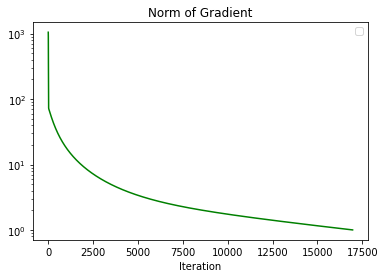

Weights: [-6.96574399e+00  3.16471625e-01  5.24800808e-04 -1.17176942e+00
 -1.32514276e+00 -2.21194252e-01 -1.32218661e+00  3.45165589e-01
  3.16423382e-01 -4.88231078e-01  5.18547787e-01  7.97838378e+00
 -1.16569527e+00  6.43809714e-01  8.24949181e+00 -7.04279260e-01
  9.85013687e-02 -1.07463082e-01  3.92235837e-01  2.62777812e-01
 -4.65947239e-01]
Gradient: [ 0.90367599 -0.1202861  -0.07781895 -0.05660552 -0.04988028 -0.09870621
 -0.05515672 -0.10528888 -0.09224218 -0.08449563 -0.07657524 -0.15383476
  0.01424583 -0.14239177 -0.13168937 -0.06988727 -0.1189111  -0.03867427
 -0.09030326 -0.08361338 -0.12057914]
Iterations: 16960
Time taken: 13.301456212997437
Lambda:  0.0001768632655321741


In [31]:
current = time.time()
LAMB = 1/np.max( np.linalg.svd( xTrain @ xTrain.T )[1] )
w_list = []
gr = []
count = 1
x = xTrain
y = yTrain
w = weights
while np.linalg.norm(log_gradient(w, x, y)) > 1:
    w1 = GD(w, x , y , LAMB, log_gradient)
    w = w1
    w_list.append(cost_func(w,x,y))
    gr.append(np.linalg.norm(log_gradient(w, x, y)))
    count += 1
#     print('norm: ', np.linalg.norm(log_gradient(w, x, y)))
#     print('weights: ', log_gradient(w, x, y))
    
print('----------------------')
plt.plot(range(len(gr)), gr, c='g')
plt.title(label = 'Norm of Gradient')
plt.yscale('log')
plt.xlabel('Iteration')
plt.legend(loc='best')
plt.show()
print('Weights:', w)
print('Gradient:', log_gradient(w, x, y) )
print('Iterations:', count)
print('Time taken:', time.time() - current)
print('Lambda: ', LAMB)

Trying error > 1e-2

No handles with labels found to put in legend.


----------------------


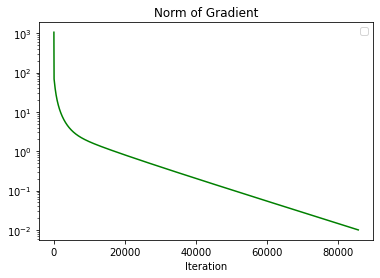

Weights: [-9.25575091e+00  6.05757683e-01  1.84604984e-01 -9.85186443e-01
 -1.17513492e+00  3.24251637e-02 -1.14856802e+00  6.05630026e-01
  5.44423926e-01 -2.72017536e-01  6.97445441e-01  8.35280547e+00
 -1.20549981e+00  9.73707293e-01  8.56756349e+00 -5.33395478e-01
  4.14567618e-01 -8.34878939e-03  6.10499671e-01  4.82006345e-01
 -1.55342351e-01]
Gradient: [ 0.00904634 -0.00112217 -0.00069364 -0.00074706 -0.00058829 -0.00099316
 -0.00068166 -0.00102527 -0.00089581 -0.00083371 -0.00067439 -0.00158911
  0.00017543 -0.00125006 -0.00137137 -0.00063709 -0.00125698 -0.00038411
 -0.00085997 -0.00087742 -0.00118887]
Iterations: 85672
Time taken: 59.41498374938965


NameError: name 'lamb' is not defined

In [42]:
current = time.time()
LAMB = 1/np.max( np.linalg.svd( xTrain @ xTrain.T )[1] )
w_list = []
gr = []
count = 1
x = xTrain
y = yTrain
w = weights
while np.linalg.norm(log_gradient(w, x, y)) > 1e-2:
    w1 = GD(w, x , y , LAMB, log_gradient)
    w = w1
    w_list.append(cost_func(w,x,y))
    gr.append(np.linalg.norm(log_gradient(w, x, y)))
    count += 1
#     print('norm: ', np.linalg.norm(log_gradient(w, x, y)))
#     print('weights: ', log_gradient(w, x, y))
    
print('----------------------')
plt.plot(range(len(gr)), gr, c='g')
plt.title(label = 'Norm of Gradient')
plt.yscale('log')
plt.xlabel('Iteration')
plt.legend(loc='best')
plt.show()
print('Weights:', w)
print('Gradient:', log_gradient(w, x, y) )
print('Iterations:', count)
print('Time taken:', time.time() - current)
print('Lambda: ', lamb)

In [13]:
G.norm

125.26096261088598

## Adaptive

For error > 1

No handles with labels found to put in legend.


----------------------


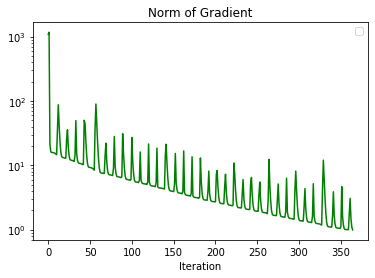

Weights: [-7.35745186  0.41058757  0.03139584 -1.26221817 -1.38527644 -0.20800681
 -1.41025499  0.40707485  0.38366746 -0.50018827  0.55373815  8.24752267
 -1.17012946  0.74771642  8.51544925 -0.71314565  0.07988181 -0.10844697
  0.45185529  0.28060545 -0.472124  ]
Gradient: [ 0.97068364  0.04522481  0.02584233 -0.09112556 -0.04352515 -0.02922601
 -0.08282675  0.0390332   0.09389907 -0.0497988   0.0125459   0.3191769
  0.14361448  0.03093903  0.34938095 -0.03957755 -0.08490219  0.04349468
  0.04502203  0.01410215 -0.08443532]
Iterations: 366
Time taken: 0.890733003616333
Lambda:  0.0001768632655321741


In [33]:
current = time.time()
lam = random.random()
theta = 10e4
w_list = []
gr = []
Lambd = [lam]
count = 1
x = xTrain
y = yTrain
w = weights

w1 = GD(w, x , y , lam, log_gradient)

while np.linalg.norm( log_gradient(w1,x,y) ) > 1:
    lam_prev = lam
    min1 = np.sqrt(1 + theta)*lam
    min2 = np.linalg.norm(w1 - w) / ( 2*np.linalg.norm( log_gradient(w1,x,y) - log_gradient(w,x,y) ) )
#     print('min1:', min1)
#     print('min2:', min2)
    lam = np.min([min1, min2])
#     print('lambda: ',lam)
    Lambd.append(lam)
    temp = w1
    w1 = GD(w1, x , y , lam, log_gradient)
#     print('x1:', x1)
    w = temp
#     print('x:', x)
    theta = (lam/lam_prev)
#     print('theta:', theta)
    count += 1
    grad = np.linalg.norm(log_gradient(w1,x,y))
#     print('Gradient Norm:', grad)
    gr.append(grad)
print('----------------------')
plt.plot(range(len(gr)), gr, c='g')
plt.title(label = 'Norm of Gradient')
plt.yscale('log')
plt.xlabel('Iteration')
plt.legend(loc='best')
plt.show()
print('Weights:', w)
print('Gradient:', log_gradient(w, x, y) )
print('Iterations:', count)
print('Time taken:', time.time() - current)
print('Lambda: ', LAMB)

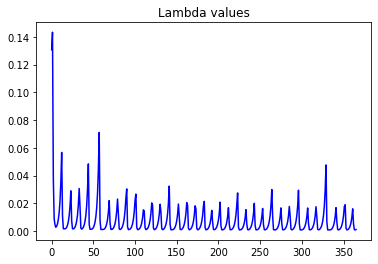

In [37]:
plt.plot(range(len(Lambd)), Lambd, c= 'b')
plt.title(label = 'Lambda values')
plt.show()

For error > 1e-6

<ipython-input-2-60c9c5db4231>:2: RuntimeWarning: overflow encountered in exp
  def sigmoid(beta, X): return 1.0/(1 + np.exp(-np.dot(X, beta)))
No handles with labels found to put in legend.


----------------------


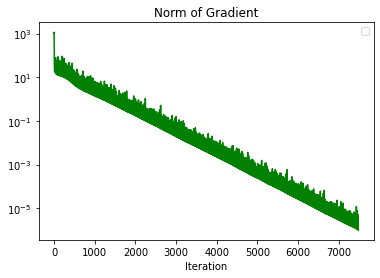

Weights: [-9.28020094e+00  6.08790802e-01  1.86479155e-01 -9.83169840e-01
 -1.17354663e+00  3.51089590e-02 -1.14672822e+00  6.08401289e-01
  5.46845187e-01 -2.69765088e-01  6.99267726e-01  8.35710608e+00
 -1.20597453e+00  9.77085663e-01  8.57127584e+00 -5.31674744e-01
  4.17964474e-01 -7.31101415e-03  6.12824576e-01  4.84377759e-01
 -1.52131006e-01]
Gradient: [-8.30011330e-07  1.44761987e-07  1.06848407e-07  1.10417197e-07
  9.83434347e-08  1.36268588e-07  1.06840840e-07  1.40896191e-07
  1.32272985e-07  1.22314455e-07  9.81800854e-08  2.01305314e-07
  2.57866239e-08  1.61297209e-07  1.80105725e-07  9.70818376e-08
  1.68603250e-07  7.46933926e-08  1.21572410e-07  1.27571891e-07
  1.57044133e-07]
Iterations: 7490
Time taken: 7.276010274887085
Lambda:  0.0001768632655321741


In [38]:
current = time.time()
lam = random.random()
theta = 10e4
w_list = []
gr = []
Lambd = [lam]
count = 1
x = xTrain
y = yTrain
w = weights

w1 = GD(w, x , y , lam, log_gradient)

while np.linalg.norm( log_gradient(w1,x,y) ) > 1e-6:
    lam_prev = lam
    min1 = np.sqrt(1 + theta)*lam
    min2 = np.linalg.norm(w1 - w) / ( 2*np.linalg.norm( log_gradient(w1,x,y) - log_gradient(w,x,y) ) )
#     print('min1:', min1)
#     print('min2:', min2)
    lam = np.min([min1, min2])
#     print('lambda: ',lam)
    Lambd.append(lam)
    temp = w1
    w1 = GD(w1, x , y , lam, log_gradient)
#     print('x1:', x1)
    w = temp
#     print('x:', x)
    theta = (lam/lam_prev)
#     print('theta:', theta)
    count += 1
    grad = np.linalg.norm(log_gradient(w1,x,y))
#     print('Gradient Norm:', grad)
    gr.append(grad)
print('----------------------')
plt.plot(range(len(gr)), gr, c='g')
plt.title(label = 'Norm of Gradient')
plt.yscale('log')
plt.xlabel('Iteration')
plt.legend(loc='best')
plt.show()
print('Weights:', w)
print('Gradient:', log_gradient(w, x, y) )
print('Iterations:', count)
print('Time taken:', time.time() - current)
print('Lambda: ', LAMB)

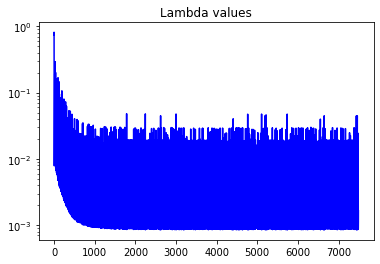

In [40]:
plt.plot(range(len(Lambd)), Lambd, c= 'b')
plt.title(label = 'Lambda values')
plt.yscale('log')
plt.show()

In [ ]:
aaa = [0]*10
bbb = [0]*10
ccc = [0]*10
for i in range(10):
    aaa[i] = A[i][0]
    bbb[i] = A[i][1]
    ccc[i] = 2*A[i][0] + 5
plt.scatter(aaa, bbb, label = 'A')
plt.scatter(aaa, b, c = 'r', label = 'b')
plt.scatter(x[0], x[1], c = 'g', label = 'x')
plt.plot(aaa, ccc, 'y')
plt.legend(loc = 'best')
plt.show

In [ ]:
def f(X, a=A,B=b):
    return 0.5*np.linalg.norm(np.matmul(a,x)-B)**2

def f_grad(X,a=A, B=b):
    return np.matmul(np.array(A).transpose(),(np.matmul(a,X)-B))

def GD(x, lamb, gradient_function):
    x1 = x - lamb*gradient_function(x)
    return x1

In [ ]:
class logregGD:
    def __init__(self, error):
        self.x_original = None
        self.y_original = None
        self.a_original = None
        self.b_original = None
        self.x = None
        self.y = None
        self.a = None
        self.b = None
        
        self.initialTime = None
        self.error = error
        self.grad = None
        self.lam = None
        self.gr = None
        self.theta = None
        
        self.vanPlt = None
        self.AdapPlt = None
        self.LSPlt = None
        self.BazPlt = None
        self.Max = 0
    
    def generate(self, function, dim, vec_len, scale):
        for i in range(dim):
            globals()['X'+str(i)] = [0]*vec_len
        for j in range(vec_len):
            globals()['X'+str(0)][j] = (random.random()+1e-12)*scale
            f = function(globals()['X'+str(0)][j])
            noiz = 3
            for k in range(dim):
                globals()['X'+str(k)][j] = f + np.random.normal(0,noiz)
                noiz += 3
        A = np.array([globals()['X'+str(i)] for i in range(dim)]).T
        self.a_original = A
        self.x_original = np.random.rand(len(A[0]))*scale
        y = [0]*len(A[0])
        for i in range(len(A[0])):
            if self.x_original[i] >= np.mean(self.x_original):
                y[i] = 1
            else:
                y[i] = 0
        self.y_original = y                
        self.b_original = A @ self.x_original + np.random.normal(0,3,(A @ self.x_original).shape)
#     def LinRegFunc(self, X):
#         return 0.5 * np.linalg.norm(self.a @ X - self.b)**2
#     def LinRegGrad(self, X):
#         return self.a.T @ (self.a @ X - self.b)
    def 
    
    def Step(self):
        self.x = self.x - self.lam*self.grad
    def BackTrack(self, alpha):
        rho = random.random()+1e-12
        c = random.random()+1e-12
        while self.LinRegFunc(self.x - alpha*self.grad) > self.LinRegFunc(self.x) \
                - c*alpha*np.linalg.norm(self.grad)**2:
                alpha = rho*alpha
        self.lam = alpha
    
    def Vanilla(self):
        self.initialTime = time.time()
        self.x = deepcopy(self.x_original)
        self.a = deepcopy(self.a_original)
        self.b = deepcopy(self.b_original)
        self.gr = []
        L = np.max( np.linalg.svd( self.a @ self.a.T ) [1] )
        self.lam = 1/L
        self.grad = self.LinRegGrad(self.x)
        while np.linalg.norm(self.grad) > self.error:
            self.Step()
            self.grad = self.LinRegGrad(self.x)
            self.gr.append(np.linalg.norm(self.grad))
        print(' \n Vanilla Gradient Descent:')
        print('_____________________________________________')
        if len(self.gr) > self.Max:
            self.Max = deepcopy(len(self.gr))
        self.SetPlots(0, len(self.gr) , 'g', self.vanPlt, 'Vanilla')
        self.PrintResults()
    
    def Adaptive(self):
        self.initialTime = time.time()
        self.x = deepcopy(self.x_original)
        self.a = deepcopy(self.a_original)
        self.b = deepcopy(self.b_original)
        self.gr = []
        self.lam = random.random()+1e-12
        self.theta = float(random.getrandbits(128))
        oldX = deepcopy(self.x)
        self.grad = self.LinRegGrad(self.x)
        self.Step()
        while np.linalg.norm(self.grad) > self.error:
            oldLam = deepcopy(self.lam)
            min1 = np.sqrt(1 + self.theta)*self.lam
            min2 = ( np.linalg.norm( self.x - oldX ) ) \
                / ( 2 * np.linalg.norm( self.LinRegGrad(self.x) - self.LinRegGrad(oldX) ) )
            self.lam = np.min([min1,min2])
            oldX = deepcopy(self.x)
            self.Step()
            self.theta = self.lam/oldLam
            self.grad = self.LinRegGrad(self.x)
            self.gr.append(np.linalg.norm(self.grad))
        print('\n Adaptive Gradient Descent:')
        print('_____________________________________________')
        if len(self.gr) > self.Max:
            self.Max = deepcopy(len(self.gr))
        self.SetPlots(0, len(self.gr) , 'y', self.AdapPlt, 'Adaptive')
        self.PrintResults()D:\Projects\Intern Roster\2021_v2.2.jl
    
    def LineSearch(self):
        self.initialTime = time.time()
        self.x = deepcopy(self.x_original)
        self.a = deepcopy(self.a_original)
        self.b = deepcopy(self.b_original)
        self.gr = []
        self.grad = self.LinRegGrad(self.x)
        alpha = float(random.getrandbits(8))
        self.BackTrack(alpha)
        k = 1000
        while np.linalg.norm(self.grad) > self.error:
            self.Step()
            self.grad =  self.LinRegGrad(self.x)
            self.gr.append(np.linalg.norm(self.grad))
#             alpha = float(random.getrandbits(8))
#             self.BackTrack(alpha)
            self.BackTrack(self.lam*2)
#             if len(self.gr) == k:
#                 self.SetPlots(k - 1000, len(self.gr), 'b', self.LSPlt, 'LineSearch')
#                 k += 1000
#             if len(self.gr) > 10:
#                 if self.gr[-1] == self.gr[-2]:
#                     print(len(self.gr))
#                     print(self.gr[-1])
        print('\n Line Search Gradient Descent:')
        print('_____________________________________________')
        if len(self.gr) > self.Max:
            self.Max = deepcopy(len(self.gr))
        self.SetPlots(0, len(self.gr) , 'b', self.LSPlt, 'LineSearch')
        self.PrintResults()
    
    def Barzilai(self):
        self.initialTime = time.time()
        self.x = deepcopy(self.x_original)
        self.a = deepcopy(self.a_original)
        self.b = deepcopy(self.b_original)
        self.gr = []
        self.grad = self.LinRegGrad(self.x)
        self.lam = random.random()+1e-12
        oldX = deepcopy(self.x)
        self.Step()
        while np.linalg.norm(self.grad) > self.error:
            oldLam = deepcopy(self.lam)
            self.lam = np.dot( self.x - oldX, self.LinRegGrad(self.x) - self.LinRegGrad(oldX) ) \
                        / np.linalg.norm(self.LinRegGrad(self.x) - self.LinRegGrad(oldX))**2
            oldX = deepcopy(self.x)
            self.Step()
            self.grad = self.LinRegGrad(self.x)
            self.gr.append(np.linalg.norm(self.grad))
        print('\n Barzilai-Borwein Gradient Descent:')
        print('_____________________________________________')
        if len(self.gr) > self.Max:
            self.Max = deepcopy(len(self.gr))
        self.SetPlots(0, len(self.gr) , 'r', self.BazPlt, 'Barzilai')
        self.PrintResults()
    
    def SetPlots(self, Min, Max, colour, name, label):
        name = plt.plot( range( Min, Max ) , self.gr[Min:Max] , c = colour , label = label)
    def PrintPlots(self):
        self.vanPlt
        self.AdapPlt
        self.LSPlt
        self.BazPlt
        plt.yscale('log')
        plt.xlabel('Iteration')
        plt.legend(loc='best')
        plt.title(label = 'Norm of Gradient in domain [{}, {}]'.format(0,self.Max) )
        plt.show()
    def PrintResults(self):
        print('At final iteration k =', len(self.gr), ':')
        print('x vector is:', self.x)
        print('Gradient Norm is:', np.linalg.norm(self.grad))
        print('Time taken:', time.time() - self.initialTime)
        print('Final Lambda value: ', self.lam)

In [ ]:
def sigmoid(t):
    if t < -700:
        return 0
    else:
        return (1 + np.e**(-t))**(-1)

In [ ]:
G = logregGD(1e-3)
G.generate(sigmoid,10,100, 1)
# G.Vanilla()
# G.LineSearch()
# G.Adaptive()
# G.Barzilai()
# G.PrintPlots()

In [ ]:
(G.a_original)

Backup

In [4]:
# Adapted from https://www.geeksforgeeks.org/understanding-logistic-regression/ 
def sigmoid(beta, X): return 1.0/(1 + np.exp(-np.dot(X, beta))) 

In [5]:
def normalise(X): 
    mins = np.min(X, axis = 0) 
    maxs = np.max(X, axis = 0) 
    rng = maxs - mins 
    norm_X = 1 - ((maxs - X)/rng) 
    return norm_X 

In [6]:
sample_data = ds(n_samples=1000)
augmented_data = np.concatenate((np.array([[1]*len(sample_data[0])]).T,normalise(sample_data[0])), axis =1)
entire_set = list(sample_data)
entire_set[0] = augmented_data
xTrain, xTest, yTrain, yTest = split(entire_set[0], entire_set[1], test_size = 0.1, random_state= 13)
weights = np.random.rand(len(xTrain[0]),1)

In [7]:
def cost_func(w, X, y): 
    sig = sigmoid(w, X) 
    y = np.squeeze(y) 
    step1 = y * np.log(sig) 
    step2 = (1 - y) * np.log(1 - sig) 
    final = -step1 - step2 
    return np.mean(final) 

In [8]:
cost_func(weights, xTrain, yTrain)

2.3704004336242517

In [78]:
def log_gradient(w, X, y):
    sig = sigmoid(w, X)
    inner_expr = np.squeeze(sig) - np.squeeze(y.reshape(X.shape[0],-1))
    return np.dot(inner_expr.T, X)

In [41]:
len(xTrain[0])

21

In [77]:
np.dot(np.squeeze(sigmoid(weights, xTrain)) - np.squeeze(yTrain.reshape(xTrain.shape[0],-1)), xTrain)

array([442.27933206, 236.01709427, 248.63716186, 214.48273504,
       208.14294535, 220.55039321, 251.97958863, 191.03446622,
       214.11305482, 219.00927582, 199.41458244, 200.41171925,
       196.55793629, 209.53051613, 209.81251252, 224.07558207,
       229.7430419 , 322.34100171, 171.71999343, 122.88571779,
       214.34447969])

In [48]:
log_gradient(weights, xTrain, yTrain)

array([442.27933206, 236.01709427, 248.63716186, 214.48273504,
       208.14294535, 220.55039321, 251.97958863, 191.03446622,
       214.11305482, 219.00927582, 199.41458244, 200.41171925,
       196.55793629, 209.53051613, 209.81251252, 224.07558207,
       229.7430419 , 322.34100171, 171.71999343, 122.88571779,
       214.34447969])

In [47]:
weights

array([[0.13624484],
       [0.02577269],
       [0.52022405],
       [0.40528379],
       [0.70045732],
       [0.40699504],
       [0.15214619],
       [0.93313221],
       [0.62913832],
       [0.51998177],
       [0.04019056],
       [0.26462292],
       [0.77185755],
       [0.80016782],
       [0.70412173],
       [0.63556158],
       [0.69815821],
       [0.01946515],
       [0.69640907],
       [0.084001  ],
       [0.26177002]])

In [79]:
def GD(w, x, y, lamb, gradient_function):
    w1 = np.squeeze(w) - lamb*gradient_function(w, x, y)  # we need to add the new params
    return w1

In [80]:
noone = GD(weights, xTrain, yTrain, 0.1, log_gradient)

In [64]:
np.squeeze(weights)

array([0.13624484, 0.02577269, 0.52022405, 0.40528379, 0.70045732,
       0.40699504, 0.15214619, 0.93313221, 0.62913832, 0.51998177,
       0.04019056, 0.26462292, 0.77185755, 0.80016782, 0.70412173,
       0.63556158, 0.69815821, 0.01946515, 0.69640907, 0.084001  ,
       0.26177002])

In [58]:
noone

array([-44.09168837, -23.57593673, -24.34349214, -21.04298972,
       -20.11383721, -21.64804428, -25.04581267, -18.17031441,
       -20.78216717, -21.38094582, -19.90126768, -19.776549  ,
       -18.88393607, -20.15288379, -20.27712952, -21.77199663,
       -22.27614598, -32.21463502, -16.47559028, -12.20457078,
       -21.17267795])

In [59]:
np.squeeze(noone)

array([-44.09168837, -23.57593673, -24.34349214, -21.04298972,
       -20.11383721, -21.64804428, -25.04581267, -18.17031441,
       -20.78216717, -21.38094582, -19.90126768, -19.776549  ,
       -18.88393607, -20.15288379, -20.27712952, -21.77199663,
       -22.27614598, -32.21463502, -16.47559028, -12.20457078,
       -21.17267795])

In [70]:
noone

array([-44.09168837, -23.57593673, -24.34349214, -21.04298972,
       -20.11383721, -21.64804428, -25.04581267, -18.17031441,
       -20.78216717, -21.38094582, -19.90126768, -19.776549  ,
       -18.88393607, -20.15288379, -20.27712952, -21.77199663,
       -22.27614598, -32.21463502, -16.47559028, -12.20457078,
       -21.17267795])

In [69]:
weights

array([[0.13624484],
       [0.02577269],
       [0.52022405],
       [0.40528379],
       [0.70045732],
       [0.40699504],
       [0.15214619],
       [0.93313221],
       [0.62913832],
       [0.51998177],
       [0.04019056],
       [0.26462292],
       [0.77185755],
       [0.80016782],
       [0.70412173],
       [0.63556158],
       [0.69815821],
       [0.01946515],
       [0.69640907],
       [0.084001  ],
       [0.26177002]])

In [73]:
len(sigmoid(weights, xTrain))

900

In [76]:
np.squeeze(yTrain.reshape(xTrain.shape[0],-1))

array([0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0,

In [81]:
second = GD(noone, xTrain, yTrain, 0.1, log_gradient)

In [82]:
second

array([  0.80831163,   0.17668633,   1.20894838,   0.57321961,
         1.52917247,   1.04979804,   0.15123272,   1.82633813,
         1.22156175,   0.73456099,   0.68633585,   1.04860831,
         1.27068143,   1.47675714,   1.45213888,   1.55070742,
         0.57013517, -10.58664087,  18.77980279,  16.47951457,
         0.51428719])

In [62]:
np.squeeze(second)

array([[ 0.80831163,  0.17668633,  1.20894838, ..., 18.77980279,
        16.47951457,  0.51428719],
       [ 0.80831163,  0.17668633,  1.20894838, ..., 18.77980279,
        16.47951457,  0.51428719],
       [ 0.80831163,  0.17668633,  1.20894838, ..., 18.77980279,
        16.47951457,  0.51428719],
       ...,
       [ 0.80831163,  0.17668633,  1.20894838, ..., 18.77980279,
        16.47951457,  0.51428719],
       [ 0.80831163,  0.17668633,  1.20894838, ..., 18.77980279,
        16.47951457,  0.51428719],
       [ 0.80831163,  0.17668633,  1.20894838, ..., 18.77980279,
        16.47951457,  0.51428719]])

In [83]:
third = GD(second, xTrain, yTrain, 0.1, log_gradient)

In [84]:
third

array([-44.10167101, -23.7810103 , -24.04192714, -21.19303316,
       -19.61674832, -21.35542886, -25.42912983, -17.56050006,
       -20.51102064, -21.49228931, -19.57600183, -19.31748415,
       -18.67083125, -19.78468086, -19.8393842 , -21.20366612,
       -22.74153835, -43.21362207,   1.14989342,   3.83477687,
       -21.23124283])